In [24]:
import nltk
import re
import pandas as pd
import numpy as np
import seaborn as sns


import matplotlib.pyplot as plt            # library for visualization
import matplotlib
from collections import Counter
import string
import csv
import pyarabic.araby 
import pyarabic.number as number
import tashaphyne

from textblob import TextBlob
from nltk.probability import FreqDist
import warnings
warnings.filterwarnings('ignore')

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

In [3]:
df = pd.read_csv("feedback.csv")
df.head()

,AcademicYear,SemesterName,ParticipantID,DegreeLevel,Gender,Nationality,StudentProgram,CourseCode,CourseName,QuestionText,QuestionType,ParticipantResponse
0,2021,Fall 2021 - 2022,7040336900,Bachelor,Female,Palestine,Bachelor of Business Administration,ACC 100,Principles of Accounting,CLO : Evaluate financial and managerial accoun...,Rating,Disagree
1,2021,Fall 2021 - 2022,6707335167,Bachelor,Male,United Arab Emirates,Bachelor of Business Administration,ACC 100,Principles of Accounting,The coursework and assignments are challenging,Rating,Strongly Disagree
2,2021,Fall 2021 - 2022,6707335167,Bachelor,Male,United Arab Emirates,Bachelor of Business Administration,ACC 100,Principles of Accounting,The course is relevant to my program of study,Rating,Strongly Disagree
3,2021,Fall 2021 - 2022,6707335167,Bachelor,Male,United Arab Emirates,Bachelor of Business Administration,ACC 100,Principles of Accounting,Course learning materials are available on the...,Rating,Strongly Disagree
4,2021,Fall 2021 - 2022,6707335167,Bachelor,Male,United Arab Emirates,Bachelor of Business Administration,ACC 100,Principles of Accounting,The faculty uses additional resources (other t...,Rating,Strongly Disagree


In [4]:

QuestionType = df['QuestionType'].values.tolist()
print(Counter(QuestionType))


Counter({'Rating': 163625, 'User Comment': 17344})


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180969 entries, 0 to 180968
Data columns (total 12 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   AcademicYear         180969 non-null  int64 
 1   SemesterName         180969 non-null  object
 2   ParticipantID        180969 non-null  int64 
 3   DegreeLevel          180969 non-null  object
 4   Gender               180969 non-null  object
 5   Nationality          180969 non-null  object
 6   StudentProgram       180969 non-null  object
 7   CourseCode           180969 non-null  object
 8   CourseName           180969 non-null  object
 9   QuestionText         180969 non-null  object
 10  QuestionType         180969 non-null  object
 11  ParticipantResponse  168848 non-null  object
dtypes: int64(2), object(10)
memory usage: 16.6+ MB


# Data Preprocessing
Cleaning and preprocessing the data by handling contractions, converting text to lower case removing stop words, punctuations, hashtags, numbers/digits and special characters and then tokenizing and lemmatizing the text.

In [6]:
def preprocess_text(text):
  
    # Convert to lowercase
    text = text.lower()
    
    
    # Remove Clo
    if(text.startswith('clo')):
        text = text[3:]
    

    # Remove URLs, hashtags, mentions, and special characters
    text = re.sub(r"http\S+|www\S+|@\w+|#\w+", "", text)
    text = re.sub(r"[^\w\s]", "", text)

    # Remove numbers/digits
    text = re.sub(r'\b[0-9]+\b\s*', '', text)

    # Remove punctuation
    text = ''.join([char for char in text if char not in string.punctuation])

    # Tokenize the text
    tokens = word_tokenize(text)

    # Remove English stop words
    stop_words = set(stopwords.words('english'))
    tokens = [token for token in tokens if token not in stop_words]
    
    #Remove Arabic stop words
    stop_words = set(stopwords.words('arabic'))
    tokens = [token for token in tokens if token not in stop_words]
    


    # Lemmatize the words
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(token) for token in tokens]
    print(tokens)

    # Join tokens back into a single string
    return ' '.join(tokens)

In [7]:
df['Processed_QuestionText'] = df['QuestionText'].apply(preprocess_text)
df.tail(10)

['evaluate', 'financial', 'managerial', 'accounting', 'internal', 'external', 'perspective']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'financial', 'accounting', 'concept', 'covered', 'ifrs', 'international', 'financial', 'reporting', 'standard', 'role', 'impact', 'organization']
['identify', 'accounting', 'information', 'effective', 'decisionmaking', 'process']
['analyze', 'financial', 'statement', 'make', 'better', 'use', 'accounting', 'information']
['identify', 'accounting', 'information', 'effective', 'decisionmaking', 'process']
['define', 'financial', 'accounting', 'concept', 'covered', 'ifrs', 'international', 'financial', 'reporting', 'standard', 'role', 'impact', 'organization']
['apply', 'necessary', 'step', 'accounting', 'cycle']
['analyze', 'financial', 'statement', 'make', 'better',

['apply', 'necessary', 'step', 'accounting', 'cycle']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'financial', 'accounting', 'concept', 'covered', 'ifrs', 'international', 'financial', 'reporting', 'standard', 'role', 'impact', 'organization']
['identify', 'accounting', 'information', 'effective', 'decisionmaking', 'process']
['apply', 'necessary', 'step', 'accounting', 'cycle']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'financial', 'managerial', 'accounting', 'internal', 'external', 'perspective']
['analyze', 'financial', 'statement', 'make', 'better', 'use', 'a

['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'financial', 'statement', 'make', 'better', 'use', 'accounting', 'information']
['apply', 'necessary', 'step', 'accounting', 'cycle']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['identify', 'accounting', 'information', 'effective', 'decisionmaking', 'process']
['define', 'financial', 'accounting', 'concept', 'covered', 'ifrs', 'international', 'financial', 'reporting', 'standard', 'role', 'impact', 'organization']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['define', 'financial', 'accounting', 'concept', 'covered', 'ifrs', 'international', 'financial', 'reporting', 'standard', 'role', 'impact', 'organization']
['identify', 'accounting', 'information', 'effective', 'decisionmaking', 'process

['analyze', 'financial', 'statement', 'make', 'better', 'use', 'accounting', 'information']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['evaluate', 'financial', 'managerial', 'accounting', 'internal', 'external', 'perspective']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'necessary', 'step', 'accounting', 'cycle']
['define', 'financial', 'accounting', 'concept', 'covered', 'ifrs', 'international', 'financial', 'reporting', 'standard', 'role', 'impact', 'organization']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['identify', 'accounting', 'information', 'effective', 'decisionmaking', 'process']
['define', 'financial', 'accounting', 'concept', 'covered', 'ifrs', 'international', 'financial', 'reporting', 'standard', 'role', 'impact', 'organization']
['facult

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'financial', 'accounting', 'concept', 'covered', 'ifrs', 'international', 'financial', 'reporting', 'standard', 'role', 'impact', 'organization']
['apply', 'necessary', 'step', 'accounting', 'cycle']
['identify', 'accounting', 'information', 'effective', 'decisionmaking', 'process']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['define', 'financial', 'accounting', 'concept', 'covered', 'ifrs', 'international', 'financial', 'reporting', 'standard', 'role', 'impact', 'organization']
['identify', 'accounting', 'information', 'effective', 'decisionmaking', 'process']
['apply', 'necessary', 'step', 'accounting', 'cycle']
['facu

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['define', 'financial', 'accounting', 'concept', 'covered', 'ifrs', 'international', 'financial', 'reporting', 'standard', 'role', 'impact', 'organization']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'financial', 'statement', 'make', 'better', 'use', 'accounting', 'information']
['evaluate', 'financial', 'managerial', 'accounting', 'internal', 'external', 'perspective']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'financial', 'managerial', 'accounting', 'internal', 'external', 'perspective']
['analyze', 'financial', 'statement', 'make', 'b

['define', 'financial', 'accounting', 'concept', 'covered', 'ifrs', 'international', 'financial', 'reporting', 'standard', 'role', 'impact', 'organization']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'financial', 'managerial', 'accounting', 'internal', 'external', 'perspective']
['identify', 'accounting', 'inf

['evaluate', 'financial', 'managerial', 'accounting', 'internal', 'external', 'perspective']
['evaluate', 'financial', 'managerial', 'accounting', 'internal', 'external', 'perspective']
['analyze', 'financial', 'statement', 'make', 'better', 'use', 'accounting', 'information']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'necessary', 'step', 'accounting', 'cycle']
['identify', 'accounting', 'information', 'effective', 'decisionmaking', 'process']
['define', 'financial', 'accounting', 'concept', 'covered', 'ifrs', 'international', 'financial', 'reporting', 'standard', 'role', 'impact', 'organization']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', '

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['analyze', 'financial', 'statement', 'make', 'better', 'use', 'accounting', 'information']
['apply', 'necessary', 'step', 'accounting', 'cycle']
['identify', 'accounting', 'information', 'effective', 'decisionmaking', 'process']
['define', 'financial', 'accounting', 'concept', 'covered', 'ifrs', 'international', 'financial', 'reporting', 'standard', 'role', 'impact', 'organization']
['evaluate', 'financial', 'managerial', 'accounting', 'internal', 'external', 'perspective']
['analyze', 'financial', 'statement', 'make', 'better', 'use', 'accounting', 'information']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'financial', 'account

['analyze', 'financial', 'statement', 'make', 'better', 'use', 'accounting', 'information']
['analyze', 'financial', 'statement', 'make', 'better', 'use', 'accounting', 'information']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['identify', 'accounting', 'information', 'effective', 'decisionmaking', 'process']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['evaluate', 'financial', 'managerial', 'accounting', 'internal', 'external', 'perspective']
['appl

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['identify', 'accounting', 'information', 'effective', 'decisionmaking', 'process']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['analyze', 'financial', 'statement', 'make', 'better', 'use', 'accounting', 'information']
['evaluate', 'financial', 'managerial', 'accounting', 'internal', 'external', 'perspective']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'management', 'accounting', 'concept', 'procedure', 'planning', 'control', 'decisionmaking']
['explain', 'interpersonal', 'skill', 'analyze', 'control', 'operation']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'management', 'accounting', 'concept', 'procedure', 'planning', 'control', 'decisionmaking']
['explain', 'interpersonal', 'skill', 'analyze', 'control', 'operation']
['describe', 'management', 'accounting', 'concept', 'procedure', 'planning', 'control', 'decisionmaking']
['apply', 'appropriate', 'quantitative', 'qualitative', 'tool', 'practical', 'alte

['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'management', 'accounting', 'concept', 'procedure', 'planning', 'control', 'decisionmaking']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'appropriate', 'quantitative', 'qualitative', 'tool', 'practical', 'alternative']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'performance', 'manager', 'subunit', 'organ

['apply', 'appropriate', 'quantitative', 'qualitative', 'tool', 'practical', 'alternative']
['explain', 'interpersonal', 'skill', 'analyze', 'control', 'operation']
['describe', 'management', 'accounting', 'concept', 'procedure', 'planning', 'control', 'decisionmaking']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'appropriate', 'quantitative', 'qualitative', 'tool', 'practical', 'alternative']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['evaluate', 'performance', 'manager', 'subunit', 'organization']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'performance', 'manager', 'subunit', 'organization']
['apply', 'appropriate', 'quantitative', 'qualitative', 'tool', 'practical', 'alternative']
['coursework', 'assignment', 'challenging']
['coursework', 'assig

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'management', 'accounting', 'concept', 'procedure', 'planning', 'control', 'decisionmaking']
['explain', 'interpersonal', 'skill', 'analyze', 'control', 'operation']
['apply', 'appropriate', 'quantitative', 'qualitative', 'tool', 'practical', 'alternative']
['evaluate', 'performance', 'manager', 'subunit', 'organization']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'performance', 'manager', 'subunit', 'organization']
['apply', 'ap

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'management', 'accounting', 'concept', 'procedure', 'planning', 'control', 'decisionmaking']
['explain', 'interpersonal', 'skill', 'analyze', 'control', 'operation']
['apply', 'appropriate', 'quantitative', 'qualitative', 'tool', 'practical', 'alternative']
['evaluate', 'performance', 'manager', 'subunit', 'organization']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 

['apply', 'appropriate', 'quantitative', 'qualitative', 'tool', 'practical', 'alternative']
['evaluate', 'performance', 'manager', 'subunit', 'organization']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'performance', 'manager', 'subunit', 'organization']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['explain', 'interpersonal', 'skill', 'analyze', 'control', 'operation']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'management', 'accounting', 'concept', 'procedure', 'planning', 'control', 'decisionmaking']
['explain', 'interpersonal', 'skill', 'analyze', 'control', 'operation']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['evaluate', 'performance', 'manager', 'subunit', 'organization']
['apply', 'appropriate', 'quantitative', 'qualitative', 'tool', 'practical', 'alternative']
['facult

['course', 'learning', 'material', 'available', 'portal']
['evaluate', 'performance', 'manager', 'subunit', 'organization']
['course', 'learning', 'material', 'available', 'portal']
['identify', 'necessary', 'financial', 'statement', 'corporation']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'use', 'variety', 'accounting', 'method', 'principle', 'disclosure', 'impact', 'financial', 'reporting']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['identify', 'necessary', 'financial', 'statement', 'corporation']
['identify', 'necessary', 'financial', 'statement', 'corporation']
['describe', 'use', 'variety', 'accounting', 'method', 'principle', 'disclosure', 'impact', 'financial', 'reporting']
['apply', 'appropriate', 'accounting', 'mechanism', 'reporting', 'requirement', 'major', 'category', 'asset', 'liability']
['faculty', 'us', 'additional', 'resource', 'text

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'financial', 'accounting', 'issue']
['evaluate', 'financial', 'accounting', 'issue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'appropriate', 'accounting', 'mechanism', 'reporting', 'requirement', 'major', 'category', 'asset', 'liability']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['analyze', 'financial', 'status', 'corporation', 'better', 'competitive', 'position']
['evaluate', 'financial', 'accounting', 'issue']
[

['define', 'ifrs', 'established', 'adopted']
['analyze', 'appropriate', 'accounting', 'mechanism', 'reporting', 'requirement', 'major', 'category', 'shareholder', 'equity']
['apply', 'quantitative', 'skill', 'analysis', 'solve', 'accounting', 'problem']
['formulate', 'disclosure', 'reporting', 'requirement', 'major', 'item', 'account']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['formulate', 'disclosure', 'reporting', 'requirement', 'major', 'item', 'account']
['apply', 'quantitative', 'skill', 'analysis', 'solve', 'accounting', 'problem']
['analyze', 'appropriate', 'accounting', 'mechanism', 'reporting', 'requirement', 'major', 'category', 'shareholder', 'equity']
['define', 'ifrs', 'established', 'adopted']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'port

['distinguish', 'costing', 'system', 'appropriate', 'strategic', 'application']
['prepare', 'accounting', 'information', 'estimation', 'planning', 'control']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['prepare', 'accounting', 'information', 'estimation', 'planning', 'control']
['distinguish', 'costing', 'system', 'appropriate', 'strategic', 'application']
['apply', 'processing', 'financial', 'transaction', 'data', 'cost', 'accounting', 'data']
['define', 'cost', 'accounting', 'concept', 'procedure', 'technique']
['apply', 'processing', 'financial', 'transaction', 'data', 'cost', 'accounting', 'data']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course',

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'cost', 'accounting', 'concept', 'procedure', 'technique']
['apply', 'processing', 'financial', 'transaction', 'data', 'cost', 'accounting', 'data']
['distinguish', 'costing', 'system', 'appropriate', 'strategic', 'application']
['prepare', 'accounting', 'information', 'estimation', 'planning', 'control']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'cost', 'accounting', 'concept', 'procedure', 'technique']
['apply', 'processing', 'financial', 'transaction', 'data', 'cost', 'accounting', 'data']
['distinguish', 'costing', 'system', 'appropriate', 'strategic', 'appli

['analyze', 'security', 'internal', 'control', 'sustainable', 'accounting', 'information', 'system']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['design', 'application', 'relational', 'accounting', 'database']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['identify', 'knowledge', 'system', 'theory', 'development', 'accounting', 'system', 'application']
['recognize', 'opportunity', 'improvement', 'traditional', 'accounting', 'information', 'system', 'business', 'process']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['design', 'application', 'relational', 'accounting', 'database']
['faculty

['apply', 'concept', 'comprehensive', 'profit', 'planning', 'control']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'concept', 'comprehensive', 'profit', 'planning', 'control']
['create', 'budget', 'planning', 'maximum', 'performance']
['analyze', 'result', 'main', 'financial', 'statement', 'strategy', 'increase', 'value', 'business']
['analyze', 'result', 'main', 'financial', 'statement', 'strategy', 'increase', 'value', 'business']
['apply', 'concept', 'comprehensive', 'profit', 'planning', 'control']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['analyze', 'result', 'main', 'fina

['apply', 'concept', 'comprehensive', 'profit', 'planning', 'control']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'result', 'main', 'financial', 'statement', 'strategy', 'increase', 'value', 'business']
['course', 'learning', 'material', 'available', 'portal']
['apply', 'concept', 'comprehensive', 'profit', 'planning', 'control']
['analyze', 'result', 'main', 'financial', 'statement', 'strategy', 'increase', 'value', 'business']
['create', 'budget', 'planning', 'maximum', 'performance']
['evaluate', 'advanced', 'model', 'improve', 'accuracy', 'financial', 'planning', 'capital', 'budgeting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommenda

['collect', 'audit', 'evidence', 'relevant', 'material', 'verification']
['analyze', 'nonconformity']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['evaluate', 'result', 'audit', 'classify', 'one', 'four', 'audit', 'opinion']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'result', 'audit', 'classify', 'one', 'four', 'audit', 'opinion']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['define', 'basic', 'concept', 'rule', 'procedure', 'practice', 'ethic', 'auditing']
['apply', 'necessary', 'step', 'conducting', 'reporting', 'audit']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']

['list', 'different', 'currency', 'financial', 'statement', 'treatment', 'consolidation']
['demonstrate', 'understanding', 'global', 'business', 'accounting', 'concept']
['define', 'accounting', 'partnership', 'concern']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['demonstrate', 'understanding', 'global', 'business', 'accounting', 'concept']
['course', 'relevant', 'program', 'study']
['demonstrate', 'understanding', 'global', 'business', 'accounting', 'concept']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhanc

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'conceptual', 'aspect', 'accounting', 'practice', 'followed', 'multinational', 'firm']
['differentiate', 'among', 'international', 'dimension', 'accounting']
['ass', 'international', 'accounting', 'impact', 'global', 'business', 'environment']
['evaluate', 'different', 'financial', 'reporting', 'disclosure', 'requirement', 'foreign', 'context']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'different', 'financial', 'reporting', 'disclosure', 'requirement', 'foreign', 'context']
['ass', 'international', 'accounting', 'impact', 'global', 'business', 'environment']
['differentiate', 'among', 'international', 'dimension', 'accounting']
['analyze', 'conceptual', 'aspect', 'accounting', 'practice',

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['evaluate', 'practical', 'knowledge', 'budget', 'preparation', 'evaluation', 'management', 'decision', 'making']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['يصيغ', 'أنماط', 'مختلفة', 'الكتابة']
['express', 'thought', 'idea', 'clearly']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['formulate', 'different', 'style', 'writing']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learnin

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يستخدم', 'التعبير', 'الشفوي', 'والإلقاء']
['يصوغ', 'المفردات', 'اللغوية', 'تحاكي', 'أشكالا', 'الكلام', 'العربي', 'الرصين']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['express', 'thought', 'idea', 'clearly']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['formulate', 'different', 'style', 'writing']
['use', 'oral', 'expression', 'declamation']
['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', '

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعبر', 'بشكل', 'واضح', 'وبأسلوب', 'يساعد', 'إظهار', 'الأفكار']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['express', 'thought', 'idea', 'clearly']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['formulate', 'different', 'style', 'writing']
['use', 'oral', 'expression', 'declamation']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'seme

['use', 'oral', 'expression', 'declamation']
['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['formulate', 'different', 'style', 'writing']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعبر', 'بشكل', 'واضح', 'وبأسلوب', 'يساعد', 'إظهار', 'الأفكار']
['يستخدم', 'الأصول', 'العامة', 'للكتابة',

['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['يصيغ', 'أنماط', 'مختلفة', 'الكتابة']
['formulate', 'different', 'style', 'writing']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['يستخدم', 'التعبير', 'الشفوي', 'والإلقاء']
['يصوغ', 'المفردات', 'اللغوية', 'تحاكي', 'أشكالا', 'الكلام', 'العربي', 'الرصين']
['express', 'thought', 'idea', 'clearly']
['express', 'thought', 'idea', 'clearly']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['use', 'oral', 'expression', 'declamation']
['formulate', 'different', 'style', 'writing']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['express', 'thought', 'idea', 'clearly']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['r

['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يصيغ', 'أنماط', 'مختلفة', 'الكتابة']
['يستخدم', 'الأصول', 'العامة', 'للكتابة', 'الوظيفية']
['يعبر', 'بشكل', 'واضح', 'وبأسلوب', 'يساعد', 'إظهار', 'الأفكار']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يصوغ', 'المفردات', 'اللغوية', 'تحاكي', 'أشكالا', 'الكلام', 'العربي', 'الرصين']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['express', 'thought', 'idea', 'clearly']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['formulate', 'different', 'style', 'writing']
['use', 'oral', 'expression', 'declamation']
['formulate', 'linguistic', 'vocabulary', 'si

['express', 'thought', 'idea', 'clearly']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعبر', 'بشكل', 'واضح', 'وبأسلوب', 'يساعد', 'إظهار', 'الأفكار']
['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يستخدم', 'الأصول', 'العامة', 'للكتابة', 'الوظيفية']
['يصيغ', 'أنماط', 'مختلفة', 'الكتابة']
['يستخدم', 'التعبير', 'الشفوي', 'والإلقاء']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['يصيغ', 'أنماط', 'مختلفة', 'الكتابة']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['express', 'thought', 'idea', 'clearly']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['formulate', 'different', 'style', 'writing']
['use', 'oral', 'expression', 'declamation']
['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['formulate', 'different', 'style', 'writing']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['يصوغ', 'المفردات', 'اللغوية', 'تحاكي', 'أشكالا', 'الكلام', 'العربي', 'الرصين']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue'

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['express', 'thought', 'idea', 'clearly']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['express', 'thought', 'idea', 'clearly']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['formulate', 'different', 'style', 'writing']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['express', 'thought', 'idea', 'clearly']
['use', 'ind

['يستخدم', 'التعبير', 'الشفوي', 'والإلقاء']
['يصوغ', 'المفردات', 'اللغوية', 'تحاكي', 'أشكالا', 'الكلام', 'العربي', 'الرصين']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['use', 'oral', 'expression', 'declamation']
['formulate', 'different', 'style', 'writing']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['express', 'thought', 'idea', 'clearly']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learn

['يعبر', 'بشكل', 'واضح', 'وبأسلوب', 'يساعد', 'إظهار', 'الأفكار']
['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يستخدم', 'الأصول', 'العامة', 'للكتابة', 'الوظيفية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يصوغ', 'المفردات', 'اللغوية', 'تحاكي', 'أشكالا', 'الكلام', 'العربي', 'الرصين']
['يستخدم', 'التعبير', 'الشفوي', 'والإلقاء']
['يصيغ', 'أنماط', 'مختلفة', 'الكتابة']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['يصيغ', 'أنماط', 'مختلفة', 'الكتابة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['express', 'thought', 'idea', 'clearly']
['يستخدم', 'الأصول', 'العامة', 'للكتابة', 'الوظيفية']
['

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['يصيغ', 'أنماط', 'مختلفة', 'الكتابة']
['يستخدم', 'التعبير', 'الشفوي', 'والإلقاء']
['يصوغ', 'المفردات', 'اللغوية', 'تحاكي', 'أشكالا', 'الكلام', 'العربي', 'الرصين']
['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['formulate', 'different', 'style', 'writing']
['formulate', 'different', 'style', 'writing']
['use', 'oral', 'expression', 'declamation']
['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['recommendation', 'su

['use', 'oral', 'expression', 'declamation']
['formulate', 'different', 'style', 'writing']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['express', 'thought', 'idea', 'clearly']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['use', 'oral', 'expression', 'declamation']
['formulate', 'different', 'style', 'writing']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'st

['formulate', 'different', 'style', 'writing']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['formulate', 'different', 'style', 'writing']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['express', 'thought', 'idea', 'clearly']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['express', 'thought', 'idea', 'clearly']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', '

['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['use', 'oral', 'expression', 'declamation']
['formulate', 'different', 'style', 'writing']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['use', 'oral', 'expression', 'declamation']
['formulate', 'different', 'style', 'writing']
['express', 'thought', 'idea', 'clearly']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available'

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['use', 'oral', 'expression', 'declamation']
['formulate', 'different', 'style', 'writing']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['formulate', 'different', 'style', 'writing']
['use', 'oral', 'expression', 'declamation']
['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['express', 'thought', 'idea', 'clearly']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'l

['express', 'thought', 'idea', 'clearly']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['use', 'oral', 'expression', 'declamation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['formulate', 'different', 'style', 'writing']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['express', 'thought', 'idea', 'clearly']
['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['use', 'oral', 'expression', 'declamation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يستخدم', 'التعبير', 'الشفوي', 'والإلقاء']
['course', 'learning', 'material', 'available', 'portal']
['formulate', 'different', 'style', 'writing']
['course', 'relevant', 'prog

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['express', 'thought', 'idea', 'clearly']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['express', 'thought', 'idea', 'clearly']
['course', 'learning', 'material', 'available', 'portal']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['formulate', 'different', 'style', 'writing']
['use', 'oral', 'expression', 'declamation']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['expres

['use', 'industryaccepted', 'standard', 'functional', 'writing']
['formulate', 'different', 'style', 'writing']
['use', 'oral', 'expression', 'declamation']
['formulate', 'linguistic', 'vocabulary', 'simulates', 'form', 'solid', 'arabic', 'speech']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['express', 'thought', 'idea', 'clearly']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['express', 'thought', 'idea', 'clearly']
['use', 'industryaccepted', 'standard', 'functional', 'writing']
['faculty', 'us', 'additional', 'resource', 

['organize', 'general', 'principle', 'research', 'writing']
['elicit', 'text', 'writing', 'model']
['summarize', 'basic', 'step', 'analyzing', 'text', 'whether', 'legal', 'administrative', 'medium', 'legal']
['explain', 'multiple', 'model', 'text', 'various', 'field', 'knowledge']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['organize', 'general', 'principle', 'research', 'writing']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['listening', 'comprehension', 'authentic', 'arabic', 'speaker']
['speaking', 'coherently']
['reading', 'simple', 'textbased', 'text']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['communicating', 'confidently', 'arabic']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['writing', 'following', 'basic', 'language']
['reading', 'simple', 'textbased', 'text']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['listening', 'comprehension', 'authentic', 'arabic', 'speaker']
['speaking', 'coherently']
['reading', 'simple', 'textbased', 'text

['listening', 'comprehension', 'authentic', 'arabic', 'speaker']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['speaking', 'coherently']
['reading', 'simple', 'textbased', 'text']
['communicating', 'confidently', 'arabic']
['writing', 'following', 'basic', 'language']
['communicating', 'confidently', 'arabic']
['speaking', 'coherently']
['course', 'learning', 'material', 'available', 'portal']
['listening', 'comprehension', 'authentic', 'arabic', 'speaker']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['listening', 'comprehension', 'authentic', 'arabic', 'speaker']
['speaking', 'coherently']
['reading', 'simple', 'textbased', 'text']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning'

['reading', 'simple', 'textbased', 'text']
['listening', 'comprehension', 'authentic', 'arabic', 'speaker']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['listening', 'comprehension', 'authentic', 'arabic', 'speaker']
['speaking', 'coherently']
['writing', 'following', 'basic', 'language']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يتعرف', 'الطالب', 'أساسيات', 'النجاح', 'الجامعة', 'مهارات', 'المذاكرة', 'والتذكر']
['تقديم', 'المشورة', 'الأكاديمية', 'الفعالة', 'اختيار', 'المقررات', 'وتحديد', 'الأهداف', 'المهنية', 'المناسبة']
['3يطور', 'الطالب', 'مهارات', 'القراءة', 'والكتابة', 'والاستماع', 'وتدوين', 'الملاحظات', 'والتفكير', 'الناقد', 'وح

['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['course', 'learning', 'material', 'available', 'portal']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['course', 'relevant', 'program', 'study']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['3apply', 'effective', 'st

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', '

['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['recom

['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'acad

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['re

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['coursework', 'assignment', 'challenging']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', '

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['recommendation', 'suggestion', 'course', 'could', 'impr

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 

['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'cou

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['utilize', 'library', 'reso

['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['course', 'relevant', 'program', 'study']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['faculty', 'us', 'additiona

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assign

['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['course', 'relevant', 'program', 'study']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['course', 'learning', 'material', 'available', 'portal']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhanc

['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attainment', 'degree', 'requirement']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['fac

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['3apply', 'effective', 'strategy', 'complete', 'element', 'academic', 'professional', 'success']
['utilize', 'library', 'resource', 'developing', 'academic', 'project']
['identify', 'academic', 'advising', 'policy', 'regulation', 'enhance', 'academic', 'success', 'timely', 'attain

['يتعرف', 'الطالب', 'أساسيات', 'النجاح', 'الجامعة', 'مهارات', 'المذاكرة', 'والتذكر']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['يتعرف', 'الطالب', 'أساسيات', 'النجاح', 'الجامعة', 'مهارات', 'المذاكرة', 'والتذكر']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['4يطبق', 'المهارات', 'الذاتية', 'الوعي', 'الذاتي', 'ومهارات', 'تنظيم', 'الوقت', 'ومهارات', 'التحضير', 'والتفوق', 'الاختب

['4يطبق', 'المهارات', 'الذاتية', 'الوعي', 'الذاتي', 'ومهارات', 'تنظيم', 'الوقت', 'ومهارات', 'التحضير', 'والتفوق', 'الاختبارات', 'والاعتماد', 'الذات', 'وتطويرها']
['تقديم', 'المشورة', 'الأكاديمية', 'الفعالة', 'اختيار', 'المقررات', 'وتحديد', 'الأهداف', 'المهنية', 'المناسبة']
['4يطبق', 'المهارات', 'الذاتية', 'الوعي', 'الذاتي', 'ومهارات', 'تنظيم', 'الوقت', 'ومهارات', 'التحضير', 'والتفوق', 'الاختبارات', 'والاعتماد', 'الذات', 'وتطويرها']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['تقديم', 'المشورة', 'الأكاديمية', 'الفعالة', 'اختيار', 'المقررات', 'وتحديد', 'الأهداف', 'المهنية', 'المناسبة']
['3يطور', 'الطالب', 'مهارات', 'القراءة', 'والكتابة', 'والاستماع', 'وتدوين', 'الملاحظات', 'والتفكير', 'الناقد', 'وحل', 'المشكلات', 'والمهارات', 'البحثية', 'وعرض', 'التقارير', 'واستخلاص', 'المعلومات', 'وتلخيصها']
['4يطبق', 'المهارات', 'الذاتية', 'الوعي', 'الذاتي

['يتعرف', 'الطالب', 'أساسيات', 'النجاح', 'الجامعة', 'مهارات', 'المذاكرة', 'والتذكر']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['3يطور', 'الطالب', 'مهارات', 'القراءة', 'والكتابة', 'والاستماع', 'وتدوين', 'الملاحظات', 'والتفكير', 'الناقد', 'وحل', 'المشكلات', 'والمهارات', 'البحثية', 'وعرض', 'التقارير', 'واستخلاص', 'المعلومات', 'وتلخيصها']
['3يطور', 'الطالب', 'مهارات', 'القراءة', 'والكتابة', 'والاستماع', 'وتدوين', 'الملاحظات', 'والتفكير', 'الناقد', 'وحل', 'المشكلات', 'والمهارات', 'البحثية', 'وعرض', 'التقارير', 'واستخلاص', 'المعلومات', 'وتلخيصها']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['يتعرف', 'الطالب', 'أساسيات', 'النجاح', 'الجامعة', 'مهارات', 'المذاكرة', 'والتذكر']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['c

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'four', 'field', 'anthropology', 'scientific', 'approach', 'study']
['analyze', 'major', 'theory', 'human', 'development', 'mean', 'employed']
['analyze', 'major', 'theory', 'human', 'development', 'mean', 'employed']
['define', 'four', 'field', 'anthropology', 'scientific', 'approach', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['interpret', 'core', 'concept', 'anthropo

['define', 'four', 'field', 'anthropology', 'scientific', 'approach', 'study']
['analyze', 'major', 'theory', 'human', 'development', 'mean', 'employed']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'four', 'field', 'anthropology', 'scientific', 'approach', 'study']
['analyze', 'major', 'theory', 'human', 'development', 'mean', 'employed']
['interpret', 'core', 'concept', 'anthropology', 'aid', 'understanding', 'culture', 'global', 'development']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['interpret', 'core', 'concept', 'anthropology', 'aid', 'understanding', 'culture', 'global', 'development']
['analyze', 'major', 'theory', 'human', 'development', 'mean', 'employed']
['define', 'four', 'field', 'ant

['analyze', 'major', 'theory', 'human', 'development', 'mean', 'employed']
['coursework', 'assignment', 'challenging']
['define', 'four', 'field', 'anthropology', 'scientific', 'approach', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['interpret', 'core', 'concept', 'anthropology', 'aid', 'understanding', 'culture', 'global', 'development']
['coursework', 'assignment', 'challenging']
['analyze', 'major', 'theory', 'human', 'development', 'mean', 'employed']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['define', 'four', 'field', '

['تطوير', 'الوعي', 'بالنظريات', 'الرائدة', 'مجال', 'تطور', 'البشرية', 'بكل', 'مجالاتها', 'ووسائل', 'توظيف', 'النظريات']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يعرف', 'مجالات', 'الأجناس', 'الأربعة', 'المنهج', 'العلمي', 'لدراستهم']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يع

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'مجالات', 'الأجناس', 'الأربعة', 'المنهج', 'العلمي', 'لدراستهم']
['تطوير', 'الوعي', 'بالنظريات', 'الرائدة', 'مجال', 'تطور', 'البشرية', 'بكل', 'مجالاتها', 'ووسائل', 'توظيف', 'النظريات']
['coursework', 'assignment', 'challenging']
['توضيح', 'دور', 'وأهمية', 'تطبيق', 'مفاهيم', 'الأجناس']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'مجالات', 'الأجناس', 'ال

['explain', 'role', 'intercultural', 'communication', 'issue']
['determine', 'role', 'religion', 'politics', 'education', 'race', 'society']
['explain', 'role', 'intercultural', 'communication', 'issue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['determine', 'role', 'religion', 'politics', 'education', 'race', 'society']
['apply', 'local', 'stratification', 'global', 'context']
['illustrate', 'stratification', 'society', 'cultureracepoliticsreligion', 'relates', 'society']
['illustrate', 'stratification', 'society', 'cultureracepoliticsreligion', 'relates', 'society']
['apply', 'local

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['apply', 'local', 'stratification', 'global', 'context']
['illustrate', 'stratification', 'society', 'cultureracepoliticsreligion', 'relates', 'society']
['determine', 'role', 'religion', 'politics', 'education', 'race', 'society']
['explain', 'role', 'intercultural', 'communication', 'issue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning',

['apply', 'local', 'stratification', 'global', 'context']
['illustrate', 'stratification', 'society', 'cultureracepoliticsreligion', 'relates', 'society']
['determine', 'role', 'religion', 'politics', 'education', 'race', 'society']
['explain', 'role', 'intercultural', 'communication', 'issue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'local', 'stratification', 'global', 'context']
['illustrate', 'stratification', 'society', 'cultureracepoliticsreligion', 'relates', 'society']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['determine', 'role', 'religion', 'politics', 'education', 'race', 'society']
['explain', 'role', 'intercultural', 'communication', 'issue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'local', 'stratification', 'global', 'context']
['illustrate', 'stratification', 'society', 'cultureracepoliticsreligion', 'relates', 'society']
['determine', 'role', 'religion', 'politics', 'education', 'race', 'society']
['explain', 'role', 'intercultural', 'communication', 'issue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['determine', 'role', 'religion', 'politics', 'education', 'race', 'society']
['illustrate', 'stratification', 'society', 'cultureracepoliticsreligion', 'relates', 'society']
['course', 'relevant', 'program', 'study']
['determine', 'role', 'religion', 'politics', 'education', 'race', 'society']
['illustrate', 'stratification', 'society', 'cultureracepoliticsreligion', 'relates', 'society']
['determine', 'role', 'religion', 'politics', 'education', 'race', 'society']
['apply', 'local', 'stratification', 'global', 'context']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['cours

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'feeling', 'islamic', 'identity']
['define', 'basic', 'element', 'islamic', 'shariah', 'law', 'modern', 'vision']
['analyzing', 'islamic', 'civilization', 'variation']
['demonstrate', 'islamic', 'civilization', 'distinguished', 'rank', 'within', 'spacious', 'universal', 'frame']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'islamic', 'civilization', 'distinguished', 'rank', 'within', 'spacious', 'universal', 'frame']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 

['identify', 'feeling', 'islamic', 'identity']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'feeling', 'islamic', 'identity']
['define', 'basic', 'element', 'islamic', 'shariah', 'law', 'modern', 'vision']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['analyzing', 'islamic', 'civilization', 'variation']
['demonstrate', 'islamic', 'civilization', 'distinguished', 'rank', 'within', 'spacious', 'universal', 'frame']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['demonstrate', 'islamic', 'civilization', 'distinguished', 'rank', 'within', 'spacious', 'unive

['analyzing', 'islamic', 'civilization', 'variation']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'feeling', 'islamic', 'identity']
['demonstrate', 'islamic', 'civilization', 'distinguished', 'rank', 'within', 'spacious', 'universal', 'frame']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['define', 'basic', 'element', 'islamic', 'shariah', 'law', 'modern', 'vision']
['analyzing', 'islamic', 'civilization', 'variation']
['demonstrate', 'islamic', 'civilization', 'distinguished', 'rank', 'within', 'spacious', 'universal', 'frame']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'islamic', 'civilization', 'distinguished', 'rank', 'within', 'spacious', 'universal', 'frame']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 's

['define', 'basic', 'element', 'islamic', 'shariah', 'law', 'modern', 'vision']
['identify', 'feeling', 'islamic', 'identity']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'feeling', 'islamic', 'identity']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['identify', 'feeling', 'islamic', 'identity']
['define', 'basic', 'element', 'islamic', 'shariah', 'law', 'modern', 'vision']
['define', 'basic', 'element', 'islamic', 'shariah', 'law', 'modern', 'vision']
['identify', 'feeling', 'islamic', 'identity']
['course', 'relev

['analyzing', 'islamic', 'civilization', 'variation']
['demonstrate', 'islamic', 'civilization', 'distinguished', 'rank', 'within', 'spacious', 'universal', 'frame']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyzing', 'islamic', 'civilization', 'variation']
['demonstrate', 'islamic', 'civilization', 'distinguished', 'rank', 'within', 'spacious', 'universal', 'frame']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'islamic', 'civilization', 'distinguished', 'rank', 'within', 'spacious', 'universal', 'frame']
['analyzing', 'islamic', 'civilization', 'variation']
['define', 'basic', 'element', 'islamic', 'shariah', 'law', 'modern', 'vision']
['define', 'basic', 'element', 'islamic', 'shariah', 'law', 'modern', 'vision']
['identify', 'feeling', 'islamic', 'identity']
['facul

['analyzing', 'islamic', 'civilization', 'variation']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'islamic', 'civilization', 'distinguished', 'rank', 'within', 'spacious', 'universal', 'frame']
['analyzing', 'islamic', 'civilization', 'variation']
['define', 'basic', 'element', 'islamic', 'shariah', 'law', 'modern', 'vision']
['identify', 'feeling', 'islamic', 'identity']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'islamic', 'civilization', 'distinguished', 'rank', 'within', 'spacious', 'universal', 'frame']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'feeling', 'islamic', 'identity']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', '

['analyzing', 'islamic', 'civilization', 'variation']
['demonstrate', 'islamic', 'civilization', 'distinguished', 'rank', 'within', 'spacious', 'universal', 'frame']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['demonstrate', 'islamic', 'civilization', 'distinguished', 'rank', 'within', 'spacious', 'universal', 'frame']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'islamic', 'c

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['define', 'basic', 'element', 'islamic', 'shariah', 'law', 'modern', 'vision']
['analyzing', 'islamic', 'civilization', 'variation']
['coursework', 'assignment', 'challenging']
['demonstrate', 'islamic', 'civilization', 'distinguished', 'rank', 'within', 'spacious', 'universal', 'frame']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyzing', 'islamic', 'civilization', 'variation']
['define', 'basic', 'element', 'islamic', 'shariah', 'law', 'modern', 'vision']
['demonstrate', 'islamic', 'civilization', 'distinguished', 'rank', 'within', 'spacious', 'universal', 'frame']
['analyzing', 'islamic', 'civilization', 'variation']
['identify', 'feeling', 'islamic', 'identity']
['define', 'basic', 'element', 'islamic', 'shariah', 'law', 'modern', 'vision']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 's

['define', 'basic', 'element', 'islamic', 'shariah', 'law', 'modern', 'vision']
['define', 'basic', 'element', 'islamic', 'shariah', 'law', 'modern', 'vision']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['identify', 'feeling', 'islamic', 'identity']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'feeling', 'islamic', 'identity']
['define', 'basic', 'element', 'islamic', 'shariah', 'law', 'modern', 'vision']
['analyzing', 'islamic', 'civilization', 'variation']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'learning

['analyzing', 'islamic', 'civilization', 'variation']
['identify', 'feeling', 'islamic', 'identity']
['define', 'basic', 'element', 'islamic', 'shariah', 'law', 'modern', 'vision']
['demonstrate', 'islamic', 'civilization', 'distinguished', 'rank', 'within', 'spacious', 'universal', 'frame']
['identify', 'feeling', 'islamic', 'identity']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['define', 'basic', 'element', 'islamic', 'shariah', 'law', 'modern', 'vision']
['analyzing', 'islamic', 'civilization', 'variation']
['define', 'basic', 'element', 'islamic', 'shariah', 'law', 'modern', 'vision']
['analyzing', 'islamic', 'civilization', 'variation']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyzing', 'islamic', 'civilization', 'variation']
['identify', 'feeling', 'islamic', 'identity']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'بمفھوم', 'الثقافة', 'الإسلامیة', 'وتمكنه', 'تحديد', 'علاقتھا', 'بغیرھا', 'المفھومات', 'الأخرى', 'العلم', 'والتربية', 'والحضارة', 'والمدنية', 'والفكر', 'الإسلامي', 'والنظم', 'الإسلامیة', 'والشرائع', 'السماوية', 'والثقافات', 'الأخرى']
['يعرف', 'بمصادر', 'الشريعة', 'الإسلامية', 'الأصلیة', 'والتبعیة']
['يميز', 'بین', 'مصادر', 'الثقافة', 'الإسلامیة', 'وروافدها', 'وإلمامه', 'بمجالاتھا', 'وخصائصھا']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يعرف', 'بمصادر', 'الشريعة', 'الإسلامية', 'الأصلیة', 'والتبعیة']
['يحدد', 'أھم', 'النظم', 'الإسلامیة', 'ومكوناتھا', 'والإلمام', 'بأھم', 'القضايا', 'المعاصرة', 'والتحديات', 'تواجه', 'الثقافة', 'الإسلامیة', 'وسبل', 'مواجهتها']
['يميز', 'بین', 'مصادر

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يعرف', 'بمفھوم', 'الثقافة', 'الإسلامیة', 'وتمكنه', 'تحديد', 'علاقتھا', 'بغیرھا', 'المفھومات', 'الأخرى', 'العلم', 'والتربية', 'والحضارة', 'والمدنية', 'والفكر', 'الإسلامي', 'والنظم', 'الإسلامیة', 'والشرائع', 'السماوية', 'والثقافات', 'الأخرى']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحدد', 'أھم', 'النظم', 'الإسلامیة', 'ومكوناتھا', 'والإلمام', 'بأھم', 'القضايا', 'المعاصرة', 'والتحديات', 'تواجه', 'الثقافة', 'الإسلامیة', 'وسبل', 'مواجهتها']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'co

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يعرف', 'بمفھوم', 'الثقافة', 'الإسلامیة', 'وتمكنه', 'تحديد', 'علاقتھا', 'بغیرھا', 'المفھومات', 'الأخرى', 'العلم', 'والتربية', 'والحضارة', 'والمدنية', 'والفكر', 'الإسلامي', 'والنظم', 'الإسلامیة', 'والشرائع', 'السماوية', 'والثقافات', 'الأخرى']
['يميز', 'بین', 'مصادر', 'الثقافة', 'الإسلامیة', 'وروافدها', 'وإلمامه', 'بمجالاتھا', 'وخصائصھا']
['يعرف', 'بمصادر', 'الشريعة', 'الإسلامية', 'الأصلیة', 'والتبعیة']
['يحدد', 'أھم', 'النظم', 'الإسلامیة', 'ومكوناتھا', 'والإلمام', 'بأھم', 'القضايا', 'المعاصرة', 'والتحديات', 'تواجه', 'الثقافة', 'الإسلامیة', 'وسبل', 'مواجهتها']
['يحدد', 'أھم', 'النظم', 'الإسلامیة', 'ومكوناتھا', 'والإلمام', 'بأھم', 'القضايا', 'المعاصرة', 'والتحديات', 'تواجه', 'الثقافة', 'الإسلامیة', 'وسبل

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحدد', 'أھم', 'النظم', 'الإسلامیة', 'ومكوناتھا', 'والإلمام', 'بأھم', 'القضايا', 'المعاصرة', 'والتحديات', 'تواجه', 'الثقافة', 'الإسلامیة', 'وسبل', 'مواجهتها']
['يعرف', 'بمصادر', 'الشريعة', 'الإسلامية', 'الأصلیة', 'والتبعیة']
['يميز', 'بین', 'مصادر', 'الثقافة', 'الإسلامیة', 'وروافدها', 'وإلمامه', 'بمجالاتھا', 'وخصائصھا']
['يعرف', 'بمفھوم', 'الثقافة', 'الإسلامیة', 'وتمكنه', 'تحديد', 'علاقتھا', 'بغیرھا', 'المفھومات', 'الأخرى', 'العلم', 'والتربية', 'والحضارة', 'والمدنية', 'والفكر', 'الإسلامي', 'والنظم', 'الإسلامیة', 'والشرائع', 'السماوية', 'والثقافات', 'الأخرى']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يميز', 'بین', 'مصادر', 'الثقافة', 'الإسلامیة', 'وروافدها', 'وإلمامه', 'بمجالاتھا', 'وخصائصھا']
['يحدد', 'أھم', 'النظم', 'الإسلامیة', 'ومكوناتھا', 'والإلمام', 'بأھم', 'القضايا', 'المعاصرة', 'والتحديات', 'تواجه', 'الثقافة', 'الإسلامیة', 'وسبل

['يميز', 'بین', 'مصادر', 'الثقافة', 'الإسلامیة', 'وروافدها', 'وإلمامه', 'بمجالاتھا', 'وخصائصھا']
['يعرف', 'بمفھوم', 'الثقافة', 'الإسلامیة', 'وتمكنه', 'تحديد', 'علاقتھا', 'بغیرھا', 'المفھومات', 'الأخرى', 'العلم', 'والتربية', 'والحضارة', 'والمدنية', 'والفكر', 'الإسلامي', 'والنظم', 'الإسلامیة', 'والشرائع', 'السماوية', 'والثقافات', 'الأخرى']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يعرف', 'بمفھوم', 'الثقافة', 'الإسلامیة', 'وتمكنه', 'تحديد', 'علاقتھا', 'بغیرھا', 'المفھومات', 'الأخرى', 'العلم', 'والتربية', 'والحضارة', 'والمدنية', 'والفكر', 'الإسلامي', 'والنظم', 'الإسلامیة', 'والشرائع', 'السماوية', 'والثقافات', 'الأخرى']
['يحدد', 'أھم', 'النظم', 'الإسلامیة', 'ومكوناتھا', 'والإلمام', 'بأھم', 'القضايا', 'المعاصرة', 'والتحديات', 'تواجه', 'الثقافة', 'الإسلامیة', 'وسبل', 'مواجهتها']
['يحدد', 'أھم', 'النظم', 'الإسلامیة', 'ومكوناتھا', 'والإلمام', 'بأھم', 'القضايا', 'المعاصرة', 'والتحديات', 'تواجه', 'الثقافة', 'الإسلامیة', 'وسبل', 'مواجهتها']
[

['compare', 'principle', 'universal', 'nature', 'islamic', 'civilization', 'temporal', 'time', 'spacespecific']
['explain', 'spirit', 'islamic', 'civilization', 'islamic', 'worldview', 'essence', 'islamic', 'culture']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'challenge', 'current', 'civilization', 'process', 'estimate', 'prospect', 'revival', 'islamic', 'civilization', 'modern', 'time']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['identify', 'essential', 'islamic', 'civilization']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['compare', 'principle', 'universal', 'nature', 'islamic', 'civilization', 'temporal', 'time', 'spacespecific']
['explain', 'spirit', 'islamic', 'civilization', 'islamic', 'worldview', 'essence', 'islamic', 'culture']
['course', 'relevant', 'program', 'study']
['coursework', 'assi

['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'challenge', 'current', 'civilization', 'process', 'estimate', 'prospect', 'revival', 'islamic', 'civilization', 'modern', 'time']
['compare', 'principle', 'universal', 'nature', 'islamic', 'civilization', 'temporal', 'time', 'spacespecific']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semes

['compare', 'principle', 'universal', 'nature', 'islamic', 'civilization', 'temporal', 'time', 'spacespecific']
['explain', 'spirit', 'islamic', 'civilization', 'islamic', 'worldview', 'essence', 'islamic', 'culture']
['identify', 'essential', 'islamic', 'civilization']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learnin

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['propose', 'way', 'culture', 'society', 'economy', 'politics', 'guiding', 'behavior', 'individual']
['recognize', 'pattern', 'social', 'evolution']
['course', 'relevant', 'program', 'study']
['explain', 'reason', 'studying', 'social', 'science']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['describe', 'key', 'component', 'culture', 'concept', 'understanding', 'cultural', 'diversity']
['develop', 'critical', 'stance', 'towards', 'social', 'world', 'around', 'oneself', 'acquire', 'tool', 'analyze']
['recommendation', 'sugges

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['propose', 'way', 'culture', 'society', 'economy', 'politics', 'guiding', 'behavior', 'individual']
['recognize', 'pattern', 'social', 'evolution']
['explain', 'reason', 'studying', 'social', 'science']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'reason', 'studying', 'social', 'science']
['recognize', 'pattern', 'social', 'evolution']
['propose', 'way', 'culture', 'society', 'economy', 'politics', 'guiding', 'behavior', 'individual']
['develop', 'critical', 'stance', 'towards', 'social', 'world', 'around', 'oneself', 'acquire', 'tool', 'analyze']
['describe', 'key', 'component', 'culture', 'concept', 'understanding', 'cultural', 'diversity']
['describe', 'key', 'compo

['recognize', 'pattern', 'social', 'evolution']
['propose', 'way', 'culture', 'society', 'economy', 'politics', 'guiding', 'behavior', 'individual']
['develop', 'critical', 'stance', 'towards', 'social', 'world', 'around', 'oneself', 'acquire', 'tool', 'analyze']
['describe', 'key', 'component', 'culture', 'concept', 'understanding', 'cultural', 'diversity']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['explain', 'reason', 'studying', 'social', 'science']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'reason', 'studying', 'social', 'science']
['recognize', 'pattern', 'social', 'evolution

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['describe', 'key', 'component', 'culture', 'concept', 'understanding', 'cultural', 'diversity']
['develop', 'critical', 'stance', 'towards', 'social', 'world', 'around', 'oneself', 'acquire', 'tool', 'analyze']
['propose', 'way', 'culture', 'society', 'economy', 'politics', 'guiding', 'behavior', 'individual']
['recognize', 'pattern', 'social', 'evolution']
['explain', 'reason', 'studying', 'social', 'science']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['co

['develop', 'critical', 'stance', 'towards', 'social', 'world', 'around', 'oneself', 'acquire', 'tool', 'analyze']
['describe', 'key', 'component', 'culture', 'concept', 'understanding', 'cultural', 'diversity']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['explain', 'reason', 'studying', 'social', 'science']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recognize', 'pattern', 'social', 'evolution']
['describe', 'key', 'component', 'culture', 'concept', 'understanding', 'cultural', 'diversity']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['develop', 'critical', 'stance', 'towards', 'social', 'w

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['describe', 'key', 'component', 'culture', 'concept', 'understanding', 'cultural', 'diversity']
['develop', 'critical', 'stance', 'towards', 'social', 'world', 'around', 'oneself', 'acquire', 'tool', 'analyze']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['propose', 'way', 'culture', 'society', 'economy', 'politics', 'guiding', 'behavior', 'individual']
['describe', 'key', 'component', 'culture', 'concept', 'understanding', 'cultural', 'diversity']
['develop', 'critical', 'stance', 'towards', 'social', 'wor

['use', 'various', 'method', 'social', 'study']
['develop', 'critical', 'stance', 'towards', 'social', 'world', 'around', 'oneself', 'acquire', 'tool', 'analyze']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['describe', 'key', 'component', 'culture', 'concept', 'understanding', 'cultural', 'diversity']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recognize', 'pattern', 'social', 'evolution']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['describe', 'key', 'component', 'culture', 'concept', 'understanding', 'cultural', 'diversity']
['develop',

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'reason', 'studying', 'social', 'science']
['explain', 'reason', 'studying', 'social', 'science']
['recognize', 'pattern', 'social', 'evolution']
['propose', 'way', 'culture', 'society', 'economy', 'politics', 'guiding', 'behavior', 'individual']
['use', 'various', 'method', 'social', 'study']
['يستخدم', 'الطرق', 'المستعملة', 'العلماء', 'لإجراء', 'البحوث', 'الاجتماعية']
['develop', 'critical', 'stance', 'towards', 'social', 'world', 'around', 'oneself', 'acquire', 'tool', 'analyze']
['describe', 'key', 'component', 'culture', 'concept', 'understanding', 'cultural', 'diversity']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recognize', 'pattern', 'social', 'evolution']
['propo

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['explain', 'reason', 'studying', 'social', 'science']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['explain', 'reason', 'studying', 'social', 'science']
['recognize', 'pattern', 'social', 'evolution']
['propose', 'way', 'culture', 'society', 'economy', 'politics', 'guiding', 'behavior', 'individual']
['use', 'various', 'method', 'social', 'study']
['develop', 'critical', 'stance', 'towards', 'social', 'world', 'around', 'oneself', 'acquire', 'tool', 'analyze']
['describe', 'key', 'component', 'culture', 'concept', 'understanding', 'cultural', 'diversity']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يوضح', 'التطور', 'الاجتماعي', 'للمجتمعات']
['faculty', 'discussed', 'course', 

['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['apply', 'gender', 'perspective', 'political', 'analysis', 'relation', 'power']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'gender', 'perspective', 'political', 'analysis', 'relation', 'power']
['describe', 'political', 'context', 'woman', 'movement', 'feminist', 'activism']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['evaluate', 'strategy', 'improve', 'woman', 'access', 'state']
['explain', 'concept', 'representation', 'citizenship',

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'psychology', 'concept', 'historical', 'foundation', 'psychology', 'biological', 'perspective', 'human', 'behavior']
['describe', 'theory', 'human', 'concept', 'language', 'development']
['evaluate', 'theory', 'perspective', 'human', 'behavior', 'mental', 'process']
['analyze', 'human', 'behavior', 'biopsychosocial', 'perspective']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['define', 'psychology', 'concept', 'historical', 'foundation', 'psychology', 'biological', 'perspective', 'human', 'behavior']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'human', 'b

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'human', 'behavior', 'biopsychosocial', 'perspective']
['course', 'learning', 'material', 'available', 'portal']
['evaluate', 'theory', 'perspective', 'human', 'behavior', 'mental', 'process']
['describe', 'theory', 'human', 'concept', 'language', 'development']
['define', 'psychology', 'concept', 'historical', 'foundation', 'psychology', 'biological', 'perspective', 'human', 'behavior']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'human', 'behavior', 'biopsychosocial', 'perspective']
['recommendation', 

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'human', 'behavior', 'biopsychosocial', 'perspective']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['evaluate', 'theory', 'perspective', 'human', 'behavior', 'mental', 'process']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['describe', 'theory', 'human', 'concept', 'language', 'development']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['define', 'psychology', 'concept', 'historical', 'foundation', 'psychology', 'biological', 'p

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'psychology', 'concept', 'historical', 'foundation', 'psychology', 'biological', 'perspective', 'human', 'behavior']
['analyze', 'human', 'behavior', 'biopsychosocial', 'perspective']
['describe', 'theory', 'human', 'concept', 'language', 'development']
['define', 'psychology', 'concept', 'historical', 'foundation', 'psychology', 'biological', 'perspective', 'human', 'behavior']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['describe', 'theory', 'human', 'concept', 'language', 'development']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['evaluate', 'theory', 'perspective', 'human', 'behavior', 'm

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'psychology', 'concept', 'historical', 'foundation', 'psychology', 'biological', 'perspective', 'human', 'behavior']
['define', 'psychology', 'concept', 'historical', 'foundation', 'psychology', 'biological', 'perspective', 'human', 'behavior']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'psychology', 'concept', 'historical', 'foundation', 'psychology', 'biological', 'perspective', 'human', 'behavior']
['describe', 'theory', 'human', 'concep

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'human', 'behavior', 'biopsychosocial', 'perspective']
['evaluate', 'theory', 'perspective', 'human', 'behavior', 'mental', 'process']
['describe', 'theory', 'human', 'concept', 'language', 'development']
['define', 'psychology', 'concept', 'historical', 'foundation', 'psychology', 'biological', 'perspective', 'human', 'behavior']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syl

['define', 'psychology', 'concept', 'historical', 'foundation', 'psychology', 'biological', 'perspective', 'human', 'behavior']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'human', 'behavior', 'biopsychosocial', 'perspective']
['evaluate', 'theory', 'perspective', 'human', 'behavior', 'mental', 'process']
['describe', 'theory', 'human', 'concept', 'language', 'development']
['define', 'psychology', 'concept', 'historical', 'foundation', 'psychology', 'biological', 'perspective', 'human', 'behavior']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'pro

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'theory', 'perspective', 'human', 'behavior', 'mental', 'process']
['describe', 'theory', 'human', 'concept', 'language', 'development']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'psychology', 'concept', 'historical', 'foundation', 'psychology', 'biological', 'perspective', 'human', 'behavior']
['describe', 'theory', 'human', 'concept', 'language', 'development']
['evaluate', 'theory', 'perspective', 'human', 'behavior', 'mental', 'process']
['analyze', 'human', 'behavior', 'biopsychosocial', 'perspective']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning',

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['describe', 'theory', 'human', 'concept', 'language', 'development']
['define', 'psychology', 'concept', 'historical', 'foundation', 'psychology', 'biological', 'perspective', 'human', 'behavior']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'human', 'behavior', 'biopsychosocial', 'perspective']
['evaluate', 'theory', 'perspective', 'human', 'behavior', 'ment

['define', 'psychology', 'concept', 'historical', 'foundation', 'psychology', 'biological', 'perspective', 'human', 'behavior']
['analyze', 'human', 'behavior', 'biopsychosocial', 'perspective']
['evaluate', 'theory', 'perspective', 'human', 'behavior', 'mental', 'process']
['describe', 'theory', 'human', 'concept', 'language', 'development']
['define', 'psychology', 'concept', 'historical', 'foundation', 'psychology', 'biological', 'perspective', 'human', 'behavior']
['analyze', 'human', 'behavior', 'biopsychosocial', 'perspective']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'theory', 'human', 'concept', 'language', 'development']
['define', 'psychology', 'concept', 'historical', 'foundation', 'psychology', 'biological', 'perspective', 'human', 'behavior']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'concept', 'psychology', 'discus', 'concept', 'biological', 'psychological', 'origin', 'human', 'behavior']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['شرح', 'مفاهيم', 'النفس', 'ومناقشة', 'مفاهيم', 'الأصول', 'البيولوجية', 'والنفسية', 'لسلوك', 'الإنس']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 't

['explain', 'concept', 'psychology', 'discus', 'concept', 'biological', 'psychological', 'origin', 'human', 'behavior']
['course', 'relevant', 'program', 'study']
['evaluate', 'theory', 'perspective', 'human', 'behavior', 'human', 'mental', 'process']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['demonstrate', 'interest', 'psychology', 'relevance', 'daily', 'life', 'well', 'critical', 'thinking', 'ability', 'relevant', 'variety', 'aspect', 'life']
['describe', 'theory', 'human', 'selfconcept', 'linguistic', 'development']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['evaluate', 'theory', 'perspective', 'human', 'behavior', 'human', 'mental', 'process']
['describe', 'theory', 'human', 'selfconcept', 'linguistic', 'development']
['facult

['apply', 'philosophical', 'reasoning', 'awareness', 'making', 'decision', 'judgment']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['apply', 'philosophical', 'reasoning', 'awareness', 'making', 'decision', 'judgment']
['compare', 'different', 'school', 'philosopher', 'view', 'different', 'philosopher', 'topic', 'knowledge', 'religion', 'mind', 'freedom', 'responsibility', 'ethic']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'core', 'principle', 'major', 'philosopher', 'key', 'school', 'philosophic', 'thought']
['co

['apply', 'philosophical', 'reasoning', 'awareness', 'making', 'decision', 'judgment']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['compare', 'different', 'school', 'philosopher', 'view', 'different', 'philosopher', 'topic', 'knowledge', 'religion', 'mind', 'freedom', 'responsibility', 'ethic']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'core', 'principle', 'major', 'philosopher', 'key', 'school', 'philosophic', 'thought']
['compare', 'different', 'school', 'philosopher', 'view', 'different', 'philosopher', 'topic', 'knowledge', 're

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'core', 'principle', 'major', 'philosopher', 'key', 'school', 'philosophic', 'thought']
['compare', 'different', 'school', 'philosopher', 'view', 'different', 'philosopher', 'topic', 'knowledge', 'religion', 'mind', 'freedom', 'responsibility', 'ethic']
['apply', 'philosophical', 'reasoning', 'awareness', 'making', 'decision', 'judgment']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['apply', 'philosophical', 'reasoning', 'awareness', 'making', 'decision', 'judgment']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improv

['apply', 'philosophical', 'reasoning', 'awareness', 'making', 'decision', 'judgment']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['distinguish', 'different', 'philosophical', 'school']
['analyze', 'curriculum', 'method', 'reading', 'text', 'structure', 'identifying', 'area', 'discrepancy']
['apply', 'philosophical', 'reasoning', 'awareness', 'making', 'decision', 'judgment']
['analyze', 'curriculum', 'method', 'reading', 'text', 'structure', 'identifying', 'area', 'discrepancy']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يعرف', 'المبادئ', 'الجوهرية', 'للمذاهب', 'الفلسفية']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يميز', 'المدارس', 'فلسفية', 'مختلفة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'relationship', 'philos

['يستخدم', 'الجرأة', 'الفكرية', 'إشكاليات', 'جديدة', 'مراعاة', 'قواعد', 'الصرامة', 'المنهجية', 'للبحث', 'الأكاديمي']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'curriculum', 'method', 'reading', 'text', 'structure', 'identifying', 'area', 'discrepancy']
['apply', 'philosophical', 'reasoning', 'awareness', 'making', 'decision', 'judgment']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['distinguish', 'different', 'philosophical', 'school']
['identify', 'basic', 'principle', 'philosophical', 'doctrine']
['explain', 'relationship', 'philosophy', 'human', 'life']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'addi

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'role', 'united', 'nation', 'organization', 'politics']
['apply', 'theoretical', 'knowledge', 'politics', 'understand', 'world', 'around']
['explain', 'role', 'united', 'nation', 'organization', 'politics']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enha

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'role', 'united', 'nation', 'organization', 'politics']
['course', 'relevant', 'program', 'study']
['identify', 'type', 'governmental', 'system', 'poetics', 'monarch', 'liberalism', 'capitalism', 'communism']
['analyze', 'main', 'current', 'event', 'world']
['coursework', 'assignment', 'challenging']
['apply', 'theoretical', 'knowledge', 'politics', 'understand', 'world', 'around']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'theoretical', 'knowledge', 'politics', 'understand', 'world', 'aro

['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'main', 'current', 'event', 'world']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'key', 'principle', 'political', 'decision', 'making']
['differentiate', 'principle', 'politics', 'applicability', 'governmental', 'policy', 'decision']
['apply', 'theoretical', 'knowledge', 'politics', 'understand', 'world', 'around']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['identify', 'type', 'governmental', 'system', 'poetics', 'monarch', 'liberalism'

['differentiate', 'principle', 'politics', 'applicability', 'governmental', 'policy', 'decision']
['analyze', 'main', 'current', 'event']
['apply', 'theoretical', 'knowledge', 'politics', 'understand', 'world', 'around']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'role', 'united', 'nation', 'organization', 'politics']
['identify', 'type', 'governmental', 'system', 'poetics', 'monarch', 'liberalism', 'capitalism', 'communism']
['explain', 'role', 'united', 'nation', 'organization', 'politics']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'l

['analyze', 'main', 'current', 'event', 'world']
['apply', 'theoretical', 'knowledge', 'politics', 'understand', 'world', 'around']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['identify', 'type', 'governmental', 'system', 'poetics', 'monarch', 'liberalism', 'capitalism', 'communism']
['explain', 'role', 'united', 'nation', 'organization', 'politics']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning',

['apply', 'theoretical', 'knowledge', 'politics', 'understand', 'world', 'around']
['analyze', 'main', 'current', 'event', 'world']
['identify', 'type', 'governmental', 'system', 'poetics', 'monarch', 'liberalism', 'capitalism', 'communism']
['analyze', 'main', 'current', 'event', 'world']
['apply', 'theoretical', 'knowledge', 'politics', 'understand', 'world', 'around']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'theoretical', 'knowledge', 'politics', 'understand', 'world', 'around']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['explain', 'role', 'united', 'nation', 'organization', 'politics']
['identify', 'type', 'governmental', 'system', 'poetics', 'monarch', 'liberalism', 'capitalism', 'communism']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'su

['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['identify', 'type', 'governmental', 'system', 'poetics', 'monarch', 'liberalism', 'capitalism', 'communism']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'theoretical', 'knowledge', 'politics', 'understand', 'world', 'around']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance'

['يقيم', 'دور', 'الفاعليين', 'السیاسیین', 'عملیات', 'صناعة', 'القرار', 'السیاسي']
['يحلل', 'العلاقة', 'التبادلية', 'بین', 'الدولة', 'والأفراد']
['يحدد', 'السمات', 'العامة', 'للأنظمة', 'الديمقراطية']
['apply', 'theoretical', 'knowledge', 'politics', 'demonstrate', 'understanding', 'world']
['يصنف', 'الإدیولوجیات', 'المختلفة']
['يصنف', 'الإدیولوجیات', 'المختلفة']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'main', 'current', 'political', 'event', 'world']
['يشرح', 'المبادئ', 'الأساسية', 'لمقومات', 'الدولة', 'الحدیثة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['analyze', 'main', 'current', 'political', 'event', 'world']
['course', 'learning', 'material', 'available', 'portal']
['identify', 'type', 'governmental', 'system', 'poetics', 'monarch', 'liberalism', 'capitalism', 'communism']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'lea

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يشرح', 'المبادئ', 'الأساسية', 'لمقومات', 'الدولة', 'الحدیثة']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['يحدد', 'السمات', 'العامة', 'للأنظمة', 'الديمقراطية']
['يصنف', 'الإدیولوجیات', 'المختلفة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'المبادئ', 'الأساسية', 'لمقومات', 'الدولة', 'الحدیثة']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يقيم', 'دور', 'الفاعليين', 'السیاسیین', 'عملیات', 'صناعة', 'القرار', 'السیاسي']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['يحلل', 'العلاقة', 'التبادلية', 'بین', 'الدولة', 'والأفراد']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['يحدد', 'السمات', 'العامة', 

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'knowledge', 'human', 'history', 'different', 'culture', 'different', 'world', 'region', 'civilization']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'knowledge', 'human', 'history', 'different', 'culture', 'different', 'world', 'region', 'civilization']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['discus', 'civilization', 'empire', 'played', 'role', 'major', 'historical', 'development']
['apply', 'viewpoint', 'origin', 'human', 'history']
['demonstrate', 'knowledge', 'human', 'history', 'different', 'culture', 'different', 'world', 'region', 'civilization']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['please', 'rate', 'achievement', 'level', 'following', 'course', 'learning', 'outcome', 'scale', 'implying', 'high', 'achievement', 'implyin

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'civilization', 'empire', 'played', 'role', 'major', 'historical', 'development']
['demonstrate', 'knowledge', 'human', 'history', 'different', 'culture', 'different', 'world', 'region', 'civilization']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['please', 'rate', 'achievement', 'level', 'following', 'course', 'learning', 'outcome', 'scale', 'implying', 'high', 'achievement', 'implying', 'low', 'achievement']
['discus', 'civilization', 'empire', 'played', 'role', 'major', 'historical', 'development']
['apply', 'viewpoint', 'origin', 'human', 'history']
['extract', 'analyze', 'argument', 'historical', 'article', 'book', 'chapter', 'build', 'opinion', 'historical', 'event']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'expe

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['discus', 'civilization', 'empire', 'played', 'role', 'major', 'historical', 'development']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'knowledge', 'human', 'history', 'different', 'culture', 'different', 'world', 'region', 'civilization']
['extract', 'analyze', 'argument', 'historical', 'article', 'book', 'chapter', 'build', 'opinion', 'historical', 'event']
['apply', 'viewpoint', 'origin', 'human', 'history']
['discus', 'civilization', 'empire', 'played', 'role', 'major', 'historical', 'development']
['demonstrate', 'knowledge', 'human', 'history', 'different', 'culture', 'different', 'world', 'region', 'civilization']
['faculty', 'us', 'additional', 'resource', 'textbook', '

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'viewpoint', 'origin', 'human', 'history']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['extract', 'analyze', 'argument', 'historical', 'article', 'book', 'chapter', 'build', 'opinion', 'historical', 'event']
['apply', 'viewpoint', 'origin', 'human', 'history']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['extract', 'analyze', 'argument', 'historical', 'article', 'book', 'chapter', 'build', 'opinion', 'historical', 'event']
['apply', 'viewpoint', 'origin', 'human', 'history']
['discus', 'civilization', 'empire', 'played', 'role', 'major', 'historical', 'development']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'seme

['apply', 'viewpoint', 'origin', 'human', 'history']
['discus', 'civilization', 'empire', 'played', 'role', 'major', 'historical', 'development']
['demonstrate', 'knowledge', 'human', 'history', 'different', 'culture', 'different', 'world', 'region', 'civilization']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'knowledge', 'human', 'history', 'different', 'culture', 'different', 'world', 'region', 'civilization']
['discus', 'civilization', 'empire', 'played', 'role', 'major', 'historical', 'development']
['apply', 'viewpoint', 'origin', 'human', 'history']
['extract', 'analyze', 'argument', 'historical', 'article', 'book', 'chapter', 'build', 'opinion', 'historical', 'event']
['faculty', 'discussed', 'course', 'sylla

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'viewpoint', 'origin', 'human', 'history']
['discus', 'civilization', 'empire', 'played', 'role', 'major', 'historical', 'development']
['demonstrate', 'knowledge', 'human', 'history', 'different', 'culture', 'different', 'world', 'region', 'civilization']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'knowledge', 'human', 'history', 'different', 'culture', 'different', 'world', 'region', 'civilization']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'knowledge', 'human', 'history', 'different', 'culture', 'different', 'world', 'region', 'civilization']
['discus', 'civilization', 'empire', 'played', 'role', 'major', 'historical', 'development']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'knowledge', 'human', 'history', 'different', 'culture', 'different', 'world', 'region', 'civilization']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['extract', 'analyze', 'argument', 'historical', 'article', 'book', 'chapter', 'build', 'opin

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['discus', 'civilization', 'empire', 'played', 'role', 'major', 'historical', 'development']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'viewpoint', 'origin', 'human', 'history']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'knowledge', 'human', 'history', 'different', 'culture', 'different', 'world', 'region', 'civilization']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', '

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['discus', 'civilization', 'empire', 'played', 'role', 'major', 'historical', 'development']
['demonstrate', 'knowledge', 'human', 'history', 'different', 'culture', 'different', 'world', 'region', 'civilization']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['extract', 'analy

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['please', 'rate', 'achievement', 'level', 'following', 'course', 'learning', 'outcome', 'scale', 'implying', 'high', 'achievement', 'implying', 'low', 'achievement']
['apply', 'viewpoint', 'origin', 'human', 'history']
['discus', 'civilization', 'empire', 'played', 'role', 'major', 'historical', 'development']
['demonstrate', 'knowledge', 'human', 'history', 'different', 'culture', 'different', 'world', 'region', 'civilization']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['discus', 'civilization', 'empire', 'played', 'role', 'major', 'historical', 'development']
['demonstrate', 'knowledge', 'human', 'history', 'different', 'culture', 'different', 'w

['discus', 'civilization', 'empire', 'played', 'role', 'major', 'historical', 'development']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['demonstrate', 'knowledge', 'human', 'history', 'different', 'culture', 'different', 'world', 'region', 'civilization']
['discus', 'civilization', 'empire', 'played', 'role', 'major', 'historical', 'development']
['demonstrate', 'knowledge', 'human', 'history', 'different', 'culture', 'different', 'world', 'region', 'civilization']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['facul

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'المظاهر', 'السياسية', 'والدينية', 'والتاريخية', 'للتاريخ', 'العالمي']
['يعرف', 'دور', 'البلدان', 'لعبت', 'دورا', 'رئيسا', 'تاريخ', 'العالم']
['يحلل', 'وجهات', 'النظر', 'تناولت', 'اصل', 'التاريخ', 'البشري']
['يحلل', 'وجهات', 'النظر', 'تناولت', 'اصل', 'التاريخ', 'البشري']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'دور', 'البلدان', 'لعبت', 'دورا', 'رئيسا', 'تاريخ', 'العالم']
['يعرف', 'دور', 'البلدان', 'لعبت', 'دورا', 'رئيسا', 'تاريخ', 'العالم']
['يشرح', 'المظاهر', 'السياسية', 'والدينية', 'والتاريخية', 'للتاريخ', 'العالمي']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يفسر', 'التطورات', 'السياسية', 'والاقتصادية', 'والاجتماعية', 'والدينية', 'الشرق', 'ال

['يفسر', 'التطورات', 'السياسية', 'والاقتصادية', 'والاجتماعية', 'والدينية', 'الشرق', 'الأوسط', 'وافريقيا', 'وأوروبا']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحلل', 'وجهات', 'النظر', 'تناولت', 'اصل', 'التاريخ', 'البشري']
['يحلل', 'وجهات', 'النظر', 'تناولت', 'اصل', 'التاريخ', 'البشري']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يعرف', 'دور', 'البلدان', 'لعبت', 'دورا', 'رئيسا', 'تاريخ', 'العالم']
['يشرح', 'المظاهر', 'السياسية', 'والدينية', 'والتاريخية', 'للتاريخ', 'العالمي']
['يفسر', 'التطورات', 'السياسية', 'والاقتصادية', 'والاجتماعية', 'والدينية', 'الشرق', 'الأوسط', 'وافريقيا', 'وأوروبا']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يفسر', 'التطورات', 'السياسية', 'والاقتصادية', 'والاجتماعية', 'والدينية', 'الشرق', 'الأوسط', 'وافريقيا', 'وأوروبا']
['recommendation', 'sugge

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'المظاهر', 'السياسية', 'والدينية', 'والتاريخية', 'للتاريخ', 'العالمي']
['يعرف', 'دور', 'البلدان', 'لعبت', 'دورا', 'رئيسا', 'تاريخ', 'العالم']
['يحلل', 'وجهات', 'النظر', 'تناولت', 'اصل', 'التاريخ', 'البشري']
['يفسر', 'التطورات', 'السياسية', 'والاقتصادية', 'والاجتماعية', 'والدينية', 'الشرق', 'الأوسط', 'وافريقيا', 'وأوروبا']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['يفسر', 'التطورات', 'السياسية', 'والاقتصادية', 'والاجتماعية', 'والدينية', 'الشرق', 'الأوسط', 'وافريقيا', 'وأوروبا']
['يشرح', 'المظاهر', 'السياسية', 'والدينية', 'والتاريخية', 'للتاريخ', 'العالمي']
['يحلل', 'وجهات', 'النظر', 'تناولت', 'اصل', 'التاريخ', 'البشري']
['يعرف', 'دور

['يعرف', 'دور', 'البلدان', 'لعبت', 'دورا', 'رئيسا', 'تاريخ', 'العالم']
['coursework', 'assignment', 'challenging']
['يحلل', 'وجهات', 'النظر', 'تناولت', 'اصل', 'التاريخ', 'البشري']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['يفسر', 'التطورات', 'السياسية', 'والاقتصادية', 'والاجتماعية', 'والدينية', 'الشرق', 'الأوسط', 'وافريقيا', 'وأوروبا']
['course', 'relevant', 'program', 'study']
['يفسر', 'التطورات', 'السياسية', 'والاقتصادية', 'والاجتماعية', 'والدينية', 'الشرق', 'الأوسط', 'وافريقيا', 'وأوروبا']
['يفسر', 'التطورات', 'السياسية', 'والاقتصادية', 'والاجتماعية', 'والدينية', 'الشرق', 'الأوسط', 'وافريقيا', 'وأوروبا']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'المظاهر', 'السياسية', 'والدينية', 'والتاريخية', 'للتاريخ', 'العالمي']
['recommendation', 'suggestio

['define', 'traditional', 'critical', 'understanding', 'nature', 'history', 'politics', 'middleeast']
['course', 'relevant', 'program', 'study']
['differentiate', 'country', 'constitute', 'middle', 'east', 'relevant', 'history', 'troubled', 'region']
['apply', 'westernization', 'historical', 'framework', 'region']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'traditional', 'critical', 'understanding', 'nature', 'history', 'politics', 'middleeast']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['explain', 'basic', 'challenge', 'facing', 'middle', 'east', 'today']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'traditional', 'critical', 'understanding', 'nature', 'history', 'politics', 'middleeast']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['differentiate', 'country', 'constitute', 'middle', 'east', 'relevant', 'history', 'troubled', 'regi

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'westernization', 'historical', 'framework', 'region']
['differentiate', 'country', 'constitute', 'middle', 'east', 'relevant', 'history', 'troubled', 'region']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'traditional', 'critical', 'understanding', 'nature', 'history', 'politics', 'middleeast']
['recommendation', 'suggestion', 'cours

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'traditional', 'critical', 'understanding', 'nature', 'history', 'politics', 'middleeast']
['explain', 'basic', 'challenge', 'facing', 'middle', 'east', 'today']
['differentiate', 'country', 'constitute', 'middle', 'east', 'relevant', 'history', 'troubled', 'region']
['apply', 'westernization', 'historical', 'framework', 'region']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['differentiate', 'country', 'constitute', 'middle', 'east', 'relevant', 'history', 

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['differentiate', 'country', 'constitute', 'middle', 'east', 'relevant', 'history', 'troubled', 'region']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'traditional', 'critical', 'understanding', 'nature', 'history', 'politics', 'middleeast']
['explain', 'basic', 'challenge', 'facing', 'middle', 'east', 'today']
['explain', 'basic', 'challenge', 'facing', 'middle', 'east', 'today']
['differentiate', 'country', 'constitute', 'middle', 'east', 'relevant', 'history', 'troubled', 'region']
['apply', 'westernization', 'historical', 'framework', 'region']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['explain', 'basic', 'challenge', 'facing', 'middle', 'east', 'today']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'traditional', 'critical', 'understanding'

['define', 'traditional', 'critical', 'understanding', 'nature', 'history', 'politics', 'middleeast']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'westernization', 'historical', 'framework', 'region']
['course', 'learning', 'material', 'available', 'portal']
['differentiate', 'country', 'constitute', 'middle', 'east', 'relevant', 'history', 'troubled', 'region']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'traditional', 'critical', 'understanding', 'nature', 'history', 'politics', 'middleeast']
['explain', 'basic', 'challenge', 'facing', 'middle',

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحدد', 'قضايا', 'التاريخ', 'المستقر', 'لمنطقة', 'الشرق', 'الأوسط', 'ولتحليل', 'أفكار', 'تكوين', 'المنطقة']
['يحدد', 'قضايا', 'التاريخ', 'المستقر', 'لمنطقة', 'الشرق', 'الأوسط', 'ولتحليل', 'أفكار', 'تكوين', 'المنطقة']
['يناقش', 'التحديات', 'تواجه', 'منطقة', 'الشرق', 'الاوسط']
['يشرح', 'المظاهر', 'التاريخية', 'والسياسية', 'لمنطقة', 'الشرق', 'الأوسط', 'وينتقدها']
['يحلل', 'وجهات', 'النظر', 'الغربية', 'للأحداث', 'منطقة', 'الشرق', 'الأوسط']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يناقش', 'التحديات', 'تواجه', 'منطقة', 'الشرق', 'الاوسط']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 're

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يحلل', 'وجهات', 'النظر', 'الغربية', 'للأحداث', 'منطقة', 'الشرق', 'الأوسط']
['يشرح', 'المظاهر', 'التاريخية', 'والسياسية', 'لمنطقة', 'الشرق', 'الأوسط', 'وينتقدها']
['يناقش', 'التحديات', 'تواجه', 'منطقة', 'الشرق', 'الاوسط']
['يحدد', 'قضايا', 'التاريخ', 'المستقر', 'لمنطقة', 'الشرق', 'الأوسط', 'ولتحليل', 'أفكار', 'تكوين', 'المنطقة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحدد', 'قضايا', 'التاريخ', 'المست

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحدد', 'قضايا', 'التاريخ', 'المستقر', 'لمنطقة', 'الشرق', 'الأوسط', 'ولتحليل', 'أفكار', 'تكوين', 'المنطقة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحدد', 'قضايا', 'التاريخ', 'المستقر', 'لمنطقة', 'الشرق', 'الأوسط', 'ولتحليل', 'أفكار', 'تكوين', 'المنطقة']
['يناقش', 'التحديات', 'تواجه', 'منطقة', 'الشرق', 'الاوسط']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يشرح', 'المظاهر', 'التاريخية', 'والسياسية', 'لمنطقة', 'الشرق', 'الأوسط', 'وينتقدها']
['يحلل', 'وجهات', 'النظر', 'الغربية', 'للأحداث', 'منطقة', 'الشرق', 'الأوسط']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحدد', 'قضايا', 'التاريخ', 'المستقر', 'لمنطقة', 'الشرق', 'الأوسط', 'ولتحليل', 'أف

['describe', 'statistic', 'concept', 'data', 'classification', 'experimental', 'design']
['demonstrate', 'understanding', 'descriptive', 'statistic', 'concept']
['apply', 'central', 'tendency', 'measurement', 'measure', 'variation', 'describe', 'data']
['interpret', 'concept', 'probability', 'probability', 'distribution']
['distinguish', 'discrete', 'continuous', 'probability', 'distribution']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'statistic', 'concept', 'data', 'classification', 'experimental', 'design']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'ad

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'understanding', 'descriptive', 'statistic', 'concept']
['distinguish', 'discrete', 'continuous', 'probability', 'distribution']
['describe', 'statistic', 'concept', 'data', 'classification', 'experimental', 'design']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['interpret', 'concept', 'probability', 'probability', 'distribution']
['apply', 'central', 'tendency', 'measurement', 'measure', 'variation', 'describe', 'data']
['demonstrate', 'understanding', 'descriptive', 'statistic', 'concept']
['describe', 'statistic', 'concept', 'data', 'classification', 'experimental', 'design']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['cour

['course', 'relevant', 'program', 'study']
['distinguish', 'discrete', 'continuous', 'probability', 'distribution']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'statistic', 'concept', 'data', 'classification', 'experimental', 'design']
['demonstrate', 'understanding', 'descriptive', 'statistic', 'concept']
['apply', 'central', 'tendency', 'measurement', 'measure', 'variation', 'describe', 'data']
['distinguish', 'discrete', 'continuous', 'probability', 'distribution']
['interpret', 'concept', 'probability', 'probability', 'distribution']
['distinguish', 'discrete', 'continuous', 'probability', 'distribution']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experienc

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['demonstrate', 'understanding', 'descriptive', 'statistic', 'concept']
['describe', 'statistic', 'concept', 'data', 'classification', 'experimental', 'design']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['distinguish', 'discrete', 'continuous', 'probability', 'distribution']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['demonstrate', 'understanding', 'descriptive', 'statistic', 'concept']
['interpret', 'concept', 'probability', 'probability', 'distribution']
['apply', 'central', 'tendency', 'measurement', 'measure', 'variation', 'describe', 'data']
['demonstrate', 'understanding', 'descriptive', 'statistic', 'concept']
['describe', 'statistic', 'concept', 'data', 'classification', 'exp

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'statistic', 'concept', 'data', 'classification', 'experimental', 'design']
['demonstrate', 'understanding', 'descriptive', 'statistic', 'concept']
['apply', 'central', 'tendency', 'measurement', 'measure', 'variation', 'describe', 'data']
['interpret', 'concept', 'probability', 'probability', 'distribution']
['demonstrate', 'understanding', 'descriptive', 'statistic', 'concept']
['apply', 'central', 'tendency', 'measurement', 'measure', 'variation', 'describe', 'data']
['interpret', 'concept', 'probability', 'probabi

['demonstrate', 'understanding', 'descriptive', 'statistic', 'concept']
['apply', 'central', 'tendency', 'measurement', 'measure', 'variation', 'describe', 'data']
['interpret', 'concept', 'probability', 'probability', 'distribution']
['apply', 'central', 'tendency', 'measurement', 'measure', 'variation', 'describe', 'data']
['distinguish', 'discrete', 'continuous', 'probability', 'distribution']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['distinguish', 'discrete', 'continuous', 'probability', 'distribution']
['interpret', 'concept', 'probability', 'probability', 'distribution']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['distinguish', 'discrete', 'continuous', 'probability', 'distribution']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignm

['coursework', 'assignment', 'challenging']
['distinguish', 'discrete', 'continuous', 'probability', 'distribution']
['interpret', 'concept', 'probability', 'probability', 'distribution']
['distinguish', 'discrete', 'continuous', 'probability', 'distribution']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['interpret', 'concept', 'probability', 'probability', 'distribution']
['distinguish', 'discrete', 'continuous', 'probability', 'distribution']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'availa

['distinguish', 'discrete', 'continuous', 'probability', 'distribution']
['interpret', 'concept', 'probability', 'probability', 'distribution']
['apply', 'central', 'tendency', 'measurement', 'measure', 'variation', 'describe', 'data']
['demonstrate', 'understanding', 'descriptive', 'statistic', 'concept']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['distinguish', 'discrete', 'continuous', 'probability', 'distribution']
['interpret', 'concept', 'probability', 'probability', 'distribution']
['apply', 'central', 'tendency', 'measurement', 'measure', 'variation', 'describe', 'data']
['demonstrate', 'understanding', 'descriptive', 'statistic', 'concept']
['describe', 'statistic', 'concept', 'data', 'classification', 'experimental', 'design']
['describe', 'statistic', 'concept', 'data', 'classification', 'experimental', 'design']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'c

['coursework', 'assignment', 'challenging']
['demonstrate', 'understanding', 'descriptive', 'statistic', 'concept']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'statistic', 'concept', 'data', 'classification', 'experimental', 'design']
['demonstrate', 'understanding', 'descriptive', 'statistic', 'concept']
['demonstrate', 'understanding', 'descriptive', 'statistic', 'concept']
['apply', 'central', 'tendency', 'measurement', 'measure', 'variation', 'describe', 'data']
['apply', 'central', 'tendency', 'measurement', 'measure', 'variation', 'describe', 'data']
['describe', 'statistic', 'conce

['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يستخدم', 'قياس', 'الميل', 'المركزي', 'ومقاييس', 'الاختلاف']
['يعرف', 'مفهوم', 'الإحصاءات', 'الوصفية']
['يشرح', 'مفهوم', 'الإحصاءات', 'وتصنيف', 'البيانات', 'والتصميم', 'التجريبي']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يشرح', 'مفهوم', 'الإحصاءات', 'وتصنيف', 'البيانات', 'والتصميم', 'التجريبي']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'مفهوم', 'الإحصاءات', 'الوصفية']
['يعرف', 'مفهوم', 'الإحصاءات', 'الوصفية']
['يستخدم', 'قياس', 'الميل', 'المركزي', 'ومقاييس', 'الاختلاف']
['يعرف', 'مفهوم', 'الإحصاءات', 'الوصفية']
['يستخدم', 'ق

['يشرح', 'مفهوم', 'الإحصاءات', 'وتصنيف', 'البيانات', 'والتصميم', 'التجريبي']
['يشرح', 'مفهوم', 'الإحصاءات', 'وتصنيف', 'البيانات', 'والتصميم', 'التجريبي']
['يعرف', 'مفهوم', 'الإحصاءات', 'الوصفية']
['يستخدم', 'قياس', 'الميل', 'المركزي', 'ومقاييس', 'الاختلاف']
['يعرف', 'مفهوم', 'الإحصاءات', 'الوصفية']
['يستخدم', 'قياس', 'الميل', 'المركزي', 'ومقاييس', 'الاختلاف']
['يفسر', 'مفهوم', 'الاحتمال', 'والتوزيع', 'الاحتمالي']
['يفرق', 'التوزيعات', 'الاحتمالية', 'المنفصلة', 'والمستمرة']
['يفسر', 'مفهوم', 'الاحتمال', 'والتوزيع', 'الاحتمالي']
['يستخدم', 'قياس', 'الميل', 'المركزي', 'ومقاييس', 'الاختلاف']
['يفسر', 'مفهوم', 'الاحتمال', 'والتوزيع', 'الاحتمالي']
['course', 'learning', 'material', 'available', 'portal']
['يفسر', 'مفهوم', 'الاحتمال', 'والتوزيع', 'الاحتمالي']
['يفرق', 'التوزيعات', 'الاحتمالية', 'المنفصلة', 'والمستمرة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يعرف', 'مفهوم', 'الإحصاءات', 'الوصفية']
['course', 'learning', 'material', 'av

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'definition', 'concept', 'geography', 'possible', 'solution', 'world', 'problem']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['identify', 'basic', 'definition', 'geography']
['apply', 'definition', 'concept', 'geography', 'possible', 'solution', 'world', 'problem']
['identify', 'basic', 'definition', 'geography']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['define', 'connection', 'geography', 'within', 'environment', 'social', 'science']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'connection', 'geography', 'within', 'environment', 'social', 'science']
['identify', 'basic', 'definition', 'geography']
['apply', 'definition', 'concept', 'geography', 'possible', 'solution', 'world', 'problem']
['identify', 'basic', 'de

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['apply', 'definition', 'concept', 'geography', 'possible', 'solution', 'world', 'problem']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'connection', 'geography', 'within', 'environment', 'social', 'science']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['identify', 'basic', 'definition', 'geography']
['define', 'connection', 'geography', 'within', 'environment', 'social', 'science']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['apply', 'definition', 'concept', 'geography', 'possible', 'solution', 'world', 'problem']
['course', 'relevant', 'program', 'study']
['course', 'learnin

['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'connection', 'geography', 'within', 'environment', 'social', 'science']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['identify', 'basic', 'definition', 'geography']
['course', 'learning', 'material', 'available', 'portal'

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'definition', 'concept', 'geography', 'possible', 'solution', 'world', 'problem']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'connection', 'geography', 'within', 'environment', 'social', 'science']
['identify', 'basic', 'definition', 'geography']
['apply', 'definition', 'concept', 'geography', 'possible', 'solution', 'world', 'problem']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']


['apply', 'definition', 'concept', 'geography', 'possible', 'solution', 'world', 'problem']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'definition', 'concept', 'geography', 'possible', 'solution', 'world', 'problem']
['identify', 'basic', 'definition', 'geography']
['define', 'connection', 'geography', 'within', 'environment', 'social', 'science']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['identify', 'basic', 'definition', 'geography']
['define', 'con

['تحديد', 'دور', 'العوامل', 'المؤثرة', 'الظاهرات', 'الجغرافية', 'الطبيعية', 'والبشرية']
['يلخص', 'التطور', 'الزماني', 'والمكاني', 'والاجتماعي', 'للظواهر', 'الجغرافية']
['تطبيق', 'التعريفات', 'ومفاهيم', 'الجغرافيا', 'والحلول', 'الممكنة', 'لمشكلات', 'العالم']
['يعرف', 'الصلات', 'الجغرافية', 'داخل', 'البيئة', 'والعلوم', 'الاجتماعية', 'والأقسام', 'المختلفة', 'للجغرافيا', 'الطبيعية', 'والبشرية']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['يلخص', 'التطور', 'الزماني', 'والمكاني', 'والاجتماعي', 'للظواهر', 'الجغرافية']
['تحديد', 'دور', 'العوامل', 'المؤثرة', 'الظاهرات', 'الجغرافية', 'الطبيعية', 'والبشرية']
['تحديد', 'دور', 'العوامل', 'المؤثرة', 'الظاهرات', 'الجغرافية', 'الطبيعية', 'والبشرية']
['يميز', 'أنماط', 'التجمعات', 'البشرية', 'وأسس', 'تصنيفها']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'le

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'الصلات', 'الجغرافية', 'داخل', 'البيئة', 'والعلوم', 'الاجتماعية', 'والأقسام', 'المختلفة', 'للجغرافيا', 'الطبيعية', 'والبشرية']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['تطبيق', 'التعريفات', 'ومفاهيم', 'الجغرافيا', 'والحلول', 'الممكنة', 'لمشكلات', 'العالم']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يعرف', 'الصلات', 'الجغرافية', 'داخل', 'البيئة', 'والعلوم', 'الاجتماعية', 'والأقسام', 'المختلفة', 'للجغرافيا', 'الطبيعية', 'والبشرية']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'exper

['apply', 'ethical', 'principle', 'conducting', 'research']
['design', 'original', 'research', 'proposal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'published', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['describe', 'process', 'conducting', 'scientific', 'research']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['design', 'original', 'research', 'proposal']
['analyze', 'published', 'scientific', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['apply', 'ethical', 'principle', 'conducting', 'research']
['course', 'relevan

['apply', 'ethical', 'principle', 'conducting', 'research']
['course', 'relevant', 'program', 'study']
['design', 'original', 'research', 'proposal']
['course', 'learning', 'material', 'available', 'portal']
['describe', 'process', 'conducting', 'scientific', 'research']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'ethical', 'principle', 'conducting', 'research']
['analyze', 'published', 'scientific', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus'

['course', 'learning', 'material', 'available', 'portal']
['analyze', 'published', 'scientific', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'ethical', 'principle', 'conducting', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['analyze', 'published', 'scientific', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'published', 'scientific', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'published', 'scientific', 'research']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'ethical', 'principle', 'conducting', 'research']
['describe', 'p

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'process', 'conducting', 'scientific', 'research']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['describe', 'process', 'conducting', 'scientific', 'research']
['design', 'original', 'research', 'proposal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'process', 'conducting', 'scientific', 'research']
['design', 'original', 'research', 'proposal']
['design', 'original', 'research', 'proposal']
['apply', 'ethica

['apply', 'ethical', 'principle', 'conducting', 'research']
['design', 'original', 'research', 'proposal']
['describe', 'process', 'conducting', 'scientific', 'research']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'ethical', 'principle', 'conducting', 'research']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'published', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['design', 'original', 'research', 'proposal']
['describe', 'pro

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['describe', 'process', 'conducting', 'scientific', 'research']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'published', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['design', 'original', 'research', 'proposal']
['describe', 'process', 'conducting', 'scientific', 'research']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['rec

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['apply', 'ethical', 'principle', 'conducting', 'research']
['design', 'original', 'research', 'proposal']
['describe', 'process', 'conducting', 'scientific', 'research']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discuss

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'published', 'scientific', 'research']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['apply', 'ethical', 'principle', 'conducting', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['design', 'original', 'research', 'proposal']
['describe', 'process', 'conducting', 'scientific', 'research']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'availab

['course', 'learning', 'material', 'available', 'portal']
['analyze', 'published', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['design', 'original', 'research', 'proposal']
['describe', 'process', 'conducting', 'scientific', 'research']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'lear

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'published', 'scientific', 'research']
['analyze', 'published', 'scientific', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'ethical', 'principle', 'conducting', 'research']
['design', 'original', 'research', 'proposal']
['describe', 'process', 'conducting', 'scientific', 'research']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['describe', 'process', 'conducting', 'scientific', 'research']
['design', 'original', 'research', 'proposal']
['apply', 'ethical', 'principle', 'conducting', 'research']
['analyze', 'published', 'scientific', 'research']
['design', 'origi

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'published', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['design', 'original', 'research', 'proposal']
['describe', 'process', 'conducting', 'scientific', 'research']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['faculty

['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'published', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['design', 'original', 'research', 'proposal']
['describe', 'process', 'conducting', 'scientific', 'research']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'process', 'conducting', 'scientific', 'research']
['design', 'original', 'research', 'proposal']
['apply', 'ethical', 'principle', 'conducting', 'research']
['analyze', 'published', 'scientific', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available',

['analyze', 'published', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'published', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['design', 'original', 'research', 'proposal']
['describe', 'process', 'conducting', 'scientific', 'research']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'published', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['design', 'original', 'research', 'proposal']
['describe', 'process', 'conducting', 'scientific', 'research']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'st

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['describe', 'process', 'conducting', 'scientific', 'research']
['design', 'original', 'research', 'proposal']
['apply', 'ethical', 'principle', 'conducting', 'research']
['analyze', 'published', 'scientific', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'process', 'conducting', 'scientific', 'research']
['design', 'original', 'research', 'proposal']
['apply', 'ethical', 'principle', 'conducting', 'research']
['analyze', 'published', 'scientific', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'e

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'process', 'conducting', 'scientific', 'research']
['design', 'original', 'research', 'proposal']
['apply', 'ethical', 'principle', 'conducting', 'research']
['analyze', 'published', 'scientific', 'research']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'ethical', 'principle', 'conducting', 'research']
['design', 'original', 'research', 'proposal']
['describe', 'process', 'conducting', 'scientific', 'research']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'process', 'conducting', 'scientific', 'research']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['analyze', 'pub

['describe', 'process', 'conducting', 'scientific', 'research']
['design', 'original', 'research', 'proposal']
['design', 'original', 'research', 'proposal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['design', 'original', 'research', 'proposal']
['apply', 'ethical', 'principle', 'conducting', 'research']
['design', 'original', 'research', 'proposal']
['analyze', 'published', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'ethical', 'principle', 'conducting', 'research']
['analyze', 'published', 'scientific', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['describe', 'process', 'conducting', 'scientific', 'research']
['design', 'original', 'research', 'proposal']
['faculty', 'us', 'additional',

['analyze', 'published', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['describe', 'process', 'conducting', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['analyze', 'published', 'scientific', 'research']
['design', 'original', 'research', 'proposal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['design', 'original', 'research', 'proposal']
['describe', 'process', 'conducting', 'scientific', 'research']
['design', 'original', 'research', 'proposal']
['apply', 'ethical', 'principle', 'conducting', 'research']
['analyze', 'published', 'scientific', 'research']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', '

['apply', 'ethical', 'principle', 'conducting', 'research']
['analyze', 'published', 'scientific', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'published', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['analyze', 'published', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['design', 'original', 'research', 'proposal']
['coursework', 'assignment', 'challenging']
['describe', 'process', 'conducting', 'scientific', 'research']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed',

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['apply', 'ethical', 'principle', 'conducting', 'research']
['analyze', 'published', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['design', 'original', 'research', 'proposal']
['describe', 'process', 'conducting', 'scientific', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'published', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['design', 'original', 'research', 'proposal']
['describe', 'process', 'conducting', 'scientific', 'research']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 

['apply', 'ethical', 'principle', 'conducting', 'research']
['design', 'original', 'research', 'proposal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['describe', 'process', 'conducting', 'scientific', 'research']
['coursework', 'assignment', 'challenging']
['design', 'original', 'research', 'proposal']
['apply', 'ethical', 'principle', 'conducting', 'research']
['analyze', 'published', 'scientific', 'research']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'ex

['analyze', 'published', 'scientific', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['describe', 'process', 'conducting', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['analyze', 'published', 'scientific', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'published', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['design', 'original', 'research', 'proposal']
[

['apply', 'ethical', 'principle', 'conducting', 'research']
['analyze', 'published', 'scientific', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'published', 'scientific', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['describe', 'process', 'conducting', 'scientific', 'research']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'process', 'conducting', 'scientific', 'research']
['faculty', 'us', 'addition

['design', 'original', 'research', 'proposal']
['describe', 'process', 'conducting', 'scientific', 'research']
['design', 'original', 'research', 'proposal']
['apply', 'ethical', 'principle', 'conducting', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['describe', 'process', 'conducting', 'scientific', 'research']
['analyze', 'published', 'scientific', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['analyze', 'published', 'scientific', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['design', 'original', 'research', 'proposal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'process', 'conducting', 'scientific', 'research']
['design', 'original', 'resea

['apply', 'ethical', 'principle', 'conducting', 'research']
['analyze', 'published', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'ethical', 'principle', 'conducting', 'research']
['analyze', 'published', 'scientific', 'research']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['analyze', 'published', 'scientific', 'research']
['design', 'original', 'research', 'proposal']
['coursework', 'assignment', 'challenging']
['describe', 'process', 'conducting', 'scientific', 'research']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['de

['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['design', 'original', 'research', 'proposal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['describe', 'process', 'conducting', 'scientific', 'research']
['apply', 'ethical', 'principle', 'conducting', 'research']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook',

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقدم', 'البحث', 'العرض', 'التقديمي', 'وفق', 'المعايير', 'المحددة']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقدم', 'البحث', 'العرض', 'التقديمي', 'وفق', 'المعايير', 'المحددة']
['ينتج', 'البحث', 'مراعيا', 'المبادئ', 'الأخلاقية', 'إجراء', 'البحث']
['يحلل', 'البيانات', 'والمعلومات', 'ليتم', 'توظيفها', 'البحث']
['ينتج', 'البحث', 'مراعيا', 'المبادئ', 'الأخلاقية', 'إجراء', 'البحث']
['يحلل', 'البيانات', 'والمعلومات', 'ليتم', 'توظيفها', 'البحث']
['يشرح', 'الأصول', 'العامة', 'لمفاهيم', 'البحث', 'العلمي', 'وإجرائه']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'الأصول', 'العامة', 'لمفاهيم', 'البحث', 'العلمي', 'وإجرائه']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقدم', 'البحث', 'العرض', 'التقديمي', 'وفق', 'المعايير', 'المحددة']
['ينتج', 'البحث', 'مراعيا', 'المبادئ', 'الأخلاقية', 'إجراء', 'البحث']
['يشرح', 'الأصول', 'العامة', 'لمفاهيم', 'البحث', 'العلمي', 'وإجرائه']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يحلل', 'البيانات', 'والمعلومات', 'ليتم', 'توظيفها', 'البحث']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant

['compare', 'uae', 'development', 'gcc', 'country', 'field', 'education', 'healthcare', 'security', 'economy', 'infrastructure']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['analyze', 'development', 'issue', 'uae', 'oil']
['recall', 'uae', 'society', 'oil', 'historical', 'background']
['employ', 'information', 'discussed', 'course', 'current', 'economic', 'situation']
['compose', 'wellstructured', 'term', 'paper', 'regarding', 'one', 'several', 'factor', 'influence', 'hinder', 'development', 'gcc', 'comparison', 'development', 'experience', 'different', 'part', 'world']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'development', 'issue', 'gcc', 'country']
['analyze', 'development', 'issue', 'uae', 'oil']
['def

['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['employ', 'information', 'discussed', 'course', 'current', 'economic', 'situation']
['compose', 'wellstructured', 'term', 'paper', 'regarding', 'one', 'several', 'factor', 'influence', 'hinder', 'development', 'gcc', 'comparison', 'development', 'experience', 'different', 'part', 'world']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['analyze', 'development', 'issue', 'gcc', 'country']
['define', 'context', 'measurement', 'development']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['coursework', 'assignment', 'chal

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'context', 'measurement', 'development']
['analyze', 'development', 'issue', 'gcc', 'country']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['compose', 'wellstructured', 'term', 'paper', 'regarding', 'one', 'several', 'factor', 'influence', 'hinder', 'development', 'gcc', 'comparison', 'development', 'experience', 'different', 'part', 'world']
['employ', 'information', 'discussed', 'course', 'current', 'economic', 'situation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']


['compare', 'uae', 'development', 'gcc', 'country', 'field', 'education', 'healthcare', 'security', 'economy', 'infrastructure']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['employ', 'information', 'discussed', 'course', 'current', 'economic', 'situation']
['compose', 'wellstructured', 'term', 'paper', 'regarding', 'one', 'several', 'factor', 'influence', 'hinder', 'development', 'gcc', 'comparison', 'development', 'experience', 'different', 'part', 'world']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recall', 'uae', 'society', 'oil', 'historical', 'background']
['analyze', 'development', 'issue', 'uae', 'oil']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignm

['compose', 'wellstructured', 'term', 'paper', 'regarding', 'one', 'several', 'factor', 'influence', 'hinder', 'development', 'gcc', 'comparison', 'development', 'experience', 'different', 'part', 'world']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['analyze', 'development', 'issue', 'gcc', 'country']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['employ', 'information', 'discussed', 'course', 'current', 'economic', 'situation']
['compose', 'wellstructured', 'term', 'paper', 'regarding', 'one', 'several', 'factor', 'influence', 'hinder', 'development', 'gcc', 'comparison', 'development', 'experience', 'different', 'part', 'world']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['analyze', 'development', 'issue', 'gcc', 'country']
['course', 'l

['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['recall', 'uae', 'society', 'oil', 'historical', 'background']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['define', 'context', 'measurement', 'development']
['analyze', 'development', 'issue', 'gcc', 'country']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['compose', 'wellstructured', 'term', 'paper', 'regarding', 'one', 'several', 'factor', 'influence', 'hinder', 'development', 'gcc', 'comparison', 'development', 'experience', 'different', 'part', 'world']
['employ', 'information', 'discussed', 'course', 'current', 'economic', 'situation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challen

['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['employ', 'information', 'discussed', 'course', 'current', 'economic', 'situation']
['compose', 'wellstructured', 'term', 'paper', 'regarding', 'one', 'several', 'factor', 'influence', 'hinder', 'development', 'gcc', 'comparison', 'development', 'experience', 'different', 'part', 'world']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['analyze', 'development', 'issue', 'gcc', 'country']
['define', 'context', 'measurement', 'development']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['comprehend', 'relev

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['compare', 'uae', 'development', 'gcc', 'country', 'field', 'education', 'healthcare', 'security', 'economy', 'infrastructure']
['compare', 'positive', 'negative', 'impact', 'globalization', 'uae', 'gcc', 'country']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['analyze', 'development', 'issue', 'uae', 'oil']
['recall', 'uae', 'society', 'oil', 'historical', 'background']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['employ', 'information', 'discussed', 'course', 'current', 'economic', 'situation']
['compose', 'wellstructured', 'term', 'paper', 'regarding', 'one', 'several', 'factor', 'influence', 'hinder', 'development', 'gcc', 'comparison', 'development', 'experience', 'different', 'part', 'world']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['def

['analyze', 'development', 'issue', 'uae', 'oil']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['recall', 'uae', 'society', 'oil', 'historical', 'background']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['analyze', 'development', 'issue', 'gcc', 'country']
['define', 'context', 'measurement', 'development']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['analyze', 'development', 'issue', 'uae', 'oil']
['recall', 'uae', 'society', 'oil', 'historical', 'background']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['define', 'context', 'measurement', 'development']
['analyze', 'development', 'issue', 'gcc', 'country']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recall', 'uae', 'society', 'oil', 'historical', 'background']
['analyze', 'development', 'issue', 'uae', 'oil']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['compare', 'positive', '

['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recall', 'uae', 'society', 'oil', 'historical', 'background']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['compose', 'wellstructured', 'term', 'paper', 'regarding', 'one', 'several', 'factor', 'influence', 'hinder', 'development', 'gcc', 'comparison', 'development', 'experience', 'different', 'part', 'world']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['compare', 'uae', 'development', 'gcc', 'country', 'field', 'education', 'healthcare', 'security', 'economy', 'infrastructure']
['compare', 'positive', 'negative', 'impact', 'globalization', 'uae', 'gcc', 'country']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor',

['recall', 'uae', 'society', 'oil', 'historical', 'background']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['compare', 'positive', 'negative', 'impact', 'globalization', 'uae', 'gcc', 'country']
['compare', 'uae', 'development', 'gcc', 'country', 'field', 'education', 'healthcare', 'security', 'economy', 'infrastructure']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recall', 'uae', 'society', 'oil', 'historical', 'background']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['analyze', 'development', 'issue', 'uae', 'oil']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['compare', 'positive', 'negative', 'impact', 'globalization', 'uae', 'gcc', 'country']
[

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'context', 'measurement', 'development']
['analyze', 'development', 'issue', 'gcc', 'country']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['compose', 'wellstructured', 'term', 'paper', 'regarding', 'one', 'several', 'factor', 'influence', 'hinder', 'development', 'gcc', 'comparison', 'development', 'experience', 'different', 'part', 'world']
['employ', 'information', 'discussed', 'course', 'current', 'economic', 'situation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience',

['employ', 'information', 'discussed', 'course', 'current', 'economic', 'situation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'development', 'issue', 'uae', 'oil']
['recall', 'uae', 'society', 'oil', 'historical', 'background']
['analyze', 'development', 'issue', 'gcc', 'country']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['compose', 'wellstructured', 'term', 'paper', 'regarding', 'one', 'several', 'factor', 'influence', 'hinder', 'development', 'gcc', 'comparison', 'development', 'experience', 'different', 'part', 'world']
['employ', 'information', 'discussed', 'course', 'current', 'economic', 'situation']
['employ', 'information', 'discussed', 'course', 'current', 'economic', 'situation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experien

['recall', 'uae', 'society', 'oil', 'historical', 'background']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recall', 'uae', 'society', 'oil', 'historical', 'background']
['analyze', 'development', 'issue', 'uae', 'oil']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['compare', 'uae', 'development', 'gcc', 'country', 'field', 'educatio

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['employ', 'information', 'discussed', 'course', 'current', 'economic', 'situation']
['compare', 'positive', 'negative', 'impact', 'globalization', 'uae', 'gcc', 'country']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recall', 'uae', 'society', 'oil', 'historical', 'background']
['course', 'relevant', 'program', 'study']
['compare', 'uae', 'development', 'gcc', 'cou

['recall', 'uae', 'society', 'oil', 'historical', 'background']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['compare', 'positive', 'negative', 'impact', 'globalization', 'uae', 'gcc', 'country']
['compare', 'uae', 'development', 'gcc', 'country', 'field', 'education', 'healthcare', 'security', 'economy', 'infrastructure']
['recall', 'uae', 'society', 'oil', 'historical', 'background']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 

['compose', 'wellstructured', 'term', 'paper', 'regarding', 'one', 'several', 'factor', 'influence', 'hinder', 'development', 'gcc', 'comparison', 'development', 'experience', 'different', 'part', 'world']
['define', 'context', 'measurement', 'development']
['analyze', 'development', 'issue', 'gcc', 'country']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['compose', 'wellstructured', 'term', 'paper', 'regarding', 'one', 'several', 'factor', 'influence', 'hinder', 'development', 'gcc', 'comparison', 'development', 'experience', 'different', 'part', 'world']
['employ', 'information', 'discussed', 'course', 'current', 'economic', 'situation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['compose'

['recall', 'uae', 'society', 'oil', 'historical', 'background']
['compare', 'positive', 'negative', 'impact', 'globalization', 'uae', 'gcc', 'country']
['compare', 'uae', 'development', 'gcc', 'country', 'field', 'education', 'healthcare', 'security', 'economy', 'infrastructure']
['analyze', 'development', 'issue', 'uae', 'oil']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['compare', 'positive', 'negative', 'impact', 'globalization', 'uae', 'gcc', 'country']
['compare', 'uae', 'development', 'gcc', 'country', 'field', 'education', 'healthcare', 'security', 'economy', 'infrastructure']
['employ', 'information', 'discussed', 'course', 'current', 'economic', 'situation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['compose', 'wellstructured', 'term', 'paper', 'regarding', 'one', 'several', 'factor', 'influence', 'hi

['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['analyze', 'development', 'issue', 'uae', 'oil']
['compose', 'wellstructured', 'term', 'paper', 'regarding', 'one', 'several', 'factor', 'influence', 'hinder', 'development', 'gcc', 'comparison', 'development', 'experience', 'different', 'part', 'world']
['recall', 'uae', 'society', 'oil', 'historical', 'background']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recall', 'uae', 'society', 'oil', 'historical', 'background']
['compare', 'uae', 'development', 'gcc', 'country', 'field', 'education', 'healthcare', 'security', 'economy', 'infrastructure']
['recall', 'uae', 'society', 'oil', 'historical', 'background']
['analyze', 'developmen

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['compose', 'wellstructured', 'term', 'paper', 'regarding', 'one', 'several', 'factor', 'influence', 'hinder', 'development', 'gcc', 'comparison', 'development', 'experience', 'different', 'part', 'world']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['comprehend', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process']
['recall', 'uae', 'society', 'oil', 'historical', 'background']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['analyze', 'development', 'issue', 'gcc', 'country']
['define', 'context', 'measurement', 'development']
['compare', 'uae', 'development', 'gcc', 'country', 'field', 'education', 'healthcare', 'security', 'economy', 'infrastructure']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['compare', 'development', 'uae', 'gcc', 'country', 'field', 'education', 'healthcare', 'security', 'economy', 'infrastructure']
['compare', 'positive', 'negative', 'impact', 'globalization', 'uae', 'gcc', 'country']
['identify', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process', 'nation']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course

['يميز', 'التأثيرات', 'العملية', 'التنموية', 'الايجابية', 'والسلبية', 'المجتمع', 'النفط', 'وعلى', 'رأسها', 'العولمة']
['يحدد', 'التحديات', 'ظهور', 'النفط', 'والتحولات', 'والتنمية', 'والتطور', 'النفط']
['يشرح', 'البنية', 'الاجتماعية', 'وتقسيماتها', 'لمجتمع', 'دولة', 'الإمارات', 'ودول', 'مجلس', 'التعاون', 'الخليجي']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['identify', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process', 'nation']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'development', 'issue', 'uae', 'emergence', 'oil']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experienc

['analyze', 'development', 'issue', 'uae', 'emergence', 'oil']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['identify', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process', 'nation']
['identify', 'relevance', 'importance', 'socioeconomic', 'factor', 'development', 'process', 'nation']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['يشرح', 'البنية', 'الاجتماعية', 'وتقسيماتها', 'لمجتمع', 'دولة', 'الإمارات', 'ودول', 'مجلس', 'التعاون', 'الخليجي']
['يحدد', 'التحديات', 'ظهور', 'النفط', 'والتحولات', 'والتنمية', 'والتطور', 'النفط']
['يميز', 'التأثيرات', 'العملية', 'التنموية', 'الايجابية', 'والسلبية', 'المجتمع

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'principle', 'healthy', 'nutrition', 'maintain', 'good', 'health', 'wellbeing']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'principle', 'healthy', 'nutrition', 'maintain', 'good', 'health', 'wellbeing']
['define', 'basic', 'principle', 'astronomy', 'biology']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggesti

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['define', 'basic', 'principle', 'astronomy', 'biology']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'principle', 'healthy', 'nutrition', 'maintain', 'good', 'health', 'wellbeing']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['analyze', 'relationship', 'among', 'living', 'organism', 'environment', 'ecosystem']
['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environme

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'relationship', 'among', 'living', 'organism', 'environment', 'ecosystem']
['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['define', 'basic', 'principle', 'astronomy', 'biology']
['analyze', 'relationship', 'among', 'living', 'organism', 'environment', 'ecosystem']
['apply', 'principle', 'healthy', 'nutrition', 'maintain', 'good', 'health', 'wellbeing']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'principle', 'healthy', 'nutrition', 'maintain', 'good', 'health', 'wellbeing']
['analyze', 'relationship', 'among', 'living', 'organism', 'environment', 'ecosystem']
['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal'

['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'basic', 'principle', 'astronomy', 'biology']
['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'principle', 'healthy', 'nutrition', 'maintain', 'good', 'health', 'wellbeing']
['analyze', 'relationship', 'among', 'living', 'organism', 'environment', 'ecosystem']
['course', 'relevant', 'program', 'study']
['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['analyze', 'relationship', 'among', 'living', 'organism', 'environment', 'ecosystem']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['explain', 'c

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'principle', 'healthy', 'nutrition', 'maintain', 'good', 'health', 'wellbeing']
['analyze', 'relationship', 'among', 'living', 'organism', 'environment', 'ecosystem']
['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['define', 'basic', 'principle', 'astronomy', 'biology']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'basic', 'principle', 'astronomy', 'biology']
['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['analyze', 'relationship',

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'principle', 'healthy', 'nutrition', 'maintain', 'good', 'health', 'wellbeing']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['define', 'basic', 'principle', 'astronomy', 'biology']
['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'relationship', 'among'

['apply', 'principle', 'healthy', 'nutrition', 'maintain', 'good', 'health', 'wellbeing']
['analyze', 'relationship', 'among', 'living', 'organism', 'environment', 'ecosystem']
['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['define', 'basic', 'principle', 'astronomy', 'biology']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['analyze', 'relationship', 'among', 'living', 'organism', 'environment', 'ecosystem']
['apply', 'principle', 'healthy', 'nutrition', 'maintain', 'good', 'health', 'wellbeing']
['analyze', 'relationship', 'among', 'living', 'organism', 'environment', 'ecosystem']
['apply', 'principle', 'healthy', 'nutrition', 'maintain', 'good', 'health', 'wellbeing']
['define', 'basic', 'principle', 'astronomy', 'biology']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'add

['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'basic', 'principle', 'astronomy', 'biology']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'basic', 'principle', 'astronomy', 'biology']
['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['analyze', 'relationship', 'among', 'living', 'organism', 'environment', 'ecosystem']
['apply', 'principle', 'healthy', 'nutrition', 'maintain', 'good', 'health', 'wellbeing']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'r

['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['analyze', 'relationship', 'among', 'living', 'organism', 'environment', 'ecosystem']
['apply', 'principle', 'healthy', 'nutrition', 'maintain', 'good', 'health', 'wellbeing']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'basic', 'principle', 'astronomy', 'biology']
['apply', 'principle', 'healthy', 'nutrition', 'maintain', 'good', 'health', 'wellbeing']
['analyze', 'relationship', 'among', 'living', 'organism', 'environment', 'ecosystem']
['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['recommendatio

['define', 'basic', 'principle', 'astronomy', 'biology']
['analyze', 'relationship', 'among', 'living', 'organism', 'environment', 'ecosystem']
['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['define', 'basic', 'principle', 'astronomy', 'biology']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'basic', 'principle', 'astronomy', 'biology']
['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'relationship', 'among', 'living', 'organism', 'environment', 'ecosystem']
['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['apply', 'principle', 'healthy', 'nutrition', 'maintain', 'good', 'health', 'wellbeing']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'basic', 'principle', 'astronomy', 'biology']
['explain', 'change', 'earth', 'surface', 'change'

['define', 'basic', 'principle', 'astronomy', 'biology']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'relationship', 'among', 'living', 'organism', 'environment', 'ecosystem']
['analyze', 'relationship', 'among', 'living', 'organism', 'environment', 'ecosystem']
['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['define', 'basic', 'principle', 'astronomy', 'biology']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'principle', 'healthy', 'nutrition', 'maintain', 'good', 'health', 'wellbeing']
['analyze', 'relationship', 'among', 'living', 'organism', 'environment', 'ecosystem']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['explain', 'change', 'earth', 'surface', 'change', 'earth', 'environmental', 'condition']
['apply', 'principle', 'healthy', 'nutrition', 'maintain', 'good', 'health', 'wellbeing']
['define', 'basi

['يدرك', 'الحقائق', 'العلمية']
['تمييز', 'الفروقات', 'الكائنات', 'الحية', 'وعلاقاتها', 'بالبيئة', 'والنظام', 'الحيوي', 'حولها']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['معرفة', 'القواعد', 'العامة', 'للصحة', 'والتغذية', 'وربط', 'الكيماويات', 'الحياة', 'بالصحة']
['التعرف', 'وتفسير', 'الأنواع', 'المختلفة', 'للتلوث', 'وأسبابها', 'وتاثيرها', 'الصحة', 'والبيئة']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يدرك', 'الحقائق', 'العلمية']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignmen

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['معرفة', 'القواعد', 'العامة', 'للصحة', 'والتغذية', 'وربط', 'الكيماويات', 'الحياة', 'بالصحة']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يدرك', 'الحقائق', 'العلمية']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يدرك', 'الحقائق', 'العلمية']
['تفسير', 'الأرض', 'الداخل', 'الظواهر', 'الطبيعية', 'والتغيرات', 'سطح', 'الأرض', 'والتغيرات', 'الظروف', 'البيئية', 'للأرض', 'كالمناخ']
['تمييز', 'الفروقات', 'الكائنات', 'الحية', 'وعلاقاتها', 'بالبيئة', 'والنظام', 'الحيوي', 'حولها']
['معرفة', 'القواعد', 'العامة', 'للصحة', 'والتغذية', 'وربط', 'ال

['analyze', 'literature', 'current', 'environmental', 'issue', 'generate', 'report', 'article', 'discussing', 'environmental', 'problem']
['design', 'scientific', 'method', 'find', 'solution', 'environmental', 'problem']
['analyze', 'literature', 'current', 'environmental', 'issue', 'generate', 'report', 'article', 'discussing', 'environmental', 'problem']
['design', 'scientific', 'method', 'find', 'solution', 'environmental', 'problem']
['describe', 'structure', 'matter', 'energy', 'principle', 'basic', 'concept', 'ecology', 'ecosystem', 'structure', 'organism', 'interaction', 'human', 'impact']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['facu

['categorize', 'information', 'renewable', 'energy', 'technology', 'basis', 'analysis', 'evaluation']
['recognize', 'important', 'energy', 'resource', 'technology', 'uae', 'world', 'based', 'efficiency', 'feasibility', 'environmental', 'impact']
['identify', 'creative', 'effective', 'solution', 'sustainability', 'issue', 'impact', 'daytoday', 'life']
['explain', 'current', 'sustainability', 'issue', 'practice', 'individual', 'local', 'global', 'level']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'c

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
[]
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
[]
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['فهم', 'تقنيات', 'العرض', 'الفعالة', 'وتطبيق', 'برنامج', 'العرض', 'لإنشاء', 'العروض', 'المهنية', 'المتطورة']
['course', 'relevant', 'program', 'study']
['تحليل', 'البيانات', 'الرقمية', 'والرسوم', '

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['فهم', 'أساسيات', 'الكمبيوتر', 'سيما', 'يتعلق', 'بالأجهزة', 'الشخصية', 'وبرامج', 'الحاسوب', 'واستخدام', 'شبكة', 'الانترنت', 'البحث', 'العلمي']
['تطبيق', 'معالج', 'النصوص', 'لإنتاج', 'الوثائق', 'المهنية', 'والمنشورات']
['تحليل', 'البيانات', 'الرقمية', 'والرسوم', 'البيانية', 'باستخدام', 'برنامج', 'جداول', 'البيانات']
['فهم', 'تقنيات', 'العرض', 'الفعالة', 'وتطبيق', 'برنامج', 'العرض', 'لإنشاء', 'العروض', 'المهنية', 'المتطورة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']


['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['فهم', 'أساسيات', 'الكمبيوتر', 'سيما', 'يتعلق', 'بالأجهزة', 'الشخصية', 'وبرامج', 'الحاسوب', 'واستخدام', 'شبكة', 'الانترنت', 'البحث', 'العلمي']
['تطبيق', 'معالج', 'النصوص', 'لإنتاج', 'الوثائق', 'المهنية', 'والمنشورات']
['تحليل', 'البيانات', 'الرقمية', 'والرسوم', 'البيانية', 'باستخدام', 'برنامج', 'جداول', 'البيانات']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['فهم', 'تقنيات', 'العرض', 'الفعالة', 'وتطبيق', 'برنامج', 'العرض', 'لإنشاء', 'العروض', 'المهنية', 'المتطورة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', '

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['تطبيق', 'معالج', 'النصوص', 'لإنتاج', 'الوثائق', 'المهنية', 'والمنشورات']
['تحليل', 'البيانات', 'الرقمية', 'والرسوم', 'البيانية', 'باستخدام', 'برنامج', 'جداول', 'البيانات']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['فهم', 'تقنيات', 'العرض', 'الفعالة', 'وتطبيق', 'برنامج', 'العرض', 'لإنشاء', 'العروض', 'المهنية', 'المتطورة']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 't

['work', 'effectively', 'collaboratively', 'group', 'perform', 'essential', 'task', 'designing', 'developing', 'maintaining', 'network']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['write', 'snippet', 'using', 'variable', 'different', 'data', 'type', 'input', 'output']
['course', 'relevant', 'program', 'study']
['analyze', 'output', 'code', 'snippet']
['apply', 'modularity', 'repetition', 'decision', 'design', 'functioning', 'program', 'individually', 'within', 'team']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'modularity', 'repetition', 'decision', 'design', 'functioning', 'program', 'individually', 'within', 'team']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'output', 'code', 'snippet']
['wri

['apply', 'modularity', 'repetition', 'decision', 'design', 'functioning', 'program', 'individually', 'within', 'team']
['illustrate', 'problem', 'specification', 'using', 'flowchart', 'pseudocode']
['explain', 'basic', 'principle', 'algorithm', 'programming', 'language']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['write', 'snippet', 'using', 'variable', 'different', 'data', 'type', 'input', 'output']
['explain', 'basic', 'principle', 'algorithm', 'programming', 'language']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['explain', 'basic', 'principle', 'algorith

['illustrate', 'problem', 'specification', 'using', 'flowchart', 'pseudocode']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'modularity', 'repetition', 'decision', 'design', 'functioning', 'program', 'individually', 'within', 'team']
['illustrate', 'problem', 'specification', 'using', 'flowchart', 'pse

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'output', 'code', 'snippet']
['write', 'snippet', 'using', 'variable', 'different', 'data', 'type', 'input', 'output']
['explain', 'basic', 'principle', 'algorithm', 'programming', 'language']
['illustrate', 'problem', 'specification', 'using', 'flowchart', 'pseudocode']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']

['illustrate', 'problem', 'specification', 'using', 'flowchart', 'pseudocode']
['explain', 'basic', 'principle', 'algorithm', 'programming', 'language']
['write', 'snippet', 'using', 'variable', 'different', 'data', 'type', 'input', 'output']
['analyze', 'output', 'code', 'snippet']
['apply', 'modularity', 'repetition', 'decision', 'design', 'functioning', 'program', 'individually', 'within', 'team']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'modularity', 'repetition', 'decision', 'design', 'functioning', 'program', 'individually', 'within', 'team']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'lear

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['design', 'effective', 'website', 'small', 'organization', 'using', 'various', 'website', 'builder']
['apply', 'html', 'cs', 'basic', 'web', 'development']
['demonstrate', 'teamwork', 'ethical', 'practice', 'developing', 'groupbased', 'project']
['show', 'good', 'communication', 'skill', 'present', 'groupbased', 'project']
['show', 'good', 'communication', 'skill', 'present', 'groupbased', 'project']
['demonstrate', 'teamwork', 'ethical', 'practice', 'developing', 'groupbased', 'project']
['apply', 'html', 'cs', 'basic', 'web', 'development']
['design', 'effective', 'website', 'small', 'organization', 'using', 'various', 'website', 'builder']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['design', 'effective', 'website', 'small', 'organization', 'using', 'various

['demonstrate', 'teamwork', 'ethical', 'practice', 'developing', 'groupbased', 'project']
['show', 'good', 'communication', 'skill', 'present', 'groupbased', 'project']
['apply', 'html', 'cs', 'basic', 'web', 'development']
['design', 'effective', 'website', 'small', 'organization', 'using', 'various', 'website', 'builder']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'teamwork', 'developing', 'groupbased', 'project']
['develop', 'functioning', 'website', 'using', 'popular', 'frontend', 'framework', 'like', 'bootstrap', 'materialize']
['create', 'clientside', 'javascript']
['develop', 'web', 'page', 'using', 'cs', 'html']
['facul

['distinguish', 'different', 'type', 'security', 'attack', 'based', 'type', 'target']
['evaluate', 'risk', 'associated', 'diverse', 'type', 'computing', 'device']
['explain', 'authentication', 'account', 'management', 'implementation', 'access', 'control']
['apply', 'business', 'continuity', 'disaster', 'recovery', 'plan', 'help', 'organization', 'dealing', 'potential', 'disaster']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['distinguish', 'different', 'type', 'security', 'attack', 'based', 'type', 'target']
['evaluate', 'risk', 'associated', 'diverse', 'type', 'computing', 'device']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'business', 'continuity', 'disaster', 'recovery', 'plan', 'help', 'organization', 'dealing', 'potential', 'disaster']
['explain', 'authentication', 'account', 'management', 'implementation', 'acc

['use', 'database', 'tool', 'access', 'read', 'write', 'manipulate', 'database']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['design', 'effectively', 'communicate', 'database', 'solution', 'teambased', 'project']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['describe', 'database', 'normalization', 'process']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['use', 'database', 'tool', 'access', 'read', 'write', 'manipulate', 'database']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['design', 'effectively', 'communicate', 'database', 'solution', 'teambased', 'project']
['describe', 'database', 'normalization', 'process']
['use', 'database', 'tool', 'access', 'read', 'write', 'manipulate

['explain', 'concept', 'relational', 'database', 'er', 'modeling']
['design', 'implement', 'conceptual', 'logical', 'physical', 'data', 'model', 'address', 'realworld', 'problem']
['use', 'database', 'tool', 'access', 'read', 'write', 'manipulate', 'database']
['course', 'learning', 'material', 'available', 'portal']
['design', 'implement', 'conceptual', 'logical', 'physical', 'data', 'model', 'address', 'realworld', 'problem']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'concept', 'relational', 'database', 'er', 'modeling']
['design', 'implement', 'conceptual', 'logical', 'physical', 'data', 'model', 'address', 'realworld', 'problem']
['use', 'database', 'tool', 'access', 'read', 'wr

['describe', 'database', 'normalization', 'process']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['describe', 'database', 'normalization', 'process']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['use', 'database', 'tool', 'access', 'read', 'write', 'manipulate', 'database']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['design', 'effectively', 'communicate', 'database', 'solution', 'teambased', 'project']
['coursework', 'assignment', 'challenging']
['describe', 'database', 'normalization', 'process']
['use', 'database', 'tool', 'access', 'read', 'write', 'manipulate', 'database']
['course', 'relevant', 'program', 'study']
['design', 'implement', 'conceptual', 'logical', 'physical', 'data', 'model', 'address', 'realworld', 'problem']
['design', 'implement', 'conceptual', 'logical', 'physical', 'data', 'model', 'address', 'r

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['compose', 'multimedia', 'solution', 'demonstrate', 'professional', 'skill', 'competency', 'practice', 'multimedia', 'communication']
['work', 'team', 'member', 'design', 'web', 'page', 'containing', 'multimedia', 'content', 'enhancing', 'user', 'experience']
['compare', 'technical', 'detail', 'several', 'multimedia', 'data', 'representation', 'data', 'compression']
['compose', 'multimedia', 'solution', 'demonstrate', 'professional', 'skill', 'competency', 'practice', 'multimedia', 'communication']
['explain', 'characteristic', 'different', 'medium', 'data', 'multimedia', 'representation', 'various', 'data', 'format']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', '

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['compose', 'multimedia', 'solution', 'demonstrate', 'professional', 'skill', 'competency', 'practice', 'multimedia', 'communication']
['explain', 'characteristic', 'different', 'medium', 'data', 'multimedia', 'representation', 'various', 'data', 'format']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['compose', 'multimedia', 'solution', 'demonstrate', 'professional', 'skill', 'competency', 'practice', 'multimedia', 'communication']
['work', 'team', 'member', 'design', 'web', 'page', 'containing', 'multimedia', 'content', 'enhancing', 'user', 'experience']
['compare', 'technical', 'detail', 'several', 'mult

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['evaluate', 'impact', 'value', 'computingbased', 'system', 'certain', 'work', 'environment']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['summarize', 'infront', 'audience', 'acquired', 'knowledge', 'experience', 'training']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['evaluate', 'impact', 'value', 'itbased', 'system', 'certain', 'work', 'environment']
['explain', 'ethical', 'legal', 'cultural', 'diminution', 'system', 'used', 'working', 'environment']
['collaborate', 'effectively', 'team', 'member', 'real', 'business', 'environment', 'interact', 'employee', 'professional', 'manner']
['recommendation', 'suggestion', 

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['demonstrate', 'professional', 'responsibility', 'making', 'computing', 'decision', 'based', 'ethical', 'basis']
['evaluate', 'impact', 'value', 'computingbased', 'system', 'certain', 'work', 'environment']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['summarize', 'infront', 'audience', 'acquired', 'knowledge', 'experience', 'training']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['collaborate', 'effectively', 'team', 'member', 'real', 'business', 'environment', 'interact', 'employee', 'professional', 'manner']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance'

['ass', 'significant', 'ethical', 'issue', 'generated', 'information', 'technology']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'ethical', 'notion', 'responsibility', 'user', 'professional']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['evaluate', 'ethical', 'notion', 'responsibility', 'user', 'professional']
['describe', 'legal', 'issue', 'pertaining', 'privacy', 'freedom', 'speech', 'term', 'technological', 'innovation', 'issue', 'surrounding', 'intellectual', 'property']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['identify', 'legal', 'implication', '

['describe', 'necessity', 'privacy', 'freedom', 'speech', 'term', 'technological', 'innovation', 'issue', 'surrounding', 'intellectual', 'property']
['identify', 'legal', 'ethical', 'implication', 'software', 'development', 'society', 'impact', 'productivity', 'quality', 'life']
['ass', 'significant', 'ethical', 'issue', 'generated', 'information', 'technology']
['ethically', 'analyze', 'realistic', 'case', 'involve', 'information', 'technology']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['ethically', 'analyze', 'realistic', 'case', 'involve', 'information', 'technology']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['evaluate', 'ethical', 'notion', 'responsibility', 'user', 'profession

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['evaluate', 'ethical', 'notion', 'responsibility', 'user', 'professional']
['describe', 'necessity', 'privacy', 'freedom', 'speech', 'term', 'technological', 'innovation', 'issue', 'surrounding', 'intellectual', 'property']
['identify', 'legal', 'ethical', 'implication', 'software', 'development', 'society', 'impact', 'productivity', 'quality', 'life']
['ass', 'significant', 'ethical', 'issue', 'generated', 'information', 'technology']
['ethically', 'analyze', 'realistic', 'case', 'involve', 'information', 'technology']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['identify', 'legal', 'ethical', 'implication', 'software', 'development', 'society', 'impact', 'productivity', 'quality', 'life']
['ass', 'significant', 'ethical', 'issue', 'generated', 'information', 'technology']
['faculty', 'discussed',

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'principle', 'prototyping', 'analysis', 'design', 'phase', 'system', 'development']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'principle', 'concept', 'method', 'system', 'development', 'system', 'development', 'life', 'cycle']
['illustrate', 'organization', 'information', 'system', 'requirement', 'construct', 'corresponding', 'specification']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'principle', 'prototyping', 'analysis', 'design', 'phase', 'system', 'development']
['develop', 'organization', 'specification', 'based', 'information', 'system', 'requirement']
['evaluate', 'system', 'analysis', 'process', 'technique']
['apply', 'p

['explain', 'principle', 'concept', 'method', 'sdlc']
['evaluate', 'system', 'analysis', 'process', 'technique']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'principle', 'prototyping', 'analysis', 'design', 'phase', 'system', 'development']
['evaluate', 'system', 'analysis', 'process', 'technique']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'lear

['apply', 'computer', 'science', 'theory', 'concept', 'order', 'provide', 'effective', 'solution']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['implement', 'computingbased', 'solution', 'meet', 'user', 'requirement', 'solve', 'problem']
['coursework', 'assignment', 'challenging']
['apply', 'computer', 'science', 'theory', 'concept', 'order', 'provide', 'effective', 'solution']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['implement', 'computingbased', 'solution', 'meet', 'user', 'requirement', 'solve', 'problem']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['implement',

['prepare', 'efficient', 'design', 'address', 'real', 'life', 'problem', 'using', 'various', 'unified', 'modeling', 'language', 'uml', 'diagram']
['compose', 'various', 'software', 'artifact', 'communicate', 'effectively', 'within', 'team']
['compose', 'various', 'software', 'artifact', 'communicate', 'effectively', 'within', 'team']
['produce', 'fully', 'functional', 'mobile', 'application', 'within', 'group', 'setup']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['use', 'backend', 'technology', 'networking', 'database', 'http', 'protocol', 'etc', 'integrated', 'frontend', 'mobile', 'application']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['produce', 'fully', 'functional', 'mobile', 'application', 'within', 'group', 'setup']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['apply', 'different', 'mobile', 'soft

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['propose', 'technological', 'solution', 'tackle', 'business', 'reallife', 'problem']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['debate', 'technologybased', 'concept', 'solution', 'wide', 'audience']
['propose', 'technological', 'solution', 'tackle', 'business', 'reallife', 'problem']
['solve', 'reallife', 'challenge', 'using', 'computing', 'theory']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['produce', 'functioning', 'solution', 'collaboration', 'within', 'group']
['produce', 'functioning', 'solution', 'collaboration', 'within', 'group']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'human', 'computer', 'interaction', 'design', 'concept', 'related', 'methodology', 'design', 'interactive', 'system']
['coursework', 'assignment', 'challenging']
['design', 'usable', 'interface', 'using', 'hci', 'principle']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['analyze', 'user', 'model', 'user', 'support', 'socioorganizational', 'i

['analyze', 'user', 'model', 'user', 'support', 'socioorganizational', 'issue', 'stakeholder', 'requirement', 'hci', 'system']
['critique', 'interaction', 'design', 'usability', 'humancenteredness', 'satisfaction', 'requirement']
['apply', 'human', 'computer', 'interaction', 'design', 'concept', 'related', 'methodology', 'design', 'interactive', 'system']
['analyze', 'user', 'model', 'user', 'support', 'socioorganizational', 'issue', 'stakeholder', 'requirement', 'hci', 'system']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['apply', 'human', 'computer', 'interaction', 'design', 'concept', 'related', 'methodology', 'design', 'interactive', 'system']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['design', 'usable', 'in

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'data', 'mining', 'technique', 'predictive', 'modelling', 'text', 'analytics', 'web', 'analytics', 'support', 'decision', 'making']
['evaluate', 'role', 'data', 'warehousing', 'business', 'reporting', 'visual', 'analytics', 'solving', 'business', 'problem']
['explain', 'concept', 'theory', 'technology', 'associated', 'decision', 'support', 'system', 'business', 'intelligence']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['evaluate', 'role', 'data', 'warehousing', 'business', 'reporting', 'visual', 'analytics', 'solving', 'business', 'problem']
['apply', 'data', 'mining', 'technique', 'predictive', 'modelling', 'text', 'analytics', 'web', 'analytics', 'support', 'decision', 'making']
['compare', 'various', 'technology', 'used', 'big', 'data', 'analytics', 'knowledge', 'management', 'system']
['design', 'solution', 'real', 'busin

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'concept', 'theory', 'technology', 'associated', 'decision', 'support', 'system', 'business', 'intelligence']
['evaluate', 'role', 'data', 'warehousing', 'business', 'reporting', 'visual', 'analytics', 'solving', 'business', 'problem']
['apply', 'data', 'mining', 'technique', 'predictive', 'modelling', 'text', 'analytics', 'web', 'analytics', 'support', 'decision', 'making']
['compare', 'various', 'technology', 'used', 'big', 'data', 'analytics', 'knowledge', 'management', 'system']
['design', 'solution', 'real', 'business', 'problem', 'using', 'standard', 'decision', 'support', 'system', 'business

['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['illustrate', 'basic', 'functionality', 'word', 'processing', 'presentation', 'software']
['define', 'operating', 'system', 'function', 'basic', 'operation']
['identify', 'basic', 'computing', 'history', 'ict', 'technology', 'evolution']
['illustrate', 'basic', 'functionality', 'word', 'processing', 'presentation', 'software']
['define', 'operating', 'system', 'function', 'basic', 'operation']
['identify', 'basic', 'computing', 'history', 'ict', 'technology', 'evolution']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'basic', 'computing', 'history', 'ict', 'technolog

['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'basic', 'computing', 'history', 'ict', 'technology', 'evolution']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['identify', 'basic', 'computing', 'history', 'ict', 'technology

['use', 'computer', 'component', 'architecture', 'organize', 'computer', 'system']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'fundamental', 'abstract', 'data', 'type', 'representation']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['explain', 'fundamental', 'abstract', 'data', 'type', 'representation']
['use', 'computer', 'component', 'architecture', 'organize', 'computer', 'system']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['describe', 'problemsolving', 'process', 'basic', 'concept', 'principle', 'software', 'programing']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challen

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['solve', 'computer', 'science', 'problem', 'relevant', 'software', 'programming']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'basic', 'concept', 'component', 'network', 'representation', 'topology']
['solve', 'computer', 'science', 'problem', 'relevant', 'software', 'programming']
['use', 'computer', 'component', 'architecture', 'organize', 'computer', 'system']
['explain', 'fundamental', 'abstract', 'data', 'type', 'representation']
['describe', 'basic', 'concept', 'component', 'network', 'representation', 'topology']
['solve', 'computer', 'science', 'problem', 'relevant', 'software', 'programming']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience'

['use', 'computer', 'component', 'architecture', 'organize', 'computer', 'system']
['explain', 'fundamental', 'abstract', 'data', 'type', 'representation']
['describe', 'basic', 'concept', 'component', 'network', 'representation', 'topology']
['solve', 'computer', 'science', 'problem', 'relevant', 'software', 'programming']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['describe', 'problemsolving', 'process', 'basic', 'concept', 'principle', 'software', 'programing']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['use', 'computer', 'component', 'architecture', 'organize', 'computer', 'system']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'lea

['course', 'learning', 'material', 'available', 'portal']
['analyze', 'output', 'code', 'snippet']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['illustrate', 'problem', 'specification', 'using', 'flowchart', 'pseudocode']
['illustrate', 'problem', 'specification', 'using', 'flowchart', 'pseudocode']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['explain', 'basic', 'principle', 'algorithm', 'programming', 'language']
['explain', 'basic', 'principle', 'algorithm', 'programming', 'language']
['illustrate', 'problem', 'specification', 'using

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['solve', 'computing', 'problem', 'related', 'numbering', 'system']
['apply', 'various', 'arithmetic', 'system', 'designing', 'hardware', 'component']
['design', 'minimumcost', 'circuit', 'logic', 'function', 'using', 'karnaugh', 'map']
['analyze', 'standard', 'combinational', 'logic', 'circuit', 'sequential', 'logic', 'circuit']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['design', 'basic', 'mediumscale', 'integration', 'msi', 'component', 'designing', 'reasonably', 'digital', 'circuit']
['design', 'basic', 'mediumscale', 'integration', 'msi', 'component', 'designing', 'reasonably', 'digital', 'circuit']
['analyze', 'standard', 'combinational', 'logic', 'circuit', 'sequential', 'logic', 'circuit']
['design', 'minimumcost', 'circuit', 'logic', 'function', 'using', 'kar

['apply', 'various', 'arithmetic', 'system', 'designing', 'hardware', 'component']
['solve', 'computing', 'problem', 'related', 'numbering', 'system']
['design', 'minimumcost', 'circuit', 'logic', 'function', 'using', 'karnaugh', 'map']
['analyze', 'standard', 'combinational', 'logic', 'circuit', 'sequential', 'logic', 'circuit']
['design', 'basic', 'mediumscale', 'integration', 'msi', 'component', 'designing', 'reasonably', 'digital', 'circuit']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['analyze', 'standard', 'combinational', 'logic', 'circuit', 'sequential', 'logic', 'circuit']
['coursework', 'assignment', 'c

['apply', 'basic', 'objectoriented', 'programming', 'concept', 'abstraction', 'class', 'object', 'inheritance', 'overriding', 'polymorphism']
['construct', 'snippet', 'using', 'advanced', 'data', 'type']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'ability', 'communicate', 'effectively', 'orally', 'writing', 'present', 'audience', 'functioning', 'program', 'using', 'objectoriented', 'concept']
['write', 'snippet', 'deal', 'file', 'exception', 'handling']
['write', 'snippet', 'deal', 'file', 'exception', 'handling']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['develop', 'functioning', 'program', 'using', 'objectoriented', 'concept']
['construct', 'snippet', 'using', 'advanced', 'data', 'type']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['demonstrate', 'ability', 'communicate', 'effectively', 'ora

['demonstrate', 'ability', 'communicate', 'effectively', 'orally', 'writing', 'present', 'audience', 'functioning', 'program', 'using', 'objectoriented', 'concept']
['write', 'snippet', 'deal', 'file', 'exception', 'handling']
['apply', 'basic', 'objectoriented', 'programming', 'concept', 'abstraction', 'class', 'object', 'inheritance', 'overriding', 'polymorphism']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['analyze', 'output', 'objectoriented', 'code', 'snippet']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['construct', 'snippet', 'using', 'advanced', 'data', 'type']
['construct', 'snippet', 'using', 'advanced', 'data', 'type']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'st

['analyze', 'problem', 'associated', 'number', 'theory', 'counting', 'probability', 'recurrence', 'relation']
['solve', 'computer', 'science', 'problem', 'using', 'principle', 'graph', 'theory']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['solve', 'problem', 'associated', 'logic', 'proof', 'basic', 'structure']
['analyze', 'problem', 'associated', 'number', 'theory', 'counting', 'probability', 'recurrence', 'relation']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['solve', 'computer', 'science', 'problem', 'using', 'principle', 'graph', 'theory']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['co

['coursework', 'assignment', 'challenging']
['implement', 'fundamental', 'data', 'structure', 'linked', 'list', 'tree', 'binary', 'search', 'tree', 'stack', 'queue', 'hash', 'table', 'graph']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'realworld', 'problem', 'using', 'appropriate', 'data', 'structure']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['compute', 'complexity', 'different', 'algorithm']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['apply', 'data', 'structure', 'concept', 'solve', 'different', 'real', 'world', 'problem', 'using', 'standard', 'library']


['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['write', 'script', 'design', 'small', 'program', 'analyze', 'different', 'component', 'modern', 'operating', 'system', 'groupbased', 'project']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'resource', 'management', 'scheme', 'operating', 'system']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'alternative', 'cpu', 'scheduling', 'scheme', 'application']
['evaluate', 'resource', 'management', 'scheme', 'operating', 'system']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['cours

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'knowledge', 'understanding', 'network', 'technology', 'osi', 'model', 'replaced', 'verb', 'measured']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['explain', 'different', 'network', 'protocol', 'security', 'tool']
['compare', 'various', 'network', 'topology', 'network', 'transmission', 'hardware', 'devise']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'knowledge', 'understanding', 'network', 'technology', 'osi', 'model', 'replaced', 'verb', 'measured']
['compare', 'various', 'network', 'topology', 'network', 'transmission', 'hardware', 'devise']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'knowledge', 'understanding', 'n

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'property', 'turing', 'machine', 'variant']
['coursework', 'assignment', 'challenging']
['apply', 'deterministic', 'nondeterministic', 'finite', 'automaton', 'contextfree', 'grammar', 'find', 'solution', 'several', 'computational', 'question']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['construct', 'equation', 'pushdown', 'automation']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['use', 'different', 'aspe

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['use', 'different', 'aspect', 'automaton', 'regular', 'expression', 'produce', 'efficient', 'method', 'parsing']
['apply', 'deterministic', 'nondeterministic', 'finite', 'automaton', 'contextfree', 'grammar', 'find', 'solution', 'several', 'computational', 'question']
['use', 'different', 'aspect', 'automaton', 'regular', 'expression', 'produce', 'efficient', 'method', 'parsing']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['design',

['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'cpu', 'pipelining', 'cycle', 'using', 'hardware', 'description', 'language', 'hdl', 'group', 'project']
['demonstrate', 'operation', 'cpu', 'including', 'memory', 'system', 'bus', 'pipelining']
['evaluate', 'multiprocessor', 'system', 'operation', 'parallel', 'programming']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['evaluate', 'multiprocessor', 'system', 'operation', 'parallel', 'programming']
['demonstrate', 'operation', 'cpu', 'including', 'memory', 'system', 'bus', 'pipelining']
['describe', 'principle', 'implementation', 'computer', 'arithmetic']
['recommendation', 'suggestion', 'course', 'c

['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['analyze', 'numerical', 'error', 'initiate', 'problem', 'solving', 'process']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'numerical', 'error', 'initiate', 'problem', 'solving', 'process']
['apply', 'numerical', 'algorithm', 'numeric

['criticize', 'criterion', 'evaluate', 'programming', 'language']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['criticize', 'criterion', 'evaluate', 'programming', 'language']
['explain', 'design', 'choice', 'behind', 'different', 'construct', 'modern', 'programming', 'language']
['write', 'program', 'using', 'construct', 'modern', 'programming', 'language']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['produce', 'complex', 'program', 'simpler', 'part', 'within', 'group', 'setup']
['recommendation', 'suggestion', 'course', '

['explain', 'design', 'choice', 'behind', 'different', 'construct', 'modern', 'programming', 'language']
['write', 'program', 'using', 'construct', 'modern', 'programming', 'language']
['course', 'learning', 'material', 'available', 'portal']
['produce', 'complex', 'program', 'simpler', 'part', 'within', 'group', 'setup']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['criticize', 'criterion', 'evaluate', 'programming', 'language']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['produce', 'complex', 'program', 'simpler', 'part', 'within', 'group', 'setup']
['write', 'program', 'using', 'construct', 'modern', 'programming', 'language']
['explain', 'design', 'choice', 'behind', 'different', 'construct', 'modern', 'programming', 'language']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
[

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['fa

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['describe', 'concept', 'principle', 'method', 'issue', 'associated', 'software', 'engineering', 'discipline']
['apply', 'principle', 'software', 'requirement', 'design', 'testing', 'produce', 'software', 'prototype']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'concept', 'principle', 'method', 'issue', 'associated', 'software', 'engineering', 'discipline']
['illustrate', 'wellwritten', 'requirement', 'specification', 'prototype', 'software', 'system']
['compose', 'various', 'software', 'artifact', 'communicate', 'effectively', 'within', 'team']
['apply', 'principle', 'software', 'requirement', 'design', 'testing', 'produce', 'software', 'prototype']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['distinguish', 'different', 'type', 'security', 'attack', 'based', 'type', 'target']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'business', 'continuity', 'disaster', 'recovery', 'plan', 'help', 'organization', 'dealing', 'potential', 'disaster']
['explain', 'authentication', 'account', 'management', 'implementation', 'access', 'control']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['evaluate', 'risk', 'associated', 'diverse', 'type', 'computing', 'device']
['coursework', 'assignment', 'challenging']
['distinguish', 'different', 'type', 'security', 'attack', 'based', 'type', 'target']
['evaluate', 'risk', 'associated', 'diverse', 'type', 'computing', 'device']
['recommendation', 'suggestion', 'course', 'could', 'improve

['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'use', 'advantage', 'various', 'operating', 'system']
['apply', 'network', 'infrastructure', 'security', 'concept', 'manage', 'computer', 'network']
['describe', 'memory', 'management', 'operating', 'system']
['apply', 'network', 'infrastructure', 'security', 'concept', 'manage', 'computer', 'network']
['describe', 'memory', 'management', 'operating', 'system']
['demonstrate', 'use', 'advantage', 'various', 'operating', 'system']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['explain', 'principle', 'security', 'threat', 'so

['course', 'learning', 'material', 'available', 'portal']
['explain', 'various', 'distributed', 'system', 'model', 'role', 'operating', 'system', 'layer']
['evaluate', 'component', 'distributed', 'system', 'different', 'case', 'study']
['evaluate', 'component', 'distributed', 'system', 'different', 'case', 'study']
['explain', 'various', 'distributed', 'system', 'model', 'role', 'operating', 'system', 'layer']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'various', 'distributed', 'system', 'model', 'role', 'operating', 'system', 'layer']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['function', 'effectively', 'team', 'playe

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['identify', 'color', 'theory', 'relate', 'nature', 'artist', 'work']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['identify', 'color', 'theory', 'relate', 'nature', 'artist', 'work']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'basic', 'principle', 'process', 'mixing', 'measuring', 'matching', 'color']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['explain', 'color', 'perception', 'interaction', 'light', 'source', 'object', 'detector', 'using', 'appropriate', 'terminology']
['identify', 'color', 'theory', 'relate', 'na

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'color', 'theory', 'relate', 'nature', 'artist', 'work']
['design', 'essential', 'characteristic', 'color', 'composition']
['apply', 'basic', 'principle', 'process', 'mixing', 'measuring', 'matching', 'color']
['explain', 'color', 'perception', 'interaction', 'light', 'source', 'object', 'detector', 'using', 'appropriate', 'terminology']
['identify', 'color', 'theory', 'relat

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'color', 'theory', 'relate', 'nature', 'artist', 'work']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['design', 'essential', 'characteristic', 'color', 'composition']
['apply', 'basic', 'principle', 'process', 'mixing', 'measuring', 'matching', 'color']
['explain', 'color', 'perception', 'interaction', 'light', 'source', 'object', 'detector', 'using', 'appropriate', 'terminology']
['identify', 'color', 'theory', 'relate', 'nature', 'artist', 'work']
['explain', 'color', 'perception', 'interaction', 'light', 'source', 'object', 'detector', 'using', 'appropriate', 'terminology']
['apply', 'basic', 'principle', 'process', 'mixing', 'measuring', 'matching', 'color']
['faculty', 

['utilize', 'knowledge', 'art', 'art', 'material', 'understand', 'create', 'interpret', 'evaluate', 'art', 'using', 'visual', 'verbal', 'analysis']
['utilize', 'knowledge', 'art', 'art', 'material', 'understand', 'create', 'interpret', 'evaluate', 'art', 'using', 'visual', 'verbal', 'analysis']
['demonstrate', 'computer', 'skill', 'designing', 'creating', 'art']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['exhibit', 'compositional', 'skill', 'working', 'visual', 'medium', 'structure', 'element', 'principle', 'design']
['utilize', 'knowledge', 'art', 'art', 'material', 'understand', 'create', 'interpret', 'evaluate', 'art', 'using', 'visual', 'verbal', 'analysis']
['demonstrate', 'computer', 'skill', 'designing', 'creating', 'art']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challeng

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'computer', 'skill', 'designing', 'creating', 'art']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['demonstrate', 'computer', 'skill', 'designing', 'creating', 'art']
['utilize', 'knowledge', 'art', 'art', 'material', 'understand', 'create', 'interpret', 'evaluate', 'art', 'using', 'visual', 'verbal', 'analysis']
['exhibit', 'compositional', 'skill', 'working', 'visual', 'medium', 'structure', 'element', 'principle', 'design']
['develop', 'understanding', 'skill', 'art', 'process', 'technique']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['c

['utilize', 'knowledge', 'art', 'art', 'material', 'understand', 'create', 'interpret', 'evaluate', 'art', 'using', 'visual', 'verbal', 'analysis']
['demonstrate', 'computer', 'skill', 'designing', 'creating', 'art']
['demonstrate', 'computer', 'skill', 'designing', 'creating', 'art']
['utilize', 'knowledge', 'art', 'art', 'material', 'understand', 'create', 'interpret', 'evaluate', 'art', 'using', 'visual', 'verbal', 'analysis']
['exhibit', 'compositional', 'skill', 'working', 'visual', 'medium', 'structure', 'element', 'principle', 'design']
['develop', 'understanding', 'skill', 'art', 'process', 'technique']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['develop', 'understanding', 'skill', 'art', 'process', 'technique']
['recommendation', 'suggestion', 'co

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'basic', 'characteristic', 'principle', 'aesthetic', 'manipulation', 'digital', 'imaging']
['apply', 'appropriate', 'vector', 'graphic', 'technique', 'transformation']
['appraise', 'quality', 'color', 'texture', 'image']
['select', 'advanced', 'technique', 'text', 'style', 'editing', 'design']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['identify', 'basic', 'characteristic', 'principle', 'aesthetic', 'manipulation', 'digital', 'imaging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['

['select', 'advanced', 'technique', 'text', 'style', 'editing', 'design']
['appraise', 'quality', 'color', 'texture', 'image']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'appropriate', 'vector', 'graphic', 'technique', 'transformation']
['identify', 'basic', 'characteristic', 'principle', 'aesthetic', 'manipulation', 'digital', 'imaging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['identify', 'basic', 'characteristic', 'principle', 'aesthetic', 'manipulation', 'digital', 'imaging']
['faculty', 'us', 'additional', 'reso

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['select', 'advanced', 'technique', 'text', 'style', 'editing', 'design']
['appraise', 'quality', 'color', 'texture', 'image']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['select', 'advanced', 'technique', 'text', 'style', 'editing', 'design']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['select', 'advanced', 'technique', 'text', 'style', 'editing', 'design']
['appraise', 'quality', 'color', 'texture', 'image']
['appraise', 'quality', 'color', 'texture', 'image']
['apply', 'appropriate', 'vector', 'graphic', 'technique', 'transformation']


['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ability', 'locate', 'interpret', 'analyze', 'work', 'art']
['identify', 'explain', 'importance', 'major', 'work', 'art', 'created', 'europe']
['identify', 'major', 'monument', 'artist', 'method', 'theory', 'contemporary', 'arab', 'art']
['demonstrate', 'effective', 'knowledge', 'contemporary', 'arab', 'art', 'aesthetic']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'effective', 'knowledge', 'contemporary', 'arab', 'art', 'aesthetic']
['identify', 'major', 

['create', 'work', 'various', 'mode', 'artistic', 'perception', 'expression']
['analyze', 'role', 'line', 'tone', 'shape', 'form', 'perspective', 'drawing']
['use', 'appropriate', 'vocabulary', 'discus', 'drawing', 'design', 'relation', 'individual', 'style', 'well', 'cultural', 'style', 'interpretation']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'approach', 'concept', 'drawing', 'range', 'medium', 'reference']
['use', 'appropriate', 'vocabulary', 'discus', 'drawing', 'design', 'relation', 'individual', 'style', 'well', 'cultural', 'style', 'interpretation']
['analyze', 'role', 'line', 'tone', 'shape', 'form', 'perspective', 'drawing']
['create', 'work', 'various', 'mode', 'artistic', 'perception', 'expression']
['describe', 'approach', 'concept', 'drawing', 'range', 'medium', 'reference']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', '

['use', 'appropriate', 'vocabulary', 'discus', 'drawing', 'design', 'relation', 'individual', 'style', 'well', 'cultural', 'style', 'interpretation']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['use', 'appropriate', 'vocabulary', 'discus', 'drawing', 'design', 'relation', 'individual', 'style', 'well', 'cultural', 'style', 'interpretation']
['analyze', 'role', 'line', 'tone', 'shape', 'form', 'perspective', 'drawing']
['create', 'work', 'various', 'mode', 'artistic', 'perception', 'expression']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['analyze', 'role', 'line', 'tone', 'shape', 'form', 'perspective', 'drawing']
['use', 'appropriate', 'vocabulary', 'discus', 'drawing', 'design', 'relation', 'individual', 'style', 'well', 'cultural', 'style', 'interpretation']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendatio

['identify', 'evolution', 'art', 'stylesmovements', 'prehistoric', 'gothic', 'art']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['analyze', 'various', 'artwork', 'famous', 'artist', 'numerous', 'style']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'various', 'artwork', 'famous', 'artist', 'numerous', 'style']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['identify', 'evolution', 'art', 'stylesmovements', 'prehistoric', 'gothic', 'art']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['identify', '

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['evaluate', 'artwork', 'within', 'outside', 'specific', 'genre']
['analyze', 'various', 'artwork', 'famous', 'artist', 'numerous', 'style']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['appraise', 'influence', 'sociocultural', 'environment', 'art', 'movement']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'evolution', 'art', 'stylesmovements', 'prehistoric', 'gothic', 'art']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'various', 'artwork', 'famous', 'artist', 'numerous', 'style']
['identify', 'evolution', 'art', 'stylesmovements', 'prehistoric', 'gothic', 'art']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['evaluate', 'artwork', 'within', 'outside', 'specific', 'genre']
['

['appraise', 'influence', 'sociocultural', 'environment', 'art', 'movement']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['appraise', 'influence', 'sociocultural', 'environment', 'art', 'movement']
['evaluate', 'artwork', 'within', 'outside', 'specific', 'genre']
['analyze', 'various', 'artwork', 'famous', 'artist', 'numerous', 'style']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'evolution', 'art', 'stylesmovements', 'prehistoric', 'gothic', 'art']
['analyze', 'various', 'artwork', 'famous', 'artist', 'numerous', 'style']
['evaluate', 'artwork', 'within', 'outside', 'specific', 'genre']
['appraise', 'in

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['appraise', 'influence', 'sociocultural', 'environment', 'art', 'movement']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'contemporary', 'application', 'design', 'thinking']
['course', 'learning', 'material', 'available', 'portal']
['identify', 'theory', 'practice', 'benefit', 'design', 'thinking']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['design', 'reallife', 'project', '

['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['design', 'reallife', 'project', 'sketching', 'various', 'prototyping', 'technique', 'following', 'design', 'thinking', 'principle']
['analyze', 'role', 'design', 'thinking', 'method', 'formulation', 'design', 'solution']
['recognize', 'contemporary', 'application', 'design', 'thinking']
['identify', 'theory', 'practice', 'benefit', 'design', 'thinking']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['design', 'reallife', 'project', 'sketching', 'various', 'prototyping', 'technique', 'following', 'design', 'thinking', 'principle']
['analyze', 'role', 

['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'stylistic', 'change', 'affected', 'geography', 'politics', 'religion']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['identify', 'representative', 'art', 'renaissance', 'contemporary', 'art', 'practice']
['identify', 'representative', 'art', 'renaissance', 'contemporary', 'art', 'practice']
['compare', 'biographical', 'data', 'contextual', 'information', 'individual', 'artist']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'technique', 'terminology', 'used', 'painting', 'sculpture', 'architecture', 'historical', 'period']
['identify', 'representative', 'art', 'renaissance', 'contemporary', 'art', 'practice']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challengi

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['demonstrate', 'technique', 'terminology', 'used', 'painting', 'sculpture', 'architecture', 'historical', 'period']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['compare', 'biographical', 'data', 'contextual', 'information', 'individual', 'artist']
['analyze', 'stylistic', 'change', 'affected', 'geography', 'politics', 'religion']
['demonstrate', 'technique', 'terminology', 'used', 'painting', 'sculpture', 'architecture', 'historical', 'period']
['identify', 'representative', 'art', 'renaissance', 'contemporary', 'art', 'practice']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning'

['identify', 'representative', 'art', 'renaissance', 'contemporary', 'art', 'practice']
['course', 'learning', 'material', 'available', 'portal']
['demonstrate', 'technique', 'terminology', 'used', 'painting', 'sculpture', 'architecture', 'historical', 'period']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['compare', 'biographical', 'data', 'contextual', 'information', 'individual', 'artist']
['analyze', 'stylistic', 'change', 'affected', 'geography', 'politics', 'religion']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'representative', 'art', 'renaissance', 'contemporary', 'art', 'practice']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', '

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['gain', 'overview', 'threedimensional', 'design', 'discussion', 'principle', 'element', '3d', 'design', 'accompanied', 'practical', 'application', 'studio']
['identify', 'discus', 'current', 'historical', '3d', 'design', 'solution', 'technique']
['develop', 'original', 'successful', '3d', 'design', 'solution', 'application', 'concept', 'development', 'process']
['construct', 'original', '3d', 'design', 'using', 'industrystandard', 'software']
['recognize', 'apply', '3d', 'terminology']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recognize', 'apply', '3d', 'terminology']
['construct', 'original', '3d', 'design', 'using', 'industrystandard', 'software']
['develop', 'original', 'successful', '3d', 'design'

['construct', 'original', '3d', 'design', 'using', 'industrystandard', 'software']
['develop', 'original', 'successful', '3d', 'design', 'solution', 'application', 'concept', 'development', 'process']
['construct', 'original', '3d', 'design', 'using', 'industrystandard', 'software']
['recognize', 'apply', '3d', 'terminology']
['recognize', 'apply', '3d', 'terminology']
['develop', 'original', 'successful', '3d', 'design', 'solution', 'application', 'concept', 'development', 'process']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['construct', 'original', '3d', 'design', 'using', 'industrystandard', 'software']
['develop', 'original', 'successful', '3d', 'design', 'solution', 'application', 'concept', 'development', 'process']
['identify', 'discus', 'current', 'historical', '3d', 'design', 'solution', 'technique']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
[

['develop', 'original', 'successful', '3d', 'design', 'solution', 'application', 'concept', 'development', 'process']
['gain', 'overview', 'threedimensional', 'design', 'discussion', 'principle', 'element', '3d', 'design', 'accompanied', 'practical', 'application', 'studio']
['develop', 'original', 'successful', '3d', 'design', 'solution', 'application', 'concept', 'development', 'process']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recognize', 'apply', '3d', 'terminology']
['construct', 'original', '3d', 'design', 'using', 'industrystandard', 'software']
['identify', 'discus', 'current', 'historical', '3d', 'design', 'solution', 'technique']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recognize', 'apply', '3d', 'terminology']
['f

['manage', 'crosssection', 'discipline', 'manage', 'design', 'project', 'collaboratively', 'industry']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['describe', 'interdisciplinary', 'design', 'problem']
['apply', 'supporting', 'technology', 'formulate', 'design', 'solution']
['employ', 'communication', 'teamwork', 'problem', 'solving', 'critical', 'judgement', 'organizational', 'skill', 'execute', 'teambased', 'design', 'project']
['employ', 'communication', 'teamwork', 'problem', 'solving', 'critical', 'judgement', 'organizational', 'skill', 'execute', 'teambased', 'design', 'project']
['manage', 'crosssection', 'discipline', 'manage', 'design', 'project', 'collaboratively', 'industry

['identify', 'type', 'theory', 'principle', 'technique', '2d', 'animation']
['apply', 'effective', 'creative', 'use', '2d', 'animation', 'tool', 'technique']
['employ', 'updated', 'technique', 'per', '2d', 'animation', 'industry', 'standard']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'traditional', 'contemporary', '2d', 'animation']
['manage', 'project', 'file', 'varied', 'content', '2d', 'animation', 'production']
['employ', 'updated', 'technique', 'per', '2d', 'animation', 'industry', 'standard']
['apply', 'effective', 'creative', 'use', '2d', 'animation', 'tool', 'technique']
['identify', 'type', 'theory', 'principle', 'technique', '2d', 'animation']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'traditional', 'contemporary', '2d', 'animation']
['manage', 'project', 'file', 'va

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['design', 'hardsurface', '3d', 'object', 'model', 'using', 'advanced', 'tool', 'technique']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'simple', 'rigid', 'animation', 'set', 'ups', 'constrains', 'parenting', 'machinery', 'animation']
['identify', 'current', 'technology', '3d', 'production']
['manage', 'project', 'following', 'production', 'pipeline', 'concept', 'development', 'final', 'render']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['design', 'hardsurface', '3d', 'object', 'model', 'using', 'advanced', 'tool', 'technique']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance'

['identify', 'medium', 'aesthetic', 'video', 'production']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['apply', 'basic', 'technique', 'digital', 'video', 'production']
['apply', 'basic', 'technique', 'digital', 'video', 'production']
['identify', 'medium', 'aesthetic', 'video', 'production']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['use', 'appropriate', 'video', 'production', 'terminology', 'language']
['coursework', 'assignment', 'challenging']
['apply', 'basic', 'technique', 'digital', 'video', 'production']
['identify', 'medium', 'aesthetic', 'video', 'production']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['use', 'appropriate', 'video', 'produc

['recognize', 'different', 'format', 'storyboards', 'best', 'serve', 'intended', 'medium']
['recognize', 'different', 'format', 'storyboards', 'best', 'serve', 'intended', 'medium']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recognize', 'different', 'format', 'storyboards', 'best', 'serve', 'intended', 'medium']
['create', 'storyboard', 'animatic', 'necessary', 'labeling', 'sequencing', 'information', 'make', 'clear', 'compelling', 'visual', 'representation', 'script', 'story']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'different', 'format', 'storyboards', 'best', 'serve', 'intended', 'medium']
['illustrate', 'visually', 'different', 'shot', 'type', 'angle', 'cut', 'transition', 'posing', 'staging', 'camera', 'move', 'standard', 'storyboard', 'template']
['illust

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['analyze', 'design', 'aesthetic', 'standard', 'motion', 'graphic', 'film', 'video']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['integrate', 'audio', 'visual', 'component', 'professional', 'motion', 'graphic', 'product']
['course', 'learning', 'material', 'available', 'portal']
['create', 'kinetic', 'typography', 'animated', 'logo', 'graphic', 'film', 'video']
['create', 'kinetic', 'typography', 'animated', 'logo', 'graphic', 'film', 'video']
['analyze', 'design', 'aesthetic', 'standard', 'motion', 'graphic', 'film', 'video']
['demonstrate', 'knowledge', 'interface', 'tool', 'industrystandard', 'motion', 'graphic', 'software']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experie

['demonstrate', 'creativity', 'critical', 'thinking', 'problemsolving', 'skill']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['implement', 'preproduction', 'asset', 'following', 'correct', 'animation', 'production', 'pipeline']
['interpret', 'finding', 'digital', 'animation', 'project', 'industry', 'perspective']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['ability', 'write', 'story', 'translate', 'effective', 'engaging', 'visual', 'representation']
['ability', 'develop', 'preliminary', 'work', 'production', 'computer', 'animation']
['ability', 'manage', 'file', 'workflow', 'needed', 'animation', 'production'

['based', 'ir', 'theory', 'appraise', 'future', 'diplomatic', 'reaction', 'country']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['compare', 'contrast', 'belief', 'perception', 'various', 'theory', 'provide', 'policy', 'recommendation']
['based', 'ir', 'theory', 'appraise', 'future', 'diplomatic', 'reaction', 'country']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['interpret', 'contemporary', 'issue', 'applying', 'one', 'different', 'ir', 'theory']
['critically', 'analyze', 'theory', 'ir', 'value', 'importance']
['compare', 'contrast', 'belief', 'perception', 'various', 'theory', 'provide', 'policy', 'recommendation']
['based', 'ir', 'theory', 'appraise', 'future', 'diplomatic', 'reaction', 'country']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'relevance', 'importance', 'economics', 'life', 'economic', 'problem', 'scarcity']
['define', 'main', 'component', 'microeconomic', 'system', 'society', 'tradeoff', 'using', 'production', 'possibility', 'frontier']
['explain', 'demand', 'supply', 'market', 'government', 'intervention', 'elasticity', 'application']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['relate', 'course', 'information', 'current', 'economic', 'situation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['explain', 'various', 'economic', 'decisionmaking', 'various', 'market', 'model', 'analyze', 'microeconomic', 'issue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['identify', 'relevance', 'importan

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'relevance', 'importance', 'economics', 'life', 'economic', 'problem', 'scarcity']
['explain', 'various', 'economic', 'decisionmaking', 'various', 'market', 'model', 'analyze', 'microeconomic', 'issue']
['interpret', 'elasticity', 'supply', 'demand', 'competitive', 'world', 'pure', 'competition']
['relate', 'course', 'information', 'current', 'economic', 'situation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['relate', 'course', 'information', 'current', 'economic', 'situation']
['interpret', 'elasticity', 'supply', 'demand', 'competitive', 'world', 'pure', 'competition']
['explain', 'various', 'economic', 'decisionmaking', 'various', 'market', 'model', 'analyze', 'microeconomic', 'issue']
['identify', 'relevance', 'importance', 'economics', 'life'

['interpret', 'elasticity', 'supply', 'demand', 'competitive', 'world', 'pure', 'competition']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'relevance', 'importance', 'economics', 'life', 'economic', 'problem', 'scarcity']
['explain', 'various', 'economic', 'decisionmaking', 'various', 'market', 'model', 'analyze', 'microeconomic', 'issue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['interpret', 'elasticity', 'supply', 'demand', 'competitive', 'world', 'pure', 'competition']
['course', 'relevant', 'program', 'study']
['relate', 'course', 'information', 'current', 'economic', 'situation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['relate', 'course', 'information', 'current', 'economic', 'situation']
['interpret', 'elasticity', 'supply', 'demand', 'competitive', 'world', 'pure', 'competition']
['explain', 'various', 'economic', 'decisionmaking', 'various', 'market', 'model', 'analyze', 'microeconomic', 'issue']
['identify', 'relevance', 'importance', 'economics', 'life', 'economic', 'problem', 'scarcity']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'relevance', 'importance', 'economics', 'life', 'economic', 'problem', 'scarcity']
['explain', 'various', 'economic', 'decisionmaking', 'various', 'market', 'model', 'an

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['relate', 'course', 'information', 'current', 'economic', 'situation']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'relevance', 'importance', 'economics', 'life', 'economic', 'problem', 'scarcity']
['relate', 'course', 'information', 'current', 'economic', 'situation']
['interpret', 'elasticity', 'supply', 'demand', 'competitive', 'world', 'pure', 'competition']
['explain', 'various', 'economic', 'decisionmaking', 'various', 'market', 'model', 'analyze', 'microeconomic', 'issue']
['explain', 'various', 'economic', 'decisionmaking', 'various', 'market', 'model', 'analyze', 'microeconomic', 'issue']
['interpret', 'elasticity', 'supply', 'demand', 'competitive', 'world', 'pure', 'competition']
[

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['relate', 'course', 'information', 'current', 'economic', 'situation']
['interpret', 'elasticity', 'supply', 'demand', 'competitive', 'world', 'pure', 'competition']
['explain', 'various', 'economic', 'decisionmaking', 'various', 'market', 'model', 'analyze', 'microeconomic', 'issue']
['identify', 'relevance', 'importance', 'economics', 'life', 'economic', 'problem', 'scarcity']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'l

['course', 'learning', 'material', 'available', 'portal']
['relate', 'course', 'information', 'current', 'economic', 'situation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['relate', 'course', 'information', 'current', 'economic', 'situation']
['interpret', 'elasticity', 'supply', 'demand', 'competitive', 'world', 'pure', 'competition']
['relate', 'course', 'information', 'current', 'economic', 'situation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['interpret', 'elasticity', 'supply', 'demand', 'competitive', 'world', 'pure', 'competition']
['explain', 'various', 'economic', 'decisionmaking', 'various', 'market', 'model', 'analyze', 'microeconomic', 'issue']
['identify', 'relevance', 'importance', 'economics', 'life', 'economic', 'problem', 'scarcity']
['faculty', 'us', 'additional', 

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'relevance', 'importance', 'economics', 'life', 'economic', 'problem', 'scarcity']
['explain', 'various', 'economic', 'decisionmaking', 'various', 'market', 'model', 'analyze', 'microeconomic', 'issue']
['interpret', 'elasticity', 'supply', 'demand', 'competitive', 'world', 'pure', 'competition']
['relate', 'course', 'information', 'current', 'economic', 'situation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
[

['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'relevance', 'importance', 'economics', 'life', 'economic', 'problem', 'scarcity']
['explain', 'various', 'economic', 'decisionmaking', 'various', 'market', 'model', 'analyze', 'microeconomic', 'issue']
['interpret', 'elasticity', 'supply', 'demand', 'competitive', 'world', 'pure', 'competition']
['relate', 'course', 'information', 'current', 'economic', 'situation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'le

['relate', 'course', 'information', 'current', 'economic', 'situation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['relate', 'course', 'information', 'current', 'economic', 'situation']
['interpret', 'elasticity', 'supply', 'demand', 'competitive', 'world', 'pure', 'competition']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['relate', 'course', 'information', 'current', 'economic', 'situation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'prog

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'مبادئ', 'الاقتصاد', 'الجزئي', 'والكلي']
['يلخص', 'أسس', 'النظام', 'الاقتصادي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['course', 'learning', 'material', 'available', 'portal']
['يشرح', 'مناهج', 'البحث', 'العلمي', 'المرتبطة', 'المجال', 'الاقتصادي']
['تحليل', 'الظواهر', 'الاقتصادية', 'المتغيرات', 'الاقتصادية']
['يقيم', 'المشكلات', 'الاقتصادية', 'والمتغيرات', 'الحاصلة', 'النظام', 'الاقتصادي']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challe

['يقيم', 'المشكلات', 'الاقتصادية', 'والمتغيرات', 'الحاصلة', 'النظام', 'الاقتصادي']
['تحليل', 'الظواهر', 'الاقتصادية', 'المتغيرات', 'الاقتصادية']
['يشرح', 'مناهج', 'البحث', 'العلمي', 'المرتبطة', 'المجال', 'الاقتصادي']
['يلخص', 'أسس', 'النظام', 'الاقتصادي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يعرف', 'مبادئ', 'الاقتصاد', 'الجزئي', 'والكلي']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['يعرف', 'مبادئ', 'الاقتصاد', 'الجزئي', 'والكلي']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['تحليل', 'الظواهر', 'الاقتصادية', 'المتغيرات', 'الاقتصادية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['يقيم', 'المشكلات', 'الاقتصادية', 'والمتغيرات', 'الحاصلة', 'النظام', 'الاقتصادي']
['تحليل', 'الظو

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyse', 'concept', 'aggregate', 'demand', 'aggregate', 'supply', 'macroeconomic', 'equilibrium']
['apply', 'concept', 'choice', 'opportunity', 'cost', 'basic', 'situation', 'involving', 'scarc

['discus', 'describe', 'concept', 'tool', 'implementation', 'monetary', 'fiscal', 'policy']
['describe', 'terminology', 'macroeconomics', 'including', 'gdp', 'gnp']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyse', 'concept', 'aggregate', 'demand', 'aggregate', 'supply', 'macroeconomic', 'equilibrium']
['apply', 'concept', 'choice', 'opportunity', 'cost', 'basic', 'situation', 'involving', 'scarcity', 'choice']
['discus', 'describe', 'concept', 'tool', 'implementation', 'monetary', 'fiscal', 'policy']
['describe', 'terminology', 'macroeconomics', 'including', 'gdp', '

['apply', 'concept', 'choice', 'opportunity', 'cost', 'basic', 'situation', 'involving', 'scarcity', 'choice']
['analyse', 'concept', 'aggregate', 'demand', 'aggregate', 'supply', 'macroeconomic', 'equilibrium']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'terminology', 'macroeconomics', 'including', 'gdp', 'gnp']
['discus', 'describe', 'concept', 'tool', 'implementation', 'monetary', 'fiscal', 'policy']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyse', 'concept', 'aggregate', 'demand', 'aggregate', 'supply', 'macroeconomic', 'equilibrium']
['apply', 'concept', 'choice', 'opportunity', 'cost', 'basic', 'situation', 'involving', 'scarcity', 'choice']
['discus', 'describe', 'concept', 'tool', 'implementation', 'm

['discus', 'describe', 'concept', 'tool', 'implementation', 'monetary', 'fiscal', 'policy']
['discus', 'describe', 'concept', 'tool', 'implementation', 'monetary', 'fiscal', 'policy']
['describe', 'terminology', 'macroeconomics', 'including', 'gdp', 'gnp']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'terminology', 'macroeconomics', 'including', 'gdp', 'gnp']
['discus', 'describe', 'concept', 'tool', 'implementation', 'monetary', 'fiscal', 'policy']
['describe', 'terminology', 'macroeconomics', 'including', 'gdp', 'gnp']
['discus', 'describe', 'concept', 'tool', 'implementation', 'monetary', 'fiscal', 'policy']
['apply', 'concept', 'choice', 'opport

['discus', 'describe', 'concept', 'tool', 'implementation', 'monetary', 'fiscal', 'policy']
['describe', 'terminology', 'macroeconomics', 'including', 'gdp', 'gnp']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['discus', 'describe', 'concept', 'tool', 'implementation', 'monetary', 'fiscal', 'policy']
['describe', 'terminology', 'macroeconomics', 'including', 'gdp', 'gnp']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['analyse', 'concept', 'aggregate', 'demand', 'aggregate', 'supply', 'macroeconomic', 'equili

['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['describe', 'terminology', 'macroeconomics', 'including', 'gdp', 'gnp']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['analyse', 'concept', 'aggregate', 'demand', 'aggregate', 'supply', 'macroeconomic', 'equilibrium']
['apply', 'concept', 'choice', 'opportunity', 'cost', 'basic', 'situation', 'involving', 'scarcity', 'choice']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyse', 'concept', 'aggregate', 'demand', 'aggregate', 'supply', 'macroeconomi

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyse', 'concept', 'aggregate', 'demand', 'aggregate', 'supply', 'macroeconomic', 'equilibrium']
['apply', 'concept', 'choice', 'opportunity', 'cost', 'basic', 'situation', 'involving', 'scarcity', 'choice']
['discus', 'describe', 'concept', 'tool', 'implementation', 'monetary', 'fiscal', 'policy']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['analyse', 'concept', 'aggregate', 'demand', 'aggregate', 'supply', 'macroeconomic', 'equilibrium']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester'

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyse', 'concept', 'aggregate', 'demand', 'aggregate', 'supply', 'macroeconomic', 'equilibrium']
['apply', 'concept', 'choice', 'opportunity', 'cost', 'basic', 'situation', 'involving', 'scarcity', 'choice']
['discus', 'describe', 'concept', 'tool', 'implementation', 'monetary', 'fiscal', 'policy']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'terminology', 'macroeconomics', 'including', 'gdp', 'gnp']
['discus', 'describe', 'concept', 'tool', 'implementation', 'monetary', 'fiscal', 'policy']
['apply', 'concept', 'choice', 'opportunity', 'cost'

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['develop', 'new', 'use', 'instructional', 'material']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['design', 'conduct', 'interview', 'session', 'purpose', 'motivating', 'client', 'change', 'appropriate', 'use', 'fivestage', 'interview', 'process', 'basic', 'listening', 'sequence']
['convey', 'warmth', 'respect', 'genuineness', 'concreteness', 'empathy', 'culturally', 'appropriate', 'manner', 'purpose', 'establishing', 'helping', 'relationship']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['learn', 'practice', 'basic', 'counselinginterpersonal', 'skill', 'including']
['discus', 'counselor', 'client', 'characteristic', 'behavior', 'influence', 'helping', 'process', 'including', 'age', 'ge

['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['illustrate', 'research', 'study', 'accurately', 'concisely']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'validity', 'reliability', 'research', 'design', 'methodology']
['propose', 'sound', 'research', 'question', 'review', 'literature']
['describe', 'ethical', 'issue', 'educational', 'research']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'principle', 'quantitative', 'qualitative', 'research', 'method']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['construct', 'instructional', 'objective', 'learning', 'outcome', 'instruction', 'assessment', 'a

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['interpret', 'basic', 'dilemma', 'implementation', 'professional', 'ethic', 'educational', 'practice', 'period']
['appraise', 'ethical', 'consideration', 'work', 'school', 'measurement', 'evaluation', 'process', 'educational', 'system', 'period']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['appraise', 'ethical', 'consideration', 'work', 'school', 'measurement', 'evaluation', 'process', 'educational', 'system', 'period']
['interpret', 'basic', 'dilemma', 'implementation', 'professional', 'ethic', 'educational', 'practice', 'period']
['propose', 'ethical', 'approach', 'oneself', 'based', 'familiarity', 'theory', 'discipline', 'ethical', 'professional', 'educational', 'practice', 'period']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['describe', 'phi

['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'ass', 'progress']
['compose', 'clear', 'coherent', 'organized', 'writing', 'text']
['read', 'evaluate', 'comprehension']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['read', 'evaluate', 'comprehension']
['analyze', 'reason', 'choose', 'correct', 'answer', 'thinking', 'critically']
['construct', 'vocab

['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['design', 'research', 'paper', 'mastery', 'writing', 'apa', 'referencing', 'style']
['analysis', 'composition', 'sentence', 'paragraph']
['use', 'english', 'grammar', 'vocabulary', 'appropriate', 'context']
['analysis', 'composition', 'sentence', 'paragraph']
['develop', 'critical', 'thinking', 'skill', 'writing', 'conversation']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['compose', 'error'

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['design', 'research', 'paper', 'mastery', 'writing', 'apa', 'referencing', 'style']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['develop', 'critical', 'thinking', 'skill', 'writing', 'conversation']

['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['develop', 'critical', 'thinking', 'skill', 'writing', 'conversation', 'given', 'real', 'life', 'context']
['identify', 'grammatical', 'resource', 'lexical', 'term', 'simple', 'context']
['analysis', 'composition', 'sentence', 'paragraph']
['use', 'english', 'grammar', 'vocabulary', 'appropriate', 'context']
['design', 'research', 'paper', 'mastery', 'writing', 'apa', 'referencing', 'style']
['compose', 'error', 'free', 'short', 'paragraph']
['course', 'learning', 'material', 'available', 'portal']
['compose', 'error', 'free', 'short', 'paragraph']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'l

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['develop', 'knowledge', 'convention', 'mechanic', 'improve', 'competence', 'write', 'clear', 'concise', 'academic', 'essay', 'writing', 'complex', 'error', 'free', 'sentence']
['implement', 'apa', 'style', 'intext', 'citation', 'referencing', 'explore', 'voice', 'style', 'writing', 'develop', 'library', 'research', 'skill']
['apply', 'writing', 'process', 'approach', 'compose', 'errorfree', 'welldeveloped', 'researchbased', 'essay']
['compose', 'argumentative', 'persuasive', 'essay', 'supported', 'substantial', 'evidence', 'rhetorical', 'strategy']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'por

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['compose', 'argumentative', 'persuasive', 'essay', 'supported', 'substantial', 'evidence', 'rhetorical', 'strategy']
['apply', 'writing', 'process', 'approach', 'compose', 'errorfree', 'welldeveloped', 'researchbased', 'essay']
['implement', 'apa', 'style', 'intext', 'citation', 'referencing', 'explore', 'voice', 'style', 'writing', 'develop', 'library', 'research', 'skill']
['develop', 'knowledge', 'convention', 'mechanic', 'improve', 'competence', 'write', 'clear', 'concise', 'academic', 'essay', 'writing', 'complex', 'error', 'free', 'sentence']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['develop', 'knowledge', 'convention', 'mechanic', 'improve', 'competence', 'write', 'clear', 'concis

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['compose', 'argumentative', 'persuasive', 'essay', 'supported', 'substantial', 'evidence', 'rhetorical', 'strategy']
['develop', 'knowledge', 'convention', 'mechanic', 'improve', 'competence', 'write', 'clear', 'concise', 'academic', 'essay', 'writing', 'complex', 'error', 'free', 'sentence']
['implement', 'apa', 'style', 'intext', 'citation', 'referencing', 'explore', 'voice', 'style', 'writing', 'develop', 'library', 'research', 'skill']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['compose', 'argumentative', 'persuasive', 'essay', 'supported', 'substantial', 'evidence', 'rhetorical', 'strategy']
['apply', 'writing', 'pro

['apply', 'writing', 'process', 'approach', 'compose', 'errorfree', 'welldeveloped', 'researchbased', 'essay']
['compose', 'argumentative', 'persuasive', 'essay', 'supported', 'substantial', 'evidence', 'rhetorical', 'strategy']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['compose', 'argumentativ

['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['compose', 'argumentative', 'persuasive', 'essay', 'supported', 'substantial', 'evidence', 'rhetorical', 'strategy']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['develop', 'knowledge', 'convention', 'mechanic', 'improve', 'competence', 'write', 'clear', 'concise', 'academic', 'essay', 'writing', 'complex', 'error', 'free', 'sentence']
['implement', 'apa', 'style', 'intext', 'citation', 'referencing', 'explore', 'voice', 'style', 'writing', 'develop', 'library', 'research', 'skill']
['course', 'relevant', 'program', 'study']
['ap

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['compose', 'argumentative', 'persuasive', 'essay', 'supported', 'substantial', 'evidence', 'rhetorical', 'strategy']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['apply', 'writing', 'process', 'approach', 'compose', 'errorfree', 'welldeveloped', 'researchbased', 'essay']
['course', '

['develop', 'knowledge', 'convention', 'mechanic', 'improve', 'competence', 'write', 'clear', 'concise', 'academic', 'essay', 'writing', 'complex', 'error', 'free', 'sentence']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['implement', 'apa', 'style', 'intext', 'citation', 'referencing', 'explore', 'voice', 'style', 'writing', 'develop', 'library', 'research', 'skill']
['develop', 'knowledge', 'convention', 'mechanic', 'improve', 'competence', 'write', 'clear', 'concise', 'academic', 'essay', 'writing', 'complex', 'error', 'free', 'sentence']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', '

['develop', 'knowledge', 'convention', 'mechanic', 'improve', 'competence', 'write', 'clear', 'concise', 'academic', 'essay', 'writing', 'complex', 'error', 'free', 'sentence']
['compose', 'argumentative', 'persuasive', 'essay', 'supported', 'substantial', 'evidence', 'rhetorical', 'strategy']
['apply', 'writing', 'process', 'approach', 'compose', 'errorfree', 'welldeveloped', 'researchbased', 'essay']
['implement', 'apa', 'style', 'intext', 'citation', 'referencing', 'explore', 'voice', 'style', 'writing', 'develop', 'library', 'research', 'skill']
['develop', 'knowledge', 'convention', 'mechanic', 'improve', 'competence', 'write', 'clear', 'concise', 'academic', 'essay', 'writing', 'complex', 'error', 'free', 'sentence']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['compose', 'argumentative', 'persuasive', 'essay', 'supported', 'substantial', 'evidence', 'rhetorical', 'strategy']
['faculty

['apply', 'writing', 'process', 'approach', 'compose', 'errorfree', 'welldeveloped', 'researchbased', 'essay']
['implement', 'apa', 'style', 'intext', 'citation', 'referencing', 'explore', 'voice', 'style', 'writing', 'develop', 'library', 'research', 'skill']
['develop', 'knowledge', 'convention', 'mechanic', 'improve', 'competence', 'write', 'clear', 'concise', 'academic', 'essay', 'writing', 'complex', 'error', 'free', 'sentence']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['compose', 'argumentative', 'persuasive', 'essay', 'supported', 'substantial', 'evidence', 'rhetorical', 'strategy']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'writing', 'process', 'approach', 'compose', 'errorfree', 'welldeveloped', 'researchbased', 'essay']
['implement', 'apa', 'style', 'intext', 'citation', 'referencing', 'explore', 'voice',

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['develop', 'knowledge', 'convention', 'mechanic', 'improve', 'competence', 'write', 'clear', 'concise', 'academic', 'essay', 'writing', 'complex', 'error', 'free', 'sentence']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['implement', 'apa', 'style', 'intext', 'citation', 'referencing', 'explore', 'voice', 'style', 'writing', 'develop', 'library', 'research', 'skill']
['develop', 'knowledge', 'convention', 'mechanic', 'improve', 'competence', 'write', 'clear', 'concise', 'academic', 'essay', 'writing', 'complex', 'error', 'free', 'sentence']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['develop', 'knowledge', 'convention', 'mechanic', 'improve', 'competence', 'write', 'clear', 'concise', 'academic', 'essay', 'writing', 'complex', 'error', 'free', 'sentence']
['implement', 'apa', 'style', '

['coursework', 'assignment', 'challenging']
['compose', 'argumentative', 'persuasive', 'essay', 'supported', 'substantial', 'evidence', 'rhetorical', 'strategy']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['compose', 'argumentative', 'persuasive', 'essay', 'supported', 'substantial', 'evidence', 'rhetorical', 'strategy']
['apply', 'writing', 'process', 'approach', 'compose', 'errorfree', 'welldeveloped', 'researchbased', 'essay']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semeste

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['apply', 'writing', 'process', 'approach', 'compose', 'errorfree', 'welldeveloped', 'researchbased', 'essay']
['implement', 'apa', 'style', 'intext', 'citation', 'referencing', 'explore', 'voice', 'style', 'writing', 'develop', 'library', 'research', 'skill']
['coursework', 'assignment', 'challenging']
['develop', 'knowledge', 'convention', 'mechanic', 'improve', 'competence', 'write', 'clear', 'concise', 'academic', 'essay', 'writing', 'complex', 'error', 'free', 'sentence']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['implement', 'apa', 'sty

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['compose', 'argumentative', 'persuasive', 'essay', 'supported', 'substantial', 'evidence', 'rhetorical', 'strategy']
['apply', 'writing', 'process', 'approach', 'compose', 'errorfree', 'welldeveloped', 'researchbased', 'essay']
['compose', 'argumentative', 'persuasive', 'essay', 'supported', 'substantial', 'evidence', 'rhetorical', 'strategy']
['implement', 'apa', 'style', 'intext', 'citation', 'referencing', 'explore', 'voice', 'style', 'writing', 'develop', 'library', 'research', 'skill']
['develop', 'knowledge', 'convention', 'mechanic', 'improve', 'competence', 'write', 'clear', 'concise', 'academic', 'essay', 'writing', 'complex', 'error', 'free', 'sentence']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['develop', 'knowledge', 'convention', 'mechanic', 'improve', 'competence', 'write', 'clear', 'concise', 'academic', 'essay', 'writing', 'complex', 'error', '

['course', 'learning', 'material', 'available', 'portal']
['develop', 'knowledge', 'convention', 'mechanic', 'improve', 'competence', 'write', 'clear', 'concise', 'academic', 'essay', 'writing', 'complex', 'error', 'free', 'sentence']
['implement', 'apa', 'style', 'intext', 'citation', 'referencing', 'explore', 'voice', 'style', 'writing', 'develop', 'library', 'research', 'skill']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['compose', 'argumentative', 'persuasive', 'essay', 'supported', 'substantial', 'evidence', 'rhetorical', 'strategy']
['apply', 'writing', 'process', 'approach', 'compose', 'errorfree', 'welldeveloped', 'researchbased', 'essay']
['implement', 'apa', 'style', 'intext', 'citation', 'referencing', 'explore', 'voice', 'style', 'writing', 'develop', 'library', 'research', 'skill']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 

['implement', 'apa', 'style', 'intext', 'citation', 'referencing', 'explore', 'voice', 'style', 'writing', 'develop', 'library', 'research', 'skill']
['coursework', 'assignment', 'challenging']
['develop', 'knowledge', 'convention', 'mechanic', 'improve', 'competence', 'write', 'clear', 'concise', 'academic', 'essay', 'writing', 'complex', 'error', 'free', 'sentence']
['implement', 'apa', 'style', 'intext', 'citation', 'referencing', 'explore', 'voice', 'style', 'writing', 'develop', 'library', 'research', 'skill']
['develop', 'knowledge', 'convention', 'mechanic', 'improve', 'competence', 'write', 'clear', 'concise', 'academic', 'essay', 'writing', 'complex', 'error', 'free', 'sentence']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursew

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['تطوير', 'مهارات', 'التواصل', 'الفعال', 'سواء', 'التواصل', 'يتم', 'بطريقة', 'سمعية', 'بصرية', 'كتابية']
['تحليل', 'وتفسير', 'العوامل', 'المؤثرة', 'مهارة', 'الإستماع', 'والتواصل']
['تطبيق', 'مهارات', 'المناقشة', 'الشخصية', 'والحوار', 'الناجح']
['تقييم', 'دور', 'الثقافة', 'وأثره', 'الإتصال', 'الفعال']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['تطوير', 'مهارات', 'التواصل', 'الفعال', 'سواء', 'التواصل', 'يتم', 'بطريقة', 'سمعية', 'بصرية', 'ك

['develop', 'ability', 'critically', 'discus', 'american', 'literature', 'historical', 'contemporary', 'perspective']
['analyze', 'appreciate', 'contemporary', 'american', 'literature', 'historical', 'context']
['ass', 'development', 'various', 'american', 'literary', 'movement']
['design', 'view', 'literature', 'written', 'essay', 'format']
['develop', 'ability', 'critically', 'discus', 'american', 'literature', 'historical', 'contemporary', 'perspective']
['analyze', 'appreciate', 'contemporary', 'american', 'literature', 'historical', 'context']
['ass', 'development', 'various', 'american', 'literary', 'movement']
['design', 'view', 'literature', 'written', 'essay', 'format']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'appreciate', 'contemporary',

['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['ass', 'development', 'various', 'american', 'literary', 'movement']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['develop', 'ability', 'critically', 'discus', 'american', 'literature', 'historical', 'contemporary', 'perspective']
['analyze', 'appreciate', 'contemporary', 'american', 'literature', 'historical', 'context']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['ass', 'development', 'various', 'american', 'literary', 'movement']
['design', 'view', 'literature', '

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['design', 'view', 'literature', 'written', 'essay', 'format']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['ass', 'development', 'various', 'american', 'literary', 'movement']
['analyze', 'appreciate', 'contemporary', 'american', 'literature', 'historical', 'context']
['develop', 'ability', 'critically', 'discus', 'american', 'literature', 'historical', 'contemporary', 'perspective']
['faculty', 'us', 'additional', 'resource', 'textboo

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['design', 'view', 'literature', 'written', 'essay', 'format']
['ass', 'development', 'various', 'american', 'literary', 'movement']
['analyze', 'appreciate', 'contemporary', 'american', 'literature', 'historical', 'context']
['develop', 'ability', 'critically', 'discus', 'american', 'literature', 'historical', 'contemporary', 'perspective']
['design', 'view', 'literature', 'written', 'essay', 'format']
['ass', 'development', 'various', 'american', 'literary', 'movement']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 're

['demonstrate', 'ability', 'use', 'target', 'language', 'communicate', 'successfully', 'businessoriented', 'interpersonal', 'communication']
['identify', 'grammatical', 'resource', 'lexical', 'term', 'related', 'business', 'communication']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'ability', 'use', 'target', 'language', 'communicate', 'successfully', 'businessoriented', 'interpersonal', 'communication']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'grammatical', 'resource', 'lexical', 'term', 'related', 'business', 'communication']
['compose', 'formal', 'errorfree', 'business', 'correspondence']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['demonstrate', 'ability', 'use', 'target', 'language', 'communicate', 'successfully', 'busi

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['design', 'view', 'literature', 'written', 'essay', 'format']
['ass', 'development', 'various', 'american', 'literary', 'movement']
['analyze', 'appreciate', 'contemporary', 'american', 'literature', 'historical', 'context']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['design', 'view', 'literature', 'written', 'essay', 'format']
['coursework', 'assignment', 'challenging']
['develop', 'ability', 'critically', 'discus', 'american', 'literature', 'historical', 'contemporary', 'perspective']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['ass', 'development', 'various', 'american', 'literary', 'movement']


['analyze', 'appreciate', 'contemporary', 'american', 'literature', 'historical', 'context']
['develop', 'ability', 'critically', 'discus', 'american', 'literature', 'historical', 'contemporary', 'perspective']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['develop', 'ability', 'critically', 'discus', 'american', 'literature', 'historical', 'contemporary', 'perspective']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'appreciate', 'contemporary', 'american', 'literature', 'historical', 'context']
['ass', 'development', 'various', 'american', 'literary', 'movement']
['design', 'view', 'literature', 'written', 'essay', 'format']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['design', 'view', 'literature',

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['develop', 'understanding', 'skill', 'art', 'process', 'technique']
['exhibit', 'compositional', 'skill', 'working', 'visual', 'medium', 'structure', 'element', 'principle', 'design']
['utilize', 'knowledge', 'art', 'art', 'material', 'understand', 'create', 'interpret', 'evaluate', 'art', 'using', 'visual', 'verbal', 'analysis']
['demonstrate', 'computer', 'skill', 'designing', 'creating', 'art']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['demonstrate', 'computer', 'skill', 'designing', 'creating', 'art']
['utilize', 'knowledge', 'art', 'art', 'material', 'understand', 'create', 'interpret', 'evaluate', 'art', 'u

['demonstrate', 'effective', 'knowledge', 'contemporary', 'arab', 'art', 'aesthetic']
['ability', 'locate', 'interpret', 'analyze', 'work', 'art']
['identify', 'explain', 'importance', 'major', 'work', 'art', 'created', 'europe']
['identify', 'major', 'monument', 'artist', 'method', 'theory', 'contemporary', 'arab', 'art']
['demonstrate', 'effective', 'knowledge', 'contemporary', 'arab', 'art', 'aesthetic']
['ability', 'locate', 'interpret', 'analyze', 'work', 'art']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ability', 'locate', 'interpret', 'analyze', 'work', 'art']
['identify', 'explain', 'importance', 'major', 'work', 'art', 'created', 'europe']
['identify', 'major', 'monument', 'artist', 'method', 'theory', 'contem

['understand', 'color', 'technique', 'compositional', 'element', 'analyzing', 'various', 'style', 'art']
['draw', 'human', 'figure', 'indicating', 'proportion', 'balance', 'form']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'ability', 'draw', 'variety', 'medium', 'medium', 'black', 'white', 'color', 'technique', 'variety', 'surface']
['create', 'draw', 'composition', 'using', 'principle', 'composition', 'well', 'value', 'texture', 'depth', 'principle', 'center', 'interest', 'movement', 'balance', 'harmony', 'structure', 'design']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'ability', 'draw', 'variety', 'medium', 'medium', 'black', 'white', 'color', 'technique', 'variety', 'surface']
['course', 'relevant', 'program', 'study']
['course', 'lear

['demonstrate', 'technique', 'terminology', 'used', 'painting', 'sculpture', 'architecture', 'historical', 'period']
['demonstrate', 'technique', 'terminology', 'used', 'painting', 'sculpture', 'architecture', 'historical', 'period']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'representative', 'art', 'renaissance', 'contemporary', 'a

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['develop', 'original', 'successful', '3d', 'design', 'solution', 'application', 'concept', 'development', 'process']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['construct', 'original', '3d', 'design', 'using', 'industrystandard', 'software']
['recognize', 'apply', '3d', 'terminology']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recognize', 'apply', '3d', 'terminology']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'mat

['formulate', 'detailed', 'report', 'highlighting', 'task', 'undertaken', 'observation', 'made', 'internship']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'practical', 'skill', 'knowledge', 'fulfilling', 'requirement', 'practical', 'work', 'environment']
['use', 'advanced', 'skill', 'experience', 'academic', 'discipline']
['formulate', 'detailed', 'report', 'highlighting', 'task', 'undertaken', 'observation', 'made', 'internship']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'practical', 'skill', 'knowledge', 'fulfilling', 'requirement', 'practical', 'work', 'environment']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 

['define', 'financial', 'management', 'implementation', 'organization']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'financial', 'management', 'implementation', 'organization']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['evaluate', 'valuation', 'financial', 'instrument', 'measure', 'risk', 'coefficient']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'financial', 'management', 'implementation', 'organization']
['analyze', 'financial', 'statement', 'generate', '

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'financial', 'management', 'implementation', 'organization']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'financial', 'management', 'implementation', 'organization']
['discus', 'financial', 'planning', 'investment', 'control', 'process']
['discus', 'financial', 'planning', 'investment', 'control', 'process']
['course', 'relevant', 'program', 'study']
['analyze', 'financial', 'statement', 'generate', 'report', 'facilitate', 'rationale', 'financial', 'decision']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'valuation', 'financial', 'in

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'valuation', 'financial', 'instrument', 'measure', 'risk', 'coefficient']
['analyze', 'financial', 'statement', 'generate', 'report', 'facilitate', 'rationale', 'financial', 'decision']
['discus', 'financial', 'planning', 'investment', 'control', 'process']
['define', 'financial', 'management', 'implementation', 'organization']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'avail

['discus', 'financial', 'planning', 'investment', 'control', 'process']
['analyze', 'financial', 'statement', 'generate', 'report', 'facilitate', 'rationale', 'financial', 'decision']
['analyze', 'financial', 'statement', 'generate', 'report', 'facilitate', 'rationale', 'financial', 'decision']
['discus', 'financial', 'planning', 'investment', 'control', 'process']
['evaluate', 'valuation', 'financial', 'instrument', 'measure', 'risk', 'coefficient']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'financial', 'statement', 'generate', 'report', 'facilitate', 'rationale', 'financial', 'decision']
['evaluate', 'valuation'

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['define', 'financial', 'management', 'implementation', 'organization']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['discus', 'financial', 'planning', 'investment', 'control', 'process']
['analyze', 'financial', 'statement', 'generate', 'report', 'facilitate', 'rationale', 'financial', 'decision']
['discus', 'financial', 'planning', 'investment', 'control', 'process']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'financial', 'management', 'implementation', 'organization']
['discus', 'financial', 'planning', 'investment', 'control', 'process']
['analyze', 'financial', 'statement', 'generate', 'report', 'facilitate',

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['define', 'financial', 'management', 'implementation', 'organization']
['discus', 'financial', 'planning', 'investment', 'control', 'process']
['analyze', 'financial', 'statement', 'generate', 'report', 'facilitate', 'rationale', 'financial', 'decision']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['evaluate', 'valuation', 'financial', 'instrument', 'measure', 'risk', 'coefficient']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['define', 'financial', 'management', 'implementation', 'organization']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'm

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['evaluate', 'valuation', 'financial', 'instrument', 'measure', 'risk', 'coefficient']
['analyze', 'financial', 'statement', 'generate', 'report', 'facilitate', 'rationale', 'financial', 'decision']
['discus', 'financial', 'planning', 'investment', 'control', 'process']
['define', 'financial', 'management', 'implementation', 'organization']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'valuation', 'financial', 'instrument', 'measure', 'risk', 'coefficient']
['analyze', 'financial', 'statement', 'generate', 'report', 'facilitate', 'rationale', 'financial', 'decisio

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'valuation', 'financial', 'instrument', 'measure', 'risk', 'coefficient']
['course', 'relevant', 'program', 'study']
['analyze', 'financial', 'statement', 'generate', 'report', 'facilitate', 'rationale', 'financial', 'decision']
['discus', 'financial', 'planning', 'investment', 'control', 'process']
['define', 'financial', 'management', 'implementation', 'organization']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'mater

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'corporate', 'financial', 'statement', 'selection', 'investment', 'project']
['apply', 'tool', 'valuation', 'investment', 'project', 'using', 'capital', 'budgeting', 'technique', 'estimation', 'cost', 'equity']
['identify', 'investing', 'financing', 'technique']
['explain', 'financial', 'market', 'effect', 'investment', 'financing', 'decision']
['illustrate', 'debt', 'financing', 'capital', 'structure', 'theory']
['apply', 'tool', 'valuation', 'investment', 'project', 'using', 'capital', 'budgeting', 'technique', 'estimation', 'cost', 'equity']
['analyze', 'corporate', 'financial', 'statem

['illustrate', 'debt', 'financing', 'capital', 'structure', 'theory']
['explain', 'financial', 'market', 'effect', 'investment', 'financing', 'decision']
['identify', 'investing', 'financing', 'technique']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['analyze', 'corporate', 'financial', 'statement', 'selection', 'investment', 'project']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'tool', 'valuation', 'investment', 'project', 'using', 'capital', 'budgeting', 'technique', 'estimation', 'cost', 'equity']
['illustrate', 'debt', 'financing', 'capital', 'structure', 'theory']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
[

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'corporate', 'financial', 'statement', 'selection', 'investment', 'project']
['apply', 'tool', 'valuation', 'investment', 'project', 'using', 'capital', 'budgeting', 'technique', 'estimation', 'cost', 'equity']
['illustrate', 'debt', 'financing', 'capital', 'structure', 'theory']
['explain', 'financial', 'market', 'effect', 'investment', 'financing', 'decision']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['identify', 'investing', 'financing', 'technique']
['faculty', 'us', 'additional', 'resource', 'textbook', 'e

['course', 'learning', 'material', 'available', 'portal']
['explain', 'financial', 'market', 'effect', 'investment', 'financing', 'decision']
['illustrate', 'debt', 'financing', 'capital', 'structure', 'theory']
['apply', 'tool', 'valuation', 'investment', 'project', 'using', 'capital', 'budgeting', 'technique', 'estimation', 'cost', 'equity']
['analyze', 'corporate', 'financial', 'statement', 'selection', 'investment', 'project']
['illustrate', 'debt', 'financing', 'capital', 'structure', 'theory']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['ass', 'implication', 'risk', 'opportunity', 'global', 'market']
['recommendation', 'suggestion', 'course', 'could', 'improve

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['acquire', 'analytical', 'problemsolving', 'skill', 'money', 'banking']
['identify', 'function', 'central', 'bank', 'monetary', 'policy']
['acquire', 'analytical', 'problemsolving', 'skill', 'money', 'banking']
['identify', 'function', 'central', 'bank', 'monetary', 'policy']
['interpret', 'role', 'bank', 'financial', 'intermediary', 'national', 'international', 'environment']
['ass', 'implication', 'risk', 'opportunity', 'global', 'market']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['interpret', 'role', 'bank', 'financial', 'intermediary', 'national', 'international', 'environment']
['ass', 'implication', 'risk', 'opportunity', 'global', 'market']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'exp

['identify', 'function', 'central', 'bank', 'monetary', 'policy']
['acquire', 'analytical', 'problemsolving', 'skill', 'money', 'banking']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['identify', 'function', 'central', 'bank', 'monetary', 'policy']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['identify', 'conceptual', 'basis', 'modern', 'islamic', 'banking', 'finance']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', '

['demonstrate', 'working', 'mechanism', 'islamic', 'conventional', 'financial', 'system']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'decisionmaking', 'strategy', 'following', 'shariah', 'governance', 'islamic', 'equity', 'fund', 'management']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'cha

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'decisionmaking', 'strategy', 'following', 'shariah', 'governance', 'islamic', 'equity', 'fund', 'management']
['differentiate', 'islamic', 'conventional', 'financial', 'system']
['identify', 'conceptual', 'basis', 'modern', 'islamic', 'banking', 'finance']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['describe', 'contract', 'used', 'financial', 'instrument', 'islamic', 'finance']
['course', 'relevant', 'program', 'study']
['describe', 'contract', 'used', 'financial', 'instrument', 'islamic', 'finance']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'conceptual', 'basis', 'modern', 'islamic', 'banking', 'finance']
['differentiate', 'islamic', 'conventional', 'fi

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['analyze', 'national', 'international', 'issue', 'affecting', 'financial', 'institution']
['apply', 'framework', 'manage', 'resource', 'financial', 'institution']
['interpret', 'realworld', 'challenge', 'financial', 'market', 'institution']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'framework', 'manage', 'resource', 'financial', 'institution']
['int

['evaluate', 'financial', 'decision', 'making', 'strategy']
['apply', 'framework', 'manage', 'resource', 'financial', 'institution']
['demonstrate', 'different', 'financial', 'technique', 'enhance', 'financial', 'performance']
['analyze', 'national', 'international', 'issue', 'affecting', 'financial', 'institution']
['demonstrate', 'different', 'financial', 'technique', 'enhance', 'financial', 'performance']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['interpret', 'realworld', 'challenge', 'financial', 'market', 'institution']
['apply', 'framework', 'manage', 'resource', 'financial', 'institution']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'm

['apply', 'financial', 'model', 'choose', 'best', 'alternative', 'investment']
['apply', 'financial', 'model', 'choose', 'best', 'alternative', 'investment']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'different', 'investment', 'theory', 'financial', 'strategy']
['apply', 'financial', 'model', 'choose', 'best', 'alternative', 'investment']
['analyze', 'fixed', 'income', 'equity', 'security', 'related', 'trading', 'strategy']
['evaluate', 'different', 'asset', 'management', 'strategy', 'measure', 'portfolio', 'performance']
['recognize', 'different', 'investment', 'theory', 'financial', 'strategy']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'fixed', 'income', 'equity', 'security', 'related', 'trading', 'strategy']
['evaluate', 'different', 'asset', 'management', 'strategy', 'measure', 'portfolio', 'performance']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'exp

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'different', 'investment', 'theory', 'financial', 'strategy']
['apply', 'financial', 'model', 'choose', 'best', 'alternative', 'investment']
['analyze', 'fixed', 'income', 'equity', 'security', 'related', 'trading', 'strategy']
['evaluate', 'different', 'asset', 'management', 'strategy', 'measure', 'portfolio', 'performance']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty',

['analyze', 'different', 'valuation', 'approach', 'better', 'investment', 'decision']
['apply', 'advanced', 'tool', 'evaluate', 'security', 'market']
['evaluate', 'alternative', 'investment', 'decision', 'global', 'business', 'environment']
['design', 'portfolio', 'management', 'strategy']
['apply', 'advanced', 'tool', 'evaluate', 'security', 'market']
['analyze', 'different', 'valuation', 'approach', 'better', 'investment', 'decision']
['describe', 'principle', 'security', 'analysis', 'portfolio', 'management']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['design', 'portfolio', 'management', 'strategy']
['evaluate', 'alternative', 'investment', 'decision', 'global', 'business', 'environment']
['recommendation', 'suggestion', 'course', 'c

['describe', 'principle', 'security', 'analysis', 'portfolio', 'management']
['apply', 'advanced', 'tool', 'evaluate', 'security', 'market']
['course', 'learning', 'material', 'available', 'portal']
['apply', 'advanced', 'tool', 'evaluate', 'security', 'market']
['analyze', 'different', 'valuation', 'approach', 'better', 'investment', 'decision']
['coursework', 'assignment', 'challenging']
['design', 'portfolio', 'management', 'strategy']
['evaluate', 'alternative', 'investment', 'decision', 'global', 'business', 'environment']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['describe', 'principle', 'security', 'analysis', 'portfolio', 'management']
['analyze', 'different', 'valuation', 'approach', 'better', 'investmen

['analyze', 'economic', 'translation', 'transaction', 'exposure', 'investor']
['compare', 'international', 'finance', 'domestic', 'finance']
['describe', 'knowledge', 'function', 'operation', 'international', 'financial', 'market']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'economic', 'translation', 'transaction', 'exposure', 'investor']
['analyze', 'economic', 'translation', 'transaction', 'exposure', 'investor']
['ass', 'international', 'financial', 'investment', 'decision', 'multinational', 'firm']
['ass', 'international', 'financial', 'investment', 'decision', 'multinational', 'firm']
['analyze', 'economic', 'translation', 'tr

['analyze', 'economic', 'translation', 'transaction', 'exposure', 'investor']
['compare', 'international', 'finance', 'domestic', 'finance']
['describe', 'knowledge', 'function', 'operation', 'international', 'financial', 'market']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['implement', 'different', 'financial', 'instrument', 'using', 'capital', 'budgeting', 'technique']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['ass', 'international', 'financial', 'investment', 'decision', 'multinational', 'firm']
['implement', 'different', 'financial', 'instrument', 'using', 'capital', 'budgeting', 'technique']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 

['evaluate', 'role', 'state', 'public', 'policy', 'risksharing', 'islamic', 'financial', 'system']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'role', 'state', 'public', 'policy', 'risksharing', 'islamic', 'financial', 'system']
['course', 'learning', 'material', 'available', 'portal']
['analyze', 'characteristic', 'institution', 'instrument', 'work', 'economic', 'structure', 'creates', 'sustain', 'growing', 'islamic', 'economic', 'system']
['apply', 'research', 'technique', 'understand', 'different', 'challenge', 'conventional', 'islamic', 'economic', 'system', 'facing']
['create', 'modern', 'fashion', 'design', 'historical', 'inspiration']
['create', 'modern', 'fashion', 'design', 'historical', 'inspiration']
['compare', 'design', 'feature'

['evaluate', 'role', 'technology', 'producing', 'selling', 'contemporary', 'fashion', 'worldwide']
['define', 'step', 'fashion', 'design', 'process', 'career', 'involved', 'stage']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['evaluate', 'role', 'technology', 'producing', 'selling', 'contemporary', 'fashion', 'worldwide']
['analyze', 'operation', 'various', 'sector', 'aligned', 'industry', 'field', 'fashion']
['describe', 'design', 'principle', 'theory', 'terminology', 'related', 'fashion']
['define', 'step', 'fashion', 'design', 'process', 'career', 'involved', 'stage']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'operation', 'various', 'sector', 'aligned', 'industry', 'field', 'fashion']
['

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'textile', 'material', 'term', 'classification', 'complete', 'process', 'production']
['distinguish', 'textile', 'characteristic', 'using', 'appropriate', 'terminology']
['propose', 'suitable', 'fabric', 'various', 'end', 'us', 'considering', 'cost', 'property', 'performance']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'textile', 'material', 'term', 'classification', 'complete', 'process', 'production']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['distinguish', 'texti

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'fashion', 'figure', 'drawing', 'skill', 'technique', 'using', 'variety', 'medium', 'process']
['compose', 'unique', 'fashion', 'design', 'conceptual', 'creative', 'exploration']
['analyze', 'past', 'current', 'trend', 'fashion', 'drawing', 'design', 'research', 'enquiry']
['propose', 'original', 'aesthetic', 'sensibility', 'fashion', 'illustration', 'visual', 'presentation']
['analyze', 'past', 'current', 'trend', 'fashion', 'drawing', 'design', 'research', 'enquiry']
['compose', 'unique', 'fashion', 'design', 'conceptual', 'creative', 'exploration']
['demonstrate', 'fashion', 'figure', 'drawing', 'skill', 'technique', 'using', 'variety', 'medium', 'process']
['

['apply', 'lean', 'methodology', 'learning', 'create', 'economical', 'design', 'solution']
['demonstrate', 'process', 'apparel', 'preproduction', 'design', 'research', 'finished', 'sample']
['define', 'design', 'garment', 'construction', 'principle', 'visàvis', 'fabric', 'notion', 'selection']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['design', 'wellfitted', 'original', 'design', 'appropriate', 'application', 'pattern', 'making', 'garment', 'construction', 'skill']
['apply', 'lean', 'methodology', 'learning', 'create', 'economical', 'design', 'solution']
['demonstrate', 'process', 'apparel'

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'organizational', 'function', 'associated', 'management', 'fashion', 'related', 'industry']
['analyze', 'global', 'local', 'trend', 'fashion', 'buying', 'retailing', 'merchandising']
['analyze', 'global', 'local', 'trend', 'fashion', 'buying', 'retailing', 'merchandising']
['propose', 'innovative', 'business', 'solution', 'industry', 'research', 'using', 'appropriate', 'terminology']
['appraise', 'market', 'consumer', 'buying', 'behavior', 'make', 'informed', 'merchandise', 'management', 'decision']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['define', 'organizational', 'function', 'associated', 'management', 'fashion

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['set', 'advanced', 'patternmaking', 'skill', 'achieve', 'specific', 'outcome', 'per', 'industry', 'standard']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['set', 'advanced', 'patternmaking', 'skill', 'achieve', 'specific', 'outcome', 'per', 'industry', 'standard']
['analyze', 'fabric', 'characteristic', 'relation', 'pattern', 'manipulation']
['interpret', 'visual', 'research', 'design', 'idea', 'pattern']
['recognize', 'various', 'patternmaking', 'tool', 'technique']
['analyze', 'fabric', 'characteristic', 'relation', 'pattern', 'manipulation'

['use', 'research', 'creative', 'response', 'precise', 'draped', 'design']
['evaluate', 'apparel', 'design', 'term', 'integration', 'material', 'design', 'line', 'construction', 'process', 'price', 'point']
['create', 'original', 'design', 'advanced', 'technique', 'skill', 'draping', 'dress', 'form']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['create', 'original', 'design', 'advanced', 'technique', 'skill', 'draping', 'dress', 'form']
['evaluate', 'apparel', 'design', 'term', 'integration', 'material', 'design', 'line', 'construction', 'process', 'price', 'point']
['use', 'research', 'creative', 'response', 'precise', 'draped', 'design']
['describe', 'principle', 'technique', 'draping', 'fashion', 'design']
['use', 'research', 'creative', 'response', 'precise', 'draped', 'design']
['describe', 'principle', 'technique', 'draping', 'fashion

['course', 'learning', 'material', 'available', 'portal']
['use', 'additional', 'conceptual', 'practical', 'skill', 'relevant', 'industry']
['apply', 'advanced', 'technique', 'process', 'formulate', 'innovate', 'design', 'solution']
['appraise', 'proficiency', 'design', 'research', 'idea', 'generation', 'refinement', 'prototyping', 'implementation']
['discus', 'various', 'issue', 'process', 'fashion', 'field']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'be

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['evaluate', 'typographic', 'layout', 'design', 'outcome', 'employing', 'industry', 'standard', 'terminology']
['create', 'typographic', 'layout', 'design', 'outcome', 'communicate', 'information', 'clearly', 'use', 'appropriate', 'medium']
['apply', 'typographic', 'design', 'generate', 'creative', 'typographic', 'solution', 'professional', 'technically', 'appropriate', 'manner']
['course', 'relevant', 'program', 'study']
['identify', 'typography', 'historical', 'conceptual', 'theoretical', 'context', 'contemporary', 'practice']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['evaluate', 'typographic', 'layout', 'design', 'outcome', 'employing', 'industry', 'standard', 'terminology']
['recommendation', 'suggestion', 'course', 'could', 'improv

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'terminology', 'tool', 'technique', 'life', 'drawing']
['define', 'anatomy', 'human', 'form', 'placement', 'figure', 'within', 'frame']
['apply', 'observation', 'skill', 'produce', 'folio', 'life', 'drawing']
['prepare', 'drawing', 'human', 'figure', 'gesture', 'movement', 'portrait', 'accurately', 'using', 'variety', 'approach', 'medium']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'observation', 'skill', 'produce', 'folio', 'life', 'drawing']
['prepare', 'drawing', 'human', 'figure', 'gesture', 'movement', 'portrait', 'accurately', 'using', '

['course', 'relevant', 'program', 'study']
['prepare', 'drawing', 'human', 'figure', 'gesture', 'movement', 'portrait', 'accurately', 'using', 'variety', 'approach', 'medium']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['prepare', 'drawing', 'human', 'figure', 'gesture', 'movement', 'portrait', 'accurately', 'using', 'variety', 'approach', 'medium']
['apply', 'observation', 'skill', 'produce', 'folio', 'life', 'drawing']
['define', 'anatomy', 'human', 'form', 'placement', 'figure', 'within', 'frame']
['identify', 'terminology', 'tool', 'technique', 'life', 'drawing']
['

['analyze', 'influence', 'technological', 'innovation', 'development', 'graphic', 'design', 'practice', 'today']
['evaluate', 'various', 'style', 'trend', 'graphic', 'design', 'using', 'appropriate', 'terminology']
['describe', 'evolution', 'graphic', 'communication', 'prehistory', 'postmodern', 'design']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['interpret', 'impact', 'historical', 'cultural', 'factor', 'development', 'graphic', 'design', 'visual', 'communication']
['evaluate', 'various', 'style', 'trend', 'graphic', 'design', 'using', 'appropriate', 'terminology']
['analyze', 'influence', 'technological', 'innovation', 'development', 'graphic', 'design', 'practice', 'today']
['interpret', 'impact', 'historical', 'cultural', 'factor', 'development', 'graphic', 'design', 'visual', 'communication']
['describe', 'evolution', 'graphic', 'co

['use', 'digital', 'software', 'traditional', 'medium', 'proficiently', 'planning', 'executing', 'design', 'solution']
['apply', 'graphic', 'design', 'terminology', 'appropriately']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['use', 'digital', 'software', 'traditional', 'medium', 'proficiently', 'planning', 'executing', 'design', 'solution']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'graphic', 'design', 'terminology', 'appropriately']
['use', 'digital', 'software', 'traditional', 'medium', 'proficiently', 'planning', 'executing', 'design', 'solution']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginni

['discus', 'type', 'typography', 'contemporary', 'practice', 'application']
['evaluate', 'typographic', 'layout', 'design', 'outcome', 'professional', 'context', 'across', 'multiple', 'design', 'solution']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['design', 'advanced', 'typographic', 'layout', 'design', 'using', 'appropriate', 'medium']
['discus', 'type', 'typography', 'contemporary', 'practice', 'application']
['apply', 'typographic', 'knowledge', 'skill', 'exploring', 'creative', 'solution']
['design', 'advanced', 'typographic', 'layout', 'design', 'using', 'appropriate', 'medium']
['evaluate', 'typographic', 'layout', 'design', 'outcome', 'professional', 'context', 'across', 'multiple', 'design', 'solution']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'typographic', 'layout', 'design', 'outcome', 'professional', 'context', 'across', 'multiple', 'design', 'solution'

['course', 'learning', 'material', 'available', 'portal']
['interpret', 'historical', 'current', 'trend', 'communication', 'design']
['evaluate', 'communication', 'design', 'product', 'technology']
['design', 'principle', 'method', 'effective', 'communication', 'across', 'range', 'medium']
['evaluate', 'communication', 'design', 'product', 'technology']
['design', 'principle', 'method', 'effective', 'communication', 'across', 'range', 'medium']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'type', 'communication', 'design', 'principle', 'method', 'practice']
['interpret', 'historical', 'current', 'trend', 'communication', 'design']
['identify', 'type

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['communicate', 'design', 'solution', 'effectively', 'using', 'advanced', 'terminology']
['demonstrate', 'enhanced', 'level', 'critical', 'thinking', 'creative', 'design', 'proficient', 'use', 'appropriate', 'design', 'software', 'planning', 'execution', 'design', 'concept']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['communicate', 'design', 'solution', 'effectively', 'using', 'advanced', 'terminology']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', '

['demonstrate', 'process', 'visualizing', 'developing', 'information', 'design', 'project']
['create', 'effective', 'compelling', 'information', 'design', 'project', 'using', 'appropriate', 'tool', 'technology']
['evaluate', 'design', 'layout', 'presentation', 'information', 'range', 'medium']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['create', 'effective', 'compelling', 'information', 'design', 'project', 'using', 'appropriate', 'tool', 'technology']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'information', 'design', 'theory', 'principle']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['identify', 'various', 'type', 'us', 'information', 'design', 'make', 'intelligent', 'choice', 'design']
['demonstrate', 'process', 'visualizing', 'developing', 'information', 'design', 'project']
['evaluate', '

['design', 'creative', 'solution', 'using', 'established', 'design', 'process', 'stage', 'work']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['identify', 'material', 'tool', 'process', 'packaging', 'industry']
['employ', 'industry', 'standard', 'graphic', 'design', 'terminology', 'technology']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'type', 'typography', 'contemporary', 'practice', 'application']
['recommendation', 'suggestion', 'course', 'could', 'improve', '

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['exhibit', 'proficient', 'level', 'skill', 'dtp', 'using', 'industry', 'standard', 'software']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['course', 'lear

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['evaluate', 'basic', 'happiness', 'concept', 'innovative', 'endeavor', 'would', 'enable', 'make', 'positive', 'change', 'community']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'life', 'skill', 'needed', 'spreading', 'happiness', 'everywhere']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'life', 'skill', 'needed', 'spreading', 'happiness', 'everywhere']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['create', 'ongoing', 'interest'

['explain', 'fundamental', 'theory', 'happiness', 'motivation', 'positive', 'psychology', 'sustainability']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'life', 'skill', 'needed', 'spreading', 'happiness', 'everywhere']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'basic', 'happiness', 'concept', 'innovative', 'endeavor', 'would', 'enable', 'make', 'positive', 'change', 'community']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'd

['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'fundamental', 'theory', 'happiness', 'motivation', 'positive', 'psychology', 'sustainability']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'life', 'skill', 'needed', 'spreading', 'happiness', 'everywhere']
['evaluate', 'basic', 'happiness', 'concept', 'innovat

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['explain', 'fundamental', 'theory', 'happiness', 'motivation', 'positive', 'psychology', 'sustainability']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['explain', 'fundamental', 'theory', 'happiness', 'motivation', 'positive', 'psychology', 'sustainability']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['create', 'ongoing', 'interest', 'happin

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'basic', 'happiness', 'concept', 'innovative', 'endeavor', 'would', 'enable', 'make', 'positive', 'change', 'community']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'life', 'skill', 'needed', 'spreading', 'happiness', 'everywhere']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['explain', 'fundamental', 'theory', 'happiness', 'motivation', 'positive', 'psychology', 'sustainability']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'fundamental', 'theory', 'happiness', 'motivation', 'positive', 'psychology', 'sustainability']
['recommenda

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'life', 'skill', 'needed', 'spreading', 'happiness', 'everywhere']
['evaluate', 'basic', 'happiness', 'concept', 'innovative', 'endeavor', 'would', 'enable', 'make', 'positive', 'change', 'community']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'basic', 'happiness', 'concept', 'innovative', 'endeavor', 'would', 'enable', 'make', 'positive', 'change', 'community']
['create', 'ongoing', 'intere

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'fundamental', 'theory', 'happiness', 'motivation', 'positive', 'psychology', 'sustainability']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'fundamental', 'theor

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'basic', 'happiness', 'concept', 'innovative', 'endeavor', 'would', 'enable', 'make', 'positive', 'change', 'community']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'life', 'skill', 'needed', 'spreading', 'happiness', 'everywhere']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'life', 'skill', 'needed', 'spreading', 'happiness', 'everywhere']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'p

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'fundamental', 'theory', 'happiness', 'motivation', 'positive', 'psychology', 'sustainability']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'fundamental', 'theory', 'happiness', 'motivation', 'positive', 'psychology', 'sustainability']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'life', 'skill', 'needed', 'spreading', 'happiness', 'everywhere']
['evaluate', 'basic', 'happiness', 'concept', 'innovative', 'endeavor', 'would', 'enable', 'make', 'positive', 'change', 'community']


['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'fundamental', 'theory', 'happiness', 'motivation', 'positive', 'psychology', 'sustainability']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'life', 'skill', 'needed', 'spreading', 'happiness', 'everywhere']
['evaluate', 'basic', 'happiness', 'concept', 'innovative', 'endeavor', 'would', 'enable', 'make', 'positive', 'change', 'community']
['recommendation', 'suggestion', 'course', 'could', 'improve', 

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'life', 'skill', 'needed', 'spreading', 'happiness', 'everywhere']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['explain', 'fundamental', 'theory', 'happiness', 'motivation', 'positive', 'psychology', 'sustainability']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'fundamental', 'theory', 'happiness', 'motivation', 'positive', 'psychology', 'sustainability']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['evaluate', 'basic', 'happiness', 'concept', 'innovative', 'endeavor', 'would', 'enable', 'make', 'positive', 'chang

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'basic', 'happiness', 'concept', 'innovative', 'endeavor', 'would', 'enable', 'make', 'positive', 'change', 'community']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'life', 'skill', 'needed', 'spreading', 'happiness', 'everywhere']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['explain', 'fundamental', 'theory', 'happiness', 'motivation', 'positive', 'psychology', 'sustainability']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'fundamental', 'theory', 'happiness', 'motivation', 'positive', 'psychology', 'sustainability']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'basic', 'happiness', 'concept', 'innovative', 'endeavor', 'would', 'enable', 'make', 'positive', 'change', 'community']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'lif

['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'life', 'skill', 'needed', 'spreading', 'happiness', 'everywhere']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['explain', 'fundamental', 'theory', 'happiness', 'motivation', 'positive', 'psychology', 'sustainability']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'basic', 'happiness', 'concept', 'innovative', 'endeavor', 'would', 'enable', 'make', 'positive', 'change', 'community']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'life', 'skill', 'needed', 'spreading', 'happiness', 'everywhere']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 

['evaluate', 'basic', 'happiness', 'concept', 'innovative', 'endeavor', 'would', 'enable', 'make', 'positive', 'change', 'community']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'fundamental', 'theory', 'happiness', 'motivation', 'positive', 'psychology', 'sustainability']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'a

['evaluate', 'basic', 'happiness', 'concept', 'innovative', 'endeavor', 'would', 'enable', 'make', 'positive', 'change', 'community']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'life', 'skill', 'needed', 'spreading', 'happiness', 'everywhere']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'fundamental', 'theory', 'happiness', 'motivation', 'positive', 'psychology', 'sustainability']
['create', 'ongoing', 'int

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['evaluate', 'basic', 'happiness', 'concept', 'innovative', 'endeavor', 'would', 'enable', 'make', 'positive', 'change', 'community']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'life', 'skill', 'needed', 'spreading', 'happiness', 'everywhere']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['evaluate', 'basic', 'happiness', 'concept', 'innovative', 'endeavor', 'would', 'enable', 'make', 'positive', 'change', 'community']
['course', 'learning', 'material', 'available', 'portal']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['evaluate', 'basic', 'happiness', 'concept', 'innovative', 'endeavor', 'would', 'enable', 'make', 'positive', 'change', 'community']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'life', 'skill', 'needed', 'spreading', 'happiness', 'everywhere']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', '

['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'life', 'skill', 'needed', 'spreading', 'happiness', 'everywhere']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['evaluate', 'basic', 'happiness', 'concept', 'innovative', 'endeavor', 'would', 'enable', 'make', 'positive', 'change', 'community']
['analyze', 'critically', 'different', 'debate', 'happiness', 'across', 'culture', 'motivation', 'individual', 'group', 'level', 'three', 'pillar', 'sustainability']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 'basic', 'life', 'skill', 'needed', 'spreading', 'happiness', 'everywhere']
['create', 'ongoing', 'interest', 'happiness', 'relates', 'everyday', 'developing', 

['course', 'relevant', 'program', 'study']
['تحليل', 'النقاشات', 'المختلفة', 'حول', 'السعادة', 'عبر', 'الثقافات', 'والتحفيز', 'مستوى', 'الفرد', 'والجماعة', 'الأعمدة', 'الثلاثة', 'للاستدامة']
['إدراك', 'ضرورة', 'الاهتمام', 'المستمر', 'بالسعادة', 'وذلك', 'لارتباطها', 'الوثيق', 'بحياتنا', 'اليومية', 'وتطوير', 'مهارات', 'الحياة', 'الأساسية', 'اللازمة', 'ونشر', 'السعادةعلى', 'نطاق', 'واسع']
['تقييم', 'مفاهيم', 'السعادة', 'الأساسية', 'للمساعي', 'المبتكرة', 'شأنها', 'إحداث', 'تغيير', 'إيجابي', 'المجتمعات']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['تقييم', 'مفاهيم', 'السعادة', 'الأساسية', 'للمساعي', 'ا

['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['apply', 'function', 'healthcare', 'system', 'hospital', 'modern', 'world']
['recognize', 'various', 'setting', 'healthcare', 'service']
['describe', 'need', 'demand', 'healthcare', 'role', 'government', 'industry']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', '

['identify', 'economic', 'feature', 'concept', 'tool', 'healthcare', 'sector']
['ass', 'impact', 'governmental', 'intervention', 'healthcare', 'market']
['analyze', 'government', 'regulation', 'performance', 'healthcare', 'industry']
['identify', 'economic', 'feature', 'concept', 'tool', 'healthcare', 'sector']
['ass', 'impact', 'governmental', 'intervention', 'healthcare', 'market']
['analyze', 'government', 'regulation', 'performance', 'healthcare', 'industry']
['apply', 'microeconomic', 'model', 'healthcare', 'issue', 'regional', 'global', 'context']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['apply', 'microeconomic', 'model', 'healthcare', 'issue', 'regional', 'global', 'context']
['identify', 'economic', 'feature', 'concept', 'tool', 'healthcare', 'sector']
['faculty', 'discussed', 'course', 'syllabus'

['manage', 'challenge', 'sensitive', 'healthcare', 'circumstance']
['apply', 'ethical', 'legal', 'standard', 'identifying', 'issue', 'healthcare', 'system']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'managerial', 'concept', 'emerging', 'health', 'care', 'issue']
['identify', 'healthcare', 'system', 'healthcare', 'setting', 'managerial', 'perspective']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['apply', 'managerial', 'concept', 'emerging', 'health', 

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'managerial', 'concept', 'emerging', 'health', 'care', 'issue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['identify', 'healthcare', 'system', 'healthcare', 'setting', 'managerial', 'perspective']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['formulate', 'process', 'strategic', 'planning', 'system', 'integration', 'governance', 'effectively', 'manage', 'healthcare', 'information', 'system']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'be

['recognize', 'clinic', 'service', 'role', 'function', 'various', 'hospital', 'setting']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['analyze', 'clinic', 'service', 'operational', 'management', 'process', 'including', 'patient', 'safety', 'quality', 'assurance', 'risk', 'management']
['recognize', 'clinic', 'service', 'role', 'function', 'various', 'hospital', 'setting']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'materia

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['define', 'role', 'function', 'hospital', 'support', 'service']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['analyze', 'challenge', 'faced', 'management', 'hospital', 'support', 'service', 'gcc', 'region']
['ass', 'professional', 'standard', 'practice', 'policy', 'outline', 'best', 'quality', 'healthcare', 'delivery']
['formulate', 'best', 'control', 'evaluation', 'method', 'used', 'hospital', 'support', 'service']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'chal

['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'labor', 'law', 'published', 'ministry', 'human', 'resource', 'emiratizationuae']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['identify', 'mechanism', 'complex', 'labor', 'case', 'problem']
['evaluate', 'impact', 'uae', 'labor', 'law', 'uae', 'organization', 'conducting', 'research', 'project']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['describe', 'labor', 'law', 'published', 'ministry', 'human

['describe', 'labor', 'law', 'published', 'ministry', 'human', 'resource', 'emiratizationuae']
['identify', 'mechanism', 'complex', 'labor', 'case', 'problem']
['identify', 'mechanism', 'complex', 'labor', 'case', 'problem']
['appraise', 'theoretical', 'perspective', 'make', 'decision', 'complex', 'human', 'resource', 'management', 'issue', 'according', 'uae', 'labor', 'law', 'relation']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'labor', 'law', 'published', 'ministry', 'human', 'resource', 'emiratizationuae']
['identify', 'mechanism', 'complex', 'labor', 'case', 'problem']
['appraise', 'theoretical', 'perspective', 'make', 'decision', 'complex', 'human', 'resource', 'management', 'issue', 'according', 'uae', 'labor', 'law', 'relation']
['evaluate', 'impact', 'uae', 'labor', 'law', 'uae', 'organization', 'conducting', 'research', 'project']
['evaluate', 'impact', 'uae', 'labor', '

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'labor', 'law', 'published', 'ministry', 'human', 'resource', 'emiratizationuae']
['identify', 'mechanism', 'complex', 'labor', 'case', 'problem']
['appraise', 'theoretical', 'perspective', 'make', 'decision', 'complex', 'human', 'resource', 'management', 'issue', 'according', 'uae', 'labor', 'law', 'relation']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'sy

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['develop', 'hr', 'skill', 'perform', 'better', 'public', 'private', 'business', 'setting']
['analyze', 'labor', 'issue', 'based', 'correct', 'information', 'effective', 'decision', 'making']
['course', 'relevant', 'program', 'study']
['discus', 'different', 'function', 'human', 'resource', 'management', 'hrm']
['analyze', 'labor', 'issue', 'based', 'correct', 'information', 'effective', 'decision', 'making']
['discus', 'different', 'function', 'human', 'resource', 'management', 'hrm']
['faculty', 'us', 'additional', 'resource', 'textbook',

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'different', 'function', 'human', 'resource', 'management', 'hrm']
['develop', 'hr', 'skill', 'perform', 'better', 'public', 'private', 'business', 'setting']
['analyze', 'labor', 'issue', 'based', 'correct', 'information', 'effective', 'decision', 'making']
['apply', 'job', 'analysis', 'hr', 'planning', 'training', 'compensation', 'performance', 'management', 'practice', 'diversified', 'business', 'environment']
['analyze', 'labor', 'issue', 'based', 'correct', 'information', 'effective', 'decision', 'making']
['apply', 'job', 'analysis', 'hr', 'planning', 'training', 'compensation', 'performance', 'management', 'practice', 'diversified', 'business', 'environment']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['develop', 'hr', 'skill', 'perform', 'bett

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'job', 'analysis', 'hr', 'planning', 'training', 'compensation', 'performance', 'management', 'practice', 'diversified', 'business', 'environment']
['analyze', 'labor', 'issue', 'based', 'correct', 'information', 'effective', 'decision', 'making']
['develop', 'hr', 'skill', 'perform', 'better', 'public', 'private', 'business', 'setting']
['discus', 'different', 'function', 'human', 'resource', 'management', 'hrm']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['cours

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'different', 'function', 'human', 'resource', 'management', 'hrm']
['develop', 'hr', 'skill', 'perform', 'better', 'public', 'private', 'business', 'setting']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['discus', 'different', 'function', 'human', 'resource', 'management', 'hrm']
['develop', 'hr', 'skill', 'perform', 'better', 'public', 'private', 'business', 'setting']
['analyze', 'labor', 'issue', 'based', 'correct', 'information', 'effective', 'decision', 'making']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'ma

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'different', 'function', 'human', 'resource', 'management', 'hrm']
['coursework', 'assignment', 'challenging']
['develop', 'hr', 'skill', 'perform', 'better', 'public', 'private', 'business', 'setting']
['analyze', 'labor', 'issue', 'based', 'correct', 'information', 'effective', 'decision', 'making']
['apply', 'job', 'analysis', 'hr', 'planning', 'training', 'compensation', 'performance', 'management', 'practice', 'diversified', 'business', 'environment']
['develop', 'hr', 'skill', 'perform', 'better', 'public', 'private', 'business', 'setting']
['analyze', 'labor

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'computer', 'information', 'system', 'human', 'resource', 'perspective']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['discus', 'importance', 'information', 'security', 'privacy']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['apply', 'hris', 'system', 'development', 'process']
['evaluate', 'suitable', 'response', 'organizational', 'managerial', 'cultural', 'issue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['cour

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['analyse', 'hr', 'workforce', 'data', 'quantify', 'business', 'result', 'answer', 'complex', 'business', 'question', 'human', 'capital']
['evaluate', 'business', 'impact', 'hrrelated', 'data', 'utilization', 'statistic', 'financial', 'modelling']
['apply', 'visualization', 'tool', 'data', 'build', 'basic', 'data', 'model', 'support', 'hr', 'management', 'decisionmaking']
['identify', 'emerging', 'data', 'hr', 'metric', 'standard', 'well', 'application', 'integration', 'impact', 'upon', 'financial', 'business', 'outcome']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 

['analyze', 'selection', 'compensation', 'training', 'mechanism', 'public', 'sector', 'organization', 'leading', 'towards', 'good', 'governance']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['propose', 'hrm', 'solution', 'hr', 'manager', 'implementing', 'high', 'performance', 'work', 'system', 'public', 'sector']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'distinctive', 'aspect', 'hrm', 'within', 'publicsector', 'context']
['apply', 'principle', 'employment', 'law', 'challenge', 'impact', 'publicsector', 'organization']
['analyze', 'selection', 'compensation', 'training', 'mechanism', 'public', 'sector', 'organizatio

['analyze', 'selection', 'compensation', 'training', 'mechanism', 'public', 'sector', 'organization', 'leading', 'towards', 'good', 'governance']
['identify', 'distinctive', 'aspect', 'hrm', 'within', 'publicsector', 'context']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'principle', 'employment', 'law', 'challenge', 'impact', 'publicsector', 'organization']
['apply', 'principle', 'employment', 'law', 'challenge', 'impact', 'publicsector', 'organization']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'distinctive', 'aspect', 'hrm', 'within', 'publicsector', 'context']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['identify', 'distinctive', 'aspect', 'hrm

['propose', 'hrm', 'solution', 'hr', 'manager', 'implementing', 'high', 'performance', 'work', 'system', 'public', 'sector']
['analyze', 'selection', 'compensation', 'training', 'mechanism', 'public', 'sector', 'organization', 'leading', 'towards', 'good', 'governance']
['propose', 'hrm', 'solution', 'hr', 'manager', 'implementing', 'high', 'performance', 'work', 'system', 'public', 'sector']
['analyze', 'selection', 'compensation', 'training', 'mechanism', 'public', 'sector', 'organization', 'leading', 'towards', 'good', 'governance']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']


['illustrate', 'step', 'human', 'resource', 'planning', 'hrp', 'process', 'consideration', 'internal', 'external', 'recruiting', 'mechanism']
['design', 'job', 'analysis', 'component', 'profit', 'nonprofit', 'organization']
['propose', 'step', 'job', 'selection', 'process', 'perform', 'employee', 'selection', 'interview']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'major', 'concept', 'employee', 'recruitment', 'selection', 'employer', 'andemployees', 'perspective']
['illustrate', 'step', 'human', 'resource', 'planning', 'hrp', 'process', 'consideration', 'internal', 'external', 'recruiting', 'mechanism']
['design', 'job', 'analysis', 'component', 'profit', 'nonprofit', 'organization']
['propose', 'step', 'job', 'selection', 'p

['appraise', 'different', 'theory', 'training', 'training', 'assessment', 'method', 'training', 'evaluation', 'technique', 'better', 'performance']
['evaluate', 'training', 'program', 'using', 'innovative', 'advance', 'model']
['demonstrate', 'theoretical', 'perspective', 'training', 'technology', 'develop', 'human', 'resource', 'design', 'career', 'management', 'system']
['appraise', 'different', 'theory', 'training', 'training', 'assessment', 'method', 'training', 'evaluation', 'technique', 'better', 'performance']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['evaluate', 'training', 'program', 'using', 'innovative', 'advance', 'model']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluat

['demonstrate', 'theoretical', 'perspective', 'training', 'technology', 'develop', 'human', 'resource', 'design', 'career', 'management', 'system']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['appraise', 'different', 'theory', 'training', 'training', 'assessment', 'method', 'training', 'evaluation', 'technique', 'better', 'performance']
['evaluate', 'training', 'program', 'using', 'innovative', 'advance', 'model']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recognize', 'role', 'training', 'development', 'strategic', 'solution', 'business', 'problem']
['demonstrate', 'theoretical', 'perspective', 'training', 'technology', 'develop', 'human', 'resource', 'design', 'career', 'management', 'system']
['appraise', 'different', 'theory', 'training', 'training', 'assess

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'role', 'training', 'development', 'strategic', 'solution', 'business', 'problem']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'role', 'training', 'development', 'strategic', 'solution', 'business', 'problem']
['demonstrate', 'theoretical', 'perspective', 'training', 'technology', 'develop', 'human', 'resource', 'design', 'career', 'management', 'system']
['coursework', 'assignment', 'challenging']
['appraise', 'different', 'theory', 'training', 'training', 'assessment', 'method', 'training', 'evaluation', 'technique', 'better', 'performance']
['faculty', 'us', '

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['analyze', 'contribution', 'compensation', 'system', 'effectiveness', 'organization', 'recommend', 'improvement']
['discus', 'edge', 'compensation', 'benefit', 'practice', 'contribute', 'attracting', 'retaining', 'high', 'quality', 'employee']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['analyze', 'contribution', 'compensation', 'system', 'effectiveness', 'organization', 'recommend', 'improvement']
['propose', 'appropriate', 'solution', 'compensation', 'management', 'issue', 'problem', 'assessing', 'system', 'reward', 'point', 'view', 'equity', 'co

['analyze', 'contribution', 'compensation', 'system', 'effectiveness', 'organization', 'recommend', 'improvement']
['discus', 'edge', 'compensation', 'benefit', 'practice', 'contribute', 'attracting', 'retaining', 'high', 'quality', 'employee']
['analyze', 'contribution', 'compensation', 'system', 'effectiveness', 'organization', 'recommend', 'improvement']
['propose', 'appropriate', 'solution', 'compensation', 'management', 'issue', 'problem', 'assessing', 'system', 'reward', 'point', 'view', 'equity', 'cost', 'effectiveness']
['propose', 'appropriate', 'solution', 'compensation', 'management', 'issue', 'problem', 'assessing', 'system', 'reward', 'point', 'view', 'equity', 'cost', 'effectiveness']
['design', 'pay', 'structure', 'relates', 'performance', 'pay', 'motivation', 'productivity', 'cost']
['propose', 'appropriate', 'solution', 'compensation', 'management', 'issue', 'problem', 'assessing', 'system', 'reward', 'point', 'view', 'equity', 'cost', 'effectiveness']
['recommendation

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['define', 'hr', 'data', 'order', 'develop', 'align', 'hr', 'metric', 'organizational', 'strategy']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['analyze', 'organization', 'form', 'hr', 'ethical', 'perspective', 'corporate', 'social', 'responsibility', 'meet', 'legal', 'compliance']
['develop', 'mechanism', 'retain', 'high', 'performer', 'predicting', 'employee', 'turnover', 'switching', 'intention']
['create', 'solution', 'reallife', 'hr', 'challenge', 'contemporary', 'issue', 'global', 'regional', 'level']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience

['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['create', 'solution', 'reallife', 'hr', 'challenge', 'contemporary', 'issue', 'global', 'regional', 'level']
['develop', 'mechanism', 'retain', 'high', 'performer', 'predicting', 'employee', 'turnover', 'switching', 'intention']
['analyze', 'organization', 'form', 'hr', 'ethical', 'perspective', 'corporate', 'social', 'responsibility', 'meet', 'legal', 'compliance']
['define', 'hr', 'data', 'order', 'develop', 'align', 'hr', 'metric', 'organizational', 'strategy']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['define', 'hr', 'data', 'order', 'develop', 'align', 'hr', 'metric', 'organizational', 'strategy']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'begi

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['critically', 'ass', 'strategic', 'human', 'resource', 'management', 'challenge', 'global', 'regional', 'business']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['critically', 'ass', 'strategic', 'human', 'resource', 'management', 'challenge', 'global', 'regional', 'business']
['course', 'relevant', 'program', 'study']
['p

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['critically', 'ass', 'strategic', 'human', 'resource', 'management', 'challenge', 'global', 'regional', 'business']
['propose', 'strategic', 'workforce', 'planning', 'hr', 'work', 'system', 'higher', 'organizational', 'performance']
['distinguish', 'business', 'unitlevel', 'hr', 'strategy']
['explain', 'relevant', 'theory', 'strategic', 'hrm', 'corporate', 'social', 'responsibility', 'investment', 'perspective', 'shrm

['use', 'advanced', 'vocabulary', 'grammatical', 'structure', 'appropriately', 'accurately']
['develop', 'critical', 'thinking', 'integrating', 'language', 'skill']
['effectively', 'use', 'testtaking', 'technique', 'strategy', 'achieve', 'desired', 'score']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['effectively', 'use', 'testtaking', 'technique', 'strategy', 'achieve', 'desired', 'score']
['develop', 'critical', 'thinking', 'integrating', 'language', 'skill']
['use', 'advanced', 'vocabulary', 'grammatical', 'structure', 'appropriately', 'accurately']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['use', 'advanced', 'vocabulary', 'grammatical', 'structure', 'appropriately', 'accurately']
['comprehend', 'spoken', 'english', 'academic', 'setting']
['produce', 'clear', 'coherent', 'writing', 'idea', 'wellorganized', 'academic', 'setting']
['communicate', 'effectively', 'academic', 'sett

['develop', 'critical', 'thinking', 'integrating', 'language', 'skill']
['effectively', 'use', 'testtaking', 'technique', 'strategy', 'achieve', 'desired', 'score']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['read', 'comprehend', 'information', 'textbook', 'academic', 'material', 'written', 'english', 'using', 'variety', 'reading', 'strategy', 'scanning', 'skimming', 'making', 'inference']
['communicate', 'effectively', 'academic', 'setting', 'outside', 'classroom']
['produce', 'clear', 'coherent', 'writing', 'idea', 'wellorganized', 'academic', 'setting']
['comprehend', 'spoken', 'english', 'academic', 'setting']
['recommendation', 'suggesti

['develop', 'critical', 'thinking', 'integrating', 'language', 'skill']
['use', 'advanced', 'vocabulary', 'grammatical', 'structure', 'appropriately', 'accurately']
['comprehend', 'spoken', 'english', 'academic', 'setting']
['produce', 'clear', 'coherent', 'writing', 'idea', 'wellorganized', 'academic', 'setting']
['communicate', 'effectively', 'academic', 'setting', 'outside', 'classroom']
['read', 'comprehend', 'information', 'textbook', 'academic', 'material', 'written', 'english', 'using', 'variety', 'reading', 'strategy', 'scanning', 'skimming', 'making', 'inference']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 

['produce', 'clear', 'coherent', 'writing', 'idea', 'wellorganized', 'academic', 'setting']
['produce', 'clear', 'coherent', 'writing', 'idea', 'wellorganized', 'academic', 'setting']
['comprehend', 'spoken', 'english', 'academic', 'setting']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['use', 'advanced', 'vocabulary', 'grammatical', 'structure', 'appropriately', 'accurately']
['develop', 'critical', 'thinking', 'integrating', 'language', 'skill']
['effectively', 'use', 'testtaking', 'technique', 'strategy', 'achieve', 'desired', 'score']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['cou

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['identify', 'intervening', 'variable', 'drive', 'medium', 'marketing', 'globalized', 'world']
['apply', 'emerging', 'marketing', 'technique', 'present', 'product', 'different', 'economic', 'terrain']
['evaluate', 'contemporary', 'medium', 'meticulously', 'shape', 'local', 'culture', 'marketing', 'narrative']
['analyze', 'globalization', 'theory', 'explain', 'relationship', 'medium', 'marketing']
['evaluate', 'contemporary', 'medium', 'meticulously', 'shape', 'local', 'culture', 'marketing', 'narrative']
['apply', 'emerging', 'marketing', 'technique', 'present', 'product', 'different', 'economic', 'terrain']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['identify', 'intervening', 'variable', 'drive', 'medium', 'marketing', 'globalized', 'world']
['understating', 'role', 'medium', 'play', 'marketing', 'across', 'globe']
['analyze', 'globaliza

['evaluate', 'digital', 'medium', 'production', 'process', 'practice', 'field', 'manage', 'competitive', 'edge', 'business']
['analyse', 'debate', 'nature', 'role', 'digital', 'medium', 'traditional', 'medium']
['producing', 'project', 'considering', 'dynamic', 'regulation', 'social', 'rule', 'using', 'digital', 'communication', 'technology']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyse', 'debate', 'nature', 'role', 'digital', 'medium', 'traditional', 'medium']
['analyse', 'debate', 'nature', 'role', 'digital', 'medium', 'traditional', 'medium']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', '

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['propose', 'design', 'plan', 'research', 'match', 'student', 'academic', 'interest', 'andor', 'professional', 'career']
['course', 'relevant', 'program', 'study']
['develop', 'skill', 'manage', 'longterm', 'project', 'using', 'research', 'tool', 'corresponding', 'field', 'study', 'specialization']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'critical', 'analytical', 'thinking', 'conducting', 'project', 'presenting', 'basic', 'assumption']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['propose', 'design', 'plan', 'research', 'match', 'student', 'academic', 'interest', 'andor', 'professional', 'career']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging'

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'drafting', 'rule', 'produce', 'legible', 'accurate', 'architectural', 'drawing']
['create', 'design', 'idea', 'drafting', 'skill']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['create', 'design', 'idea', 'drafting', 'skill']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'appropriate', 'drafting', 'equipment', 'material', 'draft', 'interior', 'design',

['identify', 'importance', 'sustainability', 'design', 'practice', 'interior', 'space']
['evaluate', 'interior', 'design', 'function', 'quality', 'aesthetic']
['demonstrate', 'understanding', 'design', 'vocabulary', 'element']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'understanding', 'design', 'vocabulary', 'element']
['evaluate', 'interior', 'design', 'function', 'quality', 'aesthetic']
['identify', 'importance', 'sustainability', 'design', 'practice', 'interior', 'space']
['apply', 'tool', 'color', 'light', 'pattern', 'texture', 'material', 'furniture', 'accessory', 'model', 'making', 'design', 'project']
['tran

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['develop', 'appropriate', 'orthographic', 'drawing', 'project']
['course', 'relevant', 'program', 'study']
['develop', 'appropriate', 'orthographic', 'drawing', 'project']
['design', 'organized', 'drawing', 'construction', 'document', 'complete', 'printout', 'set']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'cad', 'software', 'application', 'interior', 'design']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhanc

['apply', 'construction', 'technique', 'installation', 'maintenance', 'method', 'various', 'finish', 'material']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'construction', 'technique', 'installation', 'maintenance', 'method', 'various', 'finish', 'material']
['design', 'furnishing', 'object', 'material', 'finish', 'work', 'together', 'support', 'intent', 'design']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['explain', 'impact', 'sustainability', 'selection', 'material', 'finish']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'construction', 'technique', 'installation', 'maintenance', 'method', 'various', 'finish', 'material']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['design', 'furnishing', 'object', 'material', 'finish', 'work', 'toge

['propose', 'examined', 'schedule', 'finish', 'interior', 'design', 'project']
['course', 'relevant', 'program', 'study']
['analyze', 'various', 'need', 'user', 'application', 'design']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['create', 'sustainabilityconscious', 'design', 'solution']
['propose', 'examined', 'schedule', 'finish', 'interior', 'design', 'project']
['analyze', 'various', 'need', 'user', 'application', 'design']
['create', 'sustainabilityconscious', 'design', 'solution']
['analyze', 'various', 'need', 'user', 'application', 'design']
['analyze', 'various', 'need', 'user', 'application', 'design']
['demonstrate', 'interior', 'design', 'principle', 'sketching', 'orthographic', 'drawing', 'physical', 'architectural', 'model']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'various', 'nee

['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['create', 'sustainabilityconscious', 'design', 'solution']
['coursework', 'assignment', 'challenging']
['propose', 'examined', 'schedule', 'finish', 'interior', 'design', 'project']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['demonstrate', 'interior', 'design', 'principle', 'sketching', 'orthographic', 'drawing', 'physical', 'architectural', 'model']
['course', 'learning', 'material', 'available', 'portal']
['analyze', 'various', 'need', 'user', 'application', 'design']
['propose', 'examined', 'schedule', 'finish', 'interior', 'design', 'project']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['create', 'sustai

['modeling', 'dimensional', 'interior', 'design', 'project', 'using', 'bim', 'software']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['execute', 'interior', 'exterior', 'render', 'using', 'bim', 'software', 'photoshop', 'post', 'rendering']
['demonstrate', 'advanced', 'level', 'skill', 'usage', 'bim', 'software', 'complete', 'detailed', 'interior', 'design', 'project']
['de

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['select', 'compatible', 'sustainable', 'material', 'finish']
['design', 'office', 'client', 'within', 'context', 'existing', 'architectural', 'building', 'shell']
['course', 'relevant', 'program', 'study']
['demonstrate', 'ability', 'conduct', 'user', 'need', 'analysis', 'organizational', 'chart', 'workflow', 'adjacency', 'requirement', 'referring', 'universal', 'design', 'principle']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['define', 'element', 'principle', 'interior', 'design', 'planning', 'office', 'space']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', '

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['describe', 'lighting', 'resource', 'technique', 'requirement', 'interior', 'space']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['design', 'incorporated', 'lighting', 'scheme', 'layout', 'interior', 'space']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us'

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['create', 'rendering', '3d', 'interior', 'model']
['test', 'lighting', 'material', 'produce', 'realistic', 'image']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['test', 'lighting', 'material', 'produce', 'realistic', 'image']
['create', 'rendering', '3d', 'interior', 'model']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'use', 'camera', 'create', 'view', 'various', 'stage', 'model']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course',

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'textile', 'material', 'term', 'classification', 'production', 'property']
['demonstrate', 'appropriate', 'selection', 'application', 'textile', 'various', 'end', 'us', 'interior', 'design', 'studio', 'project']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['apply', 'sustainability', 'consideration', 'textile', 'selection']
['evaluate', 'various', 'process', 'sourcing', 'production', 'installation', 'maintenance', 'textile']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['evaluate', '

['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['demonstrate', 'basic', 'level', 'skill', 'production', 'dimensional', 'composition', 'small', 'interior', 'space']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['execute', 'interior', 'exterior', 'render', 'using', 'bim', 'software', 'photoshop', 'post', 'rendering']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'advanced', 'level', 'skill', 'usage', 'bim', 'software', 'complete', 'detailed', 'interior', 'design', 'project']
['modeling', 'dimensional', 'interior', 'design', 'project', 'using', 'bim', 'software']
['demonstrate', 'basic', 'level', 'skill', 'production', 'dimensional', 'composition', 'small', 'interior', 'space']
['faculty', 'us', 'additional', 'resource', 'textboo

['demonstrate', 'legible', 'detailed', 'architectural', 'drawing', 'detail', 'convention']
['apply', 'construction', 'detail', 'per', 'building', 'code', 'regulation']
['create', 'material', 'specification', 'schedule', 'application', 'standard']
['produce', 'comprehensive', 'architectural', 'detail', 'drawing', 'construction', 'document', 'part', 'team']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['demonstrate', 'legible', 'detailed', 'architectural', 'drawing', 'detail', 'convention']
['identify', 'architectural', 'element', 'technical', 'detail', 'role', 'part', 'design', 'co

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'client', 'need', 'programming', 'organizational', 'chart', 'work', 'flow', 'adjacency', 'requirement']
['coursework', 'assignment', 'challenging']
['research', 'describe', 'component', 'feature', 'function', 'commercial', 'space', 'meet', 'need', 'particular', 'client']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['appraise', 'state', 'profession', 'ethic', 'education', 'requirement', 'sustainable', 'method']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['demonstrate', 'relationship', 'human', 'factor', 'ergonomics', 'interior', 'furniture']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['interpret', 'finding', 'design', 'project', 'industry', 'perspective']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['create', 'strategy', 'design', 'project']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['create', 'strategy', 'design', 'project']
['propose', 'appropriate', 'design', 'technique', 'applicable', 'project']
['prepare', 'documented', 'original', 'design', 'project', 'concept', 'completion']
['demonstrate', 'creativity', 'critical', 'thinking', 'problemsolving', 'skill

['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['coursework', 'assignment', 'challenging']
['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additio

['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'lear

['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
[

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']


['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['cour

['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['faculty', 'us', 'additional', 'resou

['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['apply', 'skill', 'actual',

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'lear

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successfu

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'communicate', 'effectiv

['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['faculty', 'us', 'additional', 'resource', 'textb

['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course'

['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignmen

['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['identify', 'communicate', 'effectively', 'p

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['create', 'portfol

['coursework', 'assignment', 'challenging']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'communicate', 'effectively', 'potential', 'internship', 'site', 'professional', 'peer']
['demonstrate', 'jobseeking', 'skill', 'resume', 'writing', 'letter', 'writing', 'interviewing', 'interview', 'followup']
['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['apply', 'skill', 'actual', 'onthejob', 'experience', 'achieve', 'successful', 'outcome']
['coursework', 'assignment', 'challenging']
['demonstrate', '

['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['create', 'portfolio', 'industry', 'standard', 'enhance', 'employability']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'skill', 'actual', 'onthejo

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'change', 'community']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['examine', 'different', 'debate', 'innovation', 'entrepreneurs

['integrate', 'innovative', 'business', 'idea', 'structured', 'business', 'concept']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['create', 'presentation', 'business', 'plan', 'articulate', 'apply', 'financial', 'operational', 'organizational', 'market', 'sale', 'knowledge']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['identify', 'apply', 'fundamental', 'theory', 'innovation', 'entrepreneurship']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'ad

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'apply', 'fundamental', 'theory', 'innovation', 'entrepreneurship']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['identify', 'apply', 'fundamental', 'theory', 'innovation', 'entrepreneurship']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'change', 'community']
['interpret', 'principle', 'concept', 'innovation', 'entrepreneurship']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus

['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'change', 'community']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'change', 'community']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'change', 'community']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experienc

['examine', 'innovation', 'environment', 'multiple', 'sector', 'regionally', 'internationally']
['integrate', 'innovative', 'business', 'idea', 'structured', 'business', 'concept']
['create', 'presentation', 'business', 'plan', 'articulate', 'apply', 'financial', 'operational', 'organizational', 'market', 'sale', 'knowledge']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging'

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'change', 'community']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'apply', 'fundamental', 'theory', 'innovation', 'entrepreneurship']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'change', 'community']
['

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'change', 'community']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'change', 'community']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sec

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'change', 'community']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 't

['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'change', 'community']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['identify', 'apply', 'fundamental', 'theory', 'innovation', 'entrepreneurship']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['create', 'presentation', 'business', 'plan', 'articulate', 'apply', 'financial', 'operational', 'organizational', 'market', 'sale', 'knowledge']
['integrate', 'innovative', 'busin

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'apply', 'fundamental', 'theory', 'innovation', 'entrepreneurship']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['create', 'presentation', 'business', 'plan', 'articulate', 'apply', 'financial', 'operational', 'organizational', 'market', 'sale', 'knowledge']
['integrate', 'innovative', 'business', 'idea', 'structured', 'business', 'concept']
['examine', 'innovation', 'environment', 'multiple', 'sector', 'regionally', 'internationally']
['interpret', 'princi

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learnin

['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['interpret', 'principle', 'concept', 'innovation', 'entrepreneurship']
['examine', 'innovation', 'environment', 'multiple', 'sector', 'regionally', 'internationally']
['integrate', 'innovative', 'business', 'idea', 'structured', 'business', 'concept']
['create', 'presentation', 'business', 'plan', 'articulate', 'apply', 'financial', 'operational', 'organizational', 'market', 'sale', 'knowledge']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', '

['create', 'presentation', 'business', 'plan', 'articulate', 'apply', 'financial', 'operational', 'organizational', 'market', 'sale', 'knowledge']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['integrate', 'innovative', 'business', 'idea', 'structured', 'business', 'concept']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['examine', 'innovation', 'environment', 'multiple', 'sector', 'regionally', 'internationally']
['interpret', 'principle', 'concept', 'innovation', 'entrepreneurship']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['create', 'presentation', 'business', 'plan', 'articulate', 'apply', 'financial', 'operational', 'organizational', 'market', 'sale', 'knowledge']
['integrate', 'innovative', 'business', 'idea', 'structured', 'business', 'concept']
['examine', 'innovation', 'environment', 'multiple', 'sector', 'regionally', '

['interpret', 'principle', 'concept', 'innovation', 'entrepreneurship']
['examine', 'innovation', 'environment', 'multiple', 'sector', 'regionally', 'internationally']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'apply', 'fundamental', 'theory', 'innovation', 'entrepreneurship']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'change', 'community']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 

['examine', 'innovation', 'environment', 'multiple', 'sector', 'regionally', 'internationally']
['interpret', 'principle', 'concept', 'innovation', 'entrepreneurship']
['course', 'learning', 'material', 'available', 'portal']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'change', 'community']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'change', 'community']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'le

['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['integrate', 'innovative', 'business', 'idea', 'structured', 'business', 'concept']
['examine', 'innovation', 'environment', 'multiple', 'sector', 'regionally', 'internationally']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['identify', 'apply', 'fundamental', 'theory', 'innovation', 'entrepreneurship']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'change', 'community']
['coursework', 'assignment', 'challenging']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learni

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'apply', 'fundamental', 'theory', 'innovation', 'entrepreneurship']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'apply', 'fundamental', 'theory', 'innovation', 'entrepreneurship']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'posit

['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'change', 'community']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'change', 'community']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'ch

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['create', 'presentation', 'business', 'plan', 'articulate', 'apply', 'financial', 'operational', 'organizational', 'market', 'sale', 'knowledge']
['integrate', 'innovative', 'business', 'idea', 'structured', 'business', 'concept']
['examine', 'innovation', 'environment', 'multiple', 'sector', 'regionally', 'internationally']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneur

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'apply', 'fundamental', 'theory', 'innovation', 'entrepreneurship']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'change', 'community']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'expe

['course', 'relevant', 'program', 'study']
['interpret', 'principle', 'concept', 'innovation', 'entrepreneurship']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['identify', 'apply', 'fundamental', 'theory', 'innovation', 'entrepreneurship']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['examine', 'innovation', 'environment', 'multiple', 'sector', 'regionally', 'internatio

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'innovative', 'entrepreneurial', 'idea', 'make', 'positive', 'change', 'community']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['examine', 'different', 'debate', 'innovation', 'entrepreneu

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'apply', 'fundamental', 'theory', 'innovation', 'entrepreneurship']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['integrate', 'innovative', 'business', 'id

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['integrate', 'innovative', 'business', 'idea', 'structured', 'business', 'concept']
['examine', 'innovation', 'environment', 'multiple', 'sector', 'regionally', 'internationally']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['create', 'presentation', 'business', 'plan', 'articulate', 'apply', 'financial', 'operational', 'organizational', 'market', 'sale', 'knowledge']
['integrate', 'innovative', 'business', 'idea', 'structured', 'business', 'concept']
['examine

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['integrate', 'innovative', 'business', 'idea', 'structured', 'business', 'concept']
['create', 'presentation', 'business', 'plan', 'articulate', 'apply', 'financial', 'operational', 'organizational', 'market', 'sale', 'knowledge']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['develop', 'soft', 'skill

['interpret', 'principle', 'concept', 'innovation', 'entrepreneurship']
['examine', 'innovation', 'environment', 'multiple', 'sector', 'regionally', 'internationally']
['examine', 'different', 'debate', 'innovation', 'entrepreneurship', 'multiple', 'sector', 'regionally', 'internationally']
['identify', 'apply', 'fundamental', 'theory', 'innovation', 'entrepreneurship']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'entrepreneurial', 'endeavor', 'immersion', 'experiential', 'learning', 'environment']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['develop', 'soft', 'skill', 'needed', 'pursue', 'innovative', 'en

['explain', 'elaborate', 'similitude', 'difference', 'three', 'facet', 'international', 'relation', 'international', 'political', 'economy', 'ipe', 'international', 'security', 'international', 'law', 'il']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['distinguish', 'role', 'international', 'institution', 'actor', 'international', 'relation']
['underline', 'interaction', 'domestic', 'international', 'politics']
['differentiate', 'explain', 'idealist', 'realist', 'school', 'thought']
['summarize', 'school', 'thought', 'international', 'relation']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['illustrate', 'recent', 'event', 'trend', 'international', 'security']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', '

['differentiate', 'explain', 'idealist', 'realist', 'school', 'thought']
['explain', 'elaborate', 'similitude', 'difference', 'three', 'facet', 'international', 'relation', 'international', 'political', 'economy', 'ipe', 'international', 'security', 'international', 'law', 'il']
['evaluate', 'role', 'international', 'organization', 'international', 'law']
['differentiate', 'explain', 'alternative', 'approach', 'ie', 'critical', 'turn', 'ir', 'assumption', 'power', 'human', 'nature', 'international', 'order']
['define', 'basic', 'meaning', 'principle', 'institution', 'international', 'relation']
['differentiate', 'explain', 'idealist', 'realist', 'school', 'thought']
['explain', 'elaborate', 'similitude', 'difference', 'three', 'facet', 'international', 'relation', 'international', 'political', 'economy', 'ipe', 'international', 'security', 'international', 'law', 'il']
['evaluate', 'role', 'international', 'organization', 'international', 'law']
['differentiate', 'explain', 'alternativ

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['distinguish', 'role', 'international', 'institution', 'actor', 'international', 'relation']
['underline', 'interaction', 'domestic', 'international', 'politics']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['summarize', 'school', 'thought', 'international', 'relation']
['summarize', 'school', 'thought', 'international', 'relation']
['illustrate', 'recent', 'event', 'trend', 'international', 'security']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['distinguish', 'role', 'international', 'institution', 'actor', 'international', 'rel

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['evaluate', 'role', 'international', 'organization', 'international', 'law']
['differentiate', 'explain', 'alternative', 'approach', 'ie', 'critical', 'turn', 'ir', 'assumption', 'power', 'human', 'nature', 'international', 'order']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['illustrate', 'recent', 'event', 'trend', 'international', 'security']
['summarize', 'school', 'thought', 'international', 'relation']
['underline', 'interaction', 'domestic', 'international', 'politics']
['distinguish', 'role', 'international', 'institution', 'actor', 'international', 'relation']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant'

['summarize', 'school', 'thought', 'international', 'relation']
['illustrate', 'recent', 'event', 'trend', 'international', 'security']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['illustrate', 'recent', 'event', 'trend', 'international', 'security']
['summarize', 'school', 'thought', 'international', 'relation']
['underline', 'interaction', 'domestic', 'international', 'politics']
['distinguish', 'role', 'international', 'institution', 'actor', 'international', 'relation']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', '

['يقيم', 'أهمية', 'القانون', 'الدولي', 'حل', 'النزاعات', 'والصراعات', 'الدولية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'أهمية', 'القانون', 'الدولي', 'حل', 'النزاعات', 'والصراعات', 'الدولية']
['يحدد', 'السمات', 'الأساسية', 'للعولمة', 'وتداعياتها', 'وتأثيراتها']
['يشرح', 'أسس', 'وطرق', 'وخطوات', 'واهداف', 'بناء', 'العلاقات', 'الدولية']
['يشرح', 'مهام', 'المنظمات', 'الدولية', 'ودورها', 'تنظيم', 'العلاقات', 'الدولية']
['يعرف', 'المبادئ', 'الأساسية', 'للعلاقات', 'الدولية']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'أهمية', 'القانون', 'الدولي', 'حل', 'النزاعات', 'والصراعات', 'الدولية']
['يحدد', 'السمات', 'الأساسية', 'للعولمة', 'وتداعياتها', 'وتأثيراتها']
['يشرح', 'أسس', 'وطرق', 'وخطوات',

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'المبادئ', 'الأساسية', 'للعلاقات', 'الدولية']
['يشرح', 'مهام', 'المنظمات', 'الدولية', 'ودورها', 'تنظيم', 'العلاقات', 'الدولية']
['يشرح', 'أسس', 'وطرق', 'وخطوات', 'واهداف', 'بناء', 'العلاقات', 'الدولية']
['يحدد', 'السمات', 'الأساسية', 'للعولمة', 'وتداعياتها', 'وتأثيراتها']
['يقيم', 'أهمية', 'القانون', 'الدولي', 'حل', 'النزاعات', 'والصراعات', 'الدولية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يعرف', 'المبادئ', 'الأساسية', 'للعلاقات', 'الدولية']
['يشرح', 'مهام', 'المنظمات', 'الدولية', 'ودورها', 'تنظيم', 'العلاقات', 'الدولية']
['يشرح', 'أسس', 'وطرق', 'وخطوات', 'واهداف', 'بناء', 'العلاقات', 'الدولية']
['يحدد', 'السمات', 'الأساسية', 'للعولمة', 'وتداعياتها', 'وتأثيراتها']
['يقيم', 'أهمية', 'القانون', 'الدولي', 'حل', 'النزاعات', 'والصراعات', 'الدولية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ي

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['يعرف', 'المبادئ', 'الأساسية', 'للعلاقات', 'الدولية']
['يشرح', 'مهام', 'المنظمات', 'الدولية', 'ودورها', 'تنظيم', 'العلاقات', 'الدولية']
['يشرح', 'أسس', 'وطرق', 'وخطوات', 'واهداف', 'بناء', 'العلاقات', 'الدولية']
['يحدد', 'السمات', 'الأساسية', 'للعولمة', 'وتداعياتها', 'وتأثيراتها']
['يقيم', 'أهمية', 'القانون', 'الدولي', 'حل', 'النزاعات', 'والصراعات', 'الدولية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يشرح', 'أسس', 'وطرق', 'وخطوات', 'واهداف', 'بناء', 'العلاقات', 'الدولية']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'المبادئ', 'الأساسية', 'للعلاقات', 'الدولية']
['يشرح', 'مهام', 'المنظمات', 'الدولية', 'ودورها', 'تنظيم', 'العلاقات', 'الدولية']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhan

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'formal', 'language', 'appropriate', 'given', 'content', 'relevant', 'written', 'genre', 'produce', 'document', 'press', 'release', 'negotiated', 'document', 'working', 'paper', 'policy', 'memo']
['analyze', 'evaluate', 'process', 'negotiation', 'diplomatic', 'communication', 'international', 'affair']
['analyze', 'evaluate', 'process', 'negotiation', 'diplomatic', 'communication', 'international', 'affair']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['comprehend', 'evolution', 'modern', 'diplomatic', 'practice', 'theory', 'model']
['comprehend', 'evolution', 'modern', 'diplomatic', 'practice', 'theory', 'model']
['analyze', 'evaluate', 'process', 'negotiation', 'diplomatic', 'communication', 'international', 'affair']
['apply', 'formal', 'language', 'appropriate', 'give

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['develop', 'crosscultural', 'awareness', 'multilateral', 'meeting', 'formal', 'informal', 'context']
['apply', 'formal', 'language', 'appropriate', 'given', 'content', 'relevant', 'written', 'genre', 'produce', 'document', 'press', 'release', 'negotiated', 'document', 'working', 'paper', 'policy', 'memo']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['comprehend', 'evolution', 'modern', 'diplomatic', 'practice', 'theory', 'model']
['analyze', 'evaluate', 'process', 'negotiation', 'diplomatic', 'communication', 'international', 'affair']
['apply', 'formal', 'language', 'appropriate', 'given', 'content', 'relevant', 'written', 'genre', 'produce',

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']


['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['co

['differentiate', 'theory', 'international', 'law', 'application']
['describe', 'practical', 'applicability', 'international', 'law']
['apply', 'learned', 'theory', 'international', 'law', 'real', 'life', 'model']
['compose', 'public', 'international', 'law', 'various', 'social', 'economic', 'political', 'forceseventssituations']
['describe', 'practical', 'applicability', 'international', 'law']
['differentiate', 'theory', 'international', 'law', 'application']
['describe', 'practical', 'applicability', 'international', 'law']
['differentiate', 'theory', 'international', 'law', 'application']
['compose', 'public', 'international', 'law', 'various', 'social', 'economic', 'political', 'forceseventssituations']
['apply', 'learned', 'theory', 'international', 'law', 'real', 'life', 'model']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'chal

['compose', 'public', 'international', 'law', 'various', 'social', 'economic', 'political', 'forceseventssituations']
['describe', 'practical', 'applicability', 'international', 'law']
['apply', 'learned', 'theory', 'international', 'law', 'real', 'life', 'model']
['describe', 'practical', 'applicability', 'international', 'law']
['differentiate', 'theory', 'international', 'law', 'application']
['compose', 'public', 'international', 'law', 'various', 'social', 'economic', 'political', 'forceseventssituations']
['differentiate', 'theory', 'international', 'law', 'application']
['differentiate', 'theory', 'international', 'law', 'application']
['compose', 'public', 'international', 'law', 'various', 'social', 'economic', 'political', 'forceseventssituations']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'practical', 'applicability', 'international', 'law']
['differentiate', 'theory', 'international', 'law', 'application']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'practical', 'applicability', 'international', 'law']
['differentiate', 'theory', 'international', 'law', 'application']
['compose', 'public', 'international', 'law', 'various', 'social', 'economic', 'political', 'forceseventssituations']
['apply', 'learned', 'theory', 'international', 'law', 'real', 'life', 'model']
['describe', 'practical', 'applicability', 'international', 'law']
['differentiate', 'theory', 'international', 'law', 'application']
['compose', 'public', 'international', 'law', 'various', 'social', 'economic', 'pol

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'skill', 'competency', 'required', 'live', 'harmoniously', 'work', 'effectively', 'international', 'cultural', 'professional', 'environment']
['ass', 'current', 'predicted', 'role', 'cultural', 'issue', 'difference', 'international', 'professional', 'ethical', 'communication', 'collaboration', 'negotiation']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'main', 'theoretical', 'background', 'concept', 'relevant', 'intercultural', 'communication']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', '

['ass', 'current', 'predicted', 'role', 'cultural', 'issue', 'difference', 'international', 'professional', 'ethical', 'communication', 'collaboration', 'negotiation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'barrier', 'effective', 'intercultural', 'communication', 'develop', 'appropriate', 'coping', 'strategy', 'deal', 'culture', 'shock', 'culture', 'adaptation']
['apply', 'skill', 'competency', 'required', 'live', 'harmoniously', 'work', 'effectively', 'international', 'cultural', 'professional', 'environment']
['ass', 'current', 'predicted', 'role', 'cultural', 'issue', 'difference', 'international', 'professional', 'ethical', 'communication', 'collaboration', 'negotiation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['identify', 'main', 'theoretical', 'background', 'concept', 'relevant', 'intercultural', 'communication']
['evaluate', 'barrier', 'effective', 'intercultural', 'communication', 'develop', 'appropriate', 'coping', 'strategy', 'deal', 'culture', 'shock', 'culture', 'adaptation']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['propose', 'plan', 'research', 'match', 'student', 'academic', 'interest', 'andor', 'professional', 'career']
['apply', 'analytical', 'thinking', 'writing', 'project', 'presenting', 'basic', 'assumption']
['demonstrate', 'knowledge', 'ability', 'write', 'academic', 'paper', 'english', 'using', 'relevant', 'scholarly', 'terminology']
['propose', 'plan', 'research', 'match', 'student', 'academic', 'interest', 'andor', 'professional', 'career']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['co

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'analytical', 'thinking', 'writing', 'project', 'presenting', 'basic', 'assumption']
['propose', 'plan', 'research', 'match', 'student', 'academic', 'interest', 'andor', 'professional', 'career']
['demonstrate', 'knowledge', 'ability', 'write', 'academic', 'paper', 'english', 'using', 'relevant', 'scholarly', 'terminology']
['apply', 'analytical', 'thinking', 'writing', 'project', 'presenting', 'basic', 'assumption']
['propose', 'plan', 'research', 'match', 'student', 'academic', 'interest', 'andor', 'professional', 'career']
['demonstrate', 'knowledge', 'ability', 'write', 'academic', 'paper', 'english', 'using', 'relevant', 'scholarly', 'terminology']
['manage', 'long', 'term', 'written', 'project', 'using', 'research', 'tool

['analyze', 'case', 'property', 'liability', 'insurance']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['apply', 'proper', 'risk', 'management', 'technique', 'minimize', 'loss']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'type', 'risk', 'category', 'function', 'regulation', 'insurance']
['define', 'principle', 'insuran

['coursework', 'assignment', 'challenging']
['interpret', 'property', 'liability', 'claim', 'reinsurance']
['analyze', 'insurer', 'financial', 'statement']
['evaluate', 'insurer', 'strategic', 'management', 'global', 'operation']
['analyze', 'insurer', 'financial', 'statement']
['interpret', 'property', 'liability', 'claim', 'reinsurance']
['demonstrate', 'underwriting', 'property', 'liability', 'insurance', 'ratemaking']
['course', 'relevant', 'program', 'study']
['explain', 'insurance', 'operation', 'regulation', 'statuary', 'accounting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['evaluate', 'insurer', 'strategic', 'management', 'global', 'operation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['cours

['course', 'learning', 'material', 'available', 'portal']
['design', 'basic', 'advanced', 'sql', 'query', 'retrieve', 'data', 'database']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['compare', 'technique', 'used', 'database', 'clustering', 'replication']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['ass', 'tool', 'control', 'measure', 'used', 'establish', 'preserve', 'database', 'security']
['evaluate', 'different', 'type', 'backup', 'recovery', 'technique', 'applied', 'relational', 'database']
['examine', 'basic', 'administrative', 'function', 'table', 'view', 'index', 'constraint']
['compare'

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource',

['construct', 'order', 'processing', 'pipeline', 'using', 'ebusiness', 'concept']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['critique', 'design', 'secure', 'ecommerce', 'portal']
['construct', 'order', 'processing', 'pipeline', 'using', 'ebusiness', 'concept']
['demonstrate', 'best', 'practice', 'ecommerce', 'portal', 'development', 'writing', 'project', 'report']
['demonstrate', 'best', 'practice', 'ecommerce', 'portal', 'development', 'writing', 'project', 'report']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['apply', 'project', 'management', 'knowledge', 'area', 'effective', 'project', 'management', 'practice']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'process', 'project', '

['describe', 'major', 'role', 'responsibility', 'knowledge', 'management', 'implementation']
['apply', 'key', 'tool', 'technique', 'used', 'knowledge', 'management', 'application']
['evaluate', 'major', 'km', 'issue', 'ethic', 'knowledge', 'ownership', 'v', 'authorship', 'copyright', 'intellectual', 'property', 'knowledge', 'sharing', 'incentive']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['use', 'framework', 'clear', 'language', 'knowledge', 'management', 'concept']
['discus', 'valuable', 'individual', 'group', 'organizational', 'knowledge', 'managed', 'throughout', 'knowledge', 'management', 'cycle']
['analyze', 'different', 'knowledge', 'dimension', 'explain', 'addressed', 'knowledge', 'management']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', '

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'role', 'applied', 'research', 'scientific', 'method', 'management', 'theory', 'practice']
['apply', 'different', 'research', 'designsmethods', 'statistical', 'technique', 'used', 'data', 'collection', 'analysis']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'role', 'applied', 'research', 'scientific', 'method', 'management', 'theory', 'practice']
['apply', 'different', 'research', 'designsmethods', 'statistical', 'technique', 'used', 'data', 'collection', 'analysis']
['debate', 'ethical', 'crosscultural', 'issue', 'relating', 'application', 'businesssocial', 'science', 'research', 'methodology', 'organizational', 'problem']
['appraise', 'published', 'empirical', 'study', 'order', 'make', 'informed', 'use', 'business', 'research']
['course', 'l

['participate', 'assist', 'client', 'implementing', 'recommendation', 'action', 'plan']
['propose', 'recommendation', 'action', 'plan']
['participate', 'assist', 'client', 'implementing', 'recommendation', 'action', 'plan']
['communicate', 'finding', 'client', 'leadership', 'academic', 'peer']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['communicate', 'finding', 'client', 'leadership', 'academic', 'peer']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يحدد', 'القانون', 'الواجب', 'التطبيق', 'اتفاق', 'التحكيم']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف

['يحلل', 'الأحكام', 'المتعلقة', 'بمشكلة', 'القانون', 'الواجب', 'التطبيق', 'التحكيم']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يلخص', 'بصورة', 'متعمقة', 'وشاملة', 'المعارف', 'الصلة', 'بالقانون', 'واجب', 'التطبيق', 'التحكيم']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يعمل', 'ضمن', 'فريق', 'العمل', 'مراعاة', 'أخلاقيات', 'المهنة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يعمل', 'ضمن', 'فريق', 'العمل', 'مراعاة', 'أخلاقيات', 'المهنة']
['يستنبط', 'القانون', 'الواجب', 'التطبيق', 'موضوع', 'النزاع', 'ومدى', 'ارتباطه', 'بموضوع', 'النزاع']
['يحلل', 'الأحكام', 'الم

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['يستنبط', 'حلول', 'عملية', 'مستحدثة', 'للمشكلات', 'المتعلقة', 'مجال', 'دور', 'القضاء', 'التحكيم']
['يقيم', 'تنفيذ', 'حكم', 'التحكيم', 'دور', 'القضاء', 'يتناسب', 'اخلاقيات', 'المهنة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحلل', 'الاحكام', 'القضائية', 'الوطنية', 'والاقليمية', 'والدولية', 'الصادرة', 'القضاء', 'التحكيم']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'المعارف', 'المتصلة', 'بدور', 'القضاء', 'التحكيم', 'بصورة', 'متعمقة', 'وشاملة']
['coursework', 'assignment', 'challen

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يطور', 'ضمن', 'فرق', 'العمل', 'الحلول', 'المتعلقة', 'بالمشكلات', 'العملية', 'مجال', 'الاتفاقيات', 'الدولية', 'ومؤسسات', 'ومراكز', 'التحكيم', 'مراعيا', 'اخلاقيات', 'المهنة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يلخص', 'القواعد', 'الخاصة', 'بمراكز', 'التحكيم']
['يحلل', 'القضايا', 'المرتبطة', 'بالاتفاقيات', 'الدولية', 'ومؤسسات', 'ومراكز', 'التحكيم', 'اجل', 'التوصل', 'الى', 'حلول', 'ومقت

['يحلل', 'القضايا', 'الصلة', 'بالرسالة', 'ضوء', 'الواقع', 'العملي', 'للتوصل', 'للحلول', 'ومقترحات', 'مبتكرة', 'ومتعلقة', 'المجال', 'التطبيقي', 'وابتكار', 'مفاهيم', 'جديدة', 'التخصص', 'طريق', 'دمج', 'المجلات', 'المعرفية', 'الأخرى']
['يربط', 'القضايا', 'الصلة', 'الرسالة', 'ضوء', 'الواقع', 'العملي', 'للتوصل', 'للحلول', 'ومقترحات', 'مبتكرة', 'ومتعلقة', 'المجال', 'التطبيقي', 'وابتكار', 'مفاهيم', 'جديدة', 'التخصص', 'طريق', 'دمج', 'المجلات', 'المعرفية', 'الأخرى']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يحلل', 'القضايا', 'الصلة', 'بالرسالة', 'ضوء', 'الواقع', 'العملي', 'للتوصل', 'للحلول', 'ومقترحات', 'مبتكرة', 'ومتعلقة', 'المجال', 'التطبيقي', 'وابتكار', 'مفاهيم',

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 't

['يعبر', 'رأي', 'الشخصي', 'بوضوح', 'القضايا', 'القانونية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['يعرف', 'أصول', 'ونظريات', 'القانون', 'بفروعه', 'المختلفة', 'وتطبيقاتها']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['يعبر', 

['يصوغ', 'القضايا', 'القانونية', 'والمرافعات', 'الشفوية']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يشرح', 'أسس', 'النظام', 'الدستوري', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يشرح', 'أسس', 'النظام', 'الدستوري', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يعرف', 'أصول', 'ونظريات', 'القانون', 'الدستوري', 'والنظم', 'السياسية']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يشرح', 'أسس', 'النظام', 'الدستوري', 'دولة', 'الإمارات', 'العربية', 'المتح

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يشرح', 'أسس', 'النظام', 'الدستوري', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يعرف', 'أصول', 'ونظريات', 'القانون', 'الدستوري', 'والنظم', 'السياسية']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'أصول', 'ونظريات', 'القانون', 'الدستوري', 'والنظم', 'السياسية']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['يشرح', 'أسس', 'النظام', 'الدستوري', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['يعرف', 'أصول', 'ونظريات', 'القانون', 'الدستوري', 'والنظم', 'السياسية']
['faculty', 'us', 'additional', 'r

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحلل', 'المشكلات', 'القانونية', 'باستخدام', 'التقنية', 'المعلوماتية']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يستخدم', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية', 'لإعداد', 'البحوث', 'والرسائل']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'الأبحاث', 'القانونية', 'معتمدا', 'تطبيق', 'الخطة', 'البحثية', 'مراعيا', 'الأخلاقيات', 'ال

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['distinguish', 'type', 'law', 'constitution']
['course', 'relevant', 'program', 'study']
['define', 'important', 'legal', 'terminology']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['demonstrate', 'type', 'court', 'level', 'way', 'challenge']
['distinguish', 'type', 'law', 'constitution']
['distinguish', 'type', 'law', 'constitution']
['define', 'important', 'legal', 'terminology']
['demonstrate', 'type', 'court', 'level', 'way', 'challenge']
['distinguish', 'type', 'law', 'const

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['ass', 'different', 'type', 'company', 'uae']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يعرف', 'أصول', 'النظرية', 'العامة', 'للجريمة']
['يشرح', 'أسس', 'قانون', 'العقوبات', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يحلل', 'الجرائم', 'وفق', 'الأصول', 'العلمية']
['يحلل', 'الجرائم', 'وفق', 'الأصول', 'العلمية']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['يقيم', 'القضايا', 'المطروحة', 'بالرجوع', 'الى', 'قوانين', 'العقوبات

['يشرح', 'أسس', 'قانون', 'العقوبات', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يحلل', 'الجرائم', 'وفق', 'الأصول', 'العلمية']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'القضايا', 'المطروحة', 'بالرجوع', 'الى', 'قوانين', 'العقوبات']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['يحلل', 'الجرائم', 'وفق', 'الأصول', 'العلمية']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['يقيم', 'القضايا', 'المطروحة', 'بالرجوع', 'الى', 'قوانين', 'العقوبات']
['يحلل', 'الجرائم', 'وفق', 'الأصول', 'العلمية']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'أصول', 'النظرية', 'العامة', 'للجريمة']
['يشرح', 'أسس', 'قانون', 'العقوبات', 'دولة', 'الإمارات', 'ال

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يشرح', 'مصادر', 'الالتزام', 'الإرادية', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يحدد', 'طرق', 'صياغة', 'العقود', 'والتصرفات', 'بالإرادة', 'المنفردة']
['يقيم', 'القضايا', 'ضوء', 'القواعد', 'تحكم', 'التصرفات', 'القانونية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'القضايا', 'ضوء

['يشرح', 'مصادر', 'الالتزام', 'الإرادية', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'القضايا', 'ضوء', 'القواعد', 'تحكم', 'التصرفات', 'القانونية']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يحدد', 'طرق', 'صياغة', 'العقود', 'والتصرفات', 'بالإرادة', 'المنفردة']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يشرح', 'مصادر', 'الالتزام', 'الإرادية', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'بأصول', 'ونظريات', 'مصادر', 'الإرادية', 'وتطبيقاتها', 'المختلفة']
['يقيم', 'القضايا', 'ضوء', 'القواعد',

['يشرح', 'أسس', 'النظام', 'العقابي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'مجال', 'تحديد', 'العقوبات']
['يطبق', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية', 'مجال', 'قانون', 'العقوبات']
['يقيم', 'القضايا', 'المتعلقة', 'بقانون', 'العقوبات']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'بأصول', 'ونظريات', 'العقوبة1']
['يشرح', 'أسس', 'النظام', 'العقابي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'مجال', 'تحديد', 'العقوبات']
['يطبق', 'طرق', '

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['يطبق', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية', 'مجال', 'قانون', 'العقوبات']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'مجال', 'تحديد', 'العقوبات']
['يشرح', 'أسس', 'النظام', 'العقابي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يحدد', 'مهارات', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية4']
['يعرف', 'قواعد', 'القانون', 'التجاري', 'دولة', 'الإمارات', 'العربية', 'المتحدة1']
['course', 'learning', 'material', 'available', 'portal']
['يلخص', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['reco

['course', 'learning', 'material', 'available', 'portal']
['يعرف', 'الحكم', 'الشرعي', 'مختلف', 'مسائل', 'الزواج', 'والطلاق', 'والفرقة', 'الزوجين', 'ويستدل', 'بمنهجية', 'علمية']
['course', 'relevant', 'program', 'study']
['يعرف', 'الحكم', 'الشرعي', 'مختلف', 'مسائل', 'الزواج', 'والطلاق', 'والفرقة', 'الزوجين', 'ويستدل', 'بمنهجية', 'علمية']
['course', 'learning', 'material', 'available', 'portal']
['يحدد', 'المفاهيم', 'والمصطلحات', 'الخاصة', 'بالزواج', 'والطلاق', 'تعريفا', 'علميا', 'صحيحا', 'ويوضح', 'أحكام', 'الزواج', 'والطلاق']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يحدد', 'المفاهيم', 'والمصطلحات', 'الخاصة', 'بالزواج', 'والطلاق', 'تعريفا', 'علميا', 'صحيحا', 'ويوضح', 'أحكام', 'الزواج', 'والطلاق']
['يعرف', 'الحكم', 'الشرعي', 'مختلف', 'مسائل', 'الزواج', 'والطلاق', 'والفرقة', 'الزوجين', 'ويستدل', 'بمنهجية', 'علمية']
['يحلل', 'ويقارن', 'الأحكام', 'الفقهية', 'والنصوص', 'التشريعية', 'قانون', 'الأحوال', 'الشخصية', 'ويطبق', 'منهج', 'النقد', 'بمنهجية', 'علم

['يحلل', 'ويقارن', 'الأحكام', 'الفقهية', 'والنصوص', 'التشريعية', 'قانون', 'الأحوال', 'الشخصية', 'ويطبق', 'منهج', 'النقد', 'بمنهجية', 'علمية']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['يحدد', 'المفاهيم', 'والمصطلحات', 'الخاصة', 'بالزواج', 'والطلاق', 'تعريفا', 'علميا', 'صحيحا', 'ويوضح', 'أحكام', 'الزواج', 'والطلاق']
['يعرف', 'الحكم', 'الشرعي', 'مختلف', 'مسائل', 'الزواج', 'والطلاق', 'والفرقة', 'الزوجين', 'ويستدل', 'بمنهجية', 'علمية']
['يحلل', 'ويقارن', 'الأحكام', 'الفقهية', 'والنصوص', 'التشريعية', 'قانون', 'الأحوال', 'الشخصية', 'ويطبق', 'منهج', 'النقد', 'بمنهجية', 'علمية']
['يطبق', 'أحكام', 'الزواج', 'والطلاق', 'علميا', 'أرض', 'الو

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يحدد', 'المفاهيم', 'والمصطلحات', 'الخاصة', 'بالزواج', 'والطلاق', 'تعريفا', 'علميا', 'صحيحا', 'ويوضح', 'أحكام', 'الزواج', 'والطلاق']
['يعرف', 'الحكم', 'الشرعي', 'مختلف', 'مسائل', 'الزواج', 'والطلاق', 'والفرقة', 'الزوجين', 'ويستدل', 'بمنهجية', 'علمية']
['يحلل', 'ويقارن', 'الأحكام', 'الفقهية', 'والنصوص', 'التشريعية', 'قانون', 'الأحوال', 'الشخصية', 'ويطبق', 'منهج', 'النقد', 'بمنهجية', 'علمية']
['يقرر', 'منهج', 'استنباط', 'الأحكام', 'الشرعية', 'والقانونية', 'للنوازل', 'والمستجدات', 'المتعلقة', 'بالأحوال', 'الشخصية']
['يطبق', 'أحكام', 'الزواج', 'والطلاق', 'علميا', 'أرض', 'الواقع']
['يقرر', 'منهج', 'استنباط', 'الأحكام', 'الشرعية', 'والقانونية', 'للنوازل', 'والمستجدات', 'المتعلقة', 'بالأحوال', 'الشخصي

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'القضايا', 'سياق', 'فني', 'وإشرافي', 'ضمن', 'فريق', 'العمل']
['يحدد', 'اتجاهات', 'القضاء', 'المسائل', 'المتعلقة', 'بالمصادر', 'الإرادية', 'للالتزام', 'والقضايا', 'المتعلقة', 'والوقوف', 'النتائج']
['يحلل', 'القاعدة', 'القانونية', 'الخاصة', 'بالمصادر', 'الإرادية', 'للالتزام', 'وفق', 'الأصول', 'العلمية', 'للوقوف', 'تطبيقها', 'الواقع']
['يحدد', 'أصول', 'ومبادئ', 'والنظريات', 'الفقهية', 'المسؤولية', 'التقصيرية', 'ونظرية', 'الفضالة', 'والإثراء', 'بلا', 'سبب']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'القضايا', 'سي

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'أسس', 'النظام', 'القانوني', 'الخاص', 'بالمصادر', 'الإرادية', 'للالتزام']
['يحدد', 'أصول', 'ومبادئ', 'والنظريات', 'الفقهية', 'المسؤولية', 'التقصيرية', 'ونظرية', 'الفضالة', 'والإثراء', 'بلا', 'سبب']
['يحلل', 'القاعدة', 'القانونية', 'الخاصة', 'بالمصادر', 'الإرادية', 'للالتزام', 'وفق', 'الأصول', 'العلمية', 'للوقوف', 'تطبيقها', 'الواقع']
['يحدد', 'اتجاهات', 'القضاء', 'المسائل', 'المتعلقة', 'بالمصادر', 'الإرادية', 'للالتزام', 'والقضايا', 'المتعلقة', 'والوقوف', 'النتائج']
['يقيم', 'القضايا', 'سياق', 'فني', 'وإشرافي', 'ضمن', 'فريق', 'العمل']
['يعرف', 'أسس', 'النظام', 'القانوني', 'الخاص', 'بالمصادر', 'الإرادية', 'للا

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['discus', 'nature', 'legal', 'rule', 'organizing', 'international', 'relation']
['demonstrate', 'contribution', 'international', 'law', 'rule', 'international', 'legal', 'system']
['ass', 'technical', 'supervisory', 'context', 'field', 'international', 'law']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'fundamental', 'legal', 'principle', 'behind', 'international', 'law']
['discus', 'nature', 'legal', 'rule', 'organizing', 'international', 'relation']
['demonstrate', 'contribution', 'international', 'law', 'rule', 'international', 'legal', 'system']
['ass', 'technical', 'supervisory', 'context', 'field', 'international', 'law']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['cou

['demonstrate', 'contribution', 'international', 'law', 'rule', 'international', 'legal', 'system']
['discus', 'nature', 'legal', 'rule', 'organizing', 'international', 'relation']
['demonstrate', 'contribution', 'international', 'law', 'rule', 'international', 'legal', 'system']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['ass', 'technical', 'supervisory', 'context', 'field', 'international', 'law']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['discus', 'nature', 'legal', 'rule', 'organizing', 'international', 'relation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'technical', 'supervisory', 'context', 'field', 'international', 'law']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhan

['course', 'relevant', 'program', 'study']
['يقترح', 'الحلول', 'للقضايا', 'القانون', 'الإداري']
['يقترح', 'الحلول', 'للقضايا', 'القانون', 'الإداري']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'العمل', 'الإداري']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'مجال', 'القانون', 'الإداري']
['شرح', 'أسس', 'القانون', 'الإداري', 'دولة', 'الإمارات', 'العربية', 'المتحدة2']
['يعرف', 'أصول', 'ونظريات', 'القانون', 'الإداري']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learni

['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'العمل', 'الإداري']
['يقترح', 'الحلول', 'للقضايا', 'القانون', 'الإداري']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يعرف', 'أصول', 'ونظريات', 'القانون', 'الإداري']
['يعرف', 'أصول', 'ونظريات', 'القانون', 'الإداري']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'أصول', 'ونظريات', 'القانون', 'الإداري']
['شرح', 'أسس', 'القانون', 'الإداري', 'دولة', 'الإمارات',

['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'العمل', 'الإداري']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'مجال', 'القانون', 'الإداري']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'أصول', 'ونظريات', 'القانون', 'الإداري']
['شرح', 'أسس', 'القانون', 'الإداري', 'دولة', 'الإمارات', 'العربية', 'المتحدة2']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning',

['يحلل', 'قواعد', 'المالية', 'العامة', 'والتشريعات', 'الاقتصادية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['يحدد', 'طرق', 'إعداد', 'الميزانية', 'العامة', 'وتحليلها']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يعرف', 'أصول', 'ونظريات', 'المالية', 'العامة', 'والتشريعات', 'الاقتصادية']
['يحلل', 'قواعد', 'المالية', 'العامة', 'والتشريعات', 'الاقتصادية']
['يشرح', 'قواعد', 'الميزانية', 'العامة', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يشرح', 'قواعد', 'الميزانية', 'العامة', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يحلل', 'قواعد', 'المالية', 'العامة', 'والتشريعات', 'الاقتصادية']
['يعرف', 'أصول', 'ونظريات', 'المالية', 'العامة', 'والتشريعات', 'الاقتصادية']
['يحدد', 'طرق', 'إعداد', 'ا

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'القضايا', 'المسائل', 'المالية', 'والتشريعات', 'المتبعة']
['يحدد', 'طرق', 'إعداد', 'الميزانية', 'العامة', 'وتحليلها']
['يحلل', 'قواعد', 'المالية', 'العامة', 'والتشريعات', 'الاقتصادية']
['يشرح', 'قواعد', 'الميزانية', 'العامة', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'أصول', 'ونظريات', 'المالية', 'العامة', 'والتشريعات', 'الاقتصادية']
['يشرح', 'قواعد', 'الميزانية', 'العامة', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يحلل', 'قواعد', 'المالية', 'العامة', 'والتشريعات', 'الاقتصادية']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يحدد', 'طرق', 'إعداد', 'الميزانية', 'العامة', 'وتحليلها']
['يقيم', 'القضاي

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'أصول', 'ونظريات', 'المالية', 'العامة', 'والتشريعات', 'الاقتصادية']
['يحلل', 'قواعد', 'المالية', 'العامة', 'والتشريعات', 'الاقتصادية']
['يشرح', 'قواعد', 'الميزانية', 'العامة', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يشرح', 'قواعد', 'الميزانية', 'العامة', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['يقيم', 'القضايا', 'المسائل', 'المالية', 'والتشريعات', 'المتبعة']
['يشرح', 'قواعد', 'الميزانية', 'العامة', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يحلل', 'قواعد',

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'أصول', 'ونظريات', 'القانون', 'المتعلقة', 'بحقوق', 'الإنسان']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يشرح', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة', 'المتعلقة', 'بحقوق', 'الإنسان']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challengin

['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'الصلة', 'بحقوق', 'الإنسان']
['يشرح', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة', 'المتعلقة', 'بحقوق', 'الإنسان']
['يعرف', 'أصول', 'ونظريات', 'القانون', 'المتعلقة', 'بحقوق', 'الإنسان']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['4يقيم', 'القضايا', 'المتعلقة', 'حقوق', 'الإنسان', 'والشريعة', 'الإسلامية']
['ي

['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'الصلة', 'بحقوق', 'الإنسان']
['4يقيم', 'القضايا', 'المتعلقة', 'حقوق', 'الإنسان', 'والشريعة', 'الإسلامية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'الصلة', 'بحقوق', 'الإنسان']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['4يقيم', 'القضايا', 'المتعلقة', 'حقوق', 'الإنسان', 'والشريعة', 'الإسلامية']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['يعرف', 'أصول', 'ونظريات', 'القانون', 'المتعلقة', 'بحقوق', 'الإنسان']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يقيم', 'القضايا', 'المتعلقة', 'بالشركات', 'التجارية', 'الإفلاس']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'القضايا', 'المتعلقة', 'بالشركات', 'التجارية', 'الإفلاس']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'المتعلقة', 'بالشركات']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'مجال', 'الشركات', 'التجارية', 'والإفلاس']
['يعرف', 'القواعد', 'قانون', 'الشركات', 'والإفلاس', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'المتعلقة', 'بالشركات']
['faculty', 'us', 'additional', 'resource'

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'القواعد', 'قانون', 'الشركات', 'والإفلاس', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'مجال', 'الشركات', 'التجارية', 'والإفلاس']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'المتعلقة', 'بالشركات']
['يقيم', 'القضايا', 'المتعلقة', 'بالشركات', 'التجارية', 'الإفلاس']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'القواعد', 'قانون', 'الشركات', 'والإفلاس', 'دولة', 'الإمارات', 'العربية', 'المت

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'مجال', 'الشركات', 'التجارية', 'والإفلاس']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'القضايا', 'المتعلقة', 'بالشركات', 'التجارية', 'الإفلاس']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'القواعد', 'قانون', 'الشركات', 'والإفلاس', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'مجال', 'الشركات', 'التجارية', 'والإفلاس']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'القواعد', 'قانون', 'الشركات', 'والإفلاس', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course'

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يكون', 'لديه', 'المعرفة', 'بأحكام', 'الالتزام', 'المختلفة', 'وتطبيقاتها']
['يكون', 'لديه', 'المعرفة', 'بأحكام', 'الالتزام', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يكون', 'لديه', 'المعرفة', 'بمناهج', 'البحث', 'العلمي', 'أحكام', 'الالتزام', 'لحل', 'المشكلات', 'المستجدة']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['b', 'يكون', 'لديه', 'مهارات', 'تحديد', 'أحكام', 'الالتزام', 'المناسبة', 'لأنواع', 'الالتزامات', 'العقدية', 'وغير', 'العقدية']
['c', 'يكون', 'قادرا', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح', 'وتحمل', 'مسؤولية', 'العمل', 'المناط']
['c', 'يكون', 'قادرا', 'العمل', 'المنتظم', 'باستقلالية', 'ضوء', 'الأحكام', 'القانونية', 'للالتزام']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'r

['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['please', 'rate', 'achievement', 'level', 'following', 'course', 'learning', 'outcome', 'scale', 'implying', 'high', 'achievement', 'implying', 'low', 'achievement']
['please', 'rate', 'achievement', 'level', 'following', 'course', 'learning', 'outcome', 'scale', 'implying', 'high', 'achievement', 'implying', 'low', 'achievement']
['please', 'rate', 'achievement', 'level', 'following', 'course', 'learning', 'outcome', 'scale', 'implying', 'high', 'achievement', 'implying', 'low', 'achievement']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['يكون', 'لديه', 'المعرفة', 'بأحكام', 'الالتزام', 'المختلفة', 'وتطبيقاتها']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق

['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'يتعلق', 'بالجرائم', 'الواقعة', 'الأشخاص', 'والأموال', 'والمصلحة', 'العامة']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['يقيم', 'القضايا', 'المتعلقة', 'بقانون', 'العقوبات', 'المختص', 'بأحكام', 'الجرائم', 'المستحدثة']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'أسس', 'النظام', 'القانوني', 'دولة', 'الإمارات', 'العربية', 'المتحدة', 'يتعلق', 'بالجرائم', 'الواقعة', 'الأشخاص', 'والأموال', 'والمصلحة', 'العامة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'أسس', 'النظام', 'القانوني', 'دولة', 'الإمارات', 'العربية', 'المتحدة', 'يتعلق', 'بالجرائم', 'الواقعة', 'الأشخاص', 'والأموال', 'والمصلحة', 'العامة']
['يحلل', 'ال

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['يعرف', 'أسس', 'النظام', 'القانوني', 'دولة', 'الإمارات', 'العربية', 'المتحدة', 'يتعلق', 'بالجرائم', 'الواقعة', 'الأشخاص', 'والأموال', 'والمصلحة', 'العامة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['يشرح', 'الجرائم', 'المستحدثة', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يحللالقواعد', 'القانونية', 'والأحكام', 'القضائية', 'يتعلق', 'بالجرائم', 'المستحدثة']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['يقيم', 'القضايا', 'المتعلقة', 'بقانون', 'العقوبات']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يقيم', 'القضايا', 'المتعلقة', 'بقانون',

['يحللالقواعد', 'القانونية', 'والأحكام', 'القضائية', 'يتعلق', 'بالجرائم', 'المستحدثة']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'القضايا', 'المتعلقة', 'بقانون', 'العقوبات']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['يحللالقواعد', 'القانونية', 'والأحكام', 'القضائية', 'يتعلق', 'بالجرائم', 'المستحدثة']
['يشرح', 'الجرائم', 'المستحدثة', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'القضايا', 'المتعلقة', 'بقانون', 'العقوبات']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['يحللالقواعد', 'القانونية', 'والأحكام', 'القضا

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يقيم', 'القضايا', 'المتعلقة', 'بقانون', 'العقوبات']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['يحللالقواعد', 'القانونية', 'والأحكام', 'القضائية', 'يتعلق', 'بالجرائم', 'المستحدثة']
['يشرح', 'الجرائم', 'المستحدثة', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'القضايا', 'المتعلقة', 'بقانون', 'العقوبات']
['coursework', 'assignment', 'challenging']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['يحللالقواعد', 'القانونية', 'والأحكام', 'القضائية', 'يتعلق', 'بالجرائم', 'المستحدثة']
['يشرح', 'الجرائم', 'المس

['يقيم', 'القضايا', 'المتعلقة', 'بقانون', 'الإجراءات', 'المدنية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'القضايا', 'المتعلقة', 'بقانون', 'الإجراءات', 'المدنية']
['يعرف', 'أصول', 'ونظريات', 'قانون', 'الإجراءات', 'المدنية', 'وتطبيقاته', 'المختلفة']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية', 'لقانون', 'الإجراءات', 'المدنية']
['يشرح', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يشرح', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']


['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'القضايا', 'المتعلقة', 'بقانون', 'الإجراءات', 'المدنية']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية', 'لقانون', 'الإجراءات', 'المدنية']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يشرح', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يعرف', 'أصول', 'ونظريات', 'قانون', 'الإجراءات', 'المدنية', 'وتطبيقاته', 'المختلفة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'sem

['يشرح', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يعرف', 'أصول', 'ونظريات', 'قانون', 'الإجراءات', 'المدنية', 'وتطبيقاته', 'المختلفة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يعرف', 'أصول', 'ونظريات', 'قانون', 'الإجراءات', 'المدنية', 'وتطبيقاته', 'المختلفة']
['يشرح', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية', 'لقانون', 'الإجراءات', 'المدنية']
['يقيم', 'القضايا', 'المتعلقة', 'بقانون', 'الإجراءات', 'المدنية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يشرح', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العرب

['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يشرح', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يعرف', 'أصول', 'ونظريات', 'قانون', 'الإجراءات', 'المدنية', 'وتطبيقاته', 'المختلفة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'القضايا', 'المتعلقة', 'بقانون', 'الإجراءات', 'المدنية']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية', 'لقانون', 'الإجراءات', 'المدنية']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يشرح', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يعرف', 'أصول', 'ونظريات', 'قانون', 'الإجراءات', 'المدنية', 'وتطبيقاته', 'المختلفة']
['recommendation', 'suggestion', 

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'أصول', 'ونظريات', 'قانون', 'الإجراءات', 'المدنية', 'وتطبيقاته', 'المختلفة']
['يشرح', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية', 'لقانون', 'الإجراءات', 'المدنية']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['يقيم', 'القضايا', 'المتعلقة', 'بقانون', 'الإجراءات', 'المدنية']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يحلل', 'القواعد', 'ا

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يفند', 'الشبهات', 'المثارة', 'حول', 'نظام', 'الإرث', 'والوصية', 'والوقف']
['يستخلص', 'أحكام', 'الوقف', 'الناحية', 'الشرعية', 'والقانونية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يفند', 'الشبهات', 'المثارة', 'حول', 'نظام', 'الإرث', 'والوصية', 'والوقف']
['يستخلص', 'أحكام', 'الوقف', 'الناحية', 'الشرعية', 'والقانونية']
['يحلل', 'القواعد', 'الفقهية', 'والقانونية', 'المتعلقة', 'باالوصية']
['يطبق', 'أحكام', 'الإرث', 'توزيع', 'تركة', 'الميت', 'ورثته']
['يفسر', 'قواعد', 'فقه', 'المواريث', 'بصورة', 'مقارنة']
['يعرف', 'أساسيات', 'ومصطلحات', 'وأصول', 'أحكام', 'الوصايا', 'والمواريث', 'والوقف', 'الشريعة', 'الإسلامية']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program

['يحلل', 'القواعد', 'الفقهية', 'والقانونية', 'المتعلقة', 'باالوصية']
['course', 'relevant', 'program', 'study']
['يستخلص', 'أحكام', 'الوقف', 'الناحية', 'الشرعية', 'والقانونية']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يفند', 'الشبهات', 'المثارة', 'حول', 'نظام', 'الإرث', 'والوصية', 'والوقف']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يفند', 'الشبهات', 'المثارة', 'حول', 'نظام', 'الإرث', 'والوصية', 'والوقف']
['يستخلص', 'أحكام', 'الوقف', 'الناحية', 'الشرعية', 'والقانونية']
['يحلل', 'القواعد', 'الفقهية', 'والقانونية', 'المتعلقة', 'باالوصية']
['يستخلص', 'أحكام', 'الوقف', 'الناحية', 'الشرعية', 'والقانونية']
['يحلل', 'القواعد', 'الفقهية', 'والقانونية', 'المتعلقة', 'باالوصية']
['يفند', 'الشبهات', 'المثارة', 'حول', 'نظام', 'الإرث', 'والوصية', 'والوقف']
['يطبق', 'أحكام', '

['يعرف', 'أساسيات', 'ومصطلحات', 'وأصول', 'أحكام', 'الوصايا', 'والمواريث', 'والوقف', 'الشريعة', 'الإسلامية']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'أساسيات', 'ومصطلحات', 'وأصول', 'أحكام', 'الوصايا', 'والمواريث', 'والوقف', 'الشريعة', 'الإسلامية']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'cours

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['يطبق', 'أحكام', 'الإرث', 'توزيع', 'تركة', 'الميت', 'ورثته']
['يعرف', 'أساسيات', 'ومصطلحات', 'وأصول', 'أحكام', 'الوصايا', 'والمواريث', 'والوقف', 'الشريعة', 'الإسلامية']
['course', 'learning', 'material', 'available', 'portal']
['يحلل', 'القواعد', 'الفقهية', 'والقانونية', 'المتعلقة', 'باالوصية']
['يطبق', 'أحكام', 'الإرث', 'توزيع', 'تركة', 'الميت', 'ورثته']
['course', 'relevant', 'program', 'study']
['يفسر', 'قواعد', 'فقه', 'المواريث', 'بصورة', 'مقارنة']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يشرح', 'مفهوم', 'العقود', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يعرف', 'أصول', 'ونظريات', 'القانون', 'بفروعه', 'المختلفة', 'وتطبيقاتها']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['يعرف', 'أصول', 'ونظريات', 'القانون', 'بفروعه', 'المختلفة', 'وتطبيقاتها']
['faculty', 'discussed', 'course', 'syllabu

['يصوغ', 'أنواع', 'العقود', 'ابتاع', 'أركانها', 'وقواعدها']
['يحدد', 'طرق', 'صياغة', 'العقود', 'بأنواعها', 'المختلفة']
['يحلل', 'العقود', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يشرح', 'مفهوم', 'العقود', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يعرف', 'أصول', 'ونظريات', 'القانون', 'بفروعه', 'المختلفة', 'وتطبيقاتها']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'أصول', 'ونظريات', 'القانون', 'بفروعه', 'المختلفة', 'وتطبيقاتها']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assi

['course', 'learning', 'material', 'available', 'portal']
['يشرح', 'مفهوم', 'العقود', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['يصوغ', 'أنواع', 'العقود', 'ابتاع', 'أركانها', 'وقواعدها']
['يعرف', 'أصول', 'ونظريات', 'القانون', 'بفروعه', 'المختلفة', 'وتطبيقاتها']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'r

['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'لإنشاء', 'وانتقال', 'وانقضاء', 'الحقوق', 'العينية']
['يقيم', 'تطبيقات', 'والاحكام', 'المطبقة', 'بقضايا', 'الحقوق', 'العينية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'تطبيقات', 'والاحكام', 'المطبقة', 'بقضايا', 'الحقوق', 'العينية']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'لإنشاء', 'وانتقال', 'وانقضاء', 'الحقوق', 'العينية']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يشرح', 'الحقوق', 'العينية', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يعرف', 'الحقوق', 'العينية', 'بشكل', 'عام', 'وتطبيقاتها', 'المختلفة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course'

['يقيم', 'تطبيقات', 'والاحكام', 'المطبقة', 'بقضايا', 'الحقوق', 'العينية']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'لإنشاء', 'وانتقال', 'وانقضاء', 'الحقوق', 'العينية']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يشرح', 'الحقوق', 'العينية', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يعرف', 'الحقوق', 'العينية', 'بشكل', 'عام', 'وتطبيقاتها', 'المختلفة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'لإنشاء', 'وانتقال', 'وانقضاء', 'الحقوق', 'العينية']
['يقيم', 'تطبيقات', 'والاحكام', 'المطبقة', 'بقضايا', 'الحقوق', 'العينية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'تطبيقات', 'والاحكام', 'المطبقة', 'بقضايا', 'الحقوق', 'العينية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue

['يعرف', 'الحقوق', 'العينية', 'بشكل', 'عام', 'وتطبيقاتها', 'المختلفة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'تطبيقات', 'والاحكام', 'المطبقة', 'بقضايا', 'الحقوق', 'العينية']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'لإنشاء', 'وانتقال', 'وانقضاء', 'الحقوق', 'العينية']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يقيم', 'تطبيقات', 'والاحكام', 'المطبقة', 'بقضايا', 'الحقوق', 'العينية']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'لإنشاء', 'وانتقال', 'وانقضاء', 'الحقوق', 'العي

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'الحقوق', 'العينية', 'بشكل', 'عام', 'وتطبيقاتها', 'المختلفة']
['يشرح', 'الحقوق', 'العينية', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['course', 'learning', 'material', 'available', 'portal']
['يشرح', 'الحقوق', 'العينية', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'تطبيقات', 'والاحكام', 'المطبقة', 'بقضايا', 'الحقوق', 'العينية']
['يحدد', 'طرق', 'الصياغة', 'القانونية', 'لإنشاء', 'وانتقال', 'وانقضاء', 'الحقوق', 'العينية']
['coursework', 'assignment', 'challenging']
['يع

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'الصلة', 'بالقانون', 'البحري', 'والجوي']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يلخص', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة', 'يتعلق', 'بالقانون', 'البحري', 'والجوي']
['course', 'relevant', 'program', 'study']
['يقيم', 'القضايا', 'القانون', 'البحري', 'الجوي']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course'

['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'الصلة', 'بالقانون', 'البحري', 'والجوي']
['يستخدم', 'تقنية', 'المعلومات', 'والاتصالات', 'لتحليل', 'المشكلات', 'القانونية', 'المتعلقة', 'الصلة', 'بالقانون', 'البحري', 'والجوي']
['يقيم', 'القضايا', 'القانون', 'البحري', 'الجوي']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['يقيم', 'القضايا', 'القانون', 'البحري', 'الجوي']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'القضايا', 'القانون', 'البحري', 'الجوي']
['يستخدم', 'تقنية', 'المعلومات', 'والاتصالات', 'لتحليل', 'المشكلات', 'القانونية', 'المتعلقة', 'الصلة', 'بال

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يلخص', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة', 'يتعلق', 'بالقانون', 'البحري', 'والجوي']
['يشرح', 'مناهج', 'البحث', 'العلمي', 'المجال', 'القانوني', 'لحل', 'المشكلات', 'المستجدة', 'الصلة', 'بالقانون', 'البحري', 'والجوي']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يلخص', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة', 'يتعلق', 'بالقانون', 'البحري', 'والجوي']
['يشرح', 'مناهج', 'البحث', 'العلمي', 'المجال', 'القانوني', 'لحل', 'المشكلات', 'المستجدة', 'الصلة', 'بالقانون', 'البحري', 'والجوي']
['يحلل', 'القواعد', 'القانونية', 'والأح

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'الصلة', 'بالقانون', 'البحري', 'والجوي']
['يشرح', 'مناهج', 'البحث', 'العلمي', 'المجال', 'القانوني', 'لحل', 'المشكلات', 'المستجدة', 'الصلة', 'بالقانون', 'البحري', 'والجوي']
['يلخص', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة', 'يتعلق', 'بالقانون', 'البحري', 'والجوي']
['يشرح', 'مناهج', 'البحث', 'العلمي', 'المجال',

['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'مجال', 'الأعمال', 'المصرفية', 'والأوراق', 'التجاري2']
['يلخص', 'قواعد', 'الأعمال', 'المصرفية', 'والأوراق', 'التجارية', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['ينظم', 'العمل', 'باستقلالية', 'مراعاة', 'أخلاقيات', 'وآداب', 'المهنة4']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'مجال', 'الأعمال', 'المصرفية', 'والأوراق', 'التجاري2']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'مجال', 'الأعمال', 'المصرفية', 'والأوراق', 'التجاري2']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program',

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ينظم', 'العمل', 'باستقلالية', 'مراعاة', 'أخلاقيات', 'وآداب', 'المهنة4']
['يحدد', 'طرق', 'صياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'مجال', 'الأعمال', 'المصرفية', 'والأوراق', 'التجاري2']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['يحدد', 'طرق', 'صياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['course', 'learning', 'material', 'available', 'portal']
['ينظم', 'العمل', 'باستقلالية', 'مراعاة', 'أخلاقيات', 'وآداب', 'المهنة4']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يلخص', 'قواعد', 'الأعمال', 'المصرفية', 'والأوراق', 'التجارية', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['coursework', 'ass

['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يشرح', 'أحكام', 'الإثبات', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يشرح', 'أحكام', 'الإثبات', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يعرف', 'أصول', 'ونظريات', 'الإثبات', 'وتطبيقاتها', 'المختلفة']
['coursework', 'assignment', 'challenging']
['يشرح', 'أحكام', 'الإثبات', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يشرح', 'أحكام', 'الإثبات', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['يعرف', 'أصول', '

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['يشرح', 'أحكام', 'الإثبات', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يعرف', 'أصول', 'ونظريات', 'الإثبات', 'وتطبيقاتها', 'المختلفة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يحدد', 'وسيلة', 'الإثبات', 'المناسبة', 'للمنازعة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'أصول', 'ونظريات', 'الإثبات'

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يقيم', 'القضايا', 'ضوء', 'أحكام', 'الإثبات', 'المعاملات', 'المدنية']
['يحدد', 'وسيلة', 'الإثبات', 'المناسبة', 'للمنازعة']
['يحدد', 'وسيلة', 'الإثبات', 'المناسبة', 'للمنازعة']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يشرح', 'أحكام', 'الإثبات', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يعرف', 'أصول', 'ونظريات', 'الإثبات', 'وتطبيقاتها', 'المختلفة']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'أصول', 'ونظريات', 'الإثبات', 'وتطبيقاتها', 'المختلفة']
['يشرح', 'أحكام

['c', 'يكون', 'قادرا', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح', 'وتحمل', 'مسؤولية', 'العمل', 'المناط']
['b', 'يكون', 'لديه', 'مهارات', 'استخدام', 'تقنية', 'المعلومات', 'والاتصالات', 'لتحليل', 'المشكلات', 'القانونية', 'مجال', 'الملكية', 'الفكرية']
['c', 'يكون', 'قادرا', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح', 'وتحمل', 'مسؤولية', 'العمل', 'المناط']
['b', 'يكون', 'لديه', 'مهارات', 'تحديد', 'القواعد', 'لحماية', 'حقوق', 'الملكية']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يكون', 'لديه', 'المعرفة', 'بمناهج', 'البحث', 'العلمي', 'مجال', 'الملكية', 'الفكرية', 'لحل', 'المشكلات', 'المستجدة']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'والقضائي', 'لحماية', 'الملكية', 'الفكرية', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يكون', 'لديه', 'المعرفة', 'بأصول', 'ونظريات', 'الملكية', 'الفكرية', 'وتطبيقاتها', 'المختلفة']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'والقضائي', 'لحماية', 'الملكية

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['b', 'يكون', 'لديه', 'مهارات', 'استخدام', 'تقنية', 'المعلومات', 'والاتصالات', 'لتحليل', 'المشكلات', 'القانونية', 'مجال', 'الملكية', 'الفكرية']
['c', 'يكون', 'قادرا', 'العمل', 'المنتظم', 'مجال', 'الملكية', 'الفكرية', 'باستقلالية', 'مراعاة', 'أخلاقيات', 'وآداب', 'المهنة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', '

['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'والقضائي', 'لحماية', 'الملكية', 'الفكرية', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يكون', 'لديه', 'المعرفة', 'بأصول', 'ونظريات', 'الملكية', 'الفكرية', 'وتطبيقاتها', 'المختلفة']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'والقضائي', 'لحماية', 'الملكية', 'الفكرية', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يكون', 'لديه', 'المعرفة', 'بمناهج', 'البحث', 'العلمي', 'مجال', 'الملكية', 'الفكرية', 'لحل', 'المشكلات', 'المستجدة']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['b', 'يكون', 'لديه', 'مهارات', 'تحديد', 'القواعد', 'لحماية', 'حقوق', 'الملكية']
['c', 'يكون', 'قادرا', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح', 'وتحمل', 'مسؤولية', 'العمل', 'المناط']
['b', 'يكون', 'لديه', 'مهارات', 'استخدام', 'تقنية', 'المعلومات', 'والاتصالات', 'لتحليل', 'المشكلات', 'القانوني

['يكون', 'لديه', 'المعرفة', 'بأصول', 'قانون', 'الإجراءات', 'الجزائية']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'الإجراءات', 'الجزائية', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'المتعلقة', 'بالإجراءات', 'الجزائية']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['b', 'يكون', 'لديه', 'مهارات', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['c', 'يكون', 'قادرا', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح', 'وتحمل', 'مسؤولية', 'العمل', 'المناط']
['يكون', 'لديه', 'المعرفة', 'بأصول', 'قانون', 'الإجراءات', 'الجزائية']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'الإجراءات', 'الجزائية', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'المتعلقة', 'بالإجراءات', 'الجزائية']
['b', 'يكون', 'لديه', 'مهارات', 'الصي

['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'المتعلقة', 'بالإجراءات', 'الجزائية']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'الإجراءات', 'الجزائية', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'المتعلقة', 'بالإجراءات', 'الجزائية']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'الإجراءات', 'الجزائية', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يكون', 'لديه', 'المعرفة', 'بأصول', 'قانون', 'الإجراءات', 'الجزائية']
['b', 'يكون', 'لديه', 'مهارات', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['c', 'يكون', 'قادرا', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح', 'وتحمل', 'مسؤولية', 'العمل', 'المناط']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['facu

['c', 'يكون', 'قادرا', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح', 'وتحمل', 'مسؤولية', 'العمل', 'المناط']
['b', 'يكون', 'لديه', 'مهارات', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'المتعلقة', 'بالإجراءات', 'الجزائية']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'الإجراءات', 'الجزائية', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يكون', 'لديه', 'المعرفة', 'بأصول', 'قانون', 'الإجراءات', 'الجزائية']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'exper

['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية', 'مجال', 'القانون', 'الدولي', 'الخاص', 'والجنسية', 'ومركز', 'الأجانب']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة', 'يتعلق', 'بالجنسية', 'ومركز', 'الأجانب']
['يكون', 'لديه', 'المعرفة', 'بأصول', 'ومصادر', 'القانون', 'الدولي', 'الخاص', 'وقواعد', 'الجنسية', 'ومركز', 'الأجانب']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['يكون', 'لديه', 'المعرفة', 'بأصول', 'ومصادر', 'القانون', 'الدولي', 'الخاص', 'وقواعد', 'الجنسية', 'ومركز', 'الأجانب']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['c', 'يكون', 'قادرا', 'التعبير', 'الرأي', 'الشخصي', 

['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة', 'يتعلق', 'بالجنسية', 'ومركز', 'الأجانب']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يكون', 'لديه', 'المعرفة', 'بأصول', 'ومصادر', 'القانون', 'الدولي', 'الخاص', 'وقواعد', 'الجنسية', 'ومركز', 'الأجانب']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['c', 'يكون', 'قادرا', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح', 'وتحمل', 'مسؤولية', 'العمل', 'المناط']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية', 'مجال', 'القانون', 'الدولي', 'الخاص', 'والجنسية', 'ومركز', 'الأجانب']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة', 'يتعلق', 'بالجنسية', 'ومركز', 'الأجانب']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يكون'

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يكون', 'لديه', 'المعرفة', 'بأصول', 'ومصادر', 'القانون', 'الدولي', 'الخاص', 'وقواعد', 'الجنسية', 'ومركز', 'الأجانب']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة', 'يتعلق', 'بالجنسية', 'ومركز', 'الأجانب']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية', 'مجال', 'القانون', 'الدولي', 'الخاص', 'والجنسية', 'ومركز', 'الأجانب']
['c', 'يكون', 'قادرا', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح', 'وتحمل', 'مسؤولية', 'العمل', 'المناط']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty'

['c', 'يكون', 'قادرا', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح', 'وتحمل', 'مسؤولية', 'العمل', 'المناط']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية', 'مجال', 'القانون', 'الدولي', 'الخاص', 'والجنسية', 'ومركز', 'الأجانب']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة', 'يتعلق', 'بالجنسية', 'ومركز', 'الأجانب']
['يكون', 'لديه', 'المعرفة', 'بأصول', 'ومصادر', 'القانون', 'الدولي', 'الخاص', 'وقواعد', 'الجنسية', 'ومركز', 'الأجانب']
['c', 'يكون', 'قادرا', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح', 'وتحمل', 'مسؤولية', 'العمل', 'المناط']
['recommendation', 'suggestion', 'course', 'could',

['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يحلل', 'صول', 'ونظريات', 'قواعد', 'الإسناد', 'والاختصاص', 'القضائي']
['يقيم', 'قواعد', 'الإسناد', 'الاختصاص', 'القضائي', 'القانون', 'الدولي', 'الخاص']
['يطبق', 'مناهج', 'البحث', 'العلمي', 'المجال', 'القانوني', 'لحل', 'المشكلات', 'المستجدة']
['يستخدم', 'تقنية', 'المعلومات', 'والاتصالات', 'لتحليل', 'مشكلات', 'تنازع', 'القوانين']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['يطبق', 'مناهج', 'البحث', 'العلمي', 'المجال', 'القانوني', 'لحل', 'المشكلات', 'المستجدة']
['يستخدم', 'تقنية', 'المعلومات', 'والاتصالات', 'لتحليل', 'مشكلات', 'تنازع', 

['يقيم', 'قواعد', 'الإسناد', 'الاختصاص', 'القضائي', 'القانون', 'الدولي', 'الخاص']
['يحلل', 'صول', 'ونظريات', 'قواعد', 'الإسناد', 'والاختصاص', 'القضائي']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يستخدم', 'تقنية', 'المعلومات', 'والاتصالات', 'لتحليل', 'مشكلات', 'تنازع', 'القوانين']
['يطبق', 'مناهج', 'البحث', 'العلمي', 'المجال', 'القانوني', 'لحل', 'المشكلات', 'المستجدة']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يقيم', 'قواعد', 'الإسناد', 'الاختصاص', 'القضائي', 'القانون', 'الدولي', 'الخاص']
['يحلل', 'صول', 'ونظريات', 'قواعد', 'الإسناد', 'والاختصاص', 'القضائي']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحلل', 'صول', 'ونظريات', 'قواعد', 'الإسناد', 'والاختصاص', 'القضائي']
['يقيم', 'قواعد', 'الإسناد', 'الاختصاص', 'القضائي', 'القانون', 'الدولي', 'الخاص']
['يطبق', 'مناهج', 'البحث', 'العلمي', 'المجال', 'القانوني', 'لحل', 'المشكلات', 'المستجدة']
['يستخدم', 'تقنية', 'المعلومات', 'والاتصالات', 'لتحليل', 'مشكلات', 'تنازع', 'القوانين']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'mater

['يقيم', 'قواعد', 'الإسناد', 'الاختصاص', 'القضائي', 'القانون', 'الدولي', 'الخاص']
['يحلل', 'صول', 'ونظريات', 'قواعد', 'الإسناد', 'والاختصاص', 'القضائي']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['يستخدم', 'تقنية', 'المعلومات', 'والاتصالات', 'لتحليل', 'مشكلات', 'تنازع', 'القوانين']
['يطبق', 'مناهج', 'البحث', 'العلمي', 'المجال', 'القانوني', 'لحل', 'المشكلات', 'المستجدة']
['يقيم', 'قواعد', 'الإسناد', 'الاختصاص', 'القضائي', 'القانون', 'الدولي', 'الخاص']
['يحلل', 'صول', 'ونظريات', 'قواعد', 'الإسناد', 'والاختصاص', 'القضائي']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'mater

['يبين', 'العلاقة', 'اللفظ', 'والمعنى', 'ويوازن', 'أوجه', 'الدلالات', 'المختلفة']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يعرف', 'مفاهيم', 'وأسس', 'أصول', 'الفقه', 'ومصطلحاته', 'ومناهج', 'التأليف']
['يفسر', 'الحكم', 'الشرعي', 'ويميز', 'الحكم', 'التكليفي', 'والحكم', 'الوضعي']
['يستخلص', 'أحكام', 'الاجتهاد', 'وشروط', 'المجتهد', 'النصوص', 'الشرعية']
['يستعمل', 'القواعد', 'الأصولية', 'اللغوية', 'استنباط', 'الأحكام', 'الأدلة', 'النصية']
['يفسر', 'الحكم', 'الشرعي', 'ويميز', 'الحكم', 'التكليفي', 'والحكم', 'الوضعي']
['يفسر', 'الحكم', 'الشرعي', 'ويميز', 'الحكم', 'التكليفي', 'والحكم', 'الوضعي']
['يعرف', 'مفاهيم', 'وأسس', 'أصول', 'الفقه', 'ومصطلحاته', 'ومناهج', 'التأليف']
['يعرف', 'مفاهيم', '

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يبين', 'العلاقة', 'اللفظ', 'والمعنى', 'ويوازن', 'أوجه', 'الدلالات', 'المختلفة']
['يستخلص', 'أحكام', 'الاجتهاد', 'وشروط', 'المجتهد', 'النصوص', 'الشرعية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يستعمل', 'القواعد', 'الأصولية', 'اللغوية', 'استنباط', 'الأحكام', 'الأدلة', 'النصية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقرر', 'النصوص', 'ويقوم', 'بالصياغة', 'الصحيحة', 'الناحية', 'الفقهية', 'والقانونية']
['يستخلص', 'أحكام', 'الاجتهاد', 'وشروط', 'المجتهد', 'النصوص', 'الشرعية']
['يبين', 'العلاقة', 'اللفظ', 'والمعنى', 'ويوازن', 'أوجه', 'الدلالات', 'المختلفة']
['يبين', 'العلاقة', 'اللفظ', 'والمعنى', 'ويوازن', 'أوجه', 'الدلالات', 'المختلفة']
['يستخلص', 'أحكام', 'الاجتهاد', 'وشروط', 'المجتهد', 'النصوص', 'الشرعية']
['يقرر', 'النصوص', 'ويقوم', 'بالصياغة', 'الصحيحة', 'ا

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقرر', 'النصوص', 'ويقوم', 'بالصياغة', 'الصحيحة', 'الناحية', 'الفقهية', 'والقانونية']
['يستخلص', 'أحكام', 'الاجتهاد', 'وشروط', 'المجتهد', 'النصوص', 'الشرعية']
['يبين', 'العلاقة', 'اللفظ', 'والمعنى', 'ويوازن', 'أوجه', 'الدلالات', 'المختلفة']
['يستعمل', 'القواعد', 'الأصولية', 'اللغوية', 'استنباط', 'الأحكام', 'الأدلة', 'النصية']
['يفسر', 'الحكم', 'الشرعي', 'ويميز', 'الحكم', 'التكليفي', 'والحكم', 'الوضعي']
['يبين', 'العلاقة', 'اللفظ', 'والمعنى', 'ويوازن', 'أوجه', 'الدلالات', 'المختلفة']
['يعرف', 'مفاهيم', 'وأسس', 'أصول', 'الفقه', 'ومصطلحاته', 'ومناهج', 'التأليف']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['يستخلص', 'أحكام', 'الاجتهاد', 'وشروط', 'المجتهد', 'النصوص', 'الشرعية']
['يبين', 'العلاقة', 'اللفظ', 'والمعنى', 'ويوازن', 'أوجه', 'الدلالات', 'المختلفة']
['يستعمل', 'القواعد', 'الأصولية', 'اللغوية', 

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يعرف', 'مفاهيم', 'وأسس', 'أصول', 'الفقه', 'ومصطلحاته', 'ومناهج', 'التأليف']
['يفسر', 'الحكم', 'الشرعي', 'ويميز', 'الحكم', 'التكليفي', 'والحكم', 'الوضعي']
['يستعمل', 'القواعد', 'الأصولية', 'اللغوية', 'استنباط', 'الأحكام', 'الأدلة', 'النصية']
['يعرف', 'مفاهيم', 'وأسس', 'أصول', 'الفقه', 'ومصطلحاته', 'ومناهج', 'التأليف']
['يفسر', 'الحكم', 'الشرعي', 'ويميز', 'الحكم', 'التكليفي', 'والحكم', 'الوضعي']
['يستعمل', 'القواعد', 'الأصولية', 'اللغوية', 'استنباط', 'الأحكام', 'الأدلة', 'النصية']
['يبين', 'العلاقة', 'اللفظ', 'والمعنى', 'ويوازن', 'أوجه', 'الدلالات', 'المختلفة']
['يستخلص', 'أحكام', 'الاجتهاد', 'وشروط', 'المجتهد', 'النصوص', 'الشرعية']
['يقرر', 'النصوص', 'ويقوم', 'بالصياغة', 'الصحيحة', 'الناحية', 'الفقهية', 'والقانونية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 

['b', 'يكون', 'لديه', 'مهارات', 'استخدام', 'تقنية', 'المعلومات', 'والاتصالات', 'اللازمة', 'مجال', 'التطبيقات', 'العملية', 'للتحكيم']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['b', 'يكون', 'لديه', 'مهارات', 'استخدام', 'تقنية', 'المعلومات', 'والاتصالات', 'اللازمة', 'مجال', 'التطبيقات', 'العملية', 'للتحكيم']
['c', 'يكون', 'قادرا', 'العمل', 'المنتظم', 'باستقلالية', 'مراعاة', 'أخلاقيات', 'وآداب', 'المهنة']
['b', 'يكون', 'لديه', 'مهارات', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية', 'وإجراءات', 'التحكيم']
['course', 'learning', 'material', 'available', 'portal']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'المتعلقة', 'بالتحكيم']


['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'المتعلقة', 'بالتحكيم']
['يكون', 'لديه', 'المعرفة', 'بمناهج', 'البحث', 'العلمي', 'مجال', 'التحكيم', 'لحل', 'المشكلات', 'المستجدة']
['يكون', 'لديه', 'المعرفة', 'التحكيم', 'الدولي', 'والداخلي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['يكون', 'لديه', 'المعرفة', 'التحكيم', 'الدولي', 'والداخلي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'mate

['c', 'يكون', 'قادرا', 'العمل', 'المنتظم', 'باستقلالية', 'مراعاة', 'أخلاقيات', 'وآداب', 'المهنة']
['b', 'يكون', 'لديه', 'مهارات', 'استخدام', 'تقنية', 'المعلومات', 'والاتصالات', 'اللازمة', 'مجال', 'التطبيقات', 'العملية', 'للتحكيم']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['b', 'يكون', 'لديه', 'مهارات', 'استخدام', 'تقنية', 'المعلومات', 'والاتصالات', 'اللازمة', 'مجال', 'التطبيقات', 'العملية', 'للتحكيم']
['c', 'يكون', 'قادرا', 'العمل', 'المنتظم', 'باستقلالية', 'مراعاة', 'أخلاقيات', 'وآداب', 'المهنة']
['b', 'يكون', 'لديه', 'مهارات', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية', 'وإجراءات', 'التحكيم']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additi

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['c', 'يكون', 'قادرا', 'العمل', 'المنتظم', 'باستقلالية', 'مراعاة', 'أخلاقيات', 'وآداب', 'المهنة']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['b', 'يكون', 'لديه', 'مهارات', 'استخدام', 'تقنية', 'المعلومات', 'والاتصالات', 'لحل', 'المشكلات', 'القانونية', 'المتعلقة', 'بالبيئة']
['course', 'relevant', 'program', 'study']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'لحماية', 'البيئة', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['b', 'ي

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['c', 'يكون', 'قادرا', 'العمل', 'المنتظم', 'باستقلالية', 'مراعاة', 'أخلاقيات', 'وآداب', 'المهنة']
['b', 'يكون', 'لديه', 'مهارات', 'استخدام', 'تقنية', 'المعلومات', 'والاتصالات', 'لحل', 'المشكلات', 'القانونية', 'المتعلقة', 'بالبيئة']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'الخاصة', 'بحماية', 'البيئة']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'لحماية', 'البيئة', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['b', 'يكون', 'لديه', 'مهارات', 'تف

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['c', 'يكون', 'قادرا', 'العمل', 'المنتظم', 'باستقلالية', 'مراعاة', 'أخلاقيات', 'وآداب', 'المهنة']
['b', 'يكون', 'لديه', 'مهارات', 'استخدام', 'تقنية', 'المعلومات', 'والاتصالات', 'لحل', 'المشكلات', 'القانونية', 'المتعلقة', 'بالبيئة']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'الخاصة', 'بحماية', 'البيئة']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'لحماية', 'البيئة', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['c', 'يكون', 'قادرا', 'العمل', 'المنتظم', 'باستقلالية', 'مراعاة', 'أخلاقيات', 'وآداب', 'المهنة']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'لحماية', 'البيئة', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'us', 'additional', 'resource', 'textbook'

['يشرح', 'أصول', 'ومبادئ', 'ونظريات', 'ومصادر', 'قانون', 'التنفيذ', 'خلال', 'دراسة', 'قانون', 'الاجراءات', 'المدنية', 'وتطبيقاته']
['يحلل', 'اتجاهات', 'القضاء', 'المسائل', 'الواقعية', 'بغية', 'الوقوف', 'النتائج']
['يستخرج', 'عوامل', 'الاختلاف', 'الدراسة', 'النظرية', 'للقانون', 'وتطبيقه', 'عمليا']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['يشرح', 'أصول', 'ومبادئ', 'ونظريات', 'ومصادر', 'قانون', 'التنفيذ', 'خلال', 'دراسة', 'قانون', 'الاجراءات', 'المدنية', 'وتطبيقاته']
['coursework', 'assignment', 'challenging']
['يعرف', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'ودوره', 'معرفة', 'كيفية', 'تنفيذ', 'قرارات', 'المحاكم']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']


['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'ودوره', 'معرفة', 'كيفية', 'تنفيذ', 'قرارات', 'المحاكم']
['يشرح', 'أصول', 'ومبادئ', 'ونظريات', 'ومصادر', 'قانون', 'التنفيذ', 'خلال', 'دراسة', 'قانون', 'الاجراءات', 'المدنية', 'وتطبيقاته']
['يحلل', 'اتجاهات', 'القضاء', 'المسائل', 'الواقعية', 'بغية', 'الوقوف', 'النتائج']
['c2', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح', 'وتحمل', 'المسؤولية', 'العمل', 'المناط']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحلل', 'اتجاهات', 'القضاء', 'المسائل', 'الواقعية', 'بغية', 'الوقوف', 'النتائج']
['يشرح', 'أصول', 'ومبادئ', 'ونظريات', 'ومصادر', 'قانون', 'التنفيذ', 'خلال', 'دراسة', 'قانون', 'الاجراءات', 'المدنية', 'وتطبيقاته']
['يعرف', 'أسس', 'النظام', 'القانوني', 'والقضائي', '

['course', 'relevant', 'program', 'study']
['c1', 'التعبير', 'كيفية', 'اتخاذ', 'او', 'تقديم', 'طلبات', 'تنفيذيه', 'عندما', 'تكون', 'الدعوى', 'التنفيذية', 'مرحلة', 'التنفيذ']
['c2', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح', 'وتحمل', 'المسؤولية', 'العمل', 'المناط']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'ودوره', 'معرفة', 'كيفية', 'تنفيذ', 'قرارات'

['يستخرج', 'عوامل', 'الاختلاف', 'الدراسة', 'النظرية', 'للقانون', 'وتطبيقه', 'عمليا']
['يحلل', 'اتجاهات', 'القضاء', 'المسائل', 'الواقعية', 'بغية', 'الوقوف', 'النتائج']
['يشرح', 'أصول', 'ومبادئ', 'ونظريات', 'ومصادر', 'قانون', 'التنفيذ', 'خلال', 'دراسة', 'قانون', 'الاجراءات', 'المدنية', 'وتطبيقاته']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['c2', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح', 'وتحمل', 'المسؤولية', 'العمل', 'المناط']
['c1', 'التعبير', 'كيفية', 'اتخاذ', 'او', 'تقديم', 'طلبات', 'تنفيذيه', 'عندما', 'تكون', 'الدعوى', 'التنفيذية', 'مرحلة', 'التنفيذ']
['يقيم', 'طرق', 'والاليات', 'المتبعة', 'قانون', 'التنفيذ']
['يعرف', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'ودوره', 'معرفة', 'كيفية', 'تنفيذ', 'قرارات', 'المحاكم']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging'

['يستخرج', 'عوامل', 'الاختلاف', 'الدراسة', 'النظرية', 'للقانون', 'وتطبيقه', 'عمليا']
['يحلل', 'اتجاهات', 'القضاء', 'المسائل', 'الواقعية', 'بغية', 'الوقوف', 'النتائج']
['يعرف', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'ودوره', 'معرفة', 'كيفية', 'تنفيذ', 'قرارات', 'المحاكم']
['يشرح', 'أصول', 'ومبادئ', 'ونظريات', 'ومصادر', 'قانون', 'التنفيذ', 'خلال', 'دراسة', 'قانون', 'الاجراءات', 'المدنية', 'وتطبيقاته']
['يحلل', 'اتجاهات', 'القضاء', 'المسائل', 'الواقعية', 'بغية', 'الوقوف', 'النتائج']
['يستخرج', 'عوامل', 'الاختلاف', 'الدراسة', 'النظرية', 'للقانون', 'وتطبيقه', 'عمليا']
['يشرح', 'أصول', 'ومبادئ', 'ونظريات', 'ومصادر', 'قانون', 'التنفيذ', 'خلال', 'دراسة', 'قانون', 'الاجراءات', 'المدنية', 'وتطبيقاته']
['يعرف', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'ودوره', 'معرفة', 'كيفية', 'تنفيذ', 'قرارات', 'المحاكم']
['يستخرج', 'عوامل', 'الاختلاف', 'الدراسة', 'النظرية', 'للقانون', 'وتطبيقه', 'عمليا']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'ma

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['c1', 'التعبير', 'كيفية', 'اتخاذ', 'او', 'تقديم', 'طلبات', 'تنفيذيه', 'عندما', 'تكون', 'الدعوى', 'التنفيذية', 'مرحلة', 'التنفيذ']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['يقيم', 'طرق', 'والاليات', 'المتبعة', 'قانون', 'التنفيذ']
['c1', 'التعبير', 'كيفية', 'اتخاذ', 'او', 'تقديم', 'طلبات', 'تنفيذيه', 'عندما', 'تكون', 'الدعوى', 'التنفيذية', 'مرحلة', 'التنفيذ']
['c2', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح', 'وتحمل', 'المسؤولية', 'العمل', 'المناط']
['يحلل', 'اتجاهات', 'القضاء', 'المسائل', 'الواقعية', 'بغية', 'الوقوف', 'النتائج']
['يستخرج', 'عوامل', 'الاختلاف', 'الدراسة', 'النظرية', 'للقانون', 'وتطبيقه', 'عمليا']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience

['a2', 'relationship', 'international', 'trade', 'law', 'field', 'related', 'discipline']
['b1', 'conducting', 'sound', 'interpretation', 'legal', 'rule', 'matching', 'interpretation', 'practical', 'aspect', 'intended']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['c2', 'ability', 'understand', 'effect', 'political', 'economic', 'social', 'development', 'international', 'trade', 'international', 'trade', 'law']
['c1', 'ability', 'point', 'personal', 'view', 'clearly', 'issue', 'related', 'international', 'trade', 'international', 'trade', 'law', 'take', 'responsibility', 'outcome', 'view']
['b2', 'realizing', 'difference', 'theoretical', 'aspect', 'practical', 'one', 'dealing', 'international', 'trade', 'law']
['b1', 'conducting', 'sound', 'interpretation', 'legal', 'rule', 'matching', 'interpretation', 'practical', 'aspect', 'intended']
['a2', 'relationship', 'international', 'trade', 'law', 'field', 'related', 'discipline']
['recomm

['a2', 'relationship', 'international', 'trade', 'law', 'field', 'related', 'discipline']
['a1', 'legal', 'framework', 'governing', 'international', 'trade', 'role', 'regulating', 'international', 'trade', 'transaction']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['a1', 'legal', 'framework', 'governing', 'international', 'trade', 'role', 'regulating', 'international', 'trade', 'transaction']
['a2', 'relationship', 'international', 'trade', 'law', 'field', 'related', 'discipline']
['b1', 'conducting', 'sound', 'interpretation', 'legal', 'rule', 'matching', 'interpretation', 'practical', 'aspect', 'intended']
['b2', 'realizing', 'difference', 'theoretical', 'aspect', 'practical', 'o

['يشرح', 'أصول', 'ونظريات', 'قانون', 'العمل', 'والضمان', 'الاجتماعي', 'وتطبيقاته', 'المختلفة']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يقيم', 'قضايا', 'قانون', 'العمل']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يشرح', 'أصول', 'ونظريات', 'قانون', 'العمل', 'والضمان', 'الاجتماعي', 'وتطبيقاته', 'المختلفة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يقيم', 'قضايا', 'قانون', 'العمل']
['faculty', 'discussed', 'course'

['يستخدم', 'طرق', 'الصياغة', 'القانونية', 'لعقود', 'العمل', 'المختلفة']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يقيم', 'قضايا', 'قانون', 'العمل']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يستخدم', 'طرق', 'الصياغة', 'القانونية', 'لعقود', 'العمل', 'المختلفة']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يشرح', 'أصول', 'ونظريات', 'قانون', 'العمل', 'والضمان', 'الاجتماعي', 'وتطبيقاته', 'المختلفة']
['يعرف', 'قانون', 'العمل', 'والضمان', 'الاجتماعي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يعرف', 'قانون', 'العمل', 'والضمان', 'الاجتماعي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يستخدم', 'طرق', 'الصياغة', 'القانونية', 'ل

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يقيم', 'قضايا', 'قانون', 'العمل']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'قضايا', 'قانون', 'العمل']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يعرف', 'قانون', 'العمل', 'والضمان', 'الاجتماعي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يستخدم', 'طرق', 'الصياغة', 'القانونية', 'لعقود', 'العمل', 'المختلفة']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يحلل', 'القواعد', 'القانوني

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يستخدم', 'تقنية', 'المعلومات', 'والاتصالات', 'لتحليل', 'المشكلات', 'القانونية', 'المتعلقة', 'بقانون', 'العمل', 'والضمان', 'الاجتماعي']
['يستخدم', 'طرق', 'الصياغة', 'القانونية', 'لعقود', 'العمل', 'المختلفة']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يعرف', 'قانون', 'العمل', 'والضمان', 'الاجتماعي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'قضايا', 'قانون', 'العمل']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يستخدم', 'طرق', 'الصياغة', 'القانونية', 'لعقود', 'العمل', 'المختلفة']
['يستخدم', 'تقنية', 'المعلومات', 'والاتصا

['a1أسس', 'النظام', 'القانوني', 'والقضائي', 'وتقسيم', 'المحاكم']
['a2أصول', 'ومبادئ', 'كتابة', 'المذكرات', 'والمرافعات']
['b1اكتساب', 'مهارة', 'صياغة', 'العقود']
['b2اكتساب', 'مهارة', 'كتابة', 'المذكرات']
['b3اكتساب', 'مهارة', 'صياغة', 'صحيفة', 'الدعوى']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['b1اكتساب', 'مهارة', 'صياغة', 'العقود']
['b2اكتساب', 'مهارة', 'كتابة', 'المذكرات']
['c1العمل', 'المنظم', 'باستقلالية', 'ومسؤولية', 'سياق', 'فني', 'وإشرافي']
['c2تنمية', 'مهارة', 'المرافعة', 'الشفوية', 'الطالب', 'تحمل', 'مسؤولية', 'تحقيق', 'نتائج', 'فردية', 'وتكوين', 'فرق', 'عمل', 'وقيادتها']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 

['b2اكتساب', 'مهارة', 'كتابة', 'المذكرات']
['b3اكتساب', 'مهارة', 'صياغة', 'صحيفة', 'الدعوى']
['c1العمل', 'المنظم', 'باستقلالية', 'ومسؤولية', 'سياق', 'فني', 'وإشرافي']
['c2تنمية', 'مهارة', 'المرافعة', 'الشفوية', 'الطالب', 'تحمل', 'مسؤولية', 'تحقيق', 'نتائج', 'فردية', 'وتكوين', 'فرق', 'عمل', 'وقيادتها']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['a1أسس', 'النظام', 'القانوني', 'والقضائي', 'وتقسيم', 'المحاكم']
['a2أصول', 'ومبادئ', 'كتابة', 'المذكرات', 'والمرافعات']
['b1اكتساب', 'مهارة', 'صياغة', 'العقود']
['b2اكتساب', 'مهارة', 'كتابة', 'المذكرات']
['b3اكتساب', 'مهارة', 'صياغة', 'صحيفة', 'الدعوى']
['c1العمل', 'المنظم', 'باستقلالية', 'ومسؤولية', 'س

['b2اكتساب', 'مهارة', 'كتابة', 'المذكرات']
['b3اكتساب', 'مهارة', 'صياغة', 'صحيفة', 'الدعوى']
['c1العمل', 'المنظم', 'باستقلالية', 'ومسؤولية', 'سياق', 'فني', 'وإشرافي']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['c2تنمية', 'مهارة', 'المرافعة', 'الشفوية', 'الطالب', 'تحمل', 'مسؤولية', 'تحقيق', 'نتائج', 'فردية', 'وتكوين', 'فرق', 'عمل', 'وقيادتها']
['c1العمل', 'المنظم', 'باستقلالية', 'ومسؤولية', 'سياق', 'فني', 'وإشرافي']
['b3اكتساب', 'مهارة', 'صياغة', 'صحيفة', 'الدعوى']
['b2اكتساب', 'مهارة', 'كتابة', 'المذكرات']
['b1اكتساب', 'مهارة', 'صياغة', 'العقود']
['a2أصول', 'ومبادئ', 'كتابة', 'المذكرات', 'والمرافعات']
['a1أسس', 'النظام', 'القانوني', 'والقضائي', 'وتقسيم', 'المحاكم']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['c2تنمية', 'مهارة', 'المرافعة', 'الشفوية', 'الطالب', 'تحمل', 'مسؤولية', 'تحقيق', 'نتائج', 'فردية', 'وتكوين', 'فرق', 'عمل', 'وقيادتها']
['recommendation', 'suggestion', 'course', 'could', 'impr

['c2تنمية', 'مهارة', 'المرافعة', 'الشفوية', 'الطالب', 'تحمل', 'مسؤولية', 'تحقيق', 'نتائج', 'فردية', 'وتكوين', 'فرق', 'عمل', 'وقيادتها']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['c2تنمية', 'مهارة', 'المرافعة', 'الشفوية', 'الطالب', 'تحمل', 'مسؤولية', 'تحقيق', 'نتائج', 'فردية', 'وتكوين', 'فرق', 'عمل', 'وقيادتها']
['c1العمل', 'المنظم', 'باستقلالية', 'ومسؤولية', 'سياق', 'فني', 'وإشرافي']
['b3اكتساب', 'مهارة', 'صياغة', 'صحيفة', 'الدعوى']
['b2اكتساب', 'مهارة', 'كتابة', 'المذكرات']
['b1اكتساب', 'مهارة', 'صياغة', 'العقود']
['a2أصول', 'ومبادئ', 'كتابة', 'المذكرات', 'والمرافعات']
['a1أسس', 'النظام', 'القانوني', 'والقضائي', 'وتقسيم', 'المحاكم']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['a1أسس

['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'والقضائي', 'لحماية', 'المستهلك', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يكون', 'لديه', 'المعرفة', 'بأصول', 'ونظريات', 'قانون', 'حماية', 'المستهلك']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['b', 'يكون', 'لديه', 'مهارات', 'استخدام', 'تقنية', 'المعلومات', 'والاتصالات', 'لحل', 'مشكلات', 'حماية', 'المستهلك']
['b', 'يكون', 'لديه', 'مهارات', 'تحديد', 'القواعد', 'القانونية', 'الفعالة', 'حماية', 'المستهلك']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'والقضائي', 'لحماية', 'المستهلك', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يكون', 'لديه', 'المعرفة', 'بأصول', 'ونظريات', 'قانون', 'حماية', 'المستهلك']
['faculty', 'us', 'additional

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'والقضائي', 'لحماية', 'المستهلك', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يكون', 'لديه', 'المعرفة', 'بأصول', 'ونظريات', 'قانون', 'حماية', 'المستهلك']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discus

['يكون', 'لديه', 'المعرفة', 'بأصول', 'ونظريات', 'قانون', 'حماية', 'المستهلك']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'والقضائي', 'لحماية', 'المستهلك', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['b', 'يكون', 'لديه', 'مهارات', 'تحديد', 'القواعد', 'القانونية', 'الفعالة', 'حماية', 'المستهلك']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['c', 'يكون', 'قادرا', 'العمل', 'المنتظم', 'باستقلالية', 'مراعاة', 'أخلاقيات', 'وآداب', 'المهنة', 'ضوء', 'أحكام', 'قانون', 'حماية', 'المستهلك']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['c', 'يكون

['understand', 'traditional', 'theory', 'international', 'bargain', 'development', 'global', 'economic']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['understand', 'nature', 'international', 'economic', 'relation']
['understand', 'concept', 'capital', 'accumulation', 'international', 'level', 'current', 'trend', 'dividing', 'international', 'function']
['understand', 'regulatory', 'framework', 'global', 'capital', 'accumulation', 'international', 'financial', 'market', 'international', 'monetary', 'system', 'international', 'financial', 'institution', 'perspective']
['understand', 'regulatory', 'framework', 'global', 'capital', 'accumulation', 'international', 'financial', 'market', 'international', 'monetary', 'system', 'international', 'financial', 'institution', 'perspective']
['understand', 'concept', 'ca

['understand', 'nature', 'international', 'economic', 'relation']
['understand', 'traditional', 'theory', 'international', 'bargain', 'development', 'global', 'economic']
['understand', 'concept', 'capital', 'accumulation', 'international', 'level', 'current', 'trend', 'dividing', 'international', 'function']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['understand', 'regulatory', 'framework', 'global', 'capital', 'accumulation', 'international', 'financial', 'market', 'international', 'monetary', 'system', 'international', 'financial', 'institution', 'perspective']
['understand', 'traditional', 'theory', 'international', 'bargain', 'development', 'global', 'economic']
['understand', 'traditional', 'theory', 'international', 'bargain', 'development', 'global', 'economic']
['understand', 'regulatory', 'framework', 'global', 'capital', 'accumulation', 'international', 'financial', 'market', 'international', 'monetary', 'system', 'intern

['interpret', 'contribution', 'intergovernmental', 'nongovernmental', 'organization', 'international', 'legal', 'system']
['demonstrate', 'factual', 'understanding', 'structure', 'function', 'major', 'international', 'organization', 'well', 'fundamental', 'legal', 'principle']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['develop', 'fundamental', 'challenge', 'often', 'undermine', 'effectiveness', 'international', 'organization', 'suggestion', 'overcome']
['design', 'technical', 'supervisory', 'context', 'field', 'regional', 'organization']
['evaluate', 'place', 'united', 'nation', 'role', 'played', 'main', 'organ', 'specialized', 'agency']
['examine', 'criterion', 'join', 'international', 'organization']
['interpret', 'contribution', 'intergovernmental', 'nongovernmental', 'organization', 'international', 'legal', 'system']
['demonstrate', 'factual', 'understanding', 'structure', 'function', 'major', 'international', 'organization', 

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يربط', 'مقدمة', 'البحث', 'محتواه', 'ضمن', 'قواعد', 'منهجية']
['يصمم', 'خطة', 'بحثية', 'علمية', 'خلال', 'تطبيق', 'القواعد', 'الشكلية', 'والموضوعية', 'للبحث', 'العلمي']
['يستخدم', 'خطوات', 'منهجية', 'البحث', 'العلمي', 'الأبحاث', 'القانونية']
['يستخدم', 'خطوات', 'منهجية', 'البحث', 'العلمي', 'الأبحاث', 'القانونية']
['يحدد', 'طرق', 'البحث', 'العلمي', 'كتابة', 'الأبحاث', 'القانونية', 'خلال', 'استخدام', 'أساليب', 'عرض', 'للبحث']
['يحلل', 'المشكلات', 'القانونية', 'الواقع', 'العملي', 'لتقديم', 'حلول', 'قانونية', 'محكمة', 'وفقا', 'للقواعد', 'القانونية']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['يقيم', 'القضايا', 'الأخلاقية', 'القانونية', 'المتضمنة', 'البحث', 'العملي']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant',

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'القضايا', 'الأخلاقية', 'القانونية', 'المتضمنة', 'البحث', 'العملي']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يربط', 'مقدمة', 'البحث', 'محتواه', 'ضمن', 'قواعد', 'منهجية']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendat

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يحلل', 'المشكلات', 'القانونية', 'الواقع', 'العملي', 'لتقديم', 'حلول', 'قانونية', 'محكمة', 'وفقا', 'للقواعد', 'القانونية']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['يحدد', 'طرق', 'البحث', 'العلمي', 'كتابة', 'الأبحاث', 'القانونية', 'خلال', 'استخدام', 'أساليب', 'عرض', 'للبحث']
['يستخدم', 'خطوات', 'منهجية', 'البحث', 'العلمي', 'الأبحاث', 'القانونية']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['f

['b', 'يكون', 'لديه', 'مهارات', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['b', 'يكون', 'لديه', 'مهارات', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['c', 'يكون', 'قادرا', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح', 'وتحمل', 'مسؤولية', 'العمل', 'المناط']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يكون', 'لديه', 'المعرفة', 'بمناهج', 'البحث', 'العلمي', 'المجال', 'القانوني']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['c', 'يكون', 'قادرا', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح', 'وتحمل', 'مسؤولية', 'العمل', 'المناط']
['c', 'يكون', 'قادرا', 'العمل', 'المنتظم', 'باستقلالية', 'مراعاة', 'أخلاقيات', 'وآداب', 'المهنة']
['recommendati

['c', 'يكون', 'قادرا', 'العمل', 'المنتظم', 'باستقلالية', 'مراعاة', 'أخلاقيات', 'وآداب', 'المهنة']
['c', 'يكون', 'قادرا', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح', 'وتحمل', 'مسؤولية', 'العمل', 'المناط']
['b', 'يكون', 'لديه', 'مهارات', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['يكون', 'لديه', 'المعرفة', 'بمناهج', 'البحث', 'العلمي', 'المجال', 'القانوني']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['c', 'يكون', 'قادرا', 'العمل', 'المنتظم', 'باستقلالية', 'مراعاة', 'أخلاقيات', 'وآداب', 'المهنة']
['c', 'يكون', 'قادرا', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح', 'وتحمل', 'مسؤولية', 'العمل', 'المناط']
['b', 'يكون', 'لديه', 'مهارات', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يكون', 'لديه', 'المعرفة', 'بمناهج', 'البحث', 'العلمي', 'المجال', 'القانوني']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', '

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['b', 'يكون', 'لديه', 'مهارات', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['coursework', 'assignment', 'challenging']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['يكون', 'لديه', 'المعرفة', 'بمناهج', 'البحث', 'العلمي', 'المجال', 'القانوني']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يكون', 'لديه', 'المعرفة', 'بمناهج', 'البحث', 'العلمي', 'المجال', 'القانوني']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['b', 'يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'وفق', 'الأصول', 'العلمية']
['b', 'يكون', 'لديه', 'مهارات', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['c', 'يكون', 'قادرا', 'ا

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['knowledge', 'asset', 'theory', 'money', 'bank']
['knowledge', 'fundamental', 'monetary', 'banking', 'system', 'united', 'arab', 'emirate']
['knowledge', 'scientific', 'research', 'method', 'legal', 'field', 'solve', 'emerging', 'problem', 'related', 'money', 'bank']
['b', 'skill', 'interpret', 'analyze', 'theory', 'rule', 'related', 'money', 'bank']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['b', 'ict', 'skill', 'analyze', 'legal', 'problem', 'related', 'money', 'bank']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['b2', 'يحلل', 'اتجاهات', 'القضاء', 'المسائل', 'الواقعية', 'بهدف', 'الوقوف', 'نتائجها', 'وتطبيقاتها', 'العملية']
['b1', 'يستنبط', 'القواعد', 'القانونية', 'الاجرائية', 'وفق', 'الاصول', 'العلمية', 'للوقوف', 'تطبيقاتها', 'الواقع', 'العملي']
['a2', 'يلخص', 'اصول', 'ومبادئ', 'واجراءات', 'ونظريات', 'التقاضي', 'واهمية', 'الدعوى', 'القضائية']
['a1', 'يعرف', 'النظام', 'القانوني', 'اقتضاء', 'الحقوق', 'وحماية', 'المراكز', 'القانونية', 'المجتمع', 'والابتعاد', 'اقتضاء', 'الحقوق', 'بالقوة']
['تقييم', 'القضايا', 'المتعلقة', 'بأحكام', 'الاثبات', 'مراعاة', 'اخلاقيات', 'المهنة']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'le

['c1', 'يصيغ', 'المذكرات', 'والمرافعات', 'وصحف', 'الدعاوي', 'المقدمة', 'للقضاء', 'والرد', 'المذكرات']
['c2', 'يقيم', 'عوامل', 'الاختلاف', 'الدراسة', 'النظرية', 'للقانون', 'وتطبيقه', 'الناحية', 'العملية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يصنف', 'القواعد', 'القانونية', 'قوتها', 'ومعايير', 'قوتها']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'طرق', 'حماية', 'الحقوق', 'حالات', 'الاعتداء']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يقترح', 'الاصلاحات', 'التشريعية', 'القوانين', 'وتنظيم', 'الحقوق

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يحدد', 'أصول', 'ومبادئ', 'ونظريات', 'القانون', 'التجاري', 'بفروعه', 'المختلفة', 'وتطبيقاتها']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحلل', 'اتجاهات', 'القضاء', 'المسائل', 'التجارية', 'الواقعية', 'بغية', 'الوقوف', 'النتائج', 'خلال', 'تحليل', 'الأحكام', 'القضائية', 'الصادرة', 'المحاكم', 'المختصة']
['يطبق', 'القوانين', 'والقرارات', 'والمذكرات', 'المقدمة', 'القضاء', 'والجهات', 'الإدارية', 'والمتعلقة', 'بالتجارة', 'المسائل', 'التجارية', 'الواقعية']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يعرف', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'مجال',

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'factual', 'understanding', 'structure', 'function', 'major', 'international', 'organization', 'well', 'fundamental', 'legal', 'principle']
['interpret', 'contribution', 'intergovernmental', 'nongovernmental', 'organization', 'international', 'legal', 'system']
['examine', 'criterion', 'join', 'international', 'organization']
['evaluate', 'place', 'united', 'nation', 'role', 'played', 'main', 'organ', 'specialized', 'agency']
['design', 'technical', 'supervisory', 'context', 'field', 'regional', 'organization']
['develop', 'fundamental', 'challenge', 'often', 'undermine', 'effectiveness', 'international', 'organization', 'suggestion', 'overcome']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursew

['يحدد', 'مهارات', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية4']
['يحلل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'مجال', 'القانون', 'التجاري']
['يلخص', 'أسس', 'النظام', 'القانوني', 'والقضائي', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يعرف', 'قواعد', 'القانون', 'التجاري', 'دولة', 'الإمارات', 'العربية', 'المتحدة1']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يكون', 'قادرا', 'العمل', 'المنتظم', 'باستقلالية', 'مراعاة', 'أخلاقيات', 'وآداب', 'المهنة']
['يكون', 'قادرا', 'التعبير', 'الرأي', 'الشخصي', 'بوضوح']
['يكون', 'لديه', 'مهارات', 'الصياغة', 'القانونية', 'والمرافعات', 'الشفوية']
['يكون', 'لديه', 'مهارات', 'تفسير', 'وتحليل', 'القواعد', 'القانونية', 'والأحكام', 'القضائية', 'الدستورية', 'وفق', 'الأصول', 'العلمية']
['يكون', 'لديه', 'المعرفة', 'بأسس', 'النظام', 'الدستوري', 'دولة', 'الإمارات', 'العربية', 'المتحدة']
['يكون', 'لديه', 'المعرفة', 'بأصول', 'ونظريات', 'القانون', 'الدستوري', 'والنظم', 'السياسية']
['recommendation', 'suggestion', 'co

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يصنف', 'الطالب', 'المعارف', 'الحديثة', 'وفقا', 'لأحد', 'مصادر', 'المعايير', 'الدولية', 'المرتبطة', 'بالقانون', 'الرياضي']
['يلخص', 'الطالب', 'المعارف', 'المعاصرة', 'للبحث', 'العلمي', 'لتكون', 'ركيزة', 'التفكير', 'النقدي', 'البناء', 'والإلمام', 'بالتطورات', 'المستجدة', 'إطار', 'التخصص', 'والممارسة', 'المهنية', 'وإنتاج', 'المعرفة', 'لإيجاد', 'مفاهيم', 'جديدة', 'وحلول', 'للتحديات', 'المستجدة2']
['يحلل', 'المعارف', 'الحالية', 'لتطوير', 'التطبيقات', 'المهنية']
['يربط', 'الأسس', 'يقوم', 'عليها', 'القانون', 'الرياضي', 'مصادر', 'القانون', 'القواعد', 'القانونية', 'تتضمنها', 'اللوائح', 'الرياضية', 'المعتمدة']
['يراجع', 'الطالب', 'النظم', 'والعمليات', 'يمكنه', 'اتخاذ', 'القرارات', 'وتتوفر', 'لديه', 'القدرة', 'فهم', 'البيئة', 'يعمل', 'بها5']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يص

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'القضايا', 'المرتبطة', 'بالمنازعات', 'الرياضية', 'ضمن', 'فريق', 'العمل', 'مراعاة', 'اخلاقيات', 'المهنة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'القضايا', 'المرتبطة', 'بالمنازعات', 'الرياضية', 'ضمن', 'فريق', 'العمل', 'مراعاة', 'اخلاقيات', 'المهنة']
['يحلل', 'القضايا', 'الصلة', 'المنازعات', 'الرياضية', 'المحلية', 'والدولية', 'ضوء', 'الواقع', 'والتوصل', 'الى', 'الحلول', 'والمقترحات', 'المبتكرة', 'المتعلقة', 'المجال', 'الأكاديمي', 'والمهني', 'وابتكار', 'مفاهيم', 'جديدة', 'التخصص', 'طريق', 'دمج', 'المجالات', 'المعرفية', 'الاخرى']
['يلخص',

['يربط', 'القضايا', 'الصلة', 'التدريب', 'العملي', 'ضوء', 'الواقع', 'التدريبي', 'للتوصل', 'للحلول', 'ومقترحات', 'مبتكرة', 'ومتعلقة', 'المجال', 'التطبيقي', 'والمهني']
['يقيم', 'اللوائح', 'والأنظمة', 'القانونية', 'المعتمدة', 'المؤسسات', 'يتدرب']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يقترح', 'اساليب', 'جديدة', 'لحل', 'القضايا', 'الموضوعات', 'الصلة', 'بالتخصص']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقترح', 'اساليب', 'جديدة', 'لحل', 'القضايا', 'الموضوعات', 'الصلة', 'بالتخصص']
['يقيم', 'اللوائح', 'والأنظمة', 'القانونية', 'المعتمدة', 'المؤسسات', 'يتدرب']
['يربط', 'القضايا', 'ا

['يصنف', 'المعارف', 'المسؤولية', 'الرياضية', 'بصورة', 'متعمقة', 'وشاملة', 'وكافة', 'المعارف', 'المرتبطة', 'بذلك']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'قضايا', 'المسؤولية', 'ضمن', 'فريق', 'العمل', 'مراعاة', 'اخلاقيات', 'المهنة']
['يحلل', 'القضايا', 'الصلة', 'المسؤولية', 'الرياضي', 'ضوء', 'الواقع', 'والتوصل', 'الى', 'الحلول', 'والمقترحات', 'المبتكرة', 'المتعلقة', 'المجال', 'الأكاديمي', 'والمهني', 'وابتكار', 'مفاهيم', 'جديدة', 'التخصص', 'طريق', 'دمج', 'المجالات', 'المعرفية', 'الاخرى']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['يلخص', 'الطالب', 'المعرفة', 'المعاصرة', 'المسؤولية', 'الرياضية', 'ليكون', 'ركيزة', 'التفكير', 'والبناء', 'والالمام', 'بالتطورات', 'المستجدة', 'إطار', 'التخصص', 'والممارسة', 'المهنية', 'وإنتاج', 'المعرفة', 'لإيجاد', 'مفاهيم', 'جديدة', 'وحلول', 'للتحديات', 'المستقبلية']
['يصنف', 'المعارف', 'المسؤولية', 'ال

['حدد', 'الحلول', 'والمقترحات', 'لحل', 'القضايا', 'والمشكلات', 'العملية', 'الادارة', 'الرياضية']
['يحلل', 'القضايا', 'والمشكلات', 'العملية', 'الادارة', 'الرياضية']
['يلخص', 'أساليب', 'البحث', 'العلمي', 'المعاصرة', 'مجال', 'القانون', 'العام']
['يلخص', 'أساليب', 'البحث', 'العلمي', 'المعاصرة', 'مجال', 'القانون', 'العام']
['يصنف', 'مجال', 'الادارة', 'الرياضية', 'بصورة', 'متعمقة', 'وشاملة']
['يصنف', 'مجال', 'الادارة', 'الرياضية', 'بصورة', 'متعمقة', 'وشاملة']
['يلخص', 'أساليب', 'البحث', 'العلمي', 'المعاصرة', 'مجال', 'القانون', 'العام']
['يقيم', 'القضايا', 'الارتباط', 'بالإدارة', 'الرياضية']
['يصنف', 'مجال', 'الادارة', 'الرياضية', 'بصورة', 'متعمقة', 'وشاملة']
['يحلل', 'القضايا', 'والمشكلات', 'العملية', 'الادارة', 'الرياضية']
['حدد', 'الحلول', 'والمقترحات', 'لحل', 'القضايا', 'والمشكلات', 'العملية', 'الادارة', 'الرياضية']
['يقيم', 'القضايا', 'الارتباط', 'بالإدارة', 'الرياضية']
['يصنف', 'مجال', 'الادارة', 'الرياضية', 'بصورة', 'متعمقة', 'وشاملة']
['يصنف', 'مجال', 'الادارة', 'الرياضية', 'بصورة', '

['يربط', 'الحلول', 'والمقترحات', 'لحل', 'القضايا', 'والمشكلات', 'العملية', 'الرعايا', 'الرياضية']
['coursework', 'assignment', 'challenging']
['يقيم', 'الأداء', 'المستقل', 'ضمن', 'فريق', 'عمل', 'مراعاة', 'أخلاقية', 'المهنة', 'الارتباط', 'بالرعايا', 'الرياضية']
['يقيم', 'الأداء', 'المستقل', 'ضمن', 'فريق', 'عمل', 'مراعاة', 'أخلاقية', 'المهنة', 'الارتباط', 'بالرعايا', 'الرياضية']
['يراجع', 'القدرة', 'المبادرة', 'والإدارة', 'المهنية', 'والرعايا', 'الرياضية']
['يحلل', 'القضايا', 'والمشكلات', 'العملية', 'الرعاية', 'الرياضية']
['يلخص', 'أساليب', 'البحث', 'العلمي', 'المعاصرة', 'مجال', 'الرعايا', 'الرياضية2']
['يصنف', 'مجال', 'القانون', 'العام', 'بصورة', 'متعمقة', 'وشاملة', 'مجالات', 'الرعاية', 'الرياضية']
['يربط', 'الحلول', 'والمقترحات', 'لحل', 'القضايا', 'والمشكلات', 'العملية', 'الرعايا', 'الرياضية']
['يحلل', 'القضايا', 'والمشكلات', 'العملية', 'الرعاية', 'الرياضية']
['يلخص', 'أساليب', 'البحث', 'العلمي', 'المعاصرة', 'مجال', 'الرعايا', 'الرياضية2']
['course', 'learning', 'material', 'available'

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'التشريعات', 'الجنائية', 'النظرية', 'العامة', 'للجريمة', 'التعمق']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['يستطيع', 'انجاز', 'بحث', 'علمي', 'وفق', 'مناهج', 'البحث', 'العلمي', 'قانون', 'العقوبات']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يستخرج', 'أنواع', 'الجرائم', 'بحسب', 'جسامتها', 'وأركانها']
['يفسر', 'أصول', 'النظرية', 'العامة', 'للجريمة', 'والجزاء', 'الجنائي']
['يقيم', 'الحلول', 'المبتكرة', 'للمشكلات', 'العلمية', 'العملية', 'والعمل', 'ضمن', 'فريق', 'العمل', 'مراعاة', 'أخلاقيات', 'المهنة']
['course', 'relevant', 'program', 'study']
['يفهرس', 'أنواع', 'الجرائم', 'بحسب', 'جسامتها', 'أركانها']
['يحلل', 'القضايا', 'المتعلقة', 'بالتشريعات', 'الجنائية']
['يوضح', 'النظرية', 'العامة', 'للجزاء', 'الجنائي']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance',

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'الحلول', 'المبتكرة', 'للمشكلات', 'العلمية', 'العملية', 'والعمل', 'ضمن', 'فريق', 'العمل', 'مراعاة', 'أخلاقيات', 'المهنة']
['يفهرس', 'أنواع', 'الجرائم', 'بحسب', 'جسامتها', 'أركانها']
['يحلل', 'القضايا', 'المتعلقة', 'بالتشريعات', 'الجنائية']
['يوضح', 'النظرية', 'العامة', 'للجزاء', 'الجنائي']
['يشرح', 'التشريعات', 'الجنائية', 'النظرية', 'العامة', 'للجريمة', 'التعمق']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يفسر', 'أصول', 'النظرية', 'العامة', 'للجريمة', 'والجزاء', 'الجنائي']
['يستخرج', 'أنواع', 'الجرائم', 'بحسب', 'جسامتها', 'وأركانها']
['يستطيع', 'انجاز', 'بحث', 'علمي', 'وفق', 'مناهج', 'البحث', 'العلمي', 'قانون', 'العقوبات']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['يشرح', 'التشريعات', 'الجنائية', 'النظرية', 'العامة', 'للجريمة', 'التعمق']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يوضح', 'النظرية', 'العامة', 'للجزاء', 'الجنائي']
['يشرح', 'التشريعات', 'الجنائية', 'النظرية', 'العامة', 'للجريمة', 'التعمق']
['faculty', 'us', 'addit

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يصنف', 'الدفوع', 'القانونية', 'اثرها', 'الدعوى', 'الجزائية']
['يحلل', 'الدفوع', 'الجزائية', 'وبيان', 'موقف', 'التشريع', 'الإماراتي']
['يقارن', 'الدفوع', 'الموضوعية', 'الدفوع', 'الشكلية', 'الدفوع', 'الاجرائية']
['يبين', 'كيفية', 'اثارة', 'الدفوع', 'امام', 'المحاكم']
['يعد', 'بحثا', 'علميا', 'وفقا', 'لمناهج', 'البحث', 'القانوني', 'الدفوع', 'القانونية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'res

['يعرف', 'قواعد', 'القانون', 'الجنائي', 'ومقارنته', 'بالأنظمة', 'المعاصرة']
['يحدد', 'الجريمة', 'وفقا', 'للتشريع', 'الجنائي', 'الاسلامي', 'وبيان', 'طرق', 'أثباتها', 'والقضاء', 'المختص']
['يحلل', 'الفروقات', 'الجرائم', 'التعزيرية', 'والجرائم', 'المنظمة', 'التشريع', 'الجنائي', 'الإسلامي']
['قيم', 'تطبيقات', 'التشريعات', 'الجنائية', 'الإسلامية', 'وفقا', 'لمبادئ', 'العدالة', 'الجنائية', 'الوضعية', 'وحقوق', 'الانسان', 'والعمل', 'ضمن', 'الفريق', 'مراعاة', 'اخلاقيات', 'المهنة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'le

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يعد', 'بحثا', 'علميا', 'وفقا', 'لمناهج', 'البحث', 'القانوني', 'التشريع', 'الجنائي', 'الاسلامي']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['قيم', 'تطبيقات', 'التشريعات', 'الجنائية', 'الإسلامية', 'وفقا', 'لمبادئ', 'العدالة', 'الجنائية', 'الوضعية', 'وحقوق', 'الانسان', 'والعمل', 'ضمن', 'الفريق', 'مراعاة', 'اخلاقيات', 'المهنة']
['يحلل', 'الفروقات', 'الجرائم', 'التعزيرية', 'والجرائم', 'المنظمة', 'التشريع', 'الجنائي', 'الإسلامي']
['يحدد', 'الجريمة', 'وفقا', 'للتشريع', 'الجنائي', 'الاسلامي', 'وبيان', 'طرق', 'أثباتها', 'والقضاء', 'المختص']
['يقيم', 'تطبي

['يحدد', 'سلوكيات', 'الإجرامية', 'الماسة', 'بحقوق', 'الإنسان']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يبتكر', 'الحلول', 'الحديثة', 'لمجابهة', 'الجرائم', 'الصلة', 'بحقوق', 'الانسان', 'والعمل', 'ضمن', 'الفريق', 'مراعاة', 'اخلاقيات', 'المهنة']
['يحدد', 'العلاقة', 'والارتباط', 'حقوق', 'الإنسان', 'مجال', 'التشريعات', 'الجنائية']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يحدد', 'سلوكيات', 'الإجرامية', 'الماسة', 'بحقوق', 'الإنسان']
['يستنبط', 'المشكلات', 'العلمية', 'والعملية', 'المتعلقة', 'بالعلوم', 'الجنائية', 'والمرتبطة', 'بحقوق', 'الإنسان']
['يحدد', 'الدور', 'تقوم', 'المعاهدات', 'والمواثيق', 'الدولية', 'مجال', 'التشريعات', 'الجنائية', 'المتعلقة', 'بحقوق', 'الإنسان']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discus

['يبتكر', 'الحلول', 'الحديثة', 'لمجابهة', 'الجرائم', 'الصلة', 'بحقوق', 'الانسان', 'والعمل', 'ضمن', 'الفريق', 'مراعاة', 'اخلاقيات', 'المهنة']
['يحدد', 'الدور', 'تقوم', 'المعاهدات', 'والمواثيق', 'الدولية', 'مجال', 'التشريعات', 'الجنائية', 'المتعلقة', 'بحقوق', 'الإنسان']
['يعرف', 'كافة', 'الجوانب', 'الخاصة', 'بحقوق', 'الإنسان', 'مجال', 'التشريعات', 'الجنائية']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يحدد', 'سلوكيات', 'الإجرامية', 'الماسة', 'بحقوق', 'الإنسان']
['يستنبط', 'المشكلات', 'العلمية', 'والعملية', 'المتعلقة', 'بالعلوم', 'الجنائية', 'والمرتبطة', 'بحقوق', 'الإنسان']
['يحدد', 'الدور', 'تقوم', 'المعاهدات', 'والمواثيق', 'الدولية', 'مجال', 'التشريعات', 'الجنائية', 'المتعلقة', 'بحقوق', 'الإنسان']
['recommendation', 'suggestion', 'cours

['يستنبط', 'المشكلات', 'العلمية', 'والعملية', 'المتعلقة', 'بالعلوم', 'الجنائية', 'والمرتبطة', 'بحقوق', 'الإنسان']
['يحدد', 'سلوكيات', 'الإجرامية', 'الماسة', 'بحقوق', 'الإنسان']
['يبتكر', 'الحلول', 'الحديثة', 'لمجابهة', 'الجرائم', 'الصلة', 'بحقوق', 'الانسان', 'والعمل', 'ضمن', 'الفريق', 'مراعاة', 'اخلاقيات', 'المهنة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يستنبط', 'المشكلات', 'العلمية', 'والعملية', 'المتعلقة', 'بالعلوم', 'الجنائية', 'والمرتبطة', 'بحقوق', 'الإنسان']
['يحدد', 'الدور', 'تقوم', 'المعاهدات', 'والمواثيق', 'الدولية', 'مجال', 'التشريعات', 'الجنائية', 'المتعلقة', 'بحقوق', 'الإنسان']
['يعرف', 'كافة', 'الجوانب', 'الخاصة', 'بحقوق', 'الإنسان', 'مجال', 'التشريعات', 'الجنائية']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['يحدد', 'الدور', 'تقوم', 'المعاهدات', 'والم

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقارن', 'قواعد', 'الاختصاص', 'القضائي', 'الدولي', 'والقضاء', 'الداخلي']
['يحدد', 'أنواع', 'الجرائم', 'الدولية', 'خلال', 'أركانها', 'العامة', 'وعقوباتها']
['يصنف', 'القضاء', 'المختص', 'النزاعات', 'الجنائية', 'الدولية2']
['يعرف', 'الجرائم', 'الدولية', 'والمسؤولية', 'الجنائية', 'المترتبة', 'عليها']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'ex

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'العوامل', 'والظروف', 'الدافعة', 'ارتكاب', 'الجريمة', 'ضمن', 'فريق', 'العمل', 'مراعاة', 'اخلاقيات', 'المهنة']
['يحدد', 'العلاقة', 'التكوين', 'البيولوجي', 'والسيسولوجي', 'للمجرم', 'والظاهرة', 'الإجرامية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'العوامل', 'والظروف', 'الدافعة', 'ارتكاب', 'الجريمة', 'ضمن', 'فريق', 'العمل', 'مراعاة

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يحدد', 'العلاقة', 'التكوين', 'البيولوجي', 'والسيسولوجي', 'للمجرم', 'والظاهرة', 'الإجرامية']
['يستنبط', 'تأثير', 'العوامل', 'الداخلية', 'والخارجية', 'تحديد', 'الخطورة', 'الإجرامية', 'للمجرم']
['يميز', 'مفهوم', 'الجريمة', 'والمجرم', 'الإجرام']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'العوامل', 'والظروف', 'الدافعة', 'ارتكاب', 'الجريمة', 'ضمن', 'فريق', 'العمل', 'مراعاة', 'اخلاقيات', 'المهنة']
['coursework', 'assignment', 'challenging']
['يصنف', 'أنواع', 'النظريات', 'العامة', 'تؤثر', 'الاستعداد', 'الإجرامي']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', '

['يستنبط', 'تأثير', 'العوامل', 'الداخلية', 'والخارجية', 'تحديد', 'الخطورة', 'الإجرامية', 'للمجرم']
['يميز', 'مفهوم', 'الجريمة', 'والمجرم', 'الإجرام']
['يصنف', 'أنواع', 'النظريات', 'العامة', 'تؤثر', 'الاستعداد', 'الإجرامي']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يقيم', 'العوامل', 'والظروف', 'الدافعة', 'ارتكاب', 'الجريمة', 'ضمن', 'فريق', 'العمل', 'مراعاة', 'اخلاقيات', 'المهنة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يصنف', 'أنواع', 'النظريات', 'العامة', 'تؤثر', 'الاستعداد', 'الإجرامي']
['يميز', 'مفهوم', 'الجريمة', 'والمجرم', 'الإجرام']
['يستنبط', 'تأثير', 'العوامل', 'الداخلية', 'والخارجية', 'تحديد', 'الخطورة', 'الإجرامية', 'للمجرم']
['يحدد', 'العلاقة', 'التكوين', 'البيولوجي', 'والسيسولوجي', 'للمجر

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['يعرف', 'الفروق', 'العقوبة', 'الجنائية', 'والتدابير', 'الاحترازية']
['يفسر', 'الاغراض', 'الحديثة', 'للعقوبة', 'الجنائية']
['يحلل', 'القضايا', 'العملية', 'المرتبطة', 'بعلم', 'العقاب', 'وصلتها', 'بالنظرية', 'العامة', 'للجزاء', 'الجنائي']
['يحدد', 'المشكلات', 'العملية', 'ومدى', 'كفاية', 'العقوبات', 'المقررة', 'للجرائم']
['يفسر', 'الاغراض', 'الحديثة', 'للعقوبة', 'الجنائية']
['يحلل', 'القضايا', 'العملية', 'المرتبطة', 'بعلم', 'العقاب', 'وصلتها', 'بالنظرية', 'العامة', 'للجزاء', 'الجنائي']
['يحدد', 'المشكلات', 'العملية', 'ومدى', 'كفاية', 'العقوبات', 'المقررة', 'للجرائم']
['يطور', 'الغايات', 'العامة', 'للعقوبة', 'يتوافق', 'الطابع', 'الانساني']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يطور', 'الغايات', 'العامة', 'للعقوبة', 'يتوافق', 'الطابع', 'الانساني']
['recommendation', 'suggestion', 'course', 'cou

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يشرح', 'ماهية', 'بدائل', 'الدعوى', 'الجزائية', 'خلال', 'طبيعتها', 'القانونية', 'ونظامها', 'القانوني']
['يلخص', 'مدى', 'حاجة', 'العدالة', 'الجنائية', 'إحلال', 'بدائل', 'الدعوى', 'الجزائية', 'محل', 'الطرق', 'التقليدية', 'لحل', 'النزاع', 'الجنائي']
['يستنبط', 'البديل', 'المناسب', 'وفقا', 'لطبيعة', 'النزاع', 'المعروض', 'القاضي']
['يحدد', 'الوسائل', 'البديلة', 'للدعوى', 'الجزائية', 'ومدى', 'تحقيقها', 'للعدالة', 'الجنائية']
['يطور', 'البدائل', 'الحالية', 'للدعوى', 'الجنائية', 'يحقق', 'الاهداف', 'المنشودة', 'لتحقيق', 'العدالة', 'الجنائية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'ماهية', 'بدائل', 'الدعوى', 'الجزائية', 'خلال', 'طبيعتها',

['يعد', 'بحثا', 'علميا', 'وفقا', 'لمناهج', 'البحث', 'القانوني', 'بدائل', 'الدعوى', 'الجزائية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يطور', 'البدائل', 'الحالية', 'للدعوى', 'الجنائية', 'يحقق', 'الاهداف', 'المنشودة', 'لتحقيق', 'العدالة', 'الجنائية']
['يحدد', 'الوسائل', 'البديلة', 'للدعوى', 'الجزائية', 'ومدى', 'تحقيقها', 'للعدالة', 'الجنائية']
['يستنبط', 'البديل', 'المناسب', 'وفقا', 'لطبيعة', 'النزاع', 

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يعرف', 'الأنواع', 'الخاصة', 'الجرائم', 'الواقعة', 'الأموال', 'والأشخاص', 'وتمييزها', 'الجرائم', 'المضرة', 'بالمصلحة', 'العامة']
['يصنف', 'أهم', 'الجرائم', 'المستحدثة', 'خلال', 'التمييز', 'أركانها', 'وعقوباتها']
['يربط', 'التكييف', 'القانوني', 'للأفعال', 'الإجرامية', 'وتصنيفها']
['يحلل', 'العقوبات', 'الخاصة', 'بكل', 'نوع', 'أنواع', 'الجرائم']
['يقترح', 'الحلول', 'التشريعية', 'المتعلقة', 'بالعقوبات', 'المرتبطة', 'بالجرائم', 'الخاصة', 'والعمل', 'ضمن', 'الفريق', 'مراعاة', 'أخلاقيات', 'المهنة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning'

['يفسر', 'النظرية', 'العامة', 'للتشريعات', 'الجنائية', 'الخاصة', 'وتطبيقاتها']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقترح', 'الحلول', 'التشريعية', 'المتعلقة', 'بالعقوبات', 'المرتبطة', 'بالجرائم', 'الخاصة', 'والعمل', 'ضمن', 'الفريق', 'مراعاة', 'أخلاقيات', 'المهنة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقترح', 'الحلول', 'التشريعية', 'المتعلقة', 'بالعقوبات', 'المرتبطة', 'بالجرائم', 'الخاصة', 'والعمل', 'ضمن', 'الفريق', 'مراعاة', 'أخلاقيات', 'المهنة']
['يحلل', 'العقوبات', 'الخاصة', 'بكل', 'نوع', 'أنواع', 'الجرائم']
['يربط', 'التكييف', 'القانوني', 'للأفعال', 'الإجرامية', 'وتصنيفها']
['يصنف', 'أهم', 'الجرائم', 'المستحدثة', 'خلال', 'التمييز', 'أركانها', 'وعقوباتها']
['يربط', 'التكييف', 'القانوني', 'للأفعال', 'الإجرامية', 'وتصنيفها']
['يعرف', 'الأنواع', 'الخاصة', 'الجرائم', 'الواقعة', 'الأموال', 'والأشخاص', 'وتمييزها', 'الجرائم', 'المضرة', 'بالمصلحة', 'العامة']
['يصنف', 'أهم

['coursework', 'assignment', 'challenging']
['يحلل', 'القضايا', 'الصلة', 'بالرسالة', 'ضوء', 'الواقع', 'العملي', 'للتوصل', 'للحلول', 'ومقترحات', 'مبتكرة', 'ومتعلقة', 'المجال', 'التطبيقي', 'وابتكار', 'مفاهيم', 'جديدة', 'التخصص', 'طريق', 'دمج', 'المجلات', 'المعرفية', 'الأخرى']
['يصنف', 'الثغرات', 'مجال', 'البحث', 'بصورة', 'متعمقة', 'وشاملة', 'وكذلك', 'المعارف', 'المرتبطة', 'به1']
['coursework', 'assignment', 'challenging']
['يصنف', 'الثغرات', 'مجال', 'البحث', 'بصورة', 'متعمقة', 'وشاملة', 'وكذلك', 'المعارف', 'المرتبطة', 'به1']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'النتائج', 'والتوصيات', 'توصل', 'إليها', 'خلال', 'دراسته', 'البحثية', 'متبعا', 'أخلاقيات', 'المهنة', 'وقواعد', 'العمل4']
['يربط', 'القضايا', 'الصلة', 'الرسالة', 'ضوء', 'الواقع', 'العملي'

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'عوامل', 'الاختلاف', 'الدراسة', 'النظرية', 'للقانون', 'وتطبيقه', 'الناحية', 'العملية']
['يصيغ', 'المذكرات', 'والمرافعات', 'وصحف', 'الدعاوي', 'المقدمة', 'للقضاء', 'والرد', 'المذكرات']
['يحلل', 'اتجاهات', 'القضاء', 'المسائل', 'الواقعية', 'بهدف', 'الوقوف', 'نتائجها', 'وتطبيقاتها', 'العملية']
['يستنبط', 'القواعد', 'القانونية', 'الاجرائية', 'وفق', 'الاصول', 'العلمية', 'للوقوف', 'تطبيقاتها', 'الواقع', 'العملي']
['يلخص', 'اصول', 'ومبادئ', 'واجراءات', 'ونظريات', 'التقاضي', 'واهمية', 'الدعوى', 'القضائية']
['يعرف', 'النظام', 'القانوني', 'اقتضاء', 'الحقوق', 'وحماية', 'المراكز', 'القانونية', 'المجتمع', 'والابتعاد', 'اقتضاء', 'الحقوق', 'بالقوة']
['يلخص', 'اصول', 'ومبادئ', 'واجراءات', 'ونظريات', 'التقاضي', 'واهمية', 'الدعوى', 'القضائية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'التنازع', 'القضائي', 'وتنازع', 'القوانين']
['يطبق', 'قا

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يستنبط', 'العقوبات', 'المقررة', 'ارتكاب', 'الجرائم', 'الماسة', 'بالاختراعات', 'والرسوم', 'والنماذج', 'الصناعية']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يحلل', 'الأحكام', 'القضائية', 'والتوصل', 'الى', 'مفاهيم', 'جديدة', 'التخصص', 'طريق', 'دمج', 'المجالات', 'المعرفية', 'الاخرى']
['يشرح', 'شروط', 'وإجراءات', 'التقدم', 'للحصول', 'البراءة', 'والأثار', 'المترتبة', 'منح', 'البراءة']
['يلخص', 'مفاهيم', 'براءة', 'الاختراع', 'والترخيص', 'الإجباري', 'وحقوق', 'الملكية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['يطور', 'الحلول', 'المبتكرة', 'للمشكلات

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يلخص', 'مفاهيم', 'براءة', 'الاختراع', 'والترخيص', 'الإجباري', 'وحقوق', 'الملكية']
['يشرح', 'شروط', 'وإجراءات', 'التقدم', 'للحصول', 'البراءة', 'والأثار', 'المترتبة', 'منح', 'البراءة']
['يحلل', 'الأحكام', 'القضائية', 'والتوصل', 'الى', 'مفاهيم', 'جديدة', 'التخصص', 'طريق', 'دمج', 'المجالات', 'المعرفية', 'الاخرى']
['يستنبط', 'العقوبات', 'المقررة', 'ارتكاب', 'الجرائم', 'الماسة', 'بالاختراعات', 'والرسوم', 'والنماذج', 'الصناعية']
['يطور', 'الحلول', 'المبتكرة', 'للمشكلات', 'العلمية', 'مجال', 'براءة', 'الاختراع', 'والرسوم', 'والتصميمات', 'الصناعية', 'مراعاة', 'أخلاقيات', 'المهنة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework',

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'ماهية', 'العلامات', 'والاسماء', 'التجارية', 'والمؤشرات', 'الجغرافية', 'والطرق', 'القانونية', 'الموضوعة', 'لحمايتها']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقارن', 'مستويات', 'الحماية', 'القانونية', 'بالعلامات', 'والاسماء', 'التجارية', 'والمؤشرات', 'الجغرافية', 'المستوى', 'المحلي', 'والدولي']
['يقيم', 'القضايا', 'القانونية', 'المعروضة', 'المحاكم', 'الصلة', 'بالعلامات', 'والاسماء', 'التجارية', 'والمؤشرات', 'الجغرافية']
['coursework', 'assignment', 'challenging']
['يحلل', 'المواد', 'القانونية', 'الخاصة', 'بالعلامات', 'والاسماء', 'التجارية', 'والمؤشرات', 'الجغرافية', 'ليستنبط', 'مواطن', 'الخلل']
['يحدد', 'ضوابط', 'واشتراطات', 'تسجيل', 'العلامات', 'والاسماء', 'التجارية', 'والمؤشرات', 'الجغرافية', 'وكيفية', 'اجراءات', 'التسجيل']
['faculty', 'disc

['يقارن', 'مستويات', 'الحماية', 'القانونية', 'بالعلامات', 'والاسماء', 'التجارية', 'والمؤشرات', 'الجغرافية', 'المستوى', 'المحلي', 'والدولي']
['يقيم', 'القضايا', 'القانونية', 'المعروضة', 'المحاكم', 'الصلة', 'بالعلامات', 'والاسماء', 'التجارية', 'والمؤشرات', 'الجغرافية']
['يحلل', 'المواد', 'القانونية', 'الخاصة', 'بالعلامات', 'والاسماء', 'التجارية', 'والمؤشرات', 'الجغرافية', 'ليستنبط', 'مواطن', 'الخلل']
['يحدد', 'ضوابط', 'واشتراطات', 'تسجيل', 'العلامات', 'والاسماء', 'التجارية', 'والمؤشرات', 'الجغرافية', 'وكيفية', 'اجراءات', 'التسجيل']
['يشرح', 'ماهية', 'العلامات', 'والاسماء', 'التجارية', 'والمؤشرات', 'الجغرافية', 'والطرق', 'القانونية', 'الموضوعة', 'لحمايتها']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقارن', 'مستويات', 'الحماية', 'القانونية', 'بالعلامات', 'والاسماء', 'التجارية', 'والمؤشرات', 'الجغرافية', 'المستوى', 'المحلي', 'والدولي']
['course', 'learning',

['يشرح', 'أنواع', 'المصنفات', 'المختلفة', 'المؤلفين', 'حقوقهم', 'المقررة', 'الصعيد', 'المالي', 'الادبي']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يلخص', 'المعارف', 'مجال', 'حقوق', 'المؤلف', 'خلال', 'التعرف', 'الحقوق', 'المحمية', 'للمؤلف']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يلخص', 'المعارف', 'مجال', 'حقوق', 'المؤلف', 'خلال', 'التعرف', 'الحقوق', 'المحمية', 'للمؤلف']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['يحلل', 'ضوابط', 'حماية', 'المصنفات', 'الرقمية', 'محليا', 'ودوليا']
['faculty', 'us', 'additional', 'resource', 'textbook', 'en

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['يقارن', 'مستويات', 'التدابير', 'التكنولوجية', 'لحماية', 'المصنفات', 'الرقمية', 'المستوى', 'المحلي', 'والدولي']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['يفسر', 'ماهية', 'حقوق', 'الملكية', 'الفكرية', 'البيئة', 'الرقمية']
['يقارن', 'مستويات', 'التدابير', 'التكنولوجية', 'لحماية', 'المصنفات', 'الرقمية', 'المستوى', 'المحلي', 'والدولي']
['يحلل', 'ضوابط', 'حماية', 'المصنفات', 'الرقمية', 'محليا', 'ودوليا']
['يقيم', 'المواد', 'القانون

['c1', 'يقيم', 'الحلول', 'الازمة', 'للقضايا', 'المعروضة', 'مراعاة', 'أخلاقيات', 'المهنة']
['a2', 'يلخص', 'قواعد', 'الإسناد', 'مجال', 'اختيار', 'القانون', 'واجب', 'التطبيق', 'مسائل', 'الملكية', 'الفكرية']
['a1', 'يعرف', 'مفهوم', 'تنازع', 'القوانين', 'وكيفية', 'اختيار', 'القانون', 'الواجب', 'التطبيق', 'بصورة', 'متعمقة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['c1', 'يقيم', 'الحلول', 'الازمة', 'للقضايا', 'المعروضة', 'مراعاة', 'أخلاقيات', 'المهنة']
['b2', 'يحلل', 'الاحكام', 'الن

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['a1', 'يوضح', 'مفاهيم', 'حل', 'المنازعات', 'الملكية', 'الفكرية', 'الرجوع', 'الى', 'المحاكم']
['a2', 'يلخص', 'الطرق', 'والوسائل', 'الخاصة', 'بإنفاذ', 'حقوق', 'الملكية', 'القوانين', 'الوطنية', 'والاتفاقيات', 'الدولية', 'اللجوء', 'المحاكم']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['b1', 'يحلل', 'القضايا', 'الصلة', 'ضوء', 'الواقع', 'العملي', 'خلال', 'الاطلاع', 'الأحكام', 'القضائية', 'الصعيدين', 'الوطني', 'والدولي', 'والتوصل', 'الى', 'الحلول', 'والمقترحات', 'المبتكرة', 'المتعلقة', 'المجال', 'الأكاديمي', 'والمهني', 'وابتكار', 'مفاهيم', 'جديدة', 'التخصص', 'طريق', 'دمج', 'المج

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يوضح', 'مفهوم', 'تعارض', 'القوانين', 'وإنفاذ', 'الأحكام', 'الأجنبية', 'الملكية', 'الفكرية']
['يميز', 'وسائل', 'تسوية', 'منازعات', 'الملكية', 'الفكرية', 'مختلف', 'انواع', 'القضايا']
['يحلل', 'فوائد', 'حل', 'النزاعات', 'الملكية', 'الفكرية', 'بالوسائل', 'البديلة']
['يقيم', 'الدور', 'تلعبه', 'الوايبو', 'حل', 'نزاعات', 'حقوق', 'الملكية', 'الفكرية']
['يبتكر', 'حلولا', 'لمنازعات', 'الملكية', 'الفكرية', 'الاشكاليات', 'المستحدثة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['a2', 'يلخص', 'الطرق', 'والوسائل', 'الخاصة', 'بإنفاذ', 'حقوق', 'الملكية', 'القوانين

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['a2', 'يلخص', 'الطرق', 'والوسائل', 'الخاصة', 'بإنفاذ', 'حقوق', 'الملكية', 'القوانين', 'الوطنية', 'والاتفاقيات', 'الدولية', 'اللجوء', 'المحاكم']
['a1', 'يوضح', 'مفاهيم', 'حل', 'المنازعات', 'الملكية', 'الفكرية', 'الرجوع', 'الى', 'المحاكم']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يميز', 'وسائل', 'تسوية', 'منازعات', 'الملكية', 'الفكرية', 'مختلف', 'انواع', 'القضايا']
['يحلل', 'فوائد', 'حل', 'النزاعات', 'الملكية', 'الفكرية', 'بالوسائل', 'البديلة']
['a1', 'يوضح', 'مفا

['يوضح', 'مفهوم', 'تعارض', 'القوانين', 'وإنفاذ', 'الأحكام', 'الأجنبية', 'الملكية', 'الفكرية']
['يميز', 'وسائل', 'تسوية', 'منازعات', 'الملكية', 'الفكرية', 'مختلف', 'انواع', 'القضايا']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['a1', 'يوضح', 'مفاهيم', 'حل', 'المنازعات', 'الملكية', 'الفكرية', 'الرجوع', 'الى', 'المحاكم']
['يبتكر', 'حلولا', 'لمنازعات', 'الملكية', 'الفكرية', 'الاشكاليات', 'المستحدثة']
['يقيم', 'الدور', 'تلعبه', 'الوايبو', 'حل', 'نزاعات', 'حقوق', 'الملكية', 'الفكرية']
['course', 'learning', 'material', 'available', 'portal']
['يحلل', 'فوائد', 'حل', 'النزاعات', 'الملكية', 'الفكرية', 'بالوسائل', 'البديلة']
['coursework', 'assignment',

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['c1', 'يطور', 'الاحكام', 'النافذة', 'قضايا', 'الملكية', 'الفكرية', 'المجالين', 'الطبي', 'الصيدلي', 'مراعاة', 'أخلاقيات', 'المهنة']
['b2', 'يستنبط', 'أثر', 'الاتفاقيات', 'الدولية', 'الصناعات', 'الدوائية', 'الدول', 'النامية']
['b1', 'يحلل', 'القضايا', 'الصلة', 'ضوء', 'الواقع', 'العملي', 'خلال', 'الإطلاع', 'التشريعات', 'الناظمة', 'لبراءات', 'الإختراع', 'والأحكام', 'القضائية', 'الصلة']
['a2', 'يعرف', 'الاحكام', 'القوانين', 'المرتبطة', 'بالملكية', 'الفكرية', 'المجال', 'الطبي', 'الصيدلي']
['a1', 'يشرح', 'أهمية', 'براءات', 'الاختراع', 'المجالين', 'الطبي', 'والصيدلي', 'بصورة', 'متعمقة', 'وشاملة', 'طرق', 'حمايتها']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', '

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['a1', 'يشرح', 'أهمية', 'براءات', 'الاختراع', 'المجالين', 'الطبي', 'والصيدلي', 'بصورة', 'متعمقة', 'وشاملة', 'طرق', 'حمايتها']
['a2', 'يعرف', 'الاحكام', 'القوانين', 'المرتبطة', 'بالملكية', 'الفكرية', 'المجال', 'الطبي', 'الصيدلي']
['b1', 'يحلل', 'القضايا', 'الصلة', 'ضوء', 'الواقع', 'العملي', 'خلال', 'الإطلاع', 'التشريعات', 'الناظمة', 'لبراءات', 'الإختراع', 'والأحكام', 'القضائية', 'الصلة']
['b2', 'يستنبط', 'أثر', 'الاتفاقيات', 'الدولية', 'الصناعات', 'الدوائية', 'الدول', 'النامية']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['c1', 'يطور', 'الاحكام', 'النافذة', 'قضايا', 'الملكية', 'الفكرية', 'المجالين', 'الطبي', 'الصيدلي', 'مراعاة', 'أخلاقيات', 'المهنة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance',

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['b2', 'يستنبط', 'الحلول', 'اللازمة', 'للقضايا', 'المتعلقة']
['b2', 'يستنبط', 'الحلول', 'اللازمة', 'للقضايا', 'المتعلقة']
['a2', 'يعرف', 'الشروط', 'يجب', 'توافرها', 'الاسرار', 'التجارية', 'الغير', 'معلن', 'عنها', 'وطرق', 'حمايتها']
['a1', 'يلخص', 'مفهوم', 'حماية', 'المعلومات', 'الغير', 'مفصح', 'عنها', 'والاسرار', 'التجارية', 'معرفة', 'المقصود', 'بالسر', 'التجاري', 'بصورة', 'متعمقة']
['b1', 'يحلل', 'القضايا', 'تتعلق', 'بالأسرار', 'التجارية', 'ودعوى', 'المنافسة', 'المشروعة']
['a2', 'يعرف', 'الشروط', 'يجب', 'توافرها', 'الاسرار', 'التجارية', 'الغير', 'معلن', 'عنها', 'وطرق', 'حمايتها']
['a1', 'يلخص', 'مفهوم', 'حماية', 'المعلومات', 'الغير', 'مفصح', 'عنها', 'والاسرار', 'التجارية', 'معرفة', 'المقصود', 'بالسر', 'التجاري', 'بصورة', 'متعمقة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 're

['يصنف', 'الثغرات', 'مجال', 'البحث', 'بصورة', 'متعمقة', 'وشاملة', 'وكذلك', 'المعارف', 'المرتبطة']
['يحلل', 'القضايا', 'الصلة', 'بالرسالة', 'ضوء', 'الواقع', 'العملي', 'للتوصل', 'للحلول', 'ومقترحات', 'مبتكرة', 'ومتعلقة', 'المجال', 'التطبيقي', 'وابتكار', 'مفاهيم', 'جديدة', 'التخصص', 'طريق', 'دمج', 'المجلات', 'المعرفية', 'الأخرى']
['يربط', 'القضايا', 'الصلة', 'الرسالة', 'ضوء', 'الواقع', 'العملي', 'للتوصل', 'للحلول', 'ومقترحات', 'مبتكرة', 'ومتعلقة', 'المجال', 'التطبيقي', 'وابتكار', 'مفاهيم', 'جديدة', 'التخصص', 'طريق', 'دمج', 'المجلات', 'المعرفية', 'الأخرى']
['يقيم', 'النتائج', 'والتوصيات', 'توصل', 'إليها', 'خلال', 'دراسته', 'البحثية', 'متبعا', 'أخلاقيات', 'المهنة', 'وقواعد', 'العمل']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['تنبط', 'نتائج', 'واقعية', 'وفقا', 'لتحليل', 'النصوص', 'القانونية', 'القضايا', 'الصلة', 'بالرسالة']
['يوظف', 'النظريات', 'العلمية', 'والدراسات', 'السابقة', 'الملكية', 'الفكرية', 'مقتضيات', 'مراحل

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'operational', 'tool', 'costing', 'technique', 'supply', 'chain', 'environment']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['design', 'competitive', 'strategy', 'service', 'industry']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['recognize', 'customer', 'need', 'motif', 'purchasing', 'decision', 'service', 'sector']
['distinguish', 'characteristic', 'measure', 'feature', 'service', 'environment']
['coursework', 'assignment', 'challenging

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['evaluate', 'supplier', 'ethical', 'social', 'practice', 'throughout', 'different', 'procurement', 'phase']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'negotiation', 'cost', 'management', 'technique', 'effective', 'purchasing', 'supply', 'chain', 'practice']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['describe', 'conceptual',

['interpret', 'concept', 'inventory', 'material', 'management']
['demonstrate', 'inventory', 'management', 'technique', 'enhance', 'production', 'planning', 'process', 'supply', 'chain']
['apply', 'inventory', 'management', 'tool', 'making', 'operation', 'decision', 'business', 'logistics', 'supply', 'chain']
['interpret', 'concept', 'inventory', 'material', 'management']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['evaluate', 'inventory', 'forecasting', 'model', 'solve', 'production', 'quality', 'inventory', 'control', 'material', 'management', 'issue']
['recommendation', 'suggestion',

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'various', 'scenario', 'role', 'erp', 'environment', 'related', 'logistics', 'supply', 'chain']
['evaluate', 'use', 'big', 'data', 'business', 'intelligence', 'rfid', 'supply', 'chain', 'management']
['compare', 'various', 'flow', 'across', 'functional', 'department', 'organization', 'implementing', 'erp', 'system']
['evaluate', 'use', 'big', 'data', 'business', 'intelligence', 'rfid', 'supply', 'chain', 'management']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', '

['apply', 'principle', 'technique', 'tool', 'supply', 'chain', 'management', 'support', 'decision', 'making', 'process', 'supply', 'chain', 'management']
['evaluate', 'alternative', 'approach', 'creating', 'effective', 'strategy', 'supply', 'chain', 'management', 'including', 'sustainable', 'ethical', 'socially', 'responsible', 'consideration']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['interpret', 'compl

['apply', 'technique', 'negotiation', 'mediation']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'technique', 'negotiation', 'mediation']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'new', 'approach', 'resolving', 'diplomatic', 'dispute', 'diplomatically']
['demonstrate', 'technique', 'negotiation', 'mediation']
['apply', 'communicating', 'result', 'negotiation', 'round', 'official', 'medium']
['evaluate', 'effect', 'new', 'information', 'technology', 'tool', 'diplo

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'structure', 'gcc', 'diplomacy', 'role', 'gcc', 'high', 'joint', 'committee', 'peninsula', 'shield', 'etc']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['interpret', 'bilateral', 'multilateral', 'policy', 'gcc', 'member', 'state',

['prepare', 'comprehensive', 'research', 'project', 'bridge', 'theoretical', 'academic', 'perspective']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['evaluate', 'proposed', 'research', 'method', 'outcome', 'field', 'security', 'strategy']
['prepare', 'comprehensive', 'research', 'project', 'bridge', 'theoretical', 'academic', 'perspective']
['use', 'appropriate', 'research', 'methodology', 'design', 'propose', 'original', 'research', 'project']
['compare', 'quantitative', 'qualitative', 'research', 'methodology', 'focus', 'research', 'enable', 'student', 'make', 'rational', 'choice', 'research', 'method', 'application']
['prepare', 'comprehensive', 'research', 'project', 'bridge', 'theoretical', 'academic', 'perspective']
['recommendation

['define', 'various', 'cause', 'root', 'creating', 'modern', 'international', 'regional', 'organization']
['identify', 'performance', 'prospective', 'international', 'organization']
['ass', 'success', 'failure', 'international', 'organization']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'various', 'cause', 'root', 'creating', 'modern', 'international', 'regional', 'organization']
['identify', 'performance', 'prospective', 'international', 'organization']
['compare', 'contrast', 'role', 'activity', 'io', 'ro']
['ass', 'success', 'failure', 'international', 'organization']
['compare', 'contrast', 'role', 'activity', 'io', 'ro']
['ass', 'success', 'failure', 'international', 'organization']
['define', 'various', 'cause', 'root', 'creating', 'modern', 'in

['ass', 'ethical', 'cultural', 'issue', 'contemporary', 'historic', 'case', 'context', 'global', 'politics']
['critically', 'analyze', 'origin', 'major', 'contemporary', 'historic', 'conflict', 'crisis']
['apply', 'security', 'concept', 'mechanism', 'global', 'politics']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['innovate', 'research', 'outcome', 'structured', 'evidencebased', 'recommendation']
['demonstrate', 'comprehensive', '

['arrange', 'appropriate', 'concept', 'intelligence', 'security', 'known', 'threat']
['critically', 'ass', 'finding', 'concerning', 'significant', 'issue', 'intelligence', 'plo']
['arrange', 'appropriate', 'concept', 'intelligence', 'security', 'known', 'threat', 'plo']
['identify', 'current', 'threat', 'national', 'security', 'global', 'security']
['discus', 'history', 'intelligence', 'contemporary', 'security', 'intelligence', 'environment']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'history', 'intelligence', 'contemporary', 'security', 'intelligence', 'environment']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['ident

['recognize', 'contemporary', 'intelligence', 'system', 'main', 'variable', 'affecting', 'itplos']
['critically', 'ass', 'way', 'intelligence', 'used', 'defend', 'regime', 'internalopponents', 'plo']
['analyze', 'state', 'readjusting', 'secret', 'practice', 'era', 'greater', 'transparencyplos']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['evaluate', 'way', 'intelligence', 'military', 'operation', 'evolving', 'plo']
['interpret', 'ethical', 'dilemma', 'intelligence', 'activity', 'plo']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['critically', 'ass', 'way', 'intelligence', 'used', 'd

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'contemporary', 'practice', 'diverse', 'specialty', 'intelligence']
['distinguish', 'appropriate', 'management', 'intelligence', 'analysis', 'data']
['relate', 'idea', 'concept', 'field', 'intelligence', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['relate', 'idea', 'concept', 'field', 'intelligence', 'study', 'plos1']
['demonstrate', 'contemporary', 'practice', 'diverse', 'specialty', 'intelligence', 'plos14']
['appraise', 'issue', 'secrecy', 'transparency', 'plos3']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['evaluate', 'int

['demonstrate', 'contemporary', 'practice', 'diverse', 'specialty', 'intelligence']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['relate', 'idea', 'concept', 'field', 'intelligence', 'study', 'plos1']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['evaluate', 'intelligence', 'data', 'analysis', 'plos5']
['distinguish', 'appropriate', 'management', 'intelligence', 'analysis', 'data', 'plos35']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['relate', 'idea', 'concept', 'field', 'intelligence', '

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['evaluate', 'impact', 'recent', 'economic', 'trend', 'national', 'international', 'security', 'plo']
['criticize', 'complex', 'field', 'intelligence', 'relationship', 'security', 'plo']
['rate', 'traditional', 'emerging', 'trend', 'security', 'peace', 'challengesplos']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['criticize', 'complex', 'field', 'intelligence', 'relationship', 'security', 'plo']
['rate', 'traditional', 'emerging', 'trend', 'security', 'peace', 'challengesplos']
['interpret', 'data', 'pertaining', 'security', 'issue', 'plo']
['judge', 'effica

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'different', 'research', 'methodology', 'data', 'collection', 'analysis']
['evaluate', 'proposed', 'research', 'method', 'outcome', 'field', 'diplomacy', 'security', 'strategy']
['develop', 'research', 'project', 'covering', 'stage', 'research', 'showing', 'relationship', 'theory', 'research', 'methodology']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'stud

['discus', 'problemsolving', 'technique', 'required', 'protection', 'critical', 'area', 'infrastructure']
['evaluate', 'current', 'future', 'strategy', 'critical', 'infrastructure', 'protection']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['appraise', 'different', 'nature', 'leadership', 'management', 'command']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'crisis', 'management', 'situation', 'importance', 'leadership', 'crisis', 'management']
['ass', 'strategic', 'response', 'related', 'security', 'intelligence', 'challenge']
['critically', 'analyze', 'relation', 'leadership', 'statecraft']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', '

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['understand', 'basic', 'operation', 'matrix']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['understand', 'basic', 'concept', 'polynomial', 'equation']
['acquire', 'satisfactory', 'background', 'mathematics']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['understand', 'basic', 'operation', 'matrix']
['understand', 'fundamental', 'exponential', 'logarithmic', 'function', 'property']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['understand', 'basic', 'ope

['define', 'function', 'find', 'domain']
['understand', 'fundamental', 'exponential', 'logarithmic', 'function', 'property']
['understand', 'basic', 'operation', 'matrix']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['understand', 'basic', 'operation', 'matrix']
['understand', 'fundamental', 'exponential', 'logarithmic', 'function', 'property']
['define', 'function', 'find', 'domain']
['understand', 'basic', 'concept', 'polynomial', 'equation']
['define', 'function', 'find', 'domain']
['understand', 'fundamental', 'exponential', 'logarithmic', 'function', 'property']
['understand', 'basic', 'operation', 'matrix']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'd

['understand', 'basic', 'concept', 'polynomial', 'equation']
['define', 'function', 'find', 'domain']
['understand', 'fundamental', 'exponential', 'logarithmic', 'function', 'property']
['understand', 'basic', 'operation', 'matrix']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['define', 'function', 'find', 'domain']
['understand', 'basic', 'concept', 'polynomial', 'equation']
['define', 'function', 'find', 'domain']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['understand', 'fundamental', 'exponential', 'logarithmic', 'function', 'property']
['understand', 'basic', 'operation', 'matrix']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['understand', 'basic', 'operation', 'matrix']
['acquire', 'satisfactory', 'background', 

['define', 'function', 'find', 'domain']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['acquire', 'satisfactory', 'background', 'mathematics']
['understand', 'basic', 'concept', 'polynomial', 'equation']
['understand', 'basic', 'concept', 'polynomial', 'equation']
['acquire', 'satisfactory', 'background', 'mathematics']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'function', 'find', 'domain']
['acquire', 'satisfactory', 'background', 'mathematics']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['acquire', 'satisfactory', 'background', 'mathematics']
['understand', 'basic', 'concept', 'polynomial', 'equation']
['faculty'

['coursework', 'assignment', 'challenging']
['define', 'function', 'find', 'domain']
['understand', 'fundamental', 'exponential', 'logarithmic', 'function', 'property']
['define', 'function', 'find', 'domain']
['understand', 'fundamental', 'exponential', 'logarithmic', 'function', 'property']
['understand', 'basic', 'operation', 'matrix']
['acquire', 'satisfactory', 'background', 'mathematics']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['understand', 'basic', 'operation', 'matrix']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['acquire', 'satisfactory'

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['understand', 'basic', 'operation', 'matrix']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additio

['understand', 'basic', 'operation', 'matrix']
['understand', 'fundamental', 'exponential', 'logarithmic', 'function', 'property']
['define', 'function', 'find', 'domain']
['understand', 'basic', 'concept', 'polynomial', 'equation']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['acquire', 'satisfactory', 'background', 'mathematics']
['understand', 'basic', 'concept', 'polynomial', 'equation']
['understand', 'basic', 'concept', 'polynomial', 'equation']
['define', 'function', 'find', 'domain']
['understand', 'fundamental', 'exponential', 'logarithmic', 'function', 'property']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['understand', 'basic', 'operation', 'matrix']
['understand', 'fundamental', 'exponential',

['define', 'function', 'find', 'domain']
['understand', 'basic', 'operation', 'matrix']
['define', 'function', 'find', 'domain']
['understand', 'basic', 'operation', 'matrix']
['understand', 'basic', 'concept', 'polynomial', 'equation']
['acquire', 'satisfactory', 'background', 'mathematics']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['acquire', 'satisfactory', 'background', 'mathematics']
['coursework', 'assignment', 'challenging']
['acquire', 'satisfactory', 'background', 'mathematics']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['understand', 'basic', 'concept', 'polynomial', 'equation']
['define', 'function', 'find', 'domain']
['understand', 'fundamental', 'exponential', 'logarithmic', 'function', 'property']
['

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['امتلك', 'خلفية', 'مقبولة', 'الرياضيات']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'tex

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['فهم', 'العمليات', 'الأساسية', 'للمصفوفة']
['فهم', 'أساسيات', 'الأسية', 'والوظائف', 'اللوغاريتمية', 'وخصائصها']
['تفسير', 'دالة', 'الرسم', 'البياني']
['امتلك', 'خلفية', 'مقبولة', 'الرياضيات']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['demonstrate', 'mathematical', 'skill', 'required', 'finance']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'knowledge', 'matrix', 'solving', 'business', 'problem']
['apply', 'knowledge', 'matrix', 'solving', 'business', 'problem']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['utilize', 'rule', 'calculus', 'solve', 'problem', 'related', 'business', 'application']
['coursework', 'assignment', 'challen

['use', 'linear', 'nonlinear', 'equation', 'mathematical', 'expression', 'various', 'business', 'context']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'knowledge', 'matrix', 'solving', 'business', 'problem']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['util

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['differentiate', 'calculate', 'various', 'limit', 'involving', 'elementary', 'function']
['apply', 'concept', 'differentiation', 'different', 'mathematical', 'problem']
['integrate', 'polynomial', 'trigonometric', 'function']
['apply', 'various', 'calculus', 'theorem', 'solve', 'differentiation', 'integration', 'problem']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning',

['course', 'learning', 'material', 'available', 'portal']
['apply', 'computer', 'algebra', 'system', 'calculus']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['solve', 'linear', 'separable', 'ordinary', 'differential', 'equation']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', '

['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'computer', 'algebra', 'system', 'calculus']
['solve', 'linear', 'separable', 'ordinary', 'differential', 'equation']
['discover', 'various', 'technique', 'application', 'integration']
['apply', 'concept', 'differentiation', 'solve', 'real', 'life', 'problem']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['solve', 'linear', 'separable', 'ordinary', 'differential', 'equation']
['apply', 'computer', 'algebra', 'system', 'calculus']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learn

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['identify', 'basic', 'property', 'matrix', 'including', 'operation', 'determinant', 'factorization', 'eigenvalue', 'eigenvector']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['describe', 'vector', 'space', 'subspace']
['apply', 'technique', 'linear', 'algebra', 'solve', 'various', 'problem']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['construct', 'solution', 'linear', 'system']
['faculty', 'us', 'additional', 'resource', 'textb

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['identify', 'basic', 'property', 'matrix', 'including', 'operation', 'determinant', 'factorization', 'eigenvalue', 'eigenvector']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'basic', 'property', 'matrix', 'including', 'operation', 'determinant', 'factorization', 'eigenvalue', 'eigenvector']
['construct', 'solution', 'linear', 'system']
['describe', 'vector', 'space', 'subspace']
['apply', 'technique', 'linear', 'algebra', 'solve', 'various', 'problem']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'technique',

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'computer', 'algebra', 'system', 'calculus', 'computation', 'problem']
['apply', 'computer', 'algebra', 'system', 'calculus', 'computation', 'problem']
['test', 'convergence', 'infinite', 'sequence', 'series', 'solve', 'computing', 'problem']
['test', 'convergence', 'infinite', 'sequence', 'series', 'solve', 'computing', 'problem']
['solve', 'problem', 'involving', 'parametric', 'equation', 'polar', 'coordinate', 'system']
['solve', 'problem', 'involving', 'parametric', 'equation', 'polar'

['describes', 'basic', 'function']
['discovers', 'exponential', 'logarithmic', 'trigonometric', 'function']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['discovers', 'exponential', 'logarithmic', 'trigonometric', 'function']
['describes', 'basic', 'function']
['interpret', 'equation', 'inequality']
['describes', 'basic', 'function']
['discovers', 'exponential', 'logarithmic', 'trigonometric', 'function']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'foundation', 'algebra']
['interpret', 

['identify', 'foundation', 'algebra']
['interpret', 'equation', 'inequality']
['describes', 'basic', 'function']
['identify', 'foundation', 'algebra']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'foundation', 'algebra']
['interpret', 'equation', 'inequality']
['describes', 'basic', 'function']
['discovers', 'exponential', 'logarithmic', 'trigonometric', 'function']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learnin

['discovers', 'exponential', 'logarithmic', 'trigonometric', 'function']
['discovers', 'exponential', 'logarithmic', 'trigonometric', 'function']
['identify', 'foundation', 'algebra']
['interpret', 'equation', 'inequality']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['describes', 'basic', 'function']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'foundation', 'algebra']
['interpret', 'equation', 'inequality']
['descr

['ass', 'managerial', 'soft', 'skill', 'fundamental']
['analyze', 'application', 'concept', 'covered', 'managerial', 'role', 'activity']
['discus', 'evolution', 'four', 'management', 'function', 'management', 'discourse']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['discus', 'evolution', 'four', 'management', 'function', 'management', 'discourse']
['analyze', 'application', 'concept', 'covered', 'managerial', 'role', 'activity']
['ass', 'managerial', 'soft', 'skill', 'fundamental']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['define', 'function', 'management', 'planning', 'leading', 'organizing', 'controlling']
['discus', 'evolution', 'four', 'management', 'function', 'management', 'discourse']
['analyze', 'application', 'concept', 'covered', 'managerial', 'role', 'ac

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['ass', 'managerial', 'soft', 'skill', 'fundamental']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'application', 'concept', 'covered', 'managerial', 'role', 'activity']
['discus', 'evolution', 'four', 'management', 'function', 'management', 'discourse']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'function', 'management', 'planning', 'leading', 'organizing', 'controlling']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semes

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['discus', 'evolution', 'four', 'management', 'function', 'management', 'discourse']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['define', 'function', 'management', 'planning', 'leading', 'organizing', 'controlling']
['discus', 'evolution', 'four', 'management', 'function', 'management', 'discourse']
['analyze', 'application', 'concept', 'covered', 'managerial', 'role', 'activity']
['ass', 'managerial', 'soft', 'skill', 'fundamental']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', '

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['ass', 'managerial', 'soft', 'skill', 'fundamental']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'managerial', 'soft', 'skill', 'fundamental']
['analyze', 'application', 'concept', 'covered', 'managerial', 'role', 'activity']
['discus', 'evolution', 'four', 'management', 'function', 'management', 'discourse']
['define', 'function', 'management', 'planning', 'leading', 'organizing', 'controlling']
['faculty

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['ass', 'managerial', 'soft', 'skill', 'fundamental']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['discus', 'evolution', 'four', 'management', 'function', 'management', 'discourse']
['define', 'function', 'management', 'planning', 'leading', 'organizing', 'controlling']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['discus', 'evolution', 'four', 'management', 'function', 'management', 'discourse']
['analyze', 'application', 'concept', 'covered', 'managerial', 'role', 'activity']
['ass', 'managerial', 'soft', 'skill', 'fundamental']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course'

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'application', 'concept', 'covered', 'managerial', 'role', 'activity']
['discus', 'evolution', 'four', 'management', 'function', 'management', 'discourse']
['define', 'function', 'management', 'planning', 'leading', 'organizing', 'controlling']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['analyze', 'application', 'concept', 'covered', 'managerial', 'role', 'activity']
['ass', 'managerial', 'soft', 'skill', 'fundamental']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course'

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'function', 'management', 'planning', 'leading', 'organizing', 'controlling']
['discus', 'evolution', 'four', 'management', 'function', 'management', 'discourse']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['discus', 'evolution', 'four', 'management', 'function', 'management', 'discourse']
['define', 'function', 'management', 'planning', 'leading', 'organizing', 'controlling']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'function', 'management', 'planning', 'leading', 'organizing', 'controlling']
['discus', 'evolution', 'four', 'management', 'function', 'management', 'discourse']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']


['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يناقش', 'وظائف', 'الإدارة', 'وأساسياتها']
['يحلل', 'نظريات', 'الإدارة', 'الكلاسيكية', 'والحديثة']
['يشرح', 'خطوات', 'التخطيط', 'الأساسية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحصي', 'المبادئ', 'الخاصة', 'بالتنظيم', 'والمتابعة']
['يستعرض', 'أساليب', 'القيادة', 'والسيطرة']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommend

['يناقش', 'وظائف', 'الإدارة', 'وأساسياتها']
['يحلل', 'نظريات', 'الإدارة', 'الكلاسيكية', 'والحديثة']
['يشرح', 'خطوات', 'التخطيط', 'الأساسية']
['يستعرض', 'أساليب', 'القيادة', 'والسيطرة']
['يحصي', 'المبادئ', 'الخاصة', 'بالتنظيم', 'والمتابعة']
['يحصي', 'المبادئ', 'الخاصة', 'بالتنظيم', 'والمتابعة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحصي', 'المبادئ', 'الخاصة', 'بالتنظيم', 'والمتابعة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يستعرض', 'أساليب', 'القيادة', 'والسيطرة']
['يشرح', 'خطوات', 'التخطيط', 'الأساسية']
['يحلل', 'نظريات', 'الإدارة', 'الكلاسيكية', 'والحديثة']
['يناقش', 'وظائف', 'الإدارة', 'وأساسياتها']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant

['design', 'information', 'system', 'solution', 'team']
['analyze', 'mi', 'support', 'business', 'goal', 'function', 'manager', 'involved', 'information', 'development', 'process']
['analyze', 'information', 'system', 'utilization', 'diversified', 'functional', 'segment', 'management', 'business', 'practice']
['describe', 'role', 'management', 'information', 'system', 'business']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'role', 'man

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'role', 'management', 'information', 'system', 'business']
['describe', 'role', 'management', 'information', 'system', 'business']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'role', 'management', 'information', 'system', 'business']
['analyze', 'information', 'system', 'utilization', 'diversified', 'functional', 'segment', 'management', 'business', 'practice']
['analyze', 'information', 'system', 'utilization', 'diversifi

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['describe', 'role', 'management', 'information', 'system', 'business']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['design', 'information', 'system', 'solution', 'team']
['analyze', 'mi', 'support', 'business', 'goal', 'function', 'manager', 'involved',

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['design', 'information', 'system', 'solution', 'team']
['analyze', 'mi', 'support', 'business', 'goal', 'function', 'manager', 'involved', 'information', 'development', 'process']
['analyze', 'information', 'system', 'utilization', 'diversified', 'functional', 'segment', 'management', 'business', 'practice']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'information', 'system', 'utilization', 'diversified', 'functional', 'segment', 'management', 'business', 'practice']
['analyze', 'mi', 'support', 'business', 'goal', 'function', 'manager', 'involved', 'informati

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['describe', 'role', 'management', 'information', 'system', 'business']
['analyze', 'information', 'system', 'utilization', 'diversified', 'functional', 'segment', 'management', 'business', 'practice']
['analyze', 'mi', 'support', 'business', 'goal', 'function', 'manager', 'involved', 'information', 'development', 'process']
['describe', 'role', 'management', 'information', 'system', 'business']
['analyze', 'information', 'system', 'utilization', 'diversified', 'functional', 'segment', '

['analyze', 'information', 'system', 'utilization', 'diversified', 'functional', 'segment', 'management', 'business', 'practice']
['describe', 'role', 'management', 'information', 'system', 'business']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'information', 'system', 'utilization', 'diversified', 'functional', 'segment', 'management', 'business', 'practice']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['design', 'information', 'system', 'solution', 'team']
['analyze', 'mi', 'support', 'business', 'goal', 'function', 'manager', 'involved', 'information', 'development', 'process']
['faculty', 'us', 'additional', 'resource', '

['design', 'information', 'system', 'solution', 'team']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'mi', 'support', 'business', 'goal', 'function', 'manager', 'involved', 'information', 'development', 'process']
['design', 'information', 'system', 'solution', 'team']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['design', 'information', 'system', 'solution', 'team']
['analyze', 'mi', 'support', 'business', 'goal', 'function', 'manager', 'involved', 'information', 'development', 'process']
['analyze', 'information', 'system', 'utili

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['describe', 'role', 'management', 'information', 'system', 'business']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'mi', 'support', 'business', 'goal', 'function', 'manager', 'involved', 'information', 'development', 'process']
['analyze', 'information', 'system', 'utilization', 'diversified', 'functional', 'segment', 'management', 'business', 'practice']
['describe', 'role', 'management', 'information', 'system', 'business']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'co

['describe', 'role', 'management', 'information', 'system', 'business']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'information', 'system', 'utilization', 'diversified', 'functional', 'segment', 'management', 'business', 'practice']
['analyze', 'mi', 'support', 'business', 'goal', 'function', 'manager', 'involved', 'information', 'development', 'process']
['design', 'information', 'system', 'solution', 'team']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'role', 'management', 'information', 'system', 'business']
['analyze', 'information', 'system', 'utilization', 'diversified', 'functional', 'segment', 'management', 'business', 'practice']
['analyze', 'mi', 'support', 'business', 'goal', 'function', 'mana

['coursework', 'assignment', 'challenging']
['analyze', 'information', 'system', 'utilization', 'diversified', 'functional', 'segment', 'management', 'business', 'practice']
['design', 'information', 'system', 'solution', 'team']
['analyze', 'mi', 'support', 'business', 'goal', 'function', 'manager', 'involved', 'information', 'development', 'process']
['analyze', 'information', 'system', 'utilization', 'diversified', 'functional', 'segment', 'management', 'business', 'practice']
['design', 'information', 'system', 'solution', 'team']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'mi', 'support', 'business', 'goal', 'function', 'manager', 'involved', 'information', 'development', 'process']
['describe', 'role', 'management', 'information', 'system', 'business']
['analyze', 'mi', 'support', 'business', 'goal', 'function', 'manager', 'involved', 'information', 'development', 'process']
['analyze', 'information', 'system', 'uti

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['analyze', 'statistical', 'model', 'method', 'solve', 'practical', 'problem']
['ass', 'various', 'statistical', 'model', 'information', 'analysis', 'able', 'implement', 'business', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['faculty', 'us

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'various', 'statistical', 'model', 'information', 'analysis', 'able', 'implement', 'business', 'setting']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['analyze', 'statistical', 'model', 'method', 'solve', 'practical', 'problem']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'various', 'statistical', 'model', 'information', 'analysis', 'able', 'implement', 'business', 'setting']
['analyze', 'statistical', 'model', 'method', 

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['ass', 'various', 'statistical', 'model', 'information', 'analysis', 'able', 'implement', 'business', 'setting']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'statistical', 'concept', 'application', 'field', 'business', 'economics']
['apply', 'statistical', 'software', 'solve', 'problem']
['analyze', 'statistical', 'model', 'method', 'solve', 'practical', 'problem']
['identify', 'statistical', 'concept', 'application', 'field', 'business', 'economics']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['analyze', 'statistical', 'model', 'method', 'solve', 'practical', 'probl

['identify', 'statistical', 'concept', 'application', 'field', 'business', 'economics']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'statistical', 'model', 'method', 'solve', 'practical', 'problem']
['ass', 'various', 'statistical', 'model', 'information', 'analysis', 'able', 'implement', 'business', 'setting']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion'

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'statistical', 'concept', 'application', 'field', 'business', 'economics']
['apply', 'statistical', 'software', 'solve', 'problem']
['analyze', 'statistical', 'model', 'method', 'solve', 'practical', 'problem']
['ass', 'various', 'statistical', 'model', 'information', 'analysis', 'able', 'implement', 'business', 'setting']
['recommendation', 'suggestion', 

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'statistical', 'concept', 'application', 'field', 'business', 'economics']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'c

['ass', 'various', 'statistical', 'model', 'information', 'analysis', 'able', 'implement', 'business', 'setting']
['analyze', 'statistical', 'model', 'method', 'solve', 'practical', 'problem']
['analyze', 'statistical', 'model', 'method', 'solve', 'practical', 'problem']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'various', 'statistical', 'model', 'information', 'analysis', 'able', 'implement', 'business', 'setting']
['apply', 'statistical', 'software', 'solve', 'problem']
['identify', 'statistical', 'concept', 'application', 'field', 'business', 'economics']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'statistical', 'software', 'solve', 'problem']
['identify', 'statis

['identify', 'statistical', 'concept', 'application', 'field', 'business', 'economics']
['apply', 'statistical', 'software', 'solve', 'problem']
['analyze', 'statistical', 'model', 'method', 'solve', 'practical', 'problem']
['ass', 'various', 'statistical', 'model', 'information', 'analysis', 'able', 'implement', 'business', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'statistical', 'software', 'solve', 'problem']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'porta

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'statistical', 'concept', 'application', 'field', 'business', 'economics']
['apply', 'statistical', 'software', 'solve', 'problem']
['analyze', 'statistical', 'model', 'method', 'solve', 'practical', 'problem']
['ass', 'various', 'statistical', 'model', 'information', 'analysis', 'able', 'implement', 'business', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'statistical', 'model', 'method', 'solve', 'practical', 'problem']
['ass', 'various', 'statistical', 'model', 'information', 'analysis', 'able', 'implement', 'business', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'e

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['ass', 'various', 'statistical', 'model', 'information', 'analysis', 'able', 'implement', 'business', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['apply', 'statistical', 'software', 'solve', 'problem']
['identify', 'statistical', 'concept', 'application', 'field', 'business', 'economics']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'statistical', 'concept', 'application', 'field', 'business', 'economics']
['apply', 'statistical', 'software', 'solve', 'problem']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'statistical', 'software', 'solve', 'problem']
['identify', 'statistical', 'concept', 'application', 'field', 'business', 'economics']
['identify', 'statistical', 'concept', 'application', 'field', 'business', 'economics']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'rel

['identify', 'statistical', 'concept', 'application', 'field', 'business', 'economics']
['apply', 'statistical', 'software', 'solve', 'problem']
['apply', 'statistical', 'software', 'solve', 'problem']
['identify', 'statistical', 'concept', 'application', 'field', 'business', 'economics']
['analyze', 'statistical', 'model', 'method', 'solve', 'practical', 'problem']
['ass', 'various', 'statistical', 'model', 'information', 'analysis', 'able', 'implement', 'business', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['ass', 'various', 'statistical', 'model', 'information', 'analysis', 'able', 'implement', 'business', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'statistical', 'software', 'solve', 'problem']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 

['course', 'relevant', 'program', 'study']
['interpret', 'different', 'environmental', 'factor', 'shaping', 'organizational', 'culture', 'behavior']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['critically', 'analyze', 'role', 'communication', 'resolving', 'organizational', 'conflict']
['critically', 'appraise', 'impact', 'leader', 'individual', 'group', 'regional', 'global', 'organizational', 'setting']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['critically', 'appraise', 'impact', 'leader', 'individual', 'group', 'regional', 'global', 'organizational', 'setting']
['critically', 'analyze'

['critically', 'appraise', 'impact', 'leader', 'individual', 'group', 'regional', 'global', 'organizational', 'setting']
['critically', 'analyze', 'role', 'communication', 'resolving', 'organizational', 'conflict']
['interpret', 'different', 'environmental', 'factor', 'shaping', 'organizational', 'culture', 'behavior']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['discus', 'different', 'theory', 'organizational', 'behavior', 'variety', 'business', 'setting']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['critically', 'appraise', 'impact', 'leader', 'individual', 'group', 'regional', 'global', 'organizational', 'setting']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignmen

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['critically', 'appraise', 'impact', 'leader', 'individual', 'group', 'regional', 'global', 'organizational', 'setting']
['critically', 'analyze', 'role', 'communication', 'resolving', 'organizational', 'conflict']
['interpret', 'different', 'environmental', 'factor', 'shaping', 'organizational', 'culture', 'behavior']
['discus', 'different', 'theory', 'organizational', 'behavior', 'variety', 'business', 'setting']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'different', 'theory', 'organizational', 'behavior', 'variety', 'business', 'setting']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['interpret', 'different', 'environmental', 'factor', 's

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'role', 'communication', 'resolving', 'organizational', 'conflict', 'critically']
['analyze', 'critically', 'impact', 'leader', 'individual', 'group', 'regional', 'global', 'organizational', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['critically', 'appraise', 'impact', 'leader', 'individual', 'group', 'regional', 'global', 'organizational', 'setting']
['critically', 'analyze', 'role', 'communication', 'resolving', 'organizational', 'conflic

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['critically', 'appraise', 'impact', 'leader', 'individual', 'group', 'regional', 'global', 'organizational', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'critically', 'impact', 'leader', 'individual', 'group', 'regional', 'global', 'organizational', 'setting']
['analyze', 'role', 'communication', 'resolving', 'organizational', 'conflict', 'critically']
['examine', 'environmental', 'factor', 'influence', 'organization', 'culture', 'behavior']
['discus', 'different', 'theory', 'organizational', 'behavior', 'various', 'business', 'setting', 'order', 'gain', 'better', 'und

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'different', 'theory', 'organizational', 'behavior', 'variety', 'business', 'setting']
['interpret', 'different', 'environmental', 'factor', 'shaping', 'organizational', 'culture', 'behavior']
['critically', 'analyze', 'role', 'communication', 'resolving', 'organizational', 'conflict']
['critically', 'appraise', 'impact', 'leader', 'individual', 'group', 'regional', 'global', 'organizational', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['discus', 'different', 'theory', 'organizational', 'behavior', 'variety', 'business', 'setting']
['interpret', 'different', 'environmental', 'factor', 'shaping', 'organizational', 'culture', 'behavior']
['critically', 'analyze', 'role', 'communication', 'resolv

['discus', 'different', 'theory', 'organizational', 'behavior', 'variety', 'business', 'setting']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'different', 'theory', 'organizational', 'behavior', 'variety', 'business', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['critically', 'appraise', 'impact', 'leader', 'individual', 'group', 'regional', 'global', 'organizational', 'setti

['discus', 'different', 'theory', 'organizational', 'behavior', 'variety', 'business', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['critically', 'appraise', 'impact', 'leader', 'individual', 'group', 'regional', 'global', 'organizational', 'setting']
['critically', 'analyze', 'role', 'communication', 'resolving', 'organizational', 'conflict']
['interpret', 'different', 'environmental', 'factor', 'shaping', 'organizational', 'culture', 'behavior']
['critically', 'appraise', 'impact', 'leader', 'individual', 'group', 'regional', 'global', 'organizational', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbo

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'different', 'theory', 'organizational', 'behavior', 'variety', 'business', 'setting']
['interpret', 'different', 'environmental', 'factor', 'shaping', 'organizational', 'culture', 'behavior']
['critically', 'analyze', 'role', 'communication', 'resolving', 'organizational', 'conflict']
['critically', 'analyze', 'role', 'communication', 'resolving', 'organizational', 'conflict']
['critically', 'appraise', 'impact', 'leader', 'individual', 'group', 'regional', 'global', 'organizational', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'por

['discus', 'different', 'theory', 'organizational', 'behavior', 'variety', 'business', 'setting']
['interpret', 'different', 'environmental', 'factor', 'shaping', 'organizational', 'culture', 'behavior']
['critically', 'analyze', 'role', 'communication', 'resolving', 'organizational', 'conflict']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'different', 'theory', 'organizational', 'behavior', 'various', 'business', 'setting', 'order', 'gain', 'better', 'understanding', 'organizational', 'dynamic']
['examine', 'environmental', 'factor', 'influence', 'organization', 'culture', 'behavior']
['analyze', 'role', 'communication', 'resolving', 'organizational', 'conflict', 'critically']
['analyze', 'critically', 'impact', 'leader', 'individual', 'group', 'regional', 'global', 'organizational', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['cours

['discus', 'different', 'theory', 'organizational', 'behavior', 'variety', 'business', 'setting']
['analyze', 'critically', 'impact', 'leader', 'individual', 'group', 'regional', 'global', 'organizational', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['discus', 'different', 'theory', 'organizational', 'behavior', 'various', 'business', 'setting', 'order', 'gain', 'better', 'understanding', 'organizational', 'dynamic']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['discus', 'different', 'theory', 'organizational', 'behavior', 'variety', 'business', 'setting']
['interpret', 'different', 'environmental', 'factor', 'shaping', 'organizational', 'culture', 'behavior']
['interpret', 'different', 'environmental', 'factor', 'shaping',

['explain', 'key', 'concept', 'terminology', 'production', 'operation', 'management']
['ass', 'different', 'decision', 'model', 'well', 'application', 'implement', 'accurate', 'decision', 'production', 'operation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'different', 'decision', 'model', 'well', 'application', 'implement', 'accurate', 'decision', 'production', 'operation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'role', 'strategic', 'importance', 'operation', 'management', 'business', 'competitiveness']
['explain', 'key', 'concept', 'terminology', 'production', 'operation', 'management']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 

['ass', 'different', 'decision', 'model', 'well', 'application', 'implement', 'accurate', 'decision', 'production', 'operation']
['apply', 'production', 'operation', 'management', 'model']
['analyze', 'role', 'strategic', 'importance', 'operation', 'management', 'business', 'competitiveness']
['explain', 'key', 'concept', 'terminology', 'production', 'operation', 'management']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'role', 'strategic', 'importance', 'operation', 'management', 'business', 'competitiveness']
['explain', 'key', 'concept', 'terminology', 'production', 'operation', 'management']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginn

['apply', 'production', 'operation', 'management', 'model']
['ass', 'different', 'decision', 'model', 'well', 'application', 'implement', 'accurate', 'decision', 'production', 'operation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['explain', 'key', 'concept', 'terminology', 'production', 'operation', 'management']
['explain', 'key', 'concept', 'terminology', 'production', 'operation', 'management']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['analyze', 'role', 'strategic', 'importance', 'operation', 'management', 'business', 'competitiveness']
['apply', 'production', 'operation', 'management', 'model']
['ass', 'different', 'decision', 'model

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'key', 'concept', 'terminology', 'production', 'operation', 'management']
['analyze', 'role', 'strategic', 'importance', 'operation', 'management', 'business', 'competitiveness']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'role', 'strategic', 'importance', 'operation', 'management', 'business', 'competitiveness']
['ass', 'different', 'decision', 'model', 'well', 'application', 'implement', 'accurate', 'decision', 'production', 'operation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', '

['analyze', 'role', 'strategic', 'importance', 'operation', 'management', 'business', 'competitiveness']
['explain', 'key', 'concept', 'terminology', 'production', 'operation', 'management']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['ass', 'different', 'decision', 'model', 'well', 'application', 'implement', 'accurate', 'decision', 'production', 'operation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'key', 'concept', 'terminology', 'production', 'oper

['analyze', 'role', 'strategic', 'importance', 'operation', 'management', 'business', 'competitiveness']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'different', 'decision', 'model', 'well', 'application', 'implement', 'accurate', 'decision', 'production', 'operation']
['apply', 'production', 'operation', 'management', 'model']
['analyze', 'role', 'strategic', 'importance', 'operation', 'management', 'business', 'competitiveness']
['analyze', 'role', 'strategic', 'importance', 'operation', 'management', 'business', 'competitiveness']
['apply', 'production', 'operation', 'management', 'model']
['ass', 'different', 'decision', 'model', 'well', 'application', 'implement', 'accurate', 'decision', 'production', 'operation']
['recommendation', 'suggestion', 'course', 'could', 

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'key', 'concept', 'terminology', 'production', 'operation', 'management']
['analyze', 'role', 'strategic', 'importance', 'operation', 'management', 'business', 'competitiveness']
['ass', 'different', 'decision', 'model', 'well', 'application', 'implement', 'accurate', 'decision', 'production', 'operation']
['apply', 'production', 'operatio

['coursework', 'assignment', 'challenging']
['explain', 'key', 'concept', 'terminology', 'production', 'operation', 'management']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'different', 'decision', 'model', 'well', 'application', 'implement', 'accurate', 'decision', 'production', 'operation']
['apply', 'production', 'operation', 'management', 'model']
['explain', 'key', 'concept', 'terminology', 'production', 'operation', 'management']
['analyze', 'role', 'strategic', 'importance', 'operation', 'management', 'business', 'competitiveness']
['analyze', 'role', 'strategic', 'importance', 'operati

['apply', 'production', 'operation', 'management', 'model']
['analyze', 'role', 'strategic', 'importance', 'operation', 'management', 'business', 'competitiveness']
['explain', 'key', 'concept', 'terminology', 'production', 'operation', 'management']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'key', 'concept', 'terminology', 'production', 'operation', 'management']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['analyze', 'role', 'strategic', 'importance', 'operation', 'management', 'business', 'competitiveness']
['apply', 'production', 'operation', 'management', 'model']
['ass', 'different', 'decision', 'model', 'well', 'application', 

['ass', 'different', 'decision', 'model', 'well', 'application', 'implement', 'accurate', 'decision', 'production', 'operation']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'production', 'operation', 'management', 'model']
['ass', 'different', 'decision', 'model', 'well', 'application', 'implement', 'accurate', 'decision', 'production', 'operation']
['explain', 'key', 'concept', 'terminology', 'production', 'operation', 'management']
['analyze', 'role', 'strategic', 'importance', 'operation', 'management', 'business', 'competitiveness']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'production', 'operation', 'management', 'model']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus',

['compare', 'various', 'legal', 'form', 'business', 'organization', 'determine', 'best', 'legal', 'form', 'business', 'use', 'various', 'set', 'circumstance']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['distinguish', 'real', 'personal', 'property', 'tangible', 'intangible', 'property']
['analyze', 'various', 'dispute', 'resolution', 'technique', 'usage']
['define', 'basic', 'legal', 'concept', 'type', 'law', 'terminology', 'uae', 'gulf', 'country']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['compare', 'various', 'legal', 'form', 'business', 'organization', 'determine', 'best', 'legal', 'form', 'business', 'use', 'various', 'set', 'circum

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'applicability', 'various', 'dispute', 'resolution', 'technique', 'based', 'feature', 'legal', 'requirement']
['ass', 'source', 'potential', 'liability', 'civil', 'regulatory', 'criminal', 'business']
['interpret', 'basic', 'legal', 'concept', 'type', 'business', 'law', 'terminology', 'uae', 'gulf', 'country', 'international', 'context']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'basic', 'legal', 'concept', 'type', 'law', 'terminology', 'uae', 'gulf', 'country']
['analyze', 'various', 'dispute', 'resolution', 'technique', 'usage']
['distinguish', 'real', 'personal', 'property', 'tangible', 'intangible', 'property']
['compare', 'various', 'legal', 'form', '

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'basic', 'legal', 'concept', 'type', 'law', 'terminology', 'uae', 'gulf', 'country']
['distinguish', 'real', 'personal', 'property', 'tangible', 'intangible', 'property']
['compare', 'various', 'legal', 'form', 'business', 'organization', 'determine', 'best', 'legal', 'form', 'business', 'use', 'various', 'set', 'circumstance']
['distinguish', 'real', 'personal', 'property', 'tangible', 'intangible', 'property']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['compare', 'various', 'legal', 'form', 'business', 'organization', 'determine', 'best', 'legal', 'form', 'business', 'use', 'various', 'set', 'circumstance']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue'

['coursework', 'assignment', 'challenging']
['apply', 'basic', 'element', 'civil', 'code', 'tort', 'contract', 'administrative', 'law', 'agency', 'law', 'product', 'liability', 'law', 'employment', 'law', 'cyber', 'law']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['define', 'basic', 'legal', 'concept', 'type', 'law', 'terminology', 'uae', 'gulf', 'country']
['analyze', 'various', 'dispute', 'resolution', 'technique', 'usage']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['distinguish', 'real', 'personal', 'property', 'tangible', 'intangible', 'property']
['compare', 'various', 'legal', 'form', 'business', 'organization', 'determine', 'best', 'legal', 'form', 'business', 'use', 'various', 'set', 'circumstance']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 

['interpret', 'basic', 'legal', 'concept', 'type', 'business', 'law', 'terminology', 'uae', 'gulf', 'country', 'international', 'context']
['ass', 'source', 'potential', 'liability', 'civil', 'regulatory', 'criminal', 'business']
['interpret', 'basic', 'legal', 'concept', 'type', 'business', 'law', 'terminology', 'uae', 'gulf', 'country', 'international', 'context']
['ass', 'source', 'potential', 'liability', 'civil', 'regulatory', 'criminal', 'business']
['analyze', 'applicability', 'various', 'dispute', 'resolution', 'technique', 'based', 'feature', 'legal', 'requirement']
['apply', 'basic', 'element', 'civil', 'code', 'tort', 'contract', 'administrative', 'law', 'agency', 'law', 'product', 'liability', 'law', 'employment', 'law', 'cyber', 'law']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['c

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'basic', 'legal', 'concept', 'type', 'law', 'terminology', 'uae', 'gulf', 'country']
['analyze', 'various', 'dispute', 'resolution', 'technique', 'usage']
['distinguish', 'real', 'personal', 'property', 'tangible', 'intangible', 'property']
['compare', 'various', 'legal', 'form', 'business', 'organization', 'determine', 'best', 'legal', 'form', 'business', 'use', 'various', 'set', 'circumstance']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'basic', 'legal', 'concept', 'type', 'law', 'term

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['define', 'basic', 'legal', 'concept', 'type', 'law', 'terminology', 'uae', 'gulf', 'country']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['define', 'basic', 'legal', 'concept', 'type', 'law', 'terminology', 'uae', 'gulf', 'country']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['compare', 'various', 'legal', 'form', 'business', 'organization', 'determine', 'best', 'legal', 'form', 'business', 'use', 'various', 'set', 'circumstance']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus'

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'key', 'concept', 'terminology', 'sustainability', 'business']
['analyze', 'sustainability', 'challenge', 'facing', 'business']
['analyze', 'sustainability', 'challenge', 'facing', 'business']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['implement', 'sustainability', 'initiative', 'engaging', 'stakeholder', 'development', 'sustainable', 'business', 'practice']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'specific', 'aspect', 'different', 'business', 'system', 'uae', 'gcc', 'region']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'current', 'business', 'method', 'culture', 'opportunity', 'practice', 'uae', 'gcc']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available

['explain', 'key', 'concept', 'terminology', 'sustainability', 'business']
['analyze', 'sustainability', 'challenge', 'facing', 'business']
['implement', 'sustainability', 'initiative', 'engaging', 'stakeholder', 'development', 'sustainable', 'business', 'practice']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'business', 'practice', 'skill', 'establishment', 'various', 'business', 'uae', 'gcc']
['appraise', 'different', 'circumstance', 'entrepreneur', 'uae', 'gcc', 'recent', 'change', 'area', 'encouraging', 'local', 'start', 'business']
['analyze', 's

['define', 'current', 'business', 'method', 'culture', 'opportunity', 'practice', 'uae', 'gcc']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'current', 'business', 'method', 'culture', 'opportunity', 'practice', 'uae', 'gcc']
['analyze', 'specific', 'aspect', 'different', 'business', 'system', 'uae', 'gcc', 'region']
['appraise', 'different', 'circumstance', 'entrepreneur', 'uae', 'gcc', 'recent', 'change', 'area', 'encouraging', 'local', 'start', 'business']
['ass', 'business', 'practice', 'skill', 'establishment', 'various', 'business', 'uae', 'gcc']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['examine', 'different', 'technological', 'application', 'solve', 'sustainability', 'issue']
['implement', 'sustainability', 'initiative', 'engagi

['define', 'current', 'business', 'method', 'culture', 'opportunity', 'practice', 'uae', 'gcc']
['analyze', 'specific', 'aspect', 'different', 'business', 'system', 'uae', 'gcc', 'region']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'business', 'practice', 'skill', 'establishment', 'various', 'business', 'uae', 'gcc']
['appraise', 'different', 'circumstance', 'entrepreneur', 'uae', 'gcc', 'recent', 'change', 'area', 'encouraging', 'local', 'start', 'business']
['analyze', 'specific', 'aspect', 'different', 'business', 'system', 'uae', 'gcc', 'region']
['define', 'current', 'business', 'method', 'culture', 'opportunity', 'practice', 'uae', 'gcc']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 's

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'current', 'business', 'method', 'culture', 'opportunity', 'practice', 'uae', 'gcc']
['analyze', 'specific', 'aspect', 'different', 'business', 'system', 'uae', 'gcc', 'region']
['appraise', 'different', 'circumstance', 'entrepreneur', 'uae', 'gcc', 'recent', 'change', 'area', 'encouraging', 'local', 'start', 'business']
['ass', 'business', 'practice', 'skill', 'establishment', 'various', 'business', 'uae', 'gcc']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'business', 'practice', 'skill', 'establishment', 'various', 'business', 'uae', 'gcc']
['appraise', 'different', 'circumstance', 'entrepreneur', 'uae', 'gcc', 'recent', 'c

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'sustainability', 'challenge', 'facing', 'business']
['implement', 'sustainability', 'initiative', 'engaging', 'stakeholder', 'development', 'sustainable', 'business', 'practice']
['examine', 'different', 'technological', 'application', 'solve', 'sustainability', 'issue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'current', 'business', 'method', 'culture', 'opportunity', 'practice', 'uae', 'gcc']
['analyze', 'sp

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'key', 'concept', 'terminology', 'sustainability', 'business']
['analyze', 'sustainability', 'challenge', 'facing', 'business']
['implement', 'sustainability', 'initiative', 'engaging', 'stakeholder', 'development', 'sustainable', 'business', 'practice']
['examine', 'different', 'technological', 'application', 'solve', 'sustainability', 'issue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'sustainability', 'challenge', 'facing', 'business']
['explain', 'key', 'concept', 'terminology', 'sustainability', 'business']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience'

['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'business', 'practice', 'skill', 'establishment', 'various', 'business', 'uae', 'gcc']
['appraise', 'different', 'circumstance', 'entrepreneur', 'uae', 'gcc', 'recent', 'change', 'area', 'encouraging', 'local', 'start', 'business']
['analyze', 'specific', 'aspect', 'different', 'business', 'system', 'uae', 'gcc', 'region']
['define', 'current', 'business', 'method', 'culture', 'opportunity', 'practice', 'uae', 'gcc']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'business', 'practice', 'skill', 'establishment', 'various', 'business', 'uae', 'gcc']
['appraise', 'different', 'circumstance', 'entrepreneur', 'uae', 'gcc', 'recent', 'change', 'area', 'encouraging', 'local', 'start', 'business']
['analyze', 'specific', 'aspect', 'different', 'business', 'system', 'uae', 'gcc'

['analyze', 'sustainability', 'challenge', 'facing', 'business']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['implement', 'sustainability', 'initiative', 'engaging', 'stakeholder', 'development', 'sustainable', 'business', 'practice']
['implement', 'sustainability', 'initiative', 'engaging', 'stakeholder', 'development', 'sustainable', 'business', 'practice']
['examine', 'different', 'technological', 'application', 'solve', 'sustainability', 'issue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['examine', 'different', 'technological', 'application', 'solve', 'sustainability', 'issue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'specific', 'aspect', 'different', 'business', 'system', 'uae', 'gcc', 'region'

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['ass', 'business', 'practice', 'skill', 'establishment', 'various', 'business', 'uae', 'gcc']
['define', 'current', 'business', 'method', 'culture', 'opportunity', 'practice', 'uae', 'gcc']
['analyze', 'specific', 'aspect', 'different', 'business', 'system', 'uae', 'gcc', 'region']
['appraise', 'different', 'circumstance', 'entrepreneur', 'uae', 'gcc', 'recent', 'change', 'area', 'encouraging', 'local', 'start', 'business']
['ass', 'business', 'practice', 'skill', 'establishment', 'various', 'business', 'uae', 'gcc']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assign

['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['analyze', 'optimal', 'solution', 'business', 'using', 'descriptive', 'predictive', 'prescriptive', 'analytical', 'tool']
['ass', 'management', 'problem', 'uncertainty', 'competitive', 'condition']
['evaluate', 'business', 'problem', 'using', 'business', 'analytic', 'model', 'managerial', 'decision', 'making']
['apply', 'adequate', 'model', 'business', 'analytics', 'business', 'data']
['recognize', 'major', 'quantitative', 'theoretical', 'conceptual', 'framework', 'used', 'business', 'decisionmaking']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'business', 'problem', 'using', 'business', 'analytic', 'model', 'managerial', 'decision', 'making']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['propose', 'business', 'solution', 'standard', 'method', 'using', 'software']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'major', 'quantitative', 'theoretical', 'conceptual', 'framework', 'used', 'business', 'decisionmaking']
['apply', 'appropriate', 'quantitative', 'analysis', 'software', 'solve', 'business', 'problem']
['faculty', 'disc

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['apply', 'appropriate', 'quantitative', 'analysis', 'software', 'solve', 'business', 'problem']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['evaluate', 'business', 'problem', 'using', 'business', 'analytic', 'model', 'managerial', 'decision', 'making']
['ass', 'management', 'problem', 'uncertainty', 'competitive', 'condition']
['analyze', 'optimal', 'solution', 'business', 'using', 'descriptive', 'predictive', 'prescriptive', 'analytical', 'tool']
['

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'major', 'quantitative', 'theoretical', 'conceptual', 'framework', 'used', 'business', 'decisionmaking']
['apply', 'appropriate', 'quantitative', 'analysis', 'software', 'solve', 'business', 'problem']
['analyze', 'business', 'problem', 'using', 'quantitative', 'analysis']
['propose', 'business', 'solution', 'standard', 'method', 'using', 'software']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'management', 'problem', 'uncertainty', 'competitive', 'condition']
['evaluate', 'business', 'problem', 'using', 'business', 'analytic', 'model', 'managerial', 'decision', 'making']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'business', 'problem', 'using', 'business', 'analytic', 'model', 'managerial', '

['ass', 'management', 'problem', 'uncertainty', 'competitive', 'condition']
['analyze', 'optimal', 'solution', 'business', 'using', 'descriptive', 'predictive', 'prescriptive', 'analytical', 'tool']
['apply', 'adequate', 'model', 'business', 'analytics', 'business', 'data']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'major', 'quantitative', 'theoretical', 'conceptual', 'framework', 'used', 'business', 'decisionmaking']
['apply', 'appropriate', 'quantitative', 'analysis', 'software', 'solve', 'business', 'problem']
['analyze', 'business', 'problem', 'using', 'quantitative', 'analysis']
['apply', 'adequate', 'model', 'business', 'analytics', 'business', 'data']
['analyze', 'optimal', 'solution', 'business', 'using', 'descriptive', 'predictive', 'prescriptive', '

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'major', 'quantitative', 'theoretical', 'conceptual', 'framework', 'used', 'business', 'decisionmaking']
['apply', 'appropriate', 'quantitative', 'analysis', 'software', 'solve', 'business', 'problem']
['analyze', 'business', 'problem', 'using', 'quantitative', 'analysis']
['propose', 'business', 'solution', 'standard', 'method', 'using', 'software']
['apply', 'adequate', 'model', 'business', 'analytics', 'business', 'data']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['propose', 'business', 'solution', 'standard', 'method', 'using', 'software']
['course', 'learning', 'material', 'available

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'appropriate', 'quantitative', 'analysis', 'software', 'solve', 'business', 'problem']
['analyze', 'business', 'problem', 'using', 'quantitative', 'analysis']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['propose', 'business', 'solution', 'standard', 'method', 'using', 'software']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'major', 'quantitative', 'theoretical', 'conceptual', 'framework', 'use

['evaluate', 'business', 'problem', 'using', 'business', 'analytic', 'model', 'managerial', 'decision', 'making']
['ass', 'management', 'problem', 'uncertainty', 'competitive', 'condition']
['analyze', 'optimal', 'solution', 'business', 'using', 'descriptive', 'predictive', 'prescriptive', 'analytical', 'tool']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'business', 'problem', 'using', 'business', 'analytic', 'model', 'managerial', 'decision', 'making']
['ass', 'management', 'problem', 'uncertainty', 'competitive', 'condition']
['analyze', 'optimal', 'solution', 'business', 'using', 'descriptive', 'predictive', 'prescriptive', 'ana

['propose', 'business', 'solution', 'standard', 'method', 'using', 'software']
['propose', 'business', 'solution', 'standard', 'method', 'using', 'software']
['analyze', 'business', 'problem', 'using', 'quantitative', 'analysis']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'adequate

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['propose', 'business', 'solution', 'standard', 'method', 'using', 'software']
['propose', 'business', 'solution', 'standard', 'method', 'using', 'software']
['evaluate', 'business', 'problem', 'using', 'business', 'analytic', 'model', 'managerial', 'decision', 'making']
['ass', 'management', 'problem', 'uncertainty', 'competitive', 'condition']
['analyze', 'optimal', 'solution', 'business', 'using', 'descriptive', 'predictive', 'prescriptive', 'analytical', 'tool']
['apply', 'adequate', 'model', 'business', 'analytics', 'business', 'data']
['faculty', 'us', 'additional

['propose', 'business', 'solution', 'standard', 'method', 'using', 'software']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'business', 'problem', 'using', 'quantitative', 'analysis']
['propose', 'business', 'solution', 'standard', 'method', 'using', 'software']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'adequate', 'model', 'business', 'analytics', 'business', 'data']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study'

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['analyze', 'business', 'environment', 'uae', 'impact', 'international', 'market']
['discus', 'stage', 'small', 'business', 'principle', 'unique', 'entrepreneurship']
['evaluate', 'impact', 'increasingly', 'globalized', 'environment', 'small', 'business', 'management']
['evaluate', 'impact', 'increasingly', 'globalized', 'environment', 'small', 'business', 'management']
['coursework', 'assignment', 'challenging']
['propose', 'detailed', 'business', 'plan', 'demonstrates', 'entrepreneurial', 'opportunity']
['analyze', 'business', 'environment', 'uae', 'impact', 'international', 'market']
['discus', 'stage', 'small', 'business', 'principle', 'unique', 'entrepreneurship']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['cou

['discus', 'stage', 'small', 'business', 'principle', 'unique', 'entrepreneurship']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'stage', 'small', 'business', 'principle', 'unique', 'entrepreneurship']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['analyze', 'business', 'environment', 'uae', 'impact', 'international', 'market']
['propose', 'detailed', 'business', 'plan', 'demonstrates', 'entrepreneurial', 'opportunity']
['evaluate', 'impact', 'increasingly', 'globalized', 'environment', 'small', 'business', 'management']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'impact', 'increasingly', 'globalized', 'environment', 'small', 'business', 'management']
['discus', 'stage', 'small', 'business', 'principle', 'unique', 'entrepreneurship']
['analyze', 'business', 'environment', 'uae', 'impact', 'international', 'market']
['propose', 'detailed', 'business', 'plan', 'demonstrates', 'entrepreneurial', 'opportunit

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'business', 'environment', 'uae', 'impact', 'international', 'market']
['discus', 'stage', 'small', 'business', 'principle', 'unique', 'entrepreneurship']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'impact', 'increasingly', 'globalized', 'environment', 'small', 'business', 'management']
['course', 'learning', 'material', 'available', 'portal']
['propose', 'detailed', 'business', 'plan', 'demonstrates', 'entrepreneurial', 'opportunity']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'r

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'stage', 'small', 'business', 'principle', 'unique', 'entrepreneurship']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['analyze', 'business', 'environment', 'uae', 'impact', 'international', 'market']
['propose', 'detailed', 'business', 'plan', 'demonstrates', 'entrepreneurial', 'opportunity']
['evaluate', 'impact', 'increasingly', 'globalized', 'environment', 'small', 'business', 'management']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'impact', 'increasingly', 'globalized', 'environment', 'small', 'business', 'management']
['recommendation', 'suggestion', 'course', 'could', 'i

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'practical', 'skill', 'use', 'essential', 'step', 'negotiation', 'process']
['analyze', 'impact', 'culture', 'ethic', 'communication', 'negotiation']
['apply', 'advanced', 'approach', 'bargaining', 'integrative', 'negotiation']
['recognize', 'negotiation', 'skill', 'core', 'concept', 'business', 'context']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'practical', 'skill', 'use', 'essential', 'step', 'negotiation', 'process']
['analyze', 'impact', 'culture', 'ethic', 'communication', 'negotiation']
['apply', 'advanced', 'approach', 'bar

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'negotiation', 'skill', 'core', 'concept', 'business', 'context']
['apply', 'advanced', 'approach', 'bargaining', 'integrative', 'negotiation']
['analyze', 'impact', 'culture', 'ethic', 'communication', 'negotiation']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'negotiation', 'skill', 'core', 'concept', 'business', 'context']
['apply', 'advanced', 'approach', 'bargaining', 'integrative', 'negotiation']
['analyze', 'impact', 'culture', 'ethic', 'communication', 'negotiation']
['ass', 'practical', 'skill', 'use', 'essential', 'step', 'negotiation', 'process']
['recommendation', 

['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'practical', 'skill', 'use', 'essential', 'step', 'negotiation', 'process']
['analyze', 'impact', 'culture', 'ethic', 'communication', 'negotiation']
['apply', 'advanced', 'approach', 'bargaining', 'integrative', 'negotiation']
['course', 'learning', 'material', 'available', 'portal']
['recognize', 'negotiation', 'skill', 'core', 'concept', 'business', 'context']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'negotiation', 'skill', 'core', 'concept', 'business', 'context']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['ass', 'practical', 'skill', 'use', 'essential', 'step', 'negotiation', 'process']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['ass', 'practical', 'skill', 'use', 'essential', 's

['analyze', 'impact', 'culture', 'ethic', 'communication', 'negotiation']
['ass', 'practical', 'skill', 'use', 'essential', 'step', 'negotiation', 'process']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'negotiation', 'skill', 'core', 'concept', 'business', 'context']
['apply', 'advanced', 'approach', 'bargaining', 'integrative', 'negotiation']
['analyze', 'impact', 'culture', 'ethic', 'communication', 'negotiation']
['ass', 'practical', 'skill', 'use', 'essential', 'step', 'negotiation', 'process']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'impact', 'culture', 'ethi

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'practical', 'skill', 'use', 'essential', 'step', 'negotiation', 'process']
['analyze', 'impact', 'culture', 'ethic', 'communication', 'negotiation']
['apply', 'advanced', 'approach', 'bargaining', 'integrative', 'negotiation']
['recognize', 'negotiation', 'skill', 'core', 'concept', 'business', 'context']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['ass', 'practical', 'skill', 'use', 'essential', 'step', 'negotiation', 'process']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursewor

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['analyze', 'impact', 'culture', 'ethic', 'communication', 'negotiation']
['ass', 'practical', 'skill', 'use', 'essential', 'step', 'negotiation', 'process']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'negotiation', 'skill', 'core', 'concept', 'business', 'context']
['apply', 'advanced', 'approach', 'bargaining', 'integrative', 'negotiation']
['ass', 'practical', 'skill', 'use', 'essential', 'step', 'negotiation', 'process']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'practical', 'skill', 'use', 'essential', 'step', 'negotiation', 'process']
['analyze', 'impact

['recognize', 'negotiation', 'skill', 'core', 'concept', 'business', 'context']
['apply', 'advanced', 'approach', 'bargaining', 'integrative', 'negotiation']
['analyze', 'impact', 'culture', 'ethic', 'communication', 'negotiation']
['ass', 'practical', 'skill', 'use', 'essential', 'step', 'negotiation', 'process']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recognize', 'negotiation', 'skill', 'core', 'concept', 'business', 'context']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'advanced', 'approach', 'bargaining', 'integrat

['ass', 'customer', 'attraction', 'retention', 'strategy', 'benchmark', 'operation', 'successful', 'service', 'firm']
['discus', 'various', 'service', 'management', 'growth', 'expansion', 'strategy']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'customer', 'attraction', 'retention', 'strategy', 'benchmark', 'operation', 'successful', 'service', 'firm']
['analyze', 'service', 'product', 'process', 'perspective', 'solve', 'management', 'problem']
['illustrates', 'latest', 'information', 'technology', 'service', 'marketing', 'regionally', 'globally']
['discus', 'various', 'service', 'management', 'growth', 'expansion', 'strategy']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze

['discus', 'various', 'service', 'management', 'growth', 'expansion', 'strategy']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'customer', 'attraction', 'retention', 'strategy', 'benchmark', 'operation', 'successful', 'service', 'firm']
['analyze', 'service', 'product', 'process', 'perspective', 'solve', 'management', 'problem']
['illustrates', 'latest', 'information', 'technology', 'service', 'marketing', 'regionally', 'globally']
['discus', 'various', 'service', 'management', 'growth', 'expansion', 'strategy']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'chal

['ass', 'customer', 'attraction', 'retention', 'strategy', 'benchmark', 'operation', 'successful', 'service', 'firm']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'service', 'product', 'process', 'perspective', 'solve', 'management', 'problem']
['ass', 'customer', 'attraction', 'retention', 'strategy', 'benchmark', 'operation', 'successful', 'service', 'firm']
['analyze', 'service', 'product', 'process', 'perspective', 'solve', 'management', 'problem']
['illustrates', 'latest', 'information', 'technology', 'service', 'marketing', 'regionally', 'globally']
['discus', 'various', 'service', 'management', 'growth', 'e

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'various', 'service', 'management', 'growth', 'expansion', 'strategy']
['analyze', 'service', 'product', 'process', 'perspective', 'solve', 'management', 'problem']
['illustrates', 'latest', 'information', 'technology', 'service', 'marketing', 'regionally', 'globally']
['illustrates', 'latest', 'information', 'technology', 'service', 'marketing', 'regionally', 'globally']
['analyze', 'service', 'product', 'process', 'perspective', 'solve', 'management', 'problem']
['ass', 'customer', 'attraction', 'retention', 'strategy', 'benchmark', 'operation', 'successful', 'service', 'firm']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'customer', 'attraction', 'retention', 'strategy', 'benchmark', 'operation', 'successful', 'service', 'firm']
['analyze', 'service', 'product', 'process', 'perspective', 'solve', 'management', 'problem']
['coursework', 

['apply', 'international', 'trade', 'theory', 'method', 'political', 'economy', 'foreign', 'direct', 'investment']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'role', 'international', 'business', 'impact', 'national', 'economic', 'development']
['analyze', 'cultural', 'political', 'legal', 'issue', 'affecting', 'international', 'business', 'activity']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 

['evaluate', 'various', 'international', 'institution', 'practice', 'impact', 'international', 'business']
['analyze', 'cultural', 'political', 'legal', 'issue', 'affecting', 'international', 'business', 'activity']
['apply', 'international', 'trade', 'theory', 'method', 'political', 'economy', 'foreign', 'direct', 'investment']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['evaluate', 'various', 'international', 'institution', 'practice', 'impact', 'international', 'business']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['evaluate', 'various', 'international', 'institution', 'practice', 'impact', 'international', 'business']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material'

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'international', 'trade', 'theory', 'method', 'political', 'economy', 'foreign', 'direct', 'investment']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['analyze', 'cultural', 'political', 'legal', 'issue', 'affecting', 'international', 'business', 'activity']
['apply', 'international', 'trade', 'theory', 'method', 'political', 'economy', 'foreign', 'direct', 'investment']
['analyze', 'cultural', 'political', 'legal', 'issue', 'affecting', 'international', 'business', 'activity']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['evaluate', 'various', 'international', 'institution', 'practice', 'impact', 'international', 'business']
['recommendation', 'suggestion', 'course', 'c

['analyze', 'cultural', 'political', 'legal', 'issue', 'affecting', 'international', 'business', 'activity']
['apply', 'international', 'trade', 'theory', 'method', 'political', 'economy', 'foreign', 'direct', 'investment']
['discus', 'role', 'international', 'business', 'impact', 'national', 'economic', 'development']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'various', 'international', 'institution', 'practice', 'impact', 'international', 'business']
['analyze', 'cultural', 'political', 'legal', 'issue', 'affecting', 'international', 'business', 'activity']
['apply', 'international', 'trade', 'theory', 'method', 'political', 'economy', 'foreign', 'direct', 'investment']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'co

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'role', 'international', 'business', 'impact', 'national', 'economic', 'development']
['course', 'learning', 'material', 'available', 'portal']
['apply', 'international', 'trade', 'theory', 'method', 'political', 'economy', 'foreign', 'direct', 'investment']
['discus', 'role', 'international', 'business', 'impact', 'national', 'economic', 'development']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['apply', 'international', 'trade', 'theory', 'method', 'political', 'economy', 'foreign', 'direct', 'investment']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'role', 'international', 'business', 'impact', 'natio

['evaluate', 'various', 'international', 'institution', 'practice', 'impact', 'international', 'business']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'international', 'trade', 'theory', 'method', 'political', 'economy', 'foreign', 'direct', 'investment']
['discus', 'role', 'international', 'business', 'impact', 'national', 'economic', 'development']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'various', 'international', 'institution', 'practice', 'impact', 'international', 'business']
['analyze', 'cultural', 'political', 'legal', 'issue', 'affecting', 'international', 'business', 'activity']
['evaluate', 'vari

['analyze', 'cultural', 'political', 'legal', 'issue', 'affecting', 'international', 'business', 'activity']
['apply', 'international', 'trade', 'theory', 'method', 'political', 'economy', 'foreign', 'direct', 'investment']
['discus', 'role', 'international', 'business', 'impact', 'national', 'economic', 'development']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'le

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'role', 'international', 'business', 'impact', 'national', 'economic', 'development']
['apply', 'international', 'trade', 'theory', 'method', 'political', 'economy', 'foreign', 'direct', 'investment']
['analyze', 'cultural', 'political', 'legal', 'issue', 'affecting', 'international', 'business', 'activity']
['evaluate', 'various', 'international', 'institution', 'practice', 'impact', 'international', 'business']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'international', 'trade', 'theory', 'method', 'political', 'economy', 'foreign', 'direct', 'investment']
['discus', 'role', 'international', 'business', 'impact', 'national', 'economic', 'development']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['analyze', 'cultural', 'p

['analyze', 'cultural', 'political', 'legal', 'issue', 'affecting', 'international', 'business', 'activity']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['apply', 'international', 'trade', 'theory', 'method', 'political', 'economy', 'foreign', 'direct', 'investment']
['analyze', 'cultural', 'political', 'legal', 'issue', 'affecting', 'international', 'business', 'activity']
['discus', 'role', 'international', 'business', 'impact', 'national', 'economic', 'development']
['apply', 'international', 'trade', 'theory', 'method', 'political', 'economy', 'foreign', 'direct', 'investment']
['evaluate', 'various', 'international', 'institution', 'practice', 'impact', 'international', 'business']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 're

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['evaluate', 'various', 'international', 'institution', 'practice', 'impact', 'international', 'business']
['analyze', 'cultural', 'political', 'legal', 'issue', 'affecting', 'international', 'business', 'activity']
['apply', 'international', 'trade', 'theory', 'method', 'political', 'economy', 'foreign', 'direct', 'investment']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'role', 'international', 'business', 'impact', 'national', 'economic', 'development']
['evaluate', 'various', 'international', 'institution', 'practice', 'impact', 'international', 'business']
['apply', 'international', 'trade', 'theory', 'metho

['apply', 'basic', 'analytical', 'tool', 'within', 'project', 'management', 'environment']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['interpret', 'principle', 'project', 'management', 'typical', 'structure', 'project', 'team', 'role']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['implement', 'different', 'method', 'selection', 'project', 'deliver', 'highest', 'business', 'value', 'organization']
['apply', 'various', 'project', 'tool', 'technique', 'manage', 'scope', 'cost', 'schedule', 'risk', 'project', 'management'

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['interpret', 'principle', 'project', 'management', 'typical', 'structure', 'project', 'team', 'role']
['apply', 'basic', 'analytical', 'tool', 'within', 'project', 'management', 'environment']
['interpret', 'principle', 'project', 'management', 'typical', 'structure', 'project', 'team', 'role']
['appraise', 'project', 'cycle', 'regional', 'global', 'organizational', 'setting']
['formulate', 'efficient', 'strategy', 'leading', 'project', 'team', 'manage', 'conflict', 'improve', 'team', 'performance']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', '

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'various', 'project', 'tool', 'technique', 'manage', 'scope', 'cost', 'schedule', 'risk', 'project', 'management', 'domain']
['interpret', 'principle', 'project', 'management', 'typical', 'structure', 'project', 'team', 'role']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['design', 'project', 'using', 'project', 'management', 'software']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['implement', 'different', 'method', 'selection', 'project', 'deliver', 'highest', 'business', 'value', 'organization']
['i

['course', 'learning', 'material', 'available', 'portal']
['design', 'project', 'using', 'project', 'management', 'software']
['appraise', 'project', 'cycle', 'regional', 'global', 'organizational', 'setting']
['apply', 'basic', 'analytical', 'tool', 'within', 'project', 'management', 'environment']
['interpret', 'principle', 'project', 'management', 'typical', 'structure', 'project', 'team', 'role']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['interpret', 'principle', 'project', 'management', 'typical', 'structure', 'project', 'team', 'role']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challeng

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['define', 'relationship', 'theory', 'practice', 'entrepreneurship', 'particularly', 'role', 'innovation']
['analyze', 'impact', 'political', 'social', 'economic', 'cultural', 'factor', 'planning', 'execution', 'entrepreneurial', 'venture']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['formulate', 'entrepreneurial', 'intention', 'formal', 'business', 'plan']
['analyze', 'impact', 'political', 'social', 'economic', 'cultura

['analyze', 'impact', 'political', 'social', 'economic', 'cultural', 'factor', 'planning', 'execution', 'entrepreneurial', 'venture']
['define', 'relationship', 'theory', 'practice', 'entrepreneurship', 'particularly', 'role', 'innovation']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['formulate', 'entrepreneurial', 'intention', 'formal', 'business', 'plan']
['analyze', 'impact', 'political', 'social', 'economic', 'cultural', 'factor', 'planning', 'execution', 'entrepreneurial', 'venture']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['propose', 'value', 'characteristic', 'successful', 'entrepreneur']
['formulate', 'entrepreneurial', 'intention', 'formal', 'business', 'plan']
['analyze', 'impact', 'political', 'social', 'economic', 'cultural', 'factor', 'planning', 'execution', 'entrepreneurial', 'venture']
['define', 'relationship', 'th

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['define', 'relationship', 'theory', 'practice', 'entrepreneurship', 'particularly', 'role', 'innovation']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['propose', 'value', 'characteristic', 'successful', 'entrepreneur']
['formulate', 'entrepreneurial', 'intention', 'formal', 'business', 'plan']
['analyze', 'impact', 'political', 'social', 'economic', 'cultural', 'factor', 'planning', 'execution', 'entrepreneurial', 'venture']
['define', 'relationship', 'theory', 'practice', 'entrepreneurship', 'particularly', 'role', 'innovation']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 

['propose', 'value', 'characteristic', 'successful', 'entrepreneur']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'impact', 'political', 'social', 'economic', 'cultural', 'factor', 'planning', 'execution', 'entrepreneurial', 'venture']
['define', 'relationship', 'theory', 'practice', 'entrepreneurship', 'particularly', 'role', 'innovation']
['propose', 'value', 'characteristic', 'successful', 'entrepreneur']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 's

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['evaluate', 'organizational', 'culture', 'ethic', 'national', 'international', 'business', 'perspective']
['evaluate', 'organizational', 'culture', 'ethic', 'national', 'international', 'business', 'perspective']
['distinguish', 'impact', 'organizational', 'structure', 'design', 'change', 'management', 'strategic', 'planning']
['distinguish', 'impact', 'organizational', 'structure', 'design', 'change', 'management', 'strategic', 'planning']
['evaluate', 'organizational', 'culture', 'ethic', 'national', 'international', 'business', 'perspective']
['discus', 'principle', 'concept', 'practice', 'organization', 'structure', 'design']
['analyze', 'relationship', 'organizational', 'structure', 'decisionmaking', 'leadership', 'power', 'politics']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'exper

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'relationship', 'organizational', 'structure', 'decisionmaking', 'leadership', 'power', 'politics']
['discus', 'principle', 'concept', 'practice', 'organization', 'structure', 'design']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['discus', 'principle', 'concept', 'practice', 'organization', 'structure', 'design']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'relationship', 'organizational', 'structure', 'decisionmaking', 'leadership', 'power', 'politics']
['distinguish', 'impact', 'organizational', 'structure', 'design', 'chang

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'relationship', 'organizational', 'structure', 'decisionmaking', 'leadership', 'power', 'politics']
['discus', 'principle', 'concept', 'practice', 'organization', 'structure', 'design']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'principle', 'concept', 'practice', 'organization', 'structure', 'design']
['distinguish', 'impact

['evaluate', 'organizational', 'culture', 'ethic', 'national', 'international', 'business', 'perspective']
['distinguish', 'impact', 'organizational', 'structure', 'design', 'change', 'management', 'strategic', 'planning']
['analyze', 'relationship', 'organizational', 'structure', 'decisionmaking', 'leadership', 'power', 'politics']
['discus', 'principle', 'concept', 'practice', 'organization', 'structure', 'design']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['distinguish', 'impact', 'organizational', 'structure', 'design', 'change', 'management', 'strategic', 'planning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']

['analyze', 'finance', 'marketing', 'hr', 'management', 'strategy', 'effective', 'business', 'execution', 'competitive', 'market']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['distinguish', 'organizational', 'strength', 'weakness', 'opportunity', 'threat', 'faced', 'organization', 'towards', 'formulating', 'strategic', 'decision']
['appraise', 'practical', 'solution', 'contemporary', 'business', 'challenge', 'using', 'strategic', 'management', 'model', 'company', 'operating', 'global', 'setting']
['appraise', 'practical', 'solution', 'contemporary', 'business', 'challenge', 'using', 'strategic', 'management', 'model', 'company', 'operating', 'global', 'setting']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'internal', 'external', 'factor', 'involved', 'rational', 'business', 'decision', 'making', 'towards', 'establishment', 'ex

['discus', 'internal', 'external', 'factor', 'involved', 'rational', 'business', 'decision', 'making', 'towards', 'establishment', 'expansion', 'business', 'unit']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'internal', 'external', 'factor', 'involved', 'rational', 'business', 'decision', 'making', 'towards', 'establishment', 'expansion', 'business', 'unit']
['discus', 'internal', 'external', 'factor', 'involved', 'rational', 'business', 'decision', 'making', 'towards', 'establishment', 'expansion', 'business', 'unit']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['analyze', 'fina

['distinguish', 'organizational', 'strength', 'weakness', 'opportunity', 'threat', 'faced', 'organization', 'towards', 'formulating', 'strategic', 'decision']
['appraise', 'practical', 'solution', 'contemporary', 'business', 'challenge', 'using', 'strategic', 'management', 'model', 'company', 'operating', 'global', 'setting']
['appraise', 'practical', 'solution', 'contemporary', 'business', 'challenge', 'using', 'strategic', 'management', 'model', 'company', 'operating', 'global', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['distinguish', 'organizational', 'strength', 'weakness', 'opportunity', 'threat', 'faced', 'organization', 'towards', 'formulating', 'strategic', 'decision']
['analyze', 'finance', 'marketing', 'hr', 'management', 'strategy', 'effective', 'business', 'execution', 'competitive', 'market']
['discus', 'internal', 'external', 'factor', 'involved', 'rational', 'business', 'decision', 'making', 'towards', 'es

['appraise', 'practical', 'solution', 'contemporary', 'business', 'challenge', 'using', 'strategic', 'management', 'model', 'company', 'operating', 'global', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['appraise', 'practical', 'solution', 'contemporary', 'business', 'challenge', 'using', 'strategic', 'management', 'model', 'company', 'operating', 'global', 'setting']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'finance', 'marketing', 'hr', 'management', 'strategy', 'effective', 'business', 'execution', 'competitive', 'market']
['discus', 'internal', 'external', 'factor', 'involved', 'rational', 'business', 'decision', 'making', 'towards', 'establishment', 'expansion', 'business', 'unit']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'finance', '

['discus', 'internal', 'external', 'factor', 'involved', 'rational', 'business', 'decision', 'making', 'towards', 'establishment', 'expansion', 'business', 'unit']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'finance', 'marketing', 'hr', 'management', 'strategy', 'effective', 'business', 'execution', 'competitive', 'market']
['distinguish', 'organizational', 'strength', 'weakness', 'opportunity', 'threat', 'faced', 'organization', 'towards', 'formulating', 'strategic', 'decision']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', '

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'internal', 'external', 'factor', 'involved', 'rational', 'business', 'decision', 'making', 'towards', 'establishment', 'expansion', 'business', 'unit']
['analyze', 'finance', 'marketing', 'hr', 'management', 'strategy', 'effective', 'business', 'execution', 'competitive', 'market']
['distinguish', 'organizational', 'strength', 'weakness', 'opportunity', 'threat', 'faced', 'organization', 'towards', 'formulating', 'strategic', 'decision']
['appraise', 'practical', 'solution', 'contemporary', 'business', 'challenge', 'using', 'strategic', 'management', 'model', 'company', 'operating', 'global', 'setting']
['recommendation', 'suggestion', 'cou

['appraise', 'practical', 'solution', 'contemporary', 'business', 'challenge', 'using', 'strategic', 'management', 'model', 'company', 'operating', 'global', 'setting']
['distinguish', 'organizational', 'strength', 'weakness', 'opportunity', 'threat', 'faced', 'organization', 'towards', 'formulating', 'strategic', 'decision']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'internal', 'external', 'factor', 'involved', 'rational', 'business', 'decision', 'making', 'towards', 'establishment', 'expansion', 'business', 'unit']
['analyze', 'finance', 'marketing', 'hr', 'management', 'strategy', 'effective', 'business', 'execution', 'competitive', 'market']
['discus', 'internal', 'external', 'factor'

['distinguish', 'organizational', 'strength', 'weakness', 'opportunity', 'threat', 'faced', 'organization', 'towards', 'formulating', 'strategic', 'decision']
['analyze', 'finance', 'marketing', 'hr', 'management', 'strategy', 'effective', 'business', 'execution', 'competitive', 'market']
['discus', 'internal', 'external', 'factor', 'involved', 'rational', 'business', 'decision', 'making', 'towards', 'establishment', 'expansion', 'business', 'unit']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['distinguish', 'organizational', 'strength', 'weakness', 'opportunity', 'threat', 'faced', 'organization', 'towards', 'formulating', 'strategic', 'decision']
['appraise', 'practical', 'solution', 'contemporary', 'business', 'challenge', 'using', 'strategic', 'management', 'model', 'company', 'operating', 'global', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discusse

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['analyze', 'finance', 'marketing', 'hr', 'management', 'strategy', 'effective', 'business', 'execution', 'competitive', 'market']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['discus', 'internal', 'external', 'factor', 'involved', 'rational', 'business', 'decision', 'making', 'towards', 'establishment', 'expansion', 'business', 'unit']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'internal', 'external', 'factor', 'involved', 'rational', 'business', 'decision', 'making', 'towards', 'establishment', 'expansion', 'business', 'unit']
['course', 'relevant', 'program', 'study']
['appraise', 'practical', 'solution', 'contemporary', 'business', 'challenge', 'using', 'strategic', 'management', 'model', 'company', 'operating', 'global', 'sett

['interpret', 'principle', 'concept', 'total', 'quality', 'management', 'model', 'technique', 'manufacturing', 'service', 'organization']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'basic', 'advanced', 'tool', 'used', 'quality', 'improvement', 'leading', 'local', 'international', 'company']
['appraise', 'quality', 'concept', 'practice', 'view', 'recipient', 'range', 'product', 'service']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['interpret', 'principle', 'concept', 'total', 'quality', 'management', 'model', 'technique', 'manufacturing', 'service', 'organization']
[

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'basic', 'advanced', 'tool', 'used', 'quality', 'improvement', 'leading', 'local', 'international', 'company']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['interpret', 'principle', 'concept', 'total', 'quality', 'management', 'model', 'technique', 'manufacturing', 'service', 'organization']
['critically', 'analyze', 'writing', 'contribution', 'quality', 'guru', 'development', 'tqm', 'movement']
['appraise', 'quality', 'concept', 'practice', 'view', 'recipient', 'range', 'product', 'service']
['evaluate', 'basic', 'advanced', 'tool', 'used', 'quality', 'improve

['coursework', 'assignment', 'challenging']
['appraise', 'quality', 'concept', 'practice', 'view', 'recipient', 'range', 'product', 'service']
['appraise', 'quality', 'concept', 'practice', 'view', 'recipient', 'range', 'product', 'service']
['evaluate', 'basic', 'advanced', 'tool', 'used', 'quality', 'improvement', 'leading', 'local', 'international', 'company']
['critically', 'analyze', 'writing', 'contribution', 'quality', 'guru', 'development', 'tqm', 'movement']
['interpret', 'principle', 'concept', 'total', 'quality', 'management', 'model', 'technique', 'manufacturing', 'service', 'organization']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['evaluate', 'basic', 'advanced', 'tool', 'used', 'quality', 'improveme

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['interpret', 'principle', 'concept', 'total', 'quality', 'management', 'model', 'technique', 'manufacturing', 'service', 'organization']
['critically', 'analyze', 'writing', 'contribution', 'quality', 'guru', 'development', 'tqm', 'movement']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['appraise', 'quality', 'concept', 'practice', 'view', 'recipient', 'range', 'product', 'service']
['evaluate', 'basic', 'advanced', 'tool', 'used', 'quality', 'improvement', 'leading', 'local', 'international', 'company']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'basic', 'advanced', 'tool', 'used', 'quality', 'improvement', 'leading', 'local', 'international', 'company']
['app

['critically', 'evaluate', 'make', 'decision', 'considering', 'cultural', 'political', 'context', 'change']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'concept', 'theory', 'model', 'leadership', 'organizational', 'success']
['demonstrate', 'appropriate', 'leadership', 'model', 'aimed', 'towards', 'individual', 'institutional', 'growth']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'concept', 'theory', 'model', 'leadership', 'organizational', 'success']
['demonstrate', 'appropriate', 'leadership', 'model', 'aimed', 'towards', 'individual', 'institutional', 'growth']
['analyze', 'vario

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'concept', 'theory', 'model', 'leadership', 'organizational', 'success']
['demonstrate', 'appropriate', 'leadership', 'model', 'aimed', 'towards', 'individual', 'institutional', 'growth']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['critically', 'evaluate', 'make', 'decision', 'considering', 'cultural', 'political', 'context', 'change']
['analyze', 'various', 'leadership', 'style', 'function', 'required', 'establishment', 'organizatio

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'concept', 'theory', 'model', 'leadership', 'organizational', 'success']
['demonstrate', 'appropriate', 'leadership', 'model', 'aimed', 'towards', 'individual', 'institutional', 'growth']
['demonstrate', 'appropriate', 'leadership', 'model', 'aimed', 'towards', 'individual', 'institutional', 'growth']
['analyze', 'various', 'leadership', 'style', 'function', 'required', 'establishment', 'organization']
['critically', 'evaluate', 'make', 'decision', 'considering', 'cultural', 'political', 'context', 'change']
['discus', 'concept', 'theory', 'model', 'leadership', 'organizational', 'success']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging'

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['critically', 'evaluate', 'make', 'decision', 'considering', 'cultural', 'political', 'context', 'change']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'various', 'leadership', 'style', 'function', 'required', 'establishment', 'organization']
['demonstrate', 'appropriate', 'leadership', 'model', 'aimed', 'towards', 'individual', 'institutional', 'growth']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['discus', 'concept', 'theory', 'model', 'leadership', 'organizational', 'success']
['course', 're

['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'computer', 'application', 'various', 'management', 'setting']
['discus', 'importance', 'current', 'software', 'order', 'accomplish', 'wide', 'range', 'business', 'function']
['analyze', 'business', 'management', 'process', 'perspective', 'technologydriven', 'business', 'environment']
['propose', 'solution', 'managerial', 'organizational', 'issue', 'implementing', 'tool', 'provided', 'information', 'technology']
['re

['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['propose', 'solution', 'managerial', 'organizational', 'issue', 'implementing', 'tool', 'provided', 'information', 'technology']
['analyze', 'business', 'management', 'process', 'perspective', 'technologydriven', 'business', 'environment']
['discus', 'importance', 'current', 'software', 'order', 'accomplish', 'wide', 'range', 'business', 'function']
['recognize', 'computer', 'application', 'various', 'management', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus'

['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['discus', 'importance', 'current', 'software', 'order', 'accomplish', 'wide', 'range', 'business', 'function']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['analyze', 'business', 'management', 'process', 'perspective', 'technologydriven', 'business', 'environment']
['propose', 'solution', 'managerial', 'organizational', 'issue', 'implementing', 'tool', 'provided', 'information', 'technology']
['recomm

['demonstrate', 'impact', 'organizational', 'structure', 'design', 'change', 'management', 'strategic', 'planning']
['analyze', 'different', 'type', 'organizational', 'structure', 'role', 'improve', 'organizational', 'process']
['discus', 'principle', 'concept', 'practice', 'organization', 'structure', 'design']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['evaluate', 'organizational', 'culture', 'ethic', 'national', 'international', 'business', 'perspective']
['evaluate', 'organizational', 'culture', 'ethic', 'national', 'international', 'business', 'perspective']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'impact', 'organizational', 'structure',

['conduct', 'strategic', 'environmental', 'assessment', 'organization', 'promote', 'sustainable', 'development']
['analyze', 'requirement', 'different', 'business', 'strategic', 'ethical', 'decisionmaking']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['design', 'strategic', 'plan', 'practical', 'solution', 'business', 'organization']
['analyze', 'requirement', 'different', 'business', 'strategic', 'ethical', 'decisionmaking']
['analyze', 'requirement', 'different', 'business', 'strategic', 'ethical', 'decisionmaking']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'effectiveness', 'business', 'strategy', 'improve', 'decisionmaking', 'ability', 'longterm', 'organizational', 'sustainability']
['critically', 'evaluate', 'strategic', 'alternative', 'competitive', 'situation', 'different', 'industry', 'global', 'business', 'setting']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 

['ass', 'efficacy', 'business', 'intelligence', 'strategy', 'technology', 'used', 'data', 'analysis', 'management', 'business', 'information']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['integrate', 'theory', 'practice', 'information', 'technology', 'crossfunctional', 'business', 'concept']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'different', 'type', 'system', 'technology', 'support', 'business', 'value', 'chain']
['ass', 'efficac

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['appraise', 'specific', 'business', 'issue', 'challenge', 'uae', 'mena', 'region']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['design', 'strategy', 'application', 'relevant', 'conte

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'systematic', 'diagnosis', 'organization', 'using', 'data', 'gathering', 'analysis', 'approach']
['ass', 'organizational', 'culture', 'better', 'understand', 'overcome', 'issue', 'related', 'organizational', 'development']
['ass', 'organizational', 'culture', 'better', 'understand', 'overcome', 'issue', 'related', 'organizational', 'development']
['apply', 'systematic', 'diagnosis', 'organization', 'using', 'data', 'gathering', 'analysis', 'approach']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['appraise', 'force', 'driving', 'resisting', 'organization', 'change']
['apply', 'systematic', 'diagnosis', 'organization', 'using', 'data', 'gathering', 'analysis', 'approach']
['ass', 'organizational', 'culture', 'better', 'understand', 'overcome', 'issue', 'r

['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['define', 'function', 'marketing', 'marketing', 'process']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'marketing', 'strategy', 'organization']
['interpret', 'difference', 'retail', 'wholesale', 'promotional', 'strategy']
['analyze', 'difference', 'available', 'market', 'segment', 'marketing', 'channel']
['discus', 'p', 'marketing', 'mix', 'price', 'place', 'product', 'promotion']
['analyze', 'difference', 'available', 'market', 'segment', 'marketing', 'channel']
['course', 'learning', 'material', 'available', 'portal']
['discus', 'p', 'marketing', 'mix', 'price', 'place', 'product', 'promotion']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['define', 'function', 'marketing', 'marketing', 'process']
['faculty', 'discussed', 'course', 'syllabus', 'beginning',

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'difference', 'available', 'market', 'segment', 'marketing', 'channel']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'function', 'marketing', 'marketing', 'process']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'function', 'marketing', 'marketing', 'process']
['discus', 'p', 'marketing', 'mix', 'price', 'place', 'product', 'promotion']
['analyze', 'difference', 'available', 'market', 'segment', 'marketing', 

['discus', 'p', 'marketing', 'mix', 'price', 'place', 'product', 'promotion']
['define', 'function', 'marketing', 'marketing', 'process']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'difference', 'available', 'market', 'segment', 'marketing', 'channel']
['interpret', 'difference', 'retail', 'wholesale', 'promotional', 'strategy']
['evaluate', 'marketing', 'strategy', 'organization']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['discus', 'p', 'marketing', 'mix', 'price', 'place', 'product', 'promotion']
['define', 'function', 'marketing', 'marketing', 'process']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learn

['define', 'function', 'marketing', 'marketing', 'process']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'marketing', 'strategy

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'marketing', 'strategy', 'organization']
['interpret', 'difference', 'retail', 'wholesale', 'promotional', 'strategy']
['analyze', 'difference', 'available', 'market', 'segment', 'marketing', 'channel']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'dis

['analyze', 'difference', 'available', 'market', 'segment', 'marketing', 'channel']
['discus', 'p', 'marketing', 'mix', 'price', 'place', 'product', 'promotion']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'function', 'marketing', 'marketing', 'process']
['interpret', 'difference', 'retail', 'wholesale', 'promotional', 'strategy']
['evaluate', 'marketing', 'strategy', 'organization']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'marketing', 'strategy', 'organization']
['interpret', 'difference', 'retail', 'wholesale', 'promotional', 'strategy']
['analyze', 'difference', 'available', 'market', 'segment', 'mar

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'function', 'marketing', 'marketing', 'process']
['discus', 'p', 'marketing', 'mix', 'price', 'place', 'product', 'promotion']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'marketing', 'strategy', 'organization']
['interpret', 'difference', 'retail', 'wholesale', 'promotional', 's

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'marketing', 'strategy', 'organization']
['interpret', 'difference', 'retail', 'wholesale', 'promotional', 'strategy']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'marketing', 'strategy', 'organization']
['interpret', 'difference', 'retail', 'wholesale', 'promotional', 'strategy']
['analyze', 'difference', 'avai

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'function', 'marketing', 'marketing', 'process']
['discus', 'p', 'marketing', 'mix', 'price', 'place', 'product', 'promotion']
['analyze', 'difference', 'available', 'market', 'segment', 'marketing', 'channel']
['interpret', 'difference', 'retail', 'wholesale', 'promotional', 'strategy']
['evaluate', 'marketing', 'strategy', 'organization']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'marketing', 'strategy', 'organization']
['interpret', 'difference', 'retail', 'wholesale', 'promotional', 'strategy']
['analyze', 'difference', 'available', 'market', 'segment', 'marketing

['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['define', 'function', 'marketing', 'marketing', 'process']
['discus', 'p', 'marketing', 'mix', 'price', 'place', 'product', 'promotion']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['discus', 'p', 'marketing', 'mix', 'price', 'place', 'product', 'promotion']
['analyze', 'difference', 'available', 'market', 'segment', 'marketing', 'channel']
['interpret', 'difference', 'retail', 'wholesale', 'promotional', 'strategy']
['discus', 'p', 'marketing', 'mix', 'price', 'place', 'product', 'promotion']
['define', 'function', 'marketing', 'marketing', 'process']
[

['يميز', 'سوق', 'استهلاك', 'الفرد', 'وسوق', 'المستهلك', 'الصناعي', 'والتعريف', 'بسياسات', 'التسعير']
['يحلل', 'أهمية', 'وكيفية', 'تقسيم', 'السوق', 'شرائح', 'وتحديد', 'الشرائح', 'الأكثر', 'جاذبيه', 'وربحيه', 'وتركيز', 'نشاط', 'المزيج', 'التسويقي', 'لاستقطاب', 'الشرائح', 'وضع', 'الاستراتيجية', 'التسويقية', 'للمؤسسة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['يحلل', 'أهمية', 'وكيفية', 'تقسيم', 'السوق', 'شرائح',

['يناقش', 'تأثير', 'المتغيرات', 'التكنولوجيه', 'والاجتماعية', 'والاقتصادية', 'والبيئية', 'دور', 'التسويق', 'وعلي', 'سلوك', 'المستهلك', 'الفرد', 'المؤسسي']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يميز', 'سوق', 'استهلاك', 'الفرد', 'وسوق', 'المستهلك', 'الصناعي', 'والتعريف', 'بسياسات', 'التسعير']
['يناقش', 'تأثير', 'المتغيرات', 'التكنولوجيه', 'والاجتماعية', 'والاقتصادية', 'والبيئية', 'دور', 'التسويق', 'وعلي', 'سلوك', 'المستهلك', 'الفرد', 'المؤسسي']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['يحلل', 'أهمية', 'وكيفية', 'تقسيم', 'السوق', 'شرائح', 'وتحديد', 'الشرائح', 'الأكثر', 'جاذبيه', 'وربحيه', 'وتركيز', 'نشاط', 'المزيج', 'التسويقي', 'لاستقطاب', 'الشرائح', 'وضع', 'الاستراتيجية', 'ال

['يوضح', 'اهميه', 'التسويق', 'والدور', 'يلعبه', 'انجاح', 'المؤسسه']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'سياسات', 'الاتصال', 'التسويقي', 'المتكامل', 'انجاح', 'جهود', 'المؤسسه', 'التسويقيه']
['يحلل', 'أهمية', 'وكيفية', 'تقسيم', 'السوق', 'شرائح', 'وتحديد', 'الشرائح', 'الأكثر', 'جاذبيه', 'وربحيه', 'وتركيز', 'نشاط', 'المزيج', 'التسويقي', 'لاستقطاب', 'الشرائح', 'وضع', 'الاستراتيجية', 'التسويقية', 'للمؤسسة']
['يميز', 'سوق', 'استهلاك', 'الفرد', 'وسوق', 'المستهلك', 'الصناعي', 'والتعريف', 'بسياسات', 'التسعير']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'c

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['interpret', 'implication', 'factor', 'influencing', 'consumer', 'perception', 'decision', 'making', 'marketing', 'planning']
['analyze', 'market', 'segmentation', 'based', 'psychological', 'sociocultural', 'consumer', 'profile']
['evaluate', 'influence', 'environmental', 'scanning', 'market']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['interpret', 'implication', 'factor', 'influencing', 'consumer', 'perception', 'decision', 'making', 'marketing', 'planning']
['define', 'psychological', 'process', 'sociocultural', 'factor', 'influencing', 'consumer', 'perception', 'decision', 'making']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experie

['evaluate', 'influence', 'environmental', 'scanning', 'market']
['analyze', 'market', 'segmentation', 'based', 'psychological', 'sociocultural', 'consumer', 'profile']
['interpret', 'implication', 'factor', 'influencing', 'consumer', 'perception', 'decision', 'making', 'marketing', 'planning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['define', 'psychological', 'process', 'sociocultural', 'factor', 'influencing', 'consumer', 'perception', 'decision', 'making']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'influence'

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'brand', 'state', 'brand', 'differs', 'product', 'explain', 'brand', 'equity']
['analyze', 'component', 'describe', 'guideline', 'developing', 'good', 'brand', 'positioning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'brand', 'management', 'implementation', 'geographic', 'boundary', 'market', 'segment']
['develop', 'skill', 'designing', 'implementing', 'brandmarketing', 'program']
['ass', 'brand', 'management', 'implementation', 'geographic', 'boundary', 'market', 'segment']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'e

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'brand', 'state', 'brand', 'differs', 'product', 'explain', 'brand', 'equity']
['analyze', 'component', 'describe', 'guideline', 'developing', 'good', 'brand', 'positioning']
['develop', 'skill', 'designing', 'implementing', 'brandmarketing', 'program']
['ass', 'brand', 'management', 'implementation', 'geographic', 'boundary', 'market', 'segment']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['ass', 'brand', 'management', 'implementation', 'geographic', 'boundary', 'market', 'segment']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal

['apply', 'concept', 'theory', 'advertising', 'management']
['appraise', 'adequate', 'promotional', 'strategy', 'real', 'world', 'situation', 'market', 'specificity']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'role', 'promotion', 'within', 'contemporary', 'society', 'business']
['apply', 'concept', 'theory', 'advertising', 'management']
['appraise', 'adequate', 'promotional', 'strategy', 'real', 'world', 'situation', 'market', 'specificity']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['identify', 'role', 'promotion', 'within', 'contemporary', 'society', 'business']
['faculty', 'discusse

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'practical', 'application', 'digital', 'tool', 'strategy', 'different', 'area', 'business', 'administration']
['analyze', 'digital', 'medium', 'impact', 'marketing', 'mix']
['apply', 'digital', 'tool', 'maintain', 'better', 'customer', 'relationship', 'management']
['demonstrate', 'familiarity', 'fundamental', 'digital', 'marketing', 'tool', 'technique']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'p

['evaluate', 'marketing', 'problem', 'provide', 'solution', 'based', 'analytical', 'data', 'provided', 'various', 'marketing', 'platform']
['interpret', 'marketing', 'data', 'gathered', 'various', 'analytical', 'platform', 'present', 'appropriate', 'format']
['analyze', 'specific', 'marketing', 'phenomenon', 'using', 'specialized', 'marketing', 'software', 'solution']
['identify', 'major', 'theoretical', 'marketing', 'framework', 'software', 'used', 'aid', 'marketing', 'decision', 'making']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['interpret', 'marketing', 'data', 'gathered', 'various', 'analytical', 'platform', 'present', 'appropriate', 'format']
['evaluate', 'marketing', 'problem', 'provide', 'solution', 'based', 'analytical', 'data', 'provided', 'vario

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['analyze', 'specific', 'marketing', 'phenomenon', 'using', 'specialized', 'marketing', 'software', 'solution']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'marketing', 'problem', 'provide', 'solution', 'based', 'analytical', 'data', 'provided', 'various', 'marketing', 'platform']
['interpret', 'marketing', 'data', 'gathered', 'various', 'analytical', 'platform', 'present', 'appropriate', 'format']
['analyze', 'specific', 'marketing', 'phenomenon', 'using', 'specialized', 'marketing', 'software', 'solution']
['identify', 'major', 'theoretical', 'marketing', 'framework', 'software', 'used', 'aid', 'marketing', 'decision', 'making']
['faculty', 'us', 'additional', 're

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'interrelatedness', 'various', 'promotional', 'strategy']
['appraise', 'adequate', 'promotional', 'strategy', 'real', 'world', 'situation', 'market', 'specificity']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'concept', 'theory', 'advertising', 'management']
['identify', 'role', 'promotion', 'within', 'contemporary', 'society', 'business']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'concept', 'theory', 'advertising', 'management']
['appraise', 'adequate', 'promot

['identify', 'role', 'promotion', 'within', 'contemporary', 'society', 'business']
['appraise', 'adequate', 'promotional', 'strategy', 'real', 'world', 'situation', 'market', 'specificity']
['apply', 'concept', 'theory', 'advertising', 'management']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['identify', 'role', 'promotion', 'within', 'contemporary', 'society', 'business']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['evaluate', 'interrelatedness', 'various', 'promotional', 'strategy']
['appraise', 'adequate', 'promotional', 'strategy', 'real', 'world', 'situation', 'market', 'specificity']
['apply', 'concept', 'theory', 'advertising', 'management']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['identify', 'role', 'promotion', 'within', 'contemporary', 'society', 'business

['analyze', 'qualitative', 'quantitative', 'data', 'focus', 'group', 'systematic', 'observation', 'survey', 'research']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'marketing', 'research', 'process', 'technique']
['analyze', 'qualitative', 'quantitative', 'data', 'focus', 'group', 'systematic', 'observation', 'survey', 'research']
['ass', 'stage', 'appropriate', 'method', 'marketing', 'research', 'process']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'result', 'marketing', 'research', 'making', 'marketing', 'decision']
['ass', 'stage', 'appropriate', 'method', 'marketing', 'research', 'process']
['evaluate', 'result', 'marketing', 'research', 'making', 'marketing', 'decision']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'qualitative', 'quantitative', 'data'

['analyse', 'study', 'real', 'case', 'model', 'related', 'back', 'marketing', 'theory']
['discus', 'complexity', 'interrelatedness', 'marketing', 'function', 'organization', 'emerging', 'technology']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['discus', 'complexity', 'interrelatedness', 'marketing', 'function', 'organization', 'emerging', 'technology']
['describe', 'relevant', 'theory', 'practical', 'appraisal', 'marketing']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'current', 'trend', 'marketing', 'especially', 're

['critically', 'analyze', 'strategic', 'marketing', 'decision', 'challenge']
['course', 'relevant', 'program', 'study']
['evaluate', 'strategic', 'management', 'marketing', 'process']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'strategic', 'management', 'marketing', 'process']
['critically', 'analyze', 'strategic', 'marketing', 'decision', 'challenge']
['demonstrate', 'ability', 'deal', 'competitive', 'environment', 'company', 'operates', 'draw', 'specifically', 'recent', 'change', 'brought', 'new', 'business', 'landscape']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recognize', 'fundamental', 'change', 'taking', 'place

['analyze', 'consumer', 'behavior', 'term', 'prosocial', 'product', 'service', 'organization']
['demonstrate', 'enhanced', 'ability', 'recognize', 'marketing', 'dimension', 'social', 'environmental', 'organizational', 'activity']
['develop', 'sustainable', 'branding', 'process', 'organization', 'regionally', 'internationally']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['evaluate', 'influence', 'sustainable', 'marketing', 'practice', 'ethical', 'decision', 'making']
['analyze', 'consumer', 'behavior', 'term', 'prosocial', 'product', 'service', 'organization']
['demonstrate', 'enhanced', 'ability', 'recognize', 'marketing', 'dimension', 'social', 'environmental', 'organizational', 'activity']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['demonstrate', 'enhanced', 'ability'

['evaluate', 'influence', 'sustainable', 'marketing', 'practice', 'ethical', 'decision', 'making']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['analyze', 'consumer', 'behavior', 'term', 'prosocial', 'product', 'service', 'organization']
['demonstrate', 'enhanced', 'ability', 'recognize', 'marketing', 'dimension', 'social', 'environmental', 'organizational', 'activity']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['develop', 'sustainable', 'branding', 'process', 'organization', 'regionally', 'internationally']
['evaluate', 'influen

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'strategy', 'international', 'marketing', 'method', 'applied', 'global', 'environment']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'strategy', 'international', 'marketing', 'method', 'applied', 'global', 'environment']
['analyze', 'importance', 'international', 'trade', 'impact', 'global', 'marketing', 'decision', 'practice']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'importance', 'international', 'trade', 'impact', 'global', 'marketing', 'decision', 'practice']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resour

['recognize', 'concept', 'international', 'business', 'marketing', 'strategy', 'importance', 'organization']
['critically', 'evaluate', 'approach', 'technique', 'relevant', 'international', 'marketing', 'management']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['critically', 'evaluate', 'approach', 'technique', 'relevant', 'international', 'marketing', 'management']
['recognize', 'concept', 'international', 'business', 'marketing', 'strategy', 'importance', 'organization']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['critically', 'ass', 'global', 'business', 'marketing', 'activity', 'make', 'effective', 'e

['apply', 'theory', 'medium', 'function', 'analyze', 'agenda', 'various', 'medium', 'source']
['identify', 'usage', 'various', 'medium', 'outlet']
['define', 'concept', 'mass', 'medium', 'theory', 'function']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recognize', 'historical', 'analytical', 'framework', 'mass', 'communication', 'social', 'process']
['diversify', 'effect', 'industrialization', 'commercialization', 'mass', 'communication', 'medium', 'industry', 'today']
['apply', 'theory', 'medium', 'function', 'analyze', 'agenda', 'various', 'medium', 'source']
['apply', 'theory', 'medium', 'function', 'analyze', 'agenda', 'various', 'medium', 'source']
['div

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['define', 'concept', 'mass', 'medium', 'theory', 'function']
['identify', 'usage', 'various', 'medium', 'outlet']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['diversify', 'effect', 'industrialization', 'commercialization', 'mass', 'communication', 'medium', 'industry', 'today']
['recommendation', 'suggestion', 'cour

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'theory', 'medium', 'function', 'analyze', 'agenda', 'various', 'medium', 'source']
['diversify', 'effect', 'industrialization', 'commercialization', 'mass', 'communication', 'medium', 'industry', 'today']
['recognize', 'historical', 'analytical', 'framework', 'mass', 'communication', 'social', 'process']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['define', 'concept', 'mass', 'medium', 'theory', 'function']
['identify', 'usage', 'various', 'medium', 'outlet']
['course', 'relevant', 'program', 'study']
['apply', 'theory

['coursework', 'assignment', 'challenging']
['identify', 'usage', 'various', 'medium', 'outlet']
['define', 'concept', 'mass', 'medium', 'theory', 'function']
['apply', 'theory', 'medium', 'function', 'analyze', 'agenda', 'various', 'medium', 'source']
['recognize', 'historical', 'analytical', 'framework', 'mass', 'communication', 'social', 'process']
['diversify', 'effect', 'industrialization', 'commercialization', 'mass', 'communication', 'medium', 'industry', 'today']
['apply', 'theory', 'medium', 'function', 'analyze', 'agenda', 'various', 'medium', 'source']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['diversify', 'effect', 'industrialization', 'commercialization', 'mass', 'communication', 'medium', 'industry', 'today']
['recognize', 'historical', 'analytical', 'framework', 'mass', 'communication', 'social', 'proce

['recognize', 'historical', 'analytical', 'framework', 'mass', 'communication', 'social', 'process']
['diversify', 'effect', 'industrialization', 'commercialization', 'mass', 'communication', 'medium', 'industry', 'today']
['apply', 'theory', 'medium', 'function', 'analyze', 'agenda', 'various', 'medium', 'source']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['apply', 'theory', 'medium', 'function', 'analyze', 'agenda', 'various', 'medium', 'source']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['apply', 'theory', 'medium', 'function', 'analyze', 'agenda', 'various', 'medium', 'source']
['diversify', 'effect', 'industrialization', 'commercialization', 'mass', 'communication', 'medium', 'industry', 'today']
['

['define', 'concept', 'mass', 'medium', 'theory', 'function']
['identify', 'usage', 'various', 'medium', 'outlet']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'usage', 'various', 'medium', 'outlet']
['apply', 'theory', 'medium', 'function', 'analyze', 'agenda', 'various', 'medium', 'source']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']


['recognize', 'importance', 'pr', 'modern', 'business', 'environment', 'performance']
['describe', 'method', 'theory', 'pr']
['define', 'variety', 'technique', 'practice', 'associated', 'domestic', 'international', 'pr', 'activity']
['apply', 'theory', 'data', 'analyze', 'outcome', 'pr', 'campaign', 'pr', 'agency']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['define', 'variety', 'technique', 'practice', 'associated', 'domestic', 'international', 'pr', 'activity']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'method', 'theory', 'pr']
['recognize', 'importance', 'pr', 'modern', 'business', 'environment', 'performance']
['explain', 'meaning', 'pr']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['describe', 'method', 'theory', 'pr']
['recognize', 'importance', 'pr', 'modern', 'business', 'environment', 'performance']
['explain', 'meaning', 'pr']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'meaning', 'pr']
['recognize', 'importance', 'pr', 'modern', 'business', 'environment', 'performance']
['define', 'variety', 'technique', 'practice', 'associated', 'domestic', 'international', 'pr', 'activity']
['describe', 'method', 'theory', 'pr']
['course', 'learning', 'material', 'available', 'portal']
['recognize', 'importance', 'pr', '

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['describe', 'method', 'theory', 'pr']
['define', 'variety', 'technique', 'practice', 'associated', 'domestic', 'international', 'pr', 'activity']
['apply', 'theory', 'data', 'analyze', 'outcome', 'pr', 'campaign', 'pr', 'agency']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['explain', 'meaning', 'pr']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['explain', 'meaning', 'pr']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recognize', 'importance', 'pr', 'modern', 'business', 'environment', 'performance']
['describe', 'method', 'theory', 'pr']
['define', 'variety', 'technique', 'practice', 'associated', 'domesti

['course', 'learning', 'material', 'available', 'portal']
['identify', 'effect', 'new', 'medium', 'range', 'social', 'issue']
['apply', 'various', 'communication', 'aspect', 'comprehend', 'new', 'medium', 'acquisition', 'utilization']
['demonstrate', 'use', 'social', 'medium', 'professionally', 'strategically']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['demonstrate', 'use', 'social', 'medium', 'professionally', 'strategically']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course',

['identify', 'effect', 'new', 'medium', 'range', 'social', 'issue']
['apply', 'various', 'communication', 'aspect', 'comprehend', 'new', 'medium', 'acquisition', 'utilization']
['demonstrate', 'use', 'social', 'medium', 'professionally', 'strategically']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enha

['identify', 'effect', 'new', 'medium', 'range', 'social', 'issue']
['understand', 'transition', 'traditional', 'medium', 'new', 'medium', 'different', 'channel', 'social', 'medium', 'function']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['demonstrate', 'use', 'social', 'medium', 'professionally', 'strategically']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['understand', 'transition', 'traditional', 'medium', 'new', 'medium', 'different', 'channel', 'social', 'medium', 'function']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'availabl

['course', 'learning', 'material', 'available', 'portal']
['understand', 'transition', 'traditional', 'medium', 'new', 'medium', 'different', 'channel', 'social', 'medium', 'function']
['apply', 'various', 'communication', 'aspect', 'comprehend', 'new', 'medium', 'acquisition', 'utilization']
['understand', 'transition', 'traditional', 'medium', 'new', 'medium', 'different', 'channel', 'social', 'medium', 'function']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['demonstrate', 'use', 'social', 'medium', 'professionally', 'strategically']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'various', 'communication', 'aspect', 'comprehend', 'new', 'medium', 'acquisition', 'utilization']
['identify', 'effect', 'new', 'medium', 'range', 'social', 'issue']
['understand', 'transition', 'traditional', 'med

['understand', 'value', 'ethic', 'news']
['comprehend', 'planning', 'writing', 'editing', 'reporting', 'producing', 'local', 'television', 'news', 'broadcast']
['discus', 'basic', 'journalistic', 'principle', 'accuracy', 'integrity', 'fairness']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['discus', 'basic', 'journalistic', 'principle', 'accuracy', 'integrity', 'fairness']
['coursework', 'assignment', 'challenging']
['comprehend', 'planning', 'writing', 'editing', 'reporting', 'producing', 'local', 'television', 'news', 'broadcast']
['understand', 'value', 'ethic', 'news']
['produce', 'several', 'written', 'news', 'report', 'demonstrating', 'various', 'style', 'news', 'reporting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['cour

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['produce', 'several', 'written', 'news', 'report', 'demonstrating', 'various', 'style', 'news', 'reporting']
['understand', 'value', 'ethic', 'news']
['comprehend', 'planning', 'writing', 'editing', 'reporting', 'producing', 'local', 'television', 'news', 'broadcast']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['develop', 'solid', 'understanding', 'development', 'skill', 'needed', 'profession', 'news']
['understand', 'value', 'ethic', 'news']
['comprehend', 'planning', 'writing', 'editing', 'reporting', 'producing', 'local', 'television', 'news', 'broadcast']
['discus', 'basic', 'journalistic', 'principle', 'accuracy', 'integrity', 'fairness']
['develop', 'solid', 'understanding', 'development', 'skill', 'needed', 'profession', 'news']
['faculty', 'us', 'ad

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['develop', 'solid', 'understanding', 'development', 'skill', 'needed', 'profession', 'news']
['discus', 'basic', 'journalistic', 'principle', 'accuracy', 'integrity', 'fairness']
['comprehend', 'planning', 'writing', 'editing', 'reporting', 'producing', 'local', 'television', 'news', 'broadcast']
['discus', 'basic', 'journalistic', 'principle', 'accuracy', 'integrity', 'fairness']
['develop', 'solid', 'understanding', 'development', 'skill', 'needed', 'profession', 'news']
['comprehend', 'planning', 'writing', 'editing', 'reporting', 'producing', 'local', 'television', 'news', 'broadcast']
['understand', 'value', 'ethic', 'news']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['produce', 'several', 'written', '

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'مراحل', 'تطور', 'وسائل', 'الاتصال', 'دولة', 'الامارات', 'العربية', 'المتحدة']
['يلخص', 'الوظائف', 'الأساسية', 'لوسائل', 'الاتصال', 'الدولة', 'تعزيز', 'الإتحاد']
['يحلل', 'الاطر', 'القانونية', 'وأخلاقيات', 'الإعلام', 'والتشريعات', 'الإعلامية', 'لوسائل', 'الاعلام', 'الاماراتية']
['يطبق', 'نماذج', 'وسائل', 'الإتصال', 'الحديثة', 'تحقيق', 'الأدوار', 'الحيوية', 'للمؤسسات', 'الإعلامية', 'الدولة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يلخص', 'الوظائف', 'الأساسية', 'لوسائل', 'الاتصال', 'الدولة', 'تعزيز', 'الإتحاد']
['يشرح', 'مراحل', 'تطور', 'وسائل', 'الاتصال', 'دولة', 'الامارات', 'العربية', 'المتحدة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['يلخص', 'الوظائف', 'الأساس

['analyze', 'person', 'political', 'opinion', 'influence', 'behavior']
['analyze', 'person', 'political', 'opinion', 'influence', 'behavior']
['explore', 'political', 'ramification', 'public', 'opinion', 'propaganda']
['understand', 'public', 'opinion', 'propaganda', 'come', 'change', 'matter']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['understand', 'public', 'opinion', 'propaganda', 'come', 'change', 'matter']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['explore', 'landscape', 'opinion', 'variety', 'political', 'topic']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textb

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['explore', 'landscape', 'opinion', 'variety', 'political', 'topic']
['analyze', 'person', 'political', 'opinion', 'influence', 'behavior']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['explore', 'landscape', 'opinion', 'variety', 'political', 'topic']
['analyze', 'person', 'political', 'opinion', 'influence', 'behavior']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'person', 'political', 'opinion', 'influence'

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['understand', 'public', 'opinion', 'propaganda', 'come', 'change', 'matter']
['explore', 'political', 'ramification', 'public', 'opinion', 'propaganda']
['analyze', 'person', 'political', 'opinion', 'influence', 'behavior']
['explore', 'landscape', 'opinion', 'variety', 'political', 'topic']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['explore', 'landscape', 'opinion', 'variety', 'political', 'topic']
['analyze', 'person', 'political', 'opinion', 'influence', 'behavior']
['explore', 'political', 'ramification', 'public', 'opinion', 'propaganda']
['understand', 'public', 'opinion', 'propaganda', 'come', 'change', 'matter']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explore', 'political', 'ramification', 'public', 'opini

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['understand', 'public', 'opinion', 'propaganda', 'come', 'change', 'matter']
['course', 'learning', 'material', 'available', 'portal']
['explore', 'political', 'ramification', 'public', 'opinion', 'propaganda']
['analyze', 'person', 'political', 'opinion', 'influence', 'behavior']
['explore', 'landscape', 'opinion', 'variety', 'political', 'topic']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['understand', 'public', 'opinion', 'propaganda', 'come', 'change', 'matter']
['explore', 'political', 'ramification', 'public', 'opinion', 'propaganda']
['analyze', 'person', 'political', 'opinion', 'influence', 'behavior']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
[

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['analyze', 'person', 'political', 'opinion', 'influence', 'behavior']
['explore', 'political', 'ramification', 'public', 'opinion', 'propaganda']
['understand', 'public', 'opinion', 'propaganda', 'come', 'change', 'matter']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['understand', 'public', 'opinion', 'propaganda', 'come', 'change', 'matter']
['explore', 'political', 'ramification', 'public', 'opinion', 'propaganda']
['analyze', 'person', 'political', 'opinion', 'influence', 'behavior']
['explore', 'lan

['demonstrate', 'legal', 'ethical', 'issue', 'profession', 'writing']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['evaluate', 'basic', 'principle', 'writing', 'mass', 'medium']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['understand', 'different', 'writing', 'mass', 'medium']
['course', 'relevant', 'program', 'study']
['apply', 'principle', 'ethic', 'mass', 'medium', 'whenever', 'heshe', 'writes', 'document']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['demonstrate', 'legal', 'ethical', 'issue', 'profession', 'writing']
['apply', 'principle', 'ethic', 'mass', 'medium', 'whenever', 'heshe', 'writes', 'document']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semest

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'basic', 'principle', 'writing', 'mass', 'medium']
['demonstrate', 'legal', 'ethical', 'issue', 'profession', 'writing']
['apply', 'principle', 'ethic', 'mass', 'medium', 'whenever', 'heshe', 'writes', 'document']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['demonstrate', 'legal', 'ethical', 'issue', 'profession', 'writing']
['apply', 'principle', 'ethic', 'mass', 'medium', 'whenever', 'heshe', 'writes', 'document']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'legal', 'ethical', 'issue', 'profession', 'writing']
['apply', 'principle', 'ethic', 'mass', 'medium', 'whenever', 'heshe', '

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['understand', 'different', 'writing', 'mass', 'medium']
['evaluate', 'basic', 'principle', 'writing', 'mass', 'medium']
['demonstrate', 'legal', 'ethical', 'issue', 'profession', 'writing']
['apply', 'principle', 'ethic', 'mass', 'medium', 'whenever', 'heshe', 'writes', 'document']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'principle', 'ethic', 'mass', 'medium', 'whenever', 'heshe', 'writes', 'document']
['demonstrate', 'legal', 'ethical', 'issue', 'profession', 'writing']
['evaluate', 'basic', 'principle', 'writing', 'mass', 'medium']
['understand', 'different', 'writing', 'mas

['understand', 'different', 'writing', 'mass', 'medium']
['evaluate', 'basic', 'principle', 'writing', 'mass', 'medium']
['demonstrate', 'legal', 'ethical', 'issue', 'profession', 'writing']
['apply', 'principle', 'ethic', 'mass', 'medium', 'whenever', 'heshe', 'writes', 'document']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'principle', 'ethic', 'mass', 'medium', 'whenever', 'heshe', 'writes', 'document']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'e

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'communication', 'process', 'organization']
['identify', 'major', 'organizational', 'communication', 'theory', 'tool']
['apply', 'different', 'scientific', 'behavioral', 'theoretical', 'framework', 'organizational', 'group', 'context']
['analyze', 'technique', 'diagnose', 'problem', 'workgroups']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'communication', 'process', 'organization']
['identify', 'major', 'organizational', 'communication', 'theory', 'tool']
['apply', 'different', 'scientific', 'beh

['apply', 'theoretical', 'knowledge', 'classroom', 'vocation', 'workplace']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['comprehend', 'practical', 'application', 'work', 'communication', 'environment']
['demonstrate', 'ability', 'analyze', 'professional', 'engagement', 'provide', 'recommendation', 'skill', 'development']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['demonstrate', 'ability', 'analyze', 'professional', 'engagement', 'provide', 'recommendation', 'skill', 'development']
['comprehend', 'practical', 'application', 'work', 'communication', 'environment']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['comprehend', 'practical', 'application', 'work', 'communication', 'environment']
['demonstrate', 'ability', 'analyze', 'professional', 'engagement', 'provide', 'recommendation', 'skill', 'development']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'ability', 'analyze', 'professional', 'engagement', 'provide', 'recommendation', 'skill', 'development']
['comprehend', 'practical', 'application', 'work', 'communication', 'environment']
['apply', 'theoretical', 'knowledge', 'classroom', 'vocation', 'workplace']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'theoretical', 'knowledge', 'classroom', 'vocation', 'workplace']
['comprehend', 'practical', 'app

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'ability', 'analyze', 'professional', 'engagement', 'provide', 'recommendation', 'skill', 'development']
['comprehend', 'practical', 'application', 'work', 'communication', 'environment']
['apply', 'theoretical', 'knowledge', 'classroom', 'vocation', 'workplace']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'theoretical', 'knowledge', 'classroom', 'vocation', 'workplace']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'co

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'ability', 'analyze', 'professional', 'engagement', 'provide', 'recommendation', 'skill', 'development']
['comprehend', 'practical', 'application', 'work', 'communication', 'environment']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'stud

['course', 'learning', 'material', 'available', 'portal']
['demonstrate', 'understanding', 'basic', 'technique', 'software', 'hardware', 'related', 'multimedia', 'production']
['define', 'three', 'production', 'phase']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['demonstrate', 'understanding', 'basic', 'technique', 'software', 'hardware', 'related', 'multimedia', 'production']
['course', 'learning', 'material', 'available', 'portal']
['define', 'three', 'production', 'phase']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 's

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['define', 'three', 'production', 'phase']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'three', 'production', 'phase']
['define', 'three', 'production', 'phase']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['demonstrate', 'understanding', 'basic', 'technique', 'software', 'hardware', 'related', 'multimed

['apply', 'major', 'skill', 'tool', 'involved', 'typical', 'multimedia', 'development', 'process', 'produce', 'multimedia', 'project']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['define', 'three', 'production', 'phase']
['demonstrate', 'understanding', 'basic', 'technique', 'software', 'hardware', 'related', 'multimedia', 'production']
['define', 'three', 'production', 'phase']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'major', 'skill', 'tool', 'involved', 'typical', 'multimedia', 'development', 'process', 'produce', 'multimedia', 'project']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'major', 'sk

['يشرح', 'نشأة', 'وتطور', 'فن', 'الإقناع']
['يطبق', 'استراتيجيات', 'وأساليب', 'وتقنيات', 'الإقناع', 'عناصر', 'نموذج', 'الإتصال']
['يحلل', 'الإستمالات', 'المستخدمة', 'الرسالة', 'الإقناعية']
['يطبق', 'نماذج', 'الإقناع', 'ونظرياته', 'وإستراتيجياته', 'للتأثير', 'الجمهور', 'المستهدف', 'مراعيا', 'القيم', 'والمعايير', 'الأخلاقية']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'نشأة', 'وتطور', 'فن', 'الإقناع']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يطبق', 'استراتيجيات', 'وأساليب', 'وتقنيات', 'الإقناع', 'عناصر', 'نموذج', 'الإتصال']
['يطبق', 'نماذج', 'الإقناع', 'ونظرياته', 'وإستراتيجياته', 'للتأثير', 'الجمهور', 'المستهدف', 'مراعيا', 'القيم', 'والمعايير', 'الأخلاقية']
['يحلل', 'الإستم

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['يلخص', 'مفاهيم', 'العلم', 'والمعرفة', 'والنظرية', 'والبحث', 'العلمي', 'والعلاقات', 'بينها']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يلخص', 'مفاهيم', 'العلم', 'والمعرفة', 'والنظرية', 'والبحث', 'العلمي', 'والعلاقات', 'بينها']
['يشرح', 'مناهج', 'البحث', 'العلمي', 'المستخدمة', 'مجالات', 'الاتصال', 'المختلفة', 'طبقا', 'لأنشطة', 'العلاقات', 'العامة', 'والإعلان']
['يلخص', 'بحوث', 'العلاقات', 'العامة', 'والإعلان', 'والتسويق', 'وبحوث', 'الرأي', 'العام']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'lea

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يلخص', 'مفاهيم', 'العلم', 'والمعرفة', 'والنظرية', 'والبحث', 'العلمي', 'والعلاقات', 'بينها']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['يطبق', 'مناهج', 'البحث', 'العلمي', 'إجراء', 'بحث', 'دراسة', 'حالة', 'العلاقات', 'العامة', 'مراعيا', 'القيم', 'والمعايير', 'الأخلاقية']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يلخص', 'بحوث', 'العلاقات', 'العامة', 'والإعلان', 'والتسويق', 'وبحوث', 'الرأي', 'العام']
['يطبق', 'منهجيات', 'جماعات', 'النقاش', 'المركزة', 'لايجاد', 'الحلول',

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['demonstrate', 'model', 'project', 'practical', 'side', 'research', 'evaluation', 'medium', 'outlet']
['evaluate', 'research', 'communication', 'concept', 'used', 'medium', 'communication']
['develop', 'critical', 'thinking', 'inquiry', 'skill', 'evaluating', 'theory']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'model', 'project', 'practical', 'side', 'research', 'evaluation', 'medium', 'outlet']
['evaluate', 'research', 'communication', 'concept', 'used', 'medium', 'communication']
['develop', 'critical', 'thinking', 'inquiry', 'skill', 'evaluating', 'theory']
['understand', 'various', 'general', 'communication', 'theory']
['understand', 'various', 'general', 'communication', 'theory']
['faculty', 'us', 'add

['coursework', 'assignment', 'challenging']
['understand', 'various', 'general', 'communication', 'theory']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['understand', 'various', 'general', 'communication', 'theory']
['develop', 'critical', 'thinking', 'inquiry', 'skill', 'evaluating', 'theory']
['evaluate', 'research', 'communication', 'concept', 'used', 'medium', 'communication']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'model', 'project', 'practical', 'side', 'research', 'evaluation', 'medium', 'outlet']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'research', 'communication', 'concept', 'used', 'medium', 'communication']
['demonstrate', 'model', 'project', 'practical', 'side', 'research', 'evaluation', 'medium', 'outlet']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 

['develop', 'critical', 'thinking', 'inquiry', 'skill', 'evaluating', 'theory']
['evaluate', 'research', 'communication', 'concept', 'used', 'medium', 'communication']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['understand', 'various', 'general', 'communication', 'theory']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'model', 'project', 'practical', 'side', 'research', 'evaluation', 'medium', 'outlet']
['evaluate', 'research', 'communication', 'concept', 'used', 'medium', 'communication']
['develop', 'critical', 'thinking', 'inquiry', 'skill', 'evaluating',

['evaluate', 'information', 'variety', 'resource', 'use', 'information', 'articulate', 'visual', 'perception']
['analyze', 'ethical', 'issue', 'arising', 'new', 'medium', 'artistic', 'expression', 'localized', 'globalized', 'context']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['construct', 'local', 'global', 'cultural', 'historical', 'sociopolitical', 'context', 'new', 'medium', 'artistic', 'expression', 'visual', 'representation']
['course', 'relevant', 'program', 'study']
['identify', 'way', 'knowing', 'creation', 'interpretation', 'evaluation', 'visual', 'narrative', 'news', 'beat']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['evaluate', 'information', 'variety', 'resource', 'use', 'information', 'articulate', 'visual', 'perception']
['construct', 'local', 'global', 'cultural', 'historic

['evaluate', 'information', 'variety', 'resource', 'use', 'information', 'articulate', 'visual', 'perception']
['construct', 'local', 'global', 'cultural', 'historical', 'sociopolitical', 'context', 'new', 'medium', 'artistic', 'expression', 'visual', 'representation']
['identify', 'way', 'knowing', 'creation', 'interpretation', 'evaluation', 'visual', 'narrative', 'news', 'beat']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'ethical', 'issue', 'arising', 'new', 'medium', 'artistic', 'expression', 'localized', 'globalized', 'context']
['identify', 'way', 'knowing', 'creation', 'interpretation', 'evaluation', 'visual', 'narrative', 'news', 'beat']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['evaluate', 'information', 'variety', 'resource', 'use', 'information', 'articulate', 'visual', 'perception']
['construct', 'local', 'global', 'cultural', 'historical', 'sociopolitical', 'context', 'new', 'medium', 'art

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'way', 'knowing', 'creation', 'interpretation', 'evaluation', 'visual', 'narrative', 'news', 'beat']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['analyze', 'ethical', 'issue', 'arising', 'new', 'medium', 'artistic', 'expression', 'localized', 'globalized', 'context']
['course', 'relevant', 'program', 'study']
['evaluate', 'information', 'variety', 'resource', 'use', 'information', 'articulate', 'visual', 'perception']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['analyze', 'ethical', 'issue', 'arising', 'new', 'medium', 'artistic', 'expression', 'localized', 'globalized', 'context']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'ethical', 'issue', 'arising'

['evaluate', 'information', 'variety', 'resource', 'use', 'information', 'articulate', 'visual', 'perception']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'ethical', 'issue', 'arising', 'new', 'medium', 'artistic', 'expression', 'localized', 'globalized', 'context']
['evaluate', 'information', 'variety', 'resource', 'use', 'information', 'articulate', 'visual', 'perception']
['analyze', 'ethical', 'issue', 'arising', 'new', 'medium', 'artistic', 'expression', 'localized

['construct', 'local', 'global', 'cultural', 'historical', 'sociopolitical', 'context', 'new', 'medium', 'artistic', 'expression', 'visual', 'representation']
['analyze', 'ethical', 'issue', 'arising', 'new', 'medium', 'artistic', 'expression', 'localized', 'globalized', 'context']
['identify', 'way', 'knowing', 'creation', 'interpretation', 'evaluation', 'visual', 'narrative', 'news', 'beat']
['identify', 'way', 'knowing', 'creation', 'interpretation', 'evaluation', 'visual', 'narrative', 'news', 'beat']
['construct', 'local', 'global', 'cultural', 'historical', 'sociopolitical', 'context', 'new', 'medium', 'artistic', 'expression', 'visual', 'representation']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']

['define', 'basic', 'principle', 'editing', 'different', 'publication', 'format']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'principle', 'ethic', 'mass', 'medium', 'whenever', 'heshe', 'edits', 'document']
['evaluate', 'editing', 'enhancing', 'body', 'news', 'story']
['apply', 'principle', 'editing']
['define', 'basic', 'principle', 'editing', 'different', 'publication', 'format']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['define', 'basic', 'principle', 'editing', 'different', 'publication', 'format']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['apply', 'principle', 'ethic', 'mass', 'medium', 'whenever', 'heshe', 'edits', 

['define', 'basic', 'principle', 'editing', 'different', 'publication', 'format']
['apply', 'principle', 'editing']
['evaluate', 'editing', 'enhancing', 'body', 'news', 'story']
['apply', 'principle', 'ethic', 'mass', 'medium', 'whenever', 'heshe', 'edits', 'document']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'basic', 'principle', 'editing', 'different', 'publication', 'format']
['apply', 'principle', 'editing']
['evaluate', 'editing', 'enhancing', 'body', 'news', 'story']
['apply', 'principle', 'ethic', 'mass', 'medium', 'whenever', 'heshe', 'edits', 'document']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'lear

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['apply', 'principle', 'ethic', 'mass', 'medium', 'whenever', 'heshe', 'edits', 'document']
['evaluate', 'editing', 'enhancing', 'body', 'news', 'story']
['apply', 'principle', 'editing']
['define', 'basic', 'principle', 'editing', 'different', 'publication', 'format']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material',

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['understand', 'various', 'theory', 'view', 'ethic', 'journalism', 'global', 'medium']
['apply', 'learned', 'theory', 'learned', 'issue', 'concerning', 'libel', 'privacy', 'freedom', 'information']
['conduct', 'case', 'study', 'state', 'ethic', 'journalism', 'practiced', 'medium', 'outlet', 'various', 'system', 'society', 'government']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['understand', 'various', 'theory', 'view', 'ethic', 'journalism', 'global', 'medium']
['apply', 'learned', 'theory', 'learned', 'issue', 'concerning', 'libel', 'privacy', 'freedom', 'information']
['conduct', 'case', 'study', 'state', 'ethic', 'journalism', 'practiced', 'medium', 'outlet', 'various', 'system', 'society',

['apply', 'learned', 'theory', 'learned', 'issue', 'concerning', 'libel', 'privacy', 'freedom', 'information']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['conduct', 'case', 'study', 'state', 'ethic', 'journalism', 'practiced', 'medium', 'outlet', 'various', 'system', 'society', 'government']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['conduct', 'case', 'study', 'state', 'ethic', 'journalism', 'practiced', 'medium', 'outlet', 'various', 'system', 'society', 'government']
['apply', 'learned', 'theory', 'learned', 'issue', 'concerning', 'libel', 'privacy', 'freedom', 'information']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['understand', 'various', 'theory', 'view', 'eth

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['conduct', 'case', 'study', 'state', 'ethic', 'journalism', 'practiced', 'medium', 'outlet', 'various', 'system', 'society', 'government']
['apply', 'learned', 'theory', 'learned', 'issue', 'concerning', 'libel', 'privacy', 'freedom', 'information']
['understand', 'various', 'theory', 'view', 'ethic', 'journalism', 'global', 'medium']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['conduct', 'case', 'study', 'state', 'ethic', 'journalism', 'practiced', 'medium', 'outlet', 'various', 'system', 'society', 'government']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['conduct', 'case', 'study', 'state', 'ethic', 'journalism', 'practiced', 'medium', 'outlet', 'various', 'system', 'society', 'government']
['apply', 'learned', 'theory', 'learned', 'iss

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['conduct', 'case', 'study', 'state', 'ethic', 'journalism', 'practiced', 'medium', 'outlet', 'various', 'system', 'society', 'government']
['apply', 'learned', 'theory', 'learned', 'issue', 'concerning', 'libel', 'privacy', 'freedom', 'information']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['understand', 'various', 'theory', 'view', 'ethic', 'journalism', 'global', 'medium']
['apply', 'learned', 'theory', 'learned', 'issue', 'concerning', 'libel', 'privacy', 'freedom', 'information']
['conduct', 'case', 'study', 'state', 'ethic', 'journalism', 'practiced', 'medium', 'outlet', 'various', 'system', 'society', 'government']
['recommendation', 

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['يلخص', 'مفهوم', 'الرأي', 'العام', 'وأنواعه', 'ومراحل', 'تطوره']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يطبق', 'طرق', 'قياس', 'الرأي', 'العام', 'الكمية', 'والكيفية', 'لايجاد', 'الحلول', 'المبتكرة', 'نطاق', 'العلاقات', 'العامة']
['يطبق', 'طرق', 'قياس', 'الرأي', 'العام', 'الكمية', 'والكيفية', 'لايجاد', 'الحلول', 'المبتكرة', 'نطاق', 'العلاقات', 'العامة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحقق', 'الأخلاقيات', 'المهنية', 'تطبيق', 'نتائج', 'إستقصاءات', 'الرأي', 'العام', 'المؤسسة']
['يحقق', 'الأخلاقيات', 'المهنية', 'تطبيق', 'ن

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'major', 'contemporary', 'international', 'threat', 'challenge']
['analyze', 'major', 'contemporary', 'international', 'threat', 'challenge']
['evaluate', 'various', 'major', 'contemporary', 'international', 'threat', 'challenge', 'various', 'security', 'strategic', 'study', 'perspective']
['examine', 'demonstrate', 'role', 'strategic', 'thinking', 'diverse', 'related', 'discipline', 'global', 'security', 'environment']
['evaluate', 'various', 'major', 'contemporary', 'international', 'threat', 'challenge', 'various', 'security', 'strategic', 'study', 'perspective']
['examine', 'demonstrate', 'role', 'strategic', 'thinking', 'diverse', 'related', 'discipline', 'global', 'security', 'environment']
['critically', 'ass', 'cause', 'consequence', 'war', 'peace']
['faculty', 'discussed', 'course', 'syll

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['estimate', 'forecast', 'crisis', 'prioritize', 'possible', 'response', 'plo']
['examine', 'nature', 'crisis', 'communication', 'effectiveness', 'level', 'response', 'plo']
['interpret', 'effect', 'crisis', 'management', 'communication', 'plo']
['recognize', 'concept', 'function', 'crisis', 'management', 'design', 'project', 'plan', 'business', 'organization', 'plo']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['create', 'communication', 'plan', 'reallife', 'securityrelated', 'crisis', 'critically', 'analyze'

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['acquire', 'advanced', 'knowledge', 'field', 'homeland', 'security']
['identify', 'strategic', 'performance', 'government', 'policy', 'procedure', 'defense', 'homeland']
['demonstrate', 'administrative', 'management', 'skill', 'theoretical', 'homeland', 'security', 'team']
['plan', 'cooperation', 'amongst', 'various', 'agency', 'homeland', 'security', 'related', 'event']
['analyze', 'national', 'framework', 'homeland', 'security', 'gcc', 'perspective']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'national', 'framework', 'homeland', 'security', 'gcc', 'perspective']
['plan', 'cooperation', 'amongst', 'various', 'agency', 'homeland', 'security', 'relate

['use', 'appropriate', 'research', 'methodology', 'design', 'propose', 'original', 'research', 'project']
['evaluate', 'proposed', 'research', 'method', 'outcome', 'field', 'security', 'strategy']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['ass', 'evaluate', 'national', 'regional', 'sustainability', 'growth', 'national', 'security', 'strategy', 'policy', 'emphasis', 'gcc', 'state', 'uae']
['estimate', 'growth', 'policy', 'economic', 'structure', 'strategy', 'affect', 'major', 'national', 'security', 'decision']
['analyze', 'military', 'nonmilitary', 'growth', 'poli

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recognize', 'major', 'theoretical', 'empirical', 'perspective', 'impact', 'sustainable', 'growth', 'contemporary', 'security', 'strategy', 'issue']
['analyze', 'military', 'nonmilitary', 'aspect', 'national', 'international', 'security', 'compete', 'integrate']
['analyze', 'military', 'nonmilitary', 'aspect', 'national', 'international', 'security', 'compete', 'integrate']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us

['examine', 'interdisciplinary', 'approach', 'diplomacy', 'end', 'crisis', 'conflict', 'negotiation', 'mediation', 'plo']
['distinguish', 'relationship', 'diplomacy', 'use', 'force', 'various', 'professional', 'academic', 'perspective', 'diplomacy', 'security', 'strategy', 'plo']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material',

['examine', 'process', 'practice', 'international', 'law', 'security', 'appropriate', 'research', 'methodology']
['critically', 'evaluate', 'issue', 'pertaining', 'international', 'law', 'security', 'strategy']
['illustrate', 'ass', 'modern', 'concept', 'international', 'law', 'global', 'security', 'threat']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['critically', 'evaluate', 'issue', 'pertaining', 'international', 'law', 'security', 'strategy']
['illustrate', 'ass', 'modern', 'concept', 'international', 'law', 'global', 'security', 'threat']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning

['explain', 'basic', 'kinematic', 'concept', 'apply', 'real', 'world', 'problem']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['describe', 'various', 'principle', 'work', 'energy']
['interpret', 'newton', 'law', 'motion']
['distinguish', 'basic', 'dynamic', 'concept', 'force', 'torque', 'momentum']
['explain', 'basic', 'kinematic', 'concept', 'apply', 'real', 'world', 'problem']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'as

['relevance', 'course', 'curriculum']
['relevance', 'course', 'curriculum']
['relevance', 'course', 'curriculum']
['course', 'relevant', 'program', 'study']
['describe', 'concept', 'magnetic', 'field', 'electromagnetism']
['describe', 'concept', 'electric', 'charge', 'field', 'potential']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['interpret', 'physical', 'behavior', 'electric', 'component']
['apply', 'fundamen

['describe', 'concept', 'magnetic', 'field', 'electromagnetism']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['interpret', 'physical', 'behavior', 'electric', 'component']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['describe', 'concept', 'magnetic', 'field', 'electromagnetism']
['interpret', 'physical', 'behavior', 'electric', 'component']
['apply', 'fundamental', 'law', 'solving', 'problem', 'related', 'electric', 'field']
['describe', 'concept', 'electric', 'charge', 'field', 'potential']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['describe', 'concept', 'magnetic', 'field', 'electromagnetism']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material',

['describe', 'fundamental', 'concept', 'physic']
['comprehend', 'physic', 'law', 'behind', 'basic', 'natural', 'force']
['comprehend', 'physic', 'law', 'behind', 'basic', 'natural', 'force']
['apply', 'knowledge', 'natural', 'physical', 'process', 'different', 'application']
['comprehend', 'physic', 'law', 'behind', 'basic', 'natural', 'force']
['describe', 'fundamental', 'concept', 'physic']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['describe', 'fundamental', 'concept', 'physic']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', '

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['apply', 'tool', 'principle', 'effective', 'information', 'gathering', 'delivering', 'effective', 'speech']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'principle', 'component', 'effective', 'speech']
['distinguish', 'barrier', 'effective', 'speaking', 'overcome']
['prepare', 'audiencecentered', 'speech']
['coursework', 'assignment', 'challenging']
['prepare', 'audiencecentered', 'speech']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 

['convince', 'communicate', 'campaign', 'recommendation', 'presentation']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['ass', 'strategy', 'activity', 'logical', 'practical', 'campaign']
['construct', 'creative', 'promotional', 'publicity', 'strategy']
['classify', 'creative', 'copy', 'medium', 'strategy']
['examine', 'practical', 'realistic', 'measurable', 'mass', 'communication', 'objective', 'field', 'security', 'strategic', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'chal

['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['apply', 'social', 'medium', 'contain', 'specific', 'crisis']
['develop', 'crisis', 'management', 'plan', 'accordance', 'knowledge', 'skill', 'gained', 'course']
['ass', 'specific', 'current', 'previous', 'crisis', 'conduct', 'comprehensive', 'case', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'social', 'medium', 'contain', 'specific', 'crisis']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['distinguish', 'among', 'different', 'type', 'crisis', 'response', 'strategy']
['apply', 'social', 'medium', 'contain', 'specific', 'crisis']
['identify', 'term', 'crisis', 'stage']
['faculty', 'us', 'ad

['يلخص', 'الدور', 'الاتصالي', 'لوسائل', 'الإعلام', 'التقليدية', 'والمعاصرة', 'عمل', 'العلاقات', 'العامة']
['يحلل', 'شرائح', 'الجمهور', 'وطرق', 'التأثير', 'وفق', 'القيم', 'والمعايير', 'الأخلاقية']
['يشرح', 'نشأة', 'وتطور', 'العلاقات', 'العامة', 'ونماذجها', 'الأساسية']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['ينفذ', 'الخطط', 'والحملات', 'الترويجية', 'للمنظمة', 'مستفيدا', 'التقنيات', 'الحديثة', 'ووسائط', 'التواصل', 'الإجتماعي']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'be

['ينتج', 'الأخبار', 'والتقارير', 'والأحاديث', 'والحوارات', 'والمقالات', 'الصحفية', 'طبقا', 'للقوالب', 'الفنية', 'الكتابة', 'الصحفية', 'لأغراض', 'العلاقات', 'العامة']
['ينفذ', 'التحقيقات', 'الصحفية', 'المعدة', 'مراعيا', 'السياسات', 'الإعلامية', 'والقيم', 'المهنية', 'للمؤسسة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['ينتج', 'الأخبار', 'والتقارير', 'والأحاديث', 'والحوارات', 'والمقالات', 'الصحفية', 'طبقا', 'للقوالب', 'الفنية', 'ال

['يعيد', 'صياغة', 'ينشر', 'اخبار', 'صحافية', 'اذاعية', 'تلفزيونية', 'مواقع', 'الكترونية']
['يميز', 'الفروق', 'الجوهرية', 'للفنون', 'الصحفية', 'المختلفة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ينفذ', 'التحقيقات', 'الصحفية', 'المعدة', 'مراعيا', 'السياسات', 'الإعلامية', 'والقيم', 'المهنية', 'للمؤسسة']
['ينتج', 'الأخبار', 'والتقارير', 'والأحاديث', 'و

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['يضمن', 'مجال', 'شبكة', 'الإنترنت', 'للترويج', 'للمؤسسة', 'وبناء', 'صورتها', 'الذهنية', 'الجمهور', 'وفق', 'المعايير', 'المهنية', 'والقيم', 'الأخلاقية']
['يخطط', 'طرق', 'استخدام', 'شبكة', 'الإنترنت', 'ووسائل', 'التواصل', 'الاجتماعي', 'الحملات', 'الترويجية', 'لأغراض', 'العلاقات', 'ا

['يطبق', 'قواعد', 'البروتوكول', 'الرسمي', 'والدبلوماسي']
['يطبق', 'قواعد', 'السلوك', 'المناسبات', 'والحفلات', 'الرسمية', 'وغير', 'الرسمية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['يطبق', 'قواعد', 'السلوك', 'المناسبات', 'والحفلات', 'الرسمية', 'وغير', 'الرسمية']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يطبق', 'قواعد', 'البروتوكول', 'الرسمي', 'والدبلوماسي']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يشرح', 'المفاهيم', 'والمبادئ', 'الأساسية', 'للإتيكيت', 'والبروتوكول', 'والمراسم']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['fa

['يطبق', 'قواعد', 'البروتوكول', 'الرسمي', 'والدبلوماسي']
['يلخص', 'الدور', 'الوظيفي', 'لفن', 'الإتيكيت', 'والمراسم', 'مختلف', 'المجالات', 'العملية']
['يشرح', 'المفاهيم', 'والمبادئ', 'الأساسية', 'للإتيكيت', 'والبروتوكول', 'والمراسم']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يطبق', 'قواعد', 'السلوك', 'المناسبات', 'والحفلات', 'الرسمية', 'وغير', 'الرسمية']
['يطبق', 'قواعد', 'البروتوكول', 'الرسمي', 'والدبلوماسي']
['يلخص', 'الدور', 'الوظيفي', 'لفن', 'الإتيكيت', 'والمراسم', 'مختلف', 'المجالات', 'العملية']
['يشرح', 'المفاهيم', 'والمبادئ', 'الأساسية', 'للإتيكيت', 'والبروتوكول', 'والمراسم']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'begi

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يطبق', 'قواعد', 'السلوك', 'المناسبات', 'والحفلات', 'الرسمية', 'وغير', 'الرسمية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'المفاهيم', 'والمبادئ', 'الأساسية', 'للإتيكيت', 'والبروتوكول', 'والمراسم']
['يطبق', 'قواعد', 'البروتوكول', 'الرسمي', 'والدبلوماسي']
['يطبق', 'قواعد', 'البروتوكول', 'الرسمي', 'والدبلوماسي']
['يلخص'

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'المفاهيم', 'العلمية', 'التخطيط', 'لحملات', 'العلاقات', 'العامة']
['يحلل', 'القضايا', 'الراهنة', 'البيئة', 'المحلية', 'لاغراض', 'اسنباط', 'افكار', 'الحملة']
['coursework', 'assignment', 'challenging']
['يقيم', 'حملات', 'العلاقات', 'العامة', 'السابقة', 'دولة', 'الامارات']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed',

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['critically', 'evaluate', 'technique', 'diagnose', 'problem', 'workgroups']
['recognize', 'essential', 'organizational', 'communication', 'theory', 'approach']
['يحلل', 'القضايا', 'الخاصة', 'بالاتصال', 'التنظيمي', 'المؤسسات', 'الحكومية', 'والخاصة']
['يحلل', 'القضايا', 'الخاصة', 'بالاتصال', 'التنظيمي', 'المؤسسات', 'الحكومية', 'والخاصة']
['يحلل', 'المؤثرات', 'العامة', 'تحد', 'تطبيقات', 'الاتصال', 'التنظيمي', 'الواقعي', 'والافتراضي', 'عبر', 'شبكة', 'الإنترنت']
['يحلل', 'المؤثرات', 'العامة', 'تحد', 'تطبيقات', 'الاتصال', 'التنظيمي', 'الواقعي', 'والافتراضي', 'عبر', 'شبكة', 'الإنترنت']
['يطبق', 'أدوات', 'وقنوات', 'الاتصال', 'التنظيمي', 'لتحسين', 'الأداء', 'الوظيفي', 'للمؤسسة', 'البيئة', 'المحلية', 'وفق', 'القيم', 'والمعايير', 'الأخلاقية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يشرح', 'مفاهيم', 'ومداخل', 'ونظريات', 'الات

['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يطبق', 'أدوات', 'وقنوات', 'الاتصال', 'التنظيمي', 'لتحسين', 'الأداء', 'الوظيفي', 'للمؤسسة', 'البيئة', 'المحلية', 'وفق', 'القيم', 'والمعايير', 'الأخلاقية']
['يحلل', 'القضايا', 'الخاصة', 'بالاتصال', 'التنظيمي', 'المؤسسات', 'الحكومية', 'والخاصة']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يحلل', 'المؤثرات', 'العامة', 'تحد', 'تطبيقات', 'الاتصال', 'التنظيمي', 'الواقعي', 'والافتراضي', 'عبر', 'شبكة', 'الإنترنت']
['يحلل', 'المؤثرات', 'العامة', 'تحد', 'تطبيقات', 'الاتصال', 'التنظيمي', 'الواقعي', 'والافتراضي', 'عبر', 'شبكة', 'الإنترنت']
['يحلل', 'القضايا', 'الخاصة', 'بالاتصال', 'التنظيمي', 'المؤسسات', 'الحكومية', 'والخاصة']
['يطبق', 'أدوات', 'وقنوات', 'الاتصال', 'التنظيمي', 'لتحسين', 'الأداء', 'الوظيفي', 'للمؤسسة', 'البيئة', 'المحلية', 'وفق', 'القيم', 'والمعايير', 'الأخلاقية']
['يشرح', 'مفاهيم', 'ومداخل', 'ونظريات', 'الاتصال', 

['يشرح', 'مفاهيم', 'ومداخل', 'ونظريات', 'الاتصال', 'التنظيمي']
['define', 'deliberate', 'communication', 'method', 'organization']
['يحلل', 'المؤثرات', 'العامة', 'تحد', 'تطبيقات', 'الاتصال', 'التنظيمي', 'الواقعي', 'والافتراضي', 'عبر', 'شبكة', 'الإنترنت']
['يحلل', 'القضايا', 'الخاصة', 'بالاتصال', 'التنظيمي', 'المؤسسات', 'الحكومية', 'والخاصة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يطبق', 'أدوات', 'وقنوات', 'الاتصال', 'التنظيمي', 'لتحسين', 'الأداء', 'الوظيفي', 'للمؤسسة', 'البيئة', 'المحلية', 'وفق', 'القيم', 'والمعايير', 

['يحلل', 'القرارات', 'الملائمة', 'لوضع', 'إستراتيجية', 'مناسبة', 'للارتقاء', 'بالمنظمة', 'وإدارات', 'العلاقات', 'العامة']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['يحلل', 'القرارات', 'الملائمة', 'لوضع', 'إستراتيجية', 'مناسبة', 'للارتقاء', 'بالمنظمة', 'وإدارات', 'العلاقات', 'العامة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'نماذج', 'ونظريات', 'الاتصال', 'الإستراتيجي', 'المتكامل', 'مجال', 'العلاقات', 'العامة']
['يطبق', 'القيم', 'والمعايير', 'التعامل', 'الجماهير', 'المستهدفة', 'وأصحاب', 'المصلحة', 'وفق', 'قواعد', 'التخطيط', 'الاستراتيجي']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يحلل', 'المؤثرات', 'العامة', 'تحد', 

['يحلل', 'القرارات', 'الملائمة', 'لوضع', 'إستراتيجية', 'مناسبة', 'للارتقاء', 'بالمنظمة', 'وإدارات', 'العلاقات', 'العامة']
['course', 'learning', 'material', 'available', 'portal']
['يطبق', 'القيم', 'والمعايير', 'التعامل', 'الجماهير', 'المستهدفة', 'وأصحاب', 'المصلحة', 'وفق', 'قواعد', 'التخطيط', 'الاستراتيجي']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'نماذج', 'ونظريات', 'الاتصال', 'الإستراتيجي', 'المتكامل', 'مجال', 'العلاقات', 'العامة']
['يحلل', 'المؤثرات', 'العامة', 'تحد', 'تطبيقات', 'الاتصال', 'الاستراتيجي', 'الواقعي', 'والافتراضي', 'عبر', 'شبكة', 'الإنترنت']
['يحلل', 'القرارات', 'الملائمة', 'لوضع', 'إستراتيجية', 'مناسبة', 'للارتقاء', 'بالمنظمة', 'وإدارات', 'العلاقات', 'العامة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty'

['يحلل', 'القرارات', 'الملائمة', 'لوضع', 'إستراتيجية', 'مناسبة', 'للارتقاء', 'بالمنظمة', 'وإدارات', 'العلاقات', 'العامة']
['يشرح', 'نماذج', 'ونظريات', 'الاتصال', 'الإستراتيجي', 'المتكامل', 'مجال', 'العلاقات', 'العامة']
['يحلل', 'المؤثرات', 'العامة', 'تحد', 'تطبيقات', 'الاتصال', 'الاستراتيجي', 'الواقعي', 'والافتراضي', 'عبر', 'شبكة', 'الإنترنت']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'نماذج', 'ونظريات', 'الاتصال', 'الإستراتيجي', 'المتكامل', 'مجال', 'العلاقات', 'العامة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'نماذج', 'ونظريات', 'الاتصال', 'الإستراتيجي', 'المتكامل', 'مجال', 'العلاقات', 'العامة']
['course', 'learning', 'material', 'available', 'portal']
['يطبق', 'القيم', 'والمعايير', 'التعامل', 'الجماهير', 'المستهدفة', 'و

['يعد', 'المذكرات', 'والتقارير', 'والمطويات', 'والنشرات', 'والكتيبات', 'والكلمات', 'الخطابية', 'والأفلام', 'الوثائقية']
['يحلل', 'نماذج', 'لكتابة', 'البيانات', 'الإخبارية', 'والإذاعية', 'والرسائل', 'الإعلامية', 'وإعلانات', 'الخدمة', 'العامة', 'لغرض', 'الترويج', 'للمؤسسة']
['يلخص', 'مفهوم', 'الكتابة', 'للعلاقات', 'العامة', 'بالمقارنة', 'الكتابة', 'لوسائل', 'الاتصال', 'الأخرى']
['يحقق', 'الأخلاقيات', 'المهنية', 'تنفيذ', 'أعده', 'كتابات', 'لتحسين', 'الصورة', 'الذهنية', 'للمؤسسة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يحقق', 'الأخلاقيات', 'المهنية', 'تنفيذ', 'أعده', 'كتابات', 'لتحسين', 'الصورة', 'الذهنية', 'للمؤسسة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يحقق', 'الأخلاقيات', 'المهنية', 'تنفيذ', 'أعده', 'كتابات', 'لتحسين', 'الصورة', 'الذهنية', 'للمؤسسة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['يعد', 'المذكرات', 'والتقارير', 'والمطويات', 'والنشرات', 'والكتيبات', 'والكلمات', 'الخطابية', 'والأفلام', 'الوثائقية']
['recommendation', 'suggestion', 'course', 'could', 'improv

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يلخص', 'مفهوم', 'الكتابة', 'للعلاقات', 'العامة', 'بالمقارنة', 'الكتابة', 'لوسائل', 'الاتصال', 'الأخرى']
['يحلل', 'نماذج', 'لكتابة', 'البيانات', 'الإخبارية', 'والإذاعية', 'والرسائل', 'الإعلامية', 'وإعلانات', 'الخدمة', 'العامة', 'لغرض', 'الترويج', 'للمؤسسة']
['يعد', 'المذكرات', 'والتقارير', 'والمطويات', 'والنشرات', 'والكتيبات', 'والكلمات', 'الخطابية', 'والأفلام', 'الوثائقية']
['يحقق', 'الأخلاقيات', 'المهنية', 'تنفيذ', 'أعده', 'كتابات', 'لتحسين', 'الصورة', 'الذهنية', 'للمؤسسة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يطبق', 'فنون', 'التصوير', 'الرقمى', 'فى', 'مجال', 'الإعلام', 'والعلاقات', 'العامة']
['يميز', 'آلات', 'التصوير', 'الفوتوغرافية', 'والرقمية', 'وأنواعها', 'وأجزائها', 'الأساسية', 'والإضافية']
['يلخص', 'خطوات', 'ومراحل', 'نشأة', 'التصوير', 'الفوتوغرافي', 'والرقمي']
['يميز', 'آلات', 'التصوير', 'الفوتوغرافية', 'والرقمية', 'وأنواعها', 'وأجزائها', 'الأساسية', 'والإضافية']
['يلخص', 'خطوات', 'ومراحل', 'نشأة', 'التصوير', 'الفوتوغرافي', 'والرقمي']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'be

['يحقق', 'نتائج', 'التدريب', 'العملي', 'إعداد', 'مشروعا', 'نهائيا', 'يلخص', 'الإنجازات', 'إضطلع', 'خلال', 'فترة', 'التدريب', 'وفق', 'القيم', 'والمعايير', 'الأخلاقية', 'الممارسة', 'الميدانية']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يطبق', 'إستراتيجيات', 'العلاقات', 'العامة', 'مجال', 'العلاقة', 'وسائل', 'الإعلام', 'التقليدي', 'ووسائط', 'التواصل', 'الإجتماعي']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['يطور', 'ظروف', 'العمل', 'المنظمة', 'لإيجاد', 

['course', 'relevant', 'program', 'study']
['يطبق', 'إستراتيجيات', 'العلاقات', 'العامة', 'مجال', 'العلاقة', 'وسائل', 'الإعلام', 'التقليدي', 'ووسائط', 'التواصل', 'الإجتماعي']
['يضمن', 'التقنيات', 'الحديثة', 'تنفيذ', 'برامج', 'العلاقات', 'العامة', 'المنظمة', 'يتدرب']
['يطور', 'ظروف', 'العمل', 'المنظمة', 'لإيجاد', 'الحلول', 'المبتكرة', 'نطاق', 'العلاقات', 'العامة']
['يحقق', 'نتائج', 'التدريب', 'العملي', 'إعداد', 'مشروعا', 'نهائيا', 'يلخص', 'الإنجازات', 'إضطلع', 'خلال', 'فترة', 'التدريب', 'وفق', 'القيم', 'والمعايير', 'الأخلاقية', 'الممارسة', 'الميدانية']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يطبق', 'وظائف', 'العلاقات', 'العامة', 'المنظمة', 'الحكومية', 'الخاصة', 'التى', 'يتدرب']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يحقق', 'نتائج', 'التدريب', 'العملي', 'إعداد', 'مشروعا', 'نهائيا', 'يلخص', 'الإنجازات', 'إضطلع', 'خلال', 'فترة', 'التدر

['يطبق', 'إستراتيجيات', 'العلاقات', 'العامة', 'مجال', 'العلاقة', 'وسائل', 'الإعلام', 'التقليدي', 'ووسائط', 'التواصل', 'الإجتماعي']
['يضمن', 'التقنيات', 'الحديثة', 'تنفيذ', 'برامج', 'العلاقات', 'العامة', 'المنظمة', 'يتدرب']
['يطور', 'ظروف', 'العمل', 'المنظمة', 'لإيجاد', 'الحلول', 'المبتكرة', 'نطاق', 'العلاقات', 'العامة']
['يحقق', 'نتائج', 'التدريب', 'العملي', 'إعداد', 'مشروعا', 'نهائيا', 'يلخص', 'الإنجازات', 'إضطلع', 'خلال', 'فترة', 'التدريب', 'وفق', 'القيم', 'والمعايير', 'الأخلاقية', 'الممارسة', 'الميدانية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يحقق', 'نتائج', 'التدريب', 'العملي', 'إعداد', 'مشروعا', 'نهائيا', 'يلخص', 'الإنجازات', 'إضطل

['ينتج', 'المواد', 'المسموعة', 'والمصورة', 'ومطبوعات', 'علاقات', 'قادرة', 'تحقيق', 'التواصل', 'الفعال', 'للمؤسسة', 'الصعيدين', 'الداخلي', 'والخارجي', 'وبناء', 'السمعة', 'الإيجابية', 'للمنظمة']
['ينتج', 'مختلف', 'المطبوعات', 'والمواد', 'المسموعة', 'والمصورة', 'تستخدم', 'العلاقات', 'العامة']
['يشرح', 'خصائص', 'مختلف', 'المطبوعات', 'كالمجلات', 'والمطويات', 'والنشرات', 'الإخبارية', 'وغيرها']
['يشرح', 'خصائص', 'مختلف', 'المطبوعات', 'كالمجلات', 'والمطويات', 'والنشرات', 'الإخبارية', 'وغيرها']
['ينتج', 'مختلف', 'المطبوعات', 'والمواد', 'المسموعة', 'والمصورة', 'تستخدم', 'العلاقات', 'العامة']
['يلخص', 'المفاهيم', 'والمصطلحات', 'الخاصة', 'بإنتاج', 'المواد', 'المسموعة', 'والمصورة', 'للعلاقات', 'العامة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['ينتج', 'المواد', 'المسموعة', 'والمصورة', 'ومطبوعات', 'علاقات', 'قادرة', 'تحقيق', 'التواصل', 'الفعال', 'للمؤسسة', 'الصعيدين', 'الداخلي', 'والخارجي', 'وبناء', 'السمعة', 'الإيجابية', 'للمنظمة']
['faculty', 'us', 'additiona

['يضمن', 'التقنيات', 'الحديثة', 'إعداد', 'وتصميم', 'وانتاج', 'المواد', 'الإعلامية', 'للعلاقات', 'العامة', 'لغرض', 'الترويج', 'للمنظمة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يضمن', 'التقنيات', 'الحديثة', 'إعداد', 'وتصميم', 'وانتاج', 'المواد', 'الإعلامية', 'للعلاقات', 'العامة', 'لغرض', 'الترويج', 'للمنظمة']
['ينتج', 'المواد', 'المسموعة', 'والمصورة', 'ومطبوعات', 'علاقات', 'قادرة', 'تحقيق', 'التواصل', 'الفعال', 'للمؤسسة', 'الصعيدين', 'الداخلي', 'والخارجي', 'وبناء', 'السمعة', 'الإيجابية', 'للمنظمة']
['ينتج', 'مختلف', 'المطبوعات', 'والمواد', 'المسموعة', 'والمصورة', 'تستخدم', 'العلاقات', 'العامة']
['يلخص', 'المفاهيم', 'والمصطلحات', 'الخاصة', 'بإنتاج', 'المواد', 'المسموعة', 'والمصورة', 'للعلاقات', 'العامة']
['ينتج', 'المواد', 'المسموعة', 'والمصورة', 'ومطبوعات', 'علاقات

['يحلل', 'المتغيرات', 'تؤثر', 'العلاقات', 'العامة', 'الدولية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يطبق', 'نظريات', 'العلاقات', 'العامة', 'الدولية', 'حل', 'القضايا', 'الدولية']
['evaluate', 'role', 'international', 'organizational', 'system', 'public', 'relation']
['analyze', 'variable', 'affect', 'international', 'public', 'relation']
['identify', 'international', 'public', 'relation', 'theory', 'strategy']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يقيم', 'انعكاسات', 'تطور', 'وسائط', 'الاتصال', 'ممارسات', 'العلاقات', 'العامة', 'الدولية']
['يحلل', 'المتغيرات', 'تؤثر', 'العلاقات',

['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'مفاهيم', 'نظريات', 'واستراتيجيات', 'العلاقات', 'العامة', 'الدولية']
['يحلل', 'المتغيرات', 'تؤثر', 'العلاقات', 'العامة', 'الدولية']
['يقيم', 'انعكاسات', 'تطور', 'وسائط', 'الاتصال', 'ممارسات', 'العلاقات', 'العامة', 'الدولية']
['يطبق', 'نظريات', 'العلاقات', 'العامة', 'الدولية', 'حل', 'القضايا', 'الدولية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'مفاهيم', 'نظريات', 'واستراتيجيات', 'العلاقات', 'العامة', 'الدولية']
['يحلل', 'المتغيرات', 'تؤثر', 'العلاقات', 'العامة', 'الدولية']
['coursework', 'assignment', 'challenging']
['يحلل', 'المتغيرات', 'تؤثر', 'العلاقات', 'العامة', 'الدولية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experie

['coursework', 'assignment', 'challenging']
['يناقش', 'المفاهيم', 'الخاصة', 'بمختلف', 'القضايا', 'جرائم', 'التحريض', 'وجرائم', 'الإفشاء', 'والتضليل', 'والمسؤولية', 'جرائم', 'العلانية', 'وأركان', 'حق', 'النقد']
['يحلل', 'حالات', 'متعلقة', 'بممارسة', 'قوانيين', 'وأخلاقيات', 'العمل', 'الإعلامي', 'التقليدي', 'والرقمي']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يطبق', 'الممارسات', 'الإعلامية', 'السائدة', 'وسائل', 'الإعلام', 'المحلية', 'العالمية', 'خلال', 'المعايير', 'والضوابط', 'القانونية', 'والأخلاقية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يلخص', 'المفاهيم', 'والنظريات', 'الخاصة', 'بحرية', 'التعبير', 'والنشر']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يطبق', 'الممارسات', 'الإعلامية', 'السائدة', 'وسائل', 'الإع

['coursework', 'assignment', 'challenging']
['يلخص', 'المفاهيم', 'والنظريات', 'الخاصة', 'بحرية', 'التعبير', 'والنشر']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'القوانين', 'المنظمة', 'للعمل', 'الإعلامي', 'وتشريعاته', 'ومواثيق', 'الشرف', 'وأخلاقيات', 'المهنة']
['يطبق', 'الممارسات', 'الإعلامية', 'السائدة', 'وسائل', 'الإعلام', 'المحلية', 'العالمية', 'خلال', 'المعايير', 'والضوابط', 'القانونية', 'والأخلاقية']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['يلخص', 'المفاهيم', 'والنظريات', 'الخاصة', 'بحرية', 'التعبير', 'والنشر']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'c

['يحلل', 'عناصر', 'المزيج', 'التسويقي']
['يحلل', 'عناصر', 'المزيج', 'التسويقي']
['يقيم', 'طرق', 'واساليب', 'المؤسسات', 'ممارسة', 'الاتصالات', 'التسويقية', 'المتكاملة']
['course', 'learning', 'material', 'available', 'portal']
['يطبق', 'استراتيجيات', 'الاتصالات', 'التسويقية', 'المتكاملة', 'للترويج', 'للمنظمة', 'مراعيا', 'القيم', 'والمعايير', 'المهنية', 'والأخلاقية']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 

['يطبق', 'الاتجاهات', 'الحديثة', 'مجال', 'العلاقات', 'العامة', 'لخدمة', 'اغراض', 'المنظمة', 'المختلفة']
['يشرح', 'الإتجاهات', 'الجديدة', 'مجال', 'العلاقات', 'العامة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['يشرح', 'الإتجاهات', 'الجديدة', 'مجال', 'العلاقات', 'العامة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يقيم', 'الحملات', 'الإعلامية', 'المتنوعة', 'يلزم', 'إطلاقها', 'للترويج', 'للمنظمة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'الإتجاهات', 'الجديدة', 'مجال', 'العلاقات', 'العامة']
['يحلل', 'الموضوعات', 'الحيوية', 'الأكثر', 'تطبيقا', 'مجال', 'مجال', 'العلاقات', 'العامة']
['

['ينتج', 'مشروعا', 'عمليا', 'العلاقات', 'العامة']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يعد', 'المواد', 'الإعلامية', 'مجال', 'العلاقات', 'العامة', 'لغرض', 'المشروع']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يطبق', 'المعايير', 'الأخلاقية', 'والضوابط', 'المهنية', 'إعداد', 'وإنتاج', 'مشروع', 'التخرج']
['ينتج', 'مشروعا', 'عمليا', 'العلاقات', 'العامة']
['يطبق', 'المهارات', 'العملية', 'التطبيقية', 'إعداد', 'وإنتاج', 'مشروع', 'تطبيقي', 'العلاقات', 'العامة']
['يوظف', 'المفاهيم', 'العلمية', 'التخطيط', 'لإنجاز', 'مشروع', 'التخرج', 'وفق', 'الأسس', 'العلمية', 'والنظرية', 'العلاقات', 'العامة']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['يطبق', 'المهارات', 'العملية', 'التطبيقية', 'إعداد', 'وإنتاج', 'مشروع', 'تطبيقي', 'العلاقات', 'العامة']
['يعد', 'المواد', 'الإعلامية', 'مج

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يوظف', 'المفاهيم', 'العلمية', 'التخطيط', 'لإنجاز', 'مشروع', 'التخرج', 'وفق', 'الأسس', 'العلمية', 'والنظرية', 'العلاقات', 'العامة']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['يطبق', 'المهارات', 'العملية', 'التطبيقية', 'إعداد', 'وإنتاج', 'مشروع', 'تطبيقي', 'العلاقات', 'العامة']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يوظف', 'المفاهيم', 'العلمية', 'التخطيط', 'لإنجاز', 'مشروع', 'التخرج', 'وفق', 'الأسس', 'العلمية', 'والنظرية', 'العلاقات', 'العامة']
['يطبق', 'المهارات', 'العملية', 'التطبيقية', 'إعداد', 'وإنتاج',

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يوظف', 'المفاهيم', 'العلمية', 'التخطيط', 'لإنجاز', 'مشروع', 'التخرج', 'وفق', 'الأسس', 'العلمية', 'والنظرية', 'العلاقات', 'العامة']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يوظف', 'المفاهيم', 'العلمية', 'التخطيط', 'لإنجاز', 'مشروع', 'التخرج', 'وفق', 'الأسس', 'العلمية', 'والنظرية', 'العلاقات', 'العامة']
['يطبق', 'المهارات', 'العملية', 'التطبيقية', 'إعداد', 'وإنتاج', 'مشروع', 'تطبيقي', 'العلاقات', 'العامة']
['يطبق', 'المعايير', 'الأخلاقية', 'والضوابط', 'المهنية', 'إعداد', 'وإنتاج', 'مشروع', 'التخرج']
['يعد', 'المواد', 'الإعلامية', 'مجال', 'العلاقات', 'العامة', 'لغرض', 'المشروع']
['يطبق', 'المهارات', 'العملية', 'التطبيقية', 'إعداد', 'وإنتاج', '

['course', 'relevant', 'program', 'study']
['elaborate', 'role', 'business', 'research', 'solving', 'contemporary', 'business', 'issue']
['apply', 'research', 'tool', 'technique', 'convert', 'data', 'information', 'adherence', 'ethical', 'standard']
['debate', 'ethical', 'crosscultural', 'issue', 'relating', 'application', 'businesssocial', 'science', 'research', 'methodology', 'organizational', 'problem']
['appraise', 'published', 'empirical', 'study', 'order', 'make', 'informed', 'use', 'business', 'research']
['design', 'research', 'project', 'covering', 'stage', 'research', 'process', 'showing', 'relationship', 'theory', 'research', 'methodology']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['apply', 'different', 'research', 'designsmethods', 'statistical', 'technique', 'used', 'data', 'collection', 'analysis']
['dem

['يقيم', 'الدراسات', 'التجريبية', 'المنشورة', 'الاستخدام', 'المستنير', 'للبحوث', 'القانونية']
['يصمم', 'مشروع', 'بحثي', 'يغطي', 'مراحل', 'عملية', 'البحث']
['يطبق', 'الأساليب', 'البحثية', 'المختلفة', 'والأساليب', 'الإحصائية', 'المستخدمة', 'جمع', 'البيانات', 'وتحليلها']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يقيم', 'الدراسات', 'التجريبية', 'المنشورة', 'الاستخدام', 'المستنير', 'للبحوث', 'القانونية']
['يقارن', 'الاتجاهات', 'القضائية', 'والتشريعية', 'للنظم', 'القانونية', 'المختلفة']
['يطبق', 'الأساليب', 'البحثية', 'المختلفة', 'والأساليب', 'الإحصائية', 'المستخدمة', 'جمع', 'البيانات', 'وتحليلها']
['يشرح', 'البحث', 'التطبيقي', 'والأساليب', 'العلمية', 'الجانب', 'النظري', 'والجانب', 'العملي']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', '

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يطبق', 'الأساليب', 'البحثية', 'المختلفة', 'والأساليب', 'الإحصائية', 'المستخدمة', 'جمع', 'البيانات', 'وتحليلها']
['يشرح', 'البحث', 'التطبيقي', 'والأساليب', 'العلمية', 'الجانب', 'النظري', 'والجانب', 'العملي']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يصمم', 'مشروع', 'بحثي', 'يغطي', 'مراحل', 'عملية', 'البحث']
['يقيم', 'الدراسات', 'التجريبية', 'المنشورة', 'الاستخدام', 'المستنير', 'للبحوث', 'القانونية']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['يقارن', 'ال

['يطبق', 'الأساليب', 'البحثية', 'المختلفة', 'والأساليب', 'الإحصائية', 'المستخدمة', 'جمع', 'البيانات', 'وتحليلها']
['يشرح', 'البحث', 'التطبيقي', 'والأساليب', 'العلمية', 'الجانب', 'النظري', 'والجانب', 'العملي']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يصمم', 'مشروع', 'بحثي', 'يغطي', 'مراحل', 'عملية', 'البحث']
['يقيم', 'الدراسات', 'التجريبية', 'المنشورة', 'الاستخدام', 'المستنير', 'للبحوث', 'القانونية']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'البحث', 'التطبيقي', 'والأساليب', 'العلمية', 'الجانب', 'النظري', 'والجانب', 'العملي']
['يطبق', 'الأساليب', 'البحثية', 'المختلفة', 'والأساليب', 'الإحصائية', 'المستخدمة', 'جمع', 'البيانات', 'وتحليلها']
['يقارن', 'الاتجاهات', 'القضائية', 'والتشريعية', 'للنظم', 'القانونية', 'المختلفة']
['يقيم', 'الدراسات', 'التجريبية', 'المنشورة', 'الاستخدام', 'المستنير', 'للبحوث', 'القانونية']
['يصمم', 'مشروع', 'بحثي', 'يغطي', 'مراحل', 'عملية', 'البحث']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', '

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'البحث', 'التطبيقي', 'والأساليب', 'العلمية', 'الجانب', 'النظري', 'والجانب', 'العملي']
['يطبق', 'الأساليب', 'البحثية', 'المختلفة', 'والأساليب', 'الإحصائية', 'المستخدمة', 'جمع', 'البيانات', 'وتحليلها']
['يقارن', 'الاتجاهات', 'القضائية', 'والتشريعية', 'للنظم', 'القانونية', 'المختلفة']
['يقيم', 'الدراسات', 'التجريبية', 'المنشورة', 'الاستخدام', 'المستنير', 'للبحوث', 'القانونية']
['يصمم', 'مشروع', 'بحثي', 'يغطي', 'مراحل', 'عملية', 'البحث']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['يطبق', 'الأساليب', 'البحثية', 'المختلفة', 'والأساليب', 'الإحصائية', 'المستخدمة', 'جمع', 'البيانات', 'وتحليلها']
['يشرح', 'البحث', 'التطبيقي', 'والأساليب', 'العلمية', 'الجانب', 'النظري', 'والجانب', 'العم

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'البحث', 'التطبيقي', 'والأساليب', 'العلمية', 'الجانب', 'النظري', 'والجانب', 'العملي']
['يطبق', 'الأساليب', 'البحثية', 'المختلفة', 'والأساليب', 'الإحصائية', 'المستخدمة', 'جمع', 'البيانات', 'وتحليلها']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['يشرح', 'البحث', 'التطبيقي', 'والأساليب', 'العلمية', 'الجانب', 'النظري', 'والجانب', 'العملي']
['يطبق', 'الأساليب', 'البحثية', 'المختلفة', 'والأساليب', 'الإحصائية', 'المستخدمة', 'جمع', 'البيانات', 'وتحليلها']
['يقارن', 'الاتجاهات', 'القضائية', 'والتشريعية', 'للنظم', 'القانونية', 'المختلفة']
['يصمم', 'مشروع', 'بحثي', 'يغطي', 'مر

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['1demonstrate', 'understanding', 'script', 'structure', 'technique', 'formatting', 'tv', 'program', 'tv', 'drama', 'tv', 'commercial', 'documentary', 'feature']
['2apply', 'industrial', 'standard', 'formatting', 'script', 'writing', 'software']
['3demonstrate', 'understanding', 'core', 'fundamental', 'writing', 'visually', 'screen', 'including', 'character', 'world', 'theme', 'tone', 'genre', 'subtext', 'plot']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['1demonstrate', 'understanding', 'script', 'structure', 'technique', 'formatting', 'tv', 'program', 'tv', 'drama', 'tv', 'commercial', 'documentary', 'feature']
['2

['demonstrate', 'operate', 'studio', 'equipment', 'essential', 'live', 'newscast', 'well', 'video', 'editing', 'software', 'graphic', 'essential', 'edited', 'production']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'principle', 'technique', 'associated', 'scripting', 'performance', 'technical', 'direction', 'shooting', 'editing', 'live', 'longform', 'edited', 'p

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'concept', 'theory', 'depth', 'broadcast', 'digital', 'medium', 'advertising']
['coursework', 'assignment', 'challenging']
['discus', 'essential', 'relation', 'workflow', 'agency', 'client', 'network', 'station', 'representative']
['demonstrate', 'ability', 'create', 'plan', 'produce', 'advertising', 'broadcast', 'digital', 'medium']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 's

['coursework', 'assignment', 'challenging']
['recognize', 'professional', 'multi', 'camera', 'system', 'field', 'production', 'technique', 'different', 'type', 'studio', 'field', 'production', 'written', 'produced', 'performed', 'including', 'appropriate', 'visual', 'composition', 'transition', 'use', 'sound']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'ability', 'using', 'nonlinear', 'editing', 'including', 'capturing', 'logging', 'transferring', 'grading', 'vfx', 'video', 'graphic', 'create', 'short', 'video', 'tv', 'teaser', 'promos']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggest

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['identify', 'model', 'method', 'assessment', 'school', 'setting', 'multifaceted', 'nature', 'assessment', 'special', 'inclusive', 'education']
['demonstrate', 'major', 'legal', 'consideration', 'relevant', 'ethical', 'standard', 'related', 'assessment', 'student', 'risk']
['distinguish', 'familiarity', 'policy', 'procedure', 'regarding', 'screening', 'prereferral', 'referral', 'placement', 'student', 'disability']
['appraise', 'effective', 'collaboration', 'family', 'professional', 'involved', 'assessment']
['interpret', 'different', 'form', 'data', 'collected', 'assessment', 'standard', 'score', 'agegrade', 'equivalent', 'percentile', 'explain', 'benefit', 'limit']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['analyze',

['identify', 'major', 'security', 'strategic', 'problem', 'dominate', 'world', 'affair', 'today']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'significance', 'problem', 'develop', 'preventive', 'ameliorative', 'policy']
['examine', 'major', 'theoretical', 'trend', 'development', 'security', 'strategic', 'study']
['evaluate', 'notion', 'security', 'strategy', 'evolution', 'global', 'system']
['appraise', 'major', 'security', 'strategic', 'problem', 'dominate', 'world', 'affair', 'today']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['interpret', 'significance', 'problem', 'deve

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['appraise', 'major', 'security', 'strategic', 'problem', 'dominate', 'world', 'affair', 'today']
['evaluate', 'notion', 'security', 'strategy', 'evolution', 'global', 'system']
['examine', 'major', 'theoretical', 'trend', 'development', 'security', 'strategic', 'study']
['ass', 'significance', 'problem', 'develop', 'preventive', 'ameliorative', 'policy']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['interpret', 'significance', 'problem', 'develop', 'preventive', 'ameliorative', 'policy']
['examine', 'major', 'theoretical', 'trend', 'development', 'security', 'strategic', 'study']
['distinguish', 'notion', 'security', 'st

['ass', 'research', 'technique', 'within', 'project', 'andor', 'research', 'study']
['design', 'testable', 'hypothesis', 'strategic', 'topic']
['apply', 'research', 'method', 'using', 'qualitative', 'data', 'collection', 'analysis', 'technique']
['evaluate', 'key', 'concept', 'research', 'security', 'global', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']

['apply', 'research', 'method', 'requiring', 'use', 'qualitative', 'data', 'collection', 'analysis', 'method']
['critically', 'evaluate', 'key', 'concept', 'research', 'security', 'global', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['ass', 'research', 'technique', 'within', 'project', 'andor', 'research', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['critically', 'evaluate', 'key', 'concept', 'research', 'security', 'global', 'study']
['course', 'relevant', 'program', 'study']
['coursework',

['design', 'righteous', 'hypothesis', 'strategic', 'topic']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['critique', 'research', 'technique', 'within', 'project', 'orand', 'research', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['critique', 'research', 'technique', 'within', 'project', 'orand', 'research', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['critique', 'research', 'technique', 'within', 'project', 'orand', 'research', 'study']
['design', 'righteous', 'hypothesis', 'strategic', 'topic']
['design', 'righteous', 'hypothesis', 'strategic',

['explain', 'elaborate', 'similitude', 'difference', 'three', 'facet', 'international', 'relation', 'international', 'political', 'economy', 'ipe', 'international', 'security', 'international', 'law', 'il']
['evaluate', 'role', 'international', 'organization', 'international', 'law']
['differentiate', 'explain', 'alternative', 'approach', 'ie', 'critical', 'turn', 'ir', 'assumption', 'power', 'human', 'nature', 'international', 'order']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['define', 'basic', 'meaning', 'principle', 'institution', 'international', 'relation']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['differentiate', 'explain', 'alternative', 'approach', 'ie', 'critical', 'turn', 'ir', 'assumption

['differentiate', 'explain', 'idealist', 'realist', 'school', 'thought']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['define', 'basic', 'meaning', 'principle', 'institution', 'international', 'relation']
['differentiate', 'explain', 'alternative', 'approach', 'ie', 'critical', 'turn', 'ir', 'assumption', 'power', 'human', 'nature', 'international', 'order']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['evaluate', 'role', 'international', 'organization', 'international', 'law']
['course', 'learning', 'material', 'available', 'portal']
['explain', 'elaborate', 'similitude', 'difference', 'three', 'facet', 'international', 'relation', 'international', 'political', 'economy', 'ipe', 'international', 'security', 'international', 'law', 'il']
['differentiate', 'explain', 'ideal

['outline', 'various', 'dimension', 'land', 'sea', 'air', 'power']
['identify', 'future', 'warfare', 'scenario', 'strategy']
['distinguish', 'strategy', 'asymmetric', 'conventional', 'warfare']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['distinguish', 'main', 'theory', 'strategic', 'thought']
['outline', 'various', 'dimension', 'land', 'sea', 'air', 'power']
['identify', 'future', 'warfare', 'scenario', 'strategy']
['distinguish', 'strategy', 'asymmetric', 'conventional', 'warfare']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['differentiate', 'irregular', 'warfare', 'small', 'war']
['debate', 'understand', 'future', 'warfare', 'future', 'strategy']
['faculty', 

['identify', 'future', 'warfare', 'scenario', 'strategy']
['distinguish', 'strategy', 'asymmetric', 'conventional', 'warfare']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['distinguish', 'strategy', 'asymmetric', 'conventional', 'warfare']
['debate', 'understand', 'future', 'warfare', 'future', 'strategy']
['identify', 'future', 'warfare', 'scenario', 'strategy']
['outline', 'various', 'dimension', 'land', 'sea', 'air', 'power']
['distinguish', 'main', 'theory', 'strategic', 'thought']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assign

['compose', 'public', 'international', 'law', 'various', 'social', 'economic', 'political', 'forceseventssituations']
['illustrate', 'relevance', 'international', 'norm', 'law', 'current', 'political', 'social', 'event']
['coursework', 'assignment', 'challenging']
['recognize', 'uae', 'law', 'interacts', 'international', 'law']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['differentiate', 'theory', 'international', 'law', 'application']
['apply', 'learned', 'theory', 'international', 'law', 'real', 'life', 'model']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'pro

['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['describe', 'practical', 'applicability', 'international', 'law']
['explain', 'process', 'institution', 'international', 'law', 'formed']
['recognize', 'international', 'system', 'norm', 'law', 'regulate', 'war', 'form', 'armed', 'conflict']
['illustrate', 'relevance', 'international', 'norm', 'law', 'current', 'political', 'social', 'event']
['recognize', 'uae', 'law', 'interacts', 'international', 'law']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['illustrate', 'relevance', 'international', 'norm', 'law', 'current', 'political', 'social', 'event']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['describe', 'practical', 'applicability', 'international', 'law']
['describe', 'practical'

['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recognize', 'uae', 'law', 'interacts', 'international', 'law']
['recognize', 'uae', 'law', 'interacts', 'international', 'law']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['illustrate', 'relevance', 'international', 'norm', 'law', 'current', 'political', 'social', 'event']
['recognize', 'international', 'system', 'norm', 'law', 'regulate', 'war', 'form', 'armed', 'conflict']
['explain', 'process', 'institution', 'international', 'law', 'formed']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recog

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'critical', 'theory', 'work', 'major', 'environmental', 'politics', 'international', 'relation', 'future', 'challenge']
['identify', 'main', 'area', 'study', 'dynamic', 'characterizing', 'global', 'environmental', 'politics']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['identify', 'main', 'area', 'study', 'dynamic', 'characterizing', 'global', 'environmental', 'politics']
['apply', 'critical', 'theory', 'work', 'major', 'environmental', 'politics', 'international', 'relation', 'future', 'challenge']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
[

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'main', 'area', 'study', 'dynamic', 'characterizing', 'global', 'environmental', 'politics']
['apply', 'critical', 'theory', 'work', 'major', 'environmental', 'politics', 'international', 'relation', 'future', 'challenge']
['demonstrate', 'ability', 'plan', 'execute', 'significant', 'project', 'research', 'major', 'global', 'environmental', 'issue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['apply', 'critical', 'theory', 'work', 'major', 'environmental', 'politics', 'international', 'relation', 'future', 'challenge']
['identify', 'main', 'area', 'study', 'dynamic', 'characterizing', 'global', 'environmental', 'politics']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', '

['evaluate', 'influence', 'legal', 'political', 'concept', 'altering', 'country', 'demography', 'geography', 'era', 'independence', 'using', 'threefold', 'division', 'formal', 'practical', 'popular', 'geopolitics']
['analyze', 'different', 'geopolitical', 'issue', 'realist', 'critical', 'approach', 'international', 'relation', 'geopolitics', 'identifying', 'naturalized', 'assumption', 'power', 'nature', 'space', 'society']
['examine', 'past', 'andor', 'contemporary', 'geopolitical', 'development', 'adopting', 'critical', 'geopolitics', 'approach', 'threefold', 'division']
['analyze', 'different', 'geopolitical', 'issue', 'realist', 'critical', 'approach', 'international', 'relation', 'geopolitics', 'identifying', 'naturalized', 'assumption', 'power', 'nature', 'space', 'society']
['evaluate', 'influence', 'legal', 'political', 'concept', 'altering', 'country', 'demography', 'geography', 'era', 'independence', 'using', 'threefold', 'division', 'formal', 'practical', 'popular', 'geopolit

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['understand', 'basic', 'concept', 'idea', 'geopolitics', 'plo1']
['analyze', 'political', 'economic', 'stability', 'country', 'plo3']
['understand', 'analyze', 'geography', 'affect', 'international', 'relation', 'plo3']
['analyze', 'compare', 'geopolitical', 'situation', 'major', 'regional', 'power', 'selected', 'state', 'plo4']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['examine', 'past', 'andor', 'contemporary', 'geopolitical', 'development', 'adopting', 'critical', 'geopolitics', 'approach', 'threefold', 'division']
['analyze', 'different', 'geopolitical', 'issue', 'realist', 'critical', 'approach', 'international', 'relation', 'geopolitics', 'identifying', 'naturalized', 'assumption', 

['define', 'geopolitics', 'discipline']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['define', 'geopolitics', 'discipline']
['explain', 'critique', 'geopolitical', 'conception']
['complete', 'geopolitical', 'analysis', 'international', 'situation']
['use', 'geopolitical', 'analysis', 'understand', 'international', 'crisis', 'conflict']
['explain', 'importance', 'geography', 'study', 'international', 'relation']
['recommendation', 'suggestion', 'cou

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'importance', 'geography', 'study', 'comparative', 'politics']
['identify', 'various', 'political', 'regime', 'type', 'influence', 'foreign', 'domestic', 'policy']
['analyze', 'impact', 'political', 'institution', 'international', 'relation', '21st', 'century']
['analyze', 'impac

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['compare', 'political', 'system', 'world', 'plo']
['appraise', 'impact', 'international', 'condition', 'domestic', 'politics', 'plo']
['analyze', 'impact', 'political', 'institution', 'actor', 'plo']
['identify', 'main', 'factor', 'behind', 'regime', 'development', 'change', 'plo']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['identify', 'various', 'political', 'regime', 'type', 'influence', 'foreign', 'domestic', 'policy']
['explain', 'importance', 'geography', 'study', 'comparative', '

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['explain', 'importance', 'geography', 'study', 'comparative', 'politics']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['identify', 'various', 'political', 'regime', 'type', 'influence', 'foreign', 'domestic', 'policy']
['analyze', 'impact', 'political', 'institution', 'international', 'relation', '21st', 'century']
['analyze', 'impact', 'international', 'political', 'economic', 'event', 

['identify', 'main', 'factor', 'behind', 'regime', 'development', 'change', 'plo']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['compare', 'contrast', 'strength', 'weakness', 'different', 'political', 'regime', 'world']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['compare', 'contrast', 'strength', 'weakness', 'different', 'political', 'regime', 'world']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'impact', 'political', 'institution', 'international', 'relation', '21st', 'century']
['identify', 

['describe', 'weapon', 'mass', 'destruction', 'relate', 'paradigm', 'international', 'relation', 'theory', 'counter', 'terrorism', 'scenario', 'clo1']
['interpret', 'implication', 'possession', 'weapon', 'mass', 'destruction', 'rogue', 'organization', 'clo2']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['critically', 'analyze', 'historical', 'nature', 'weapon', 'mass', 'destruction']
['understand', 'danger', 'possession', 'weapon', 'mass', 'destruction', 'terrorist', 'rogue', 'state']
['identify', 'proliferation', 'weapon', 'mass', 'destruction', 'world', 'cold', 'war']
['identify', 'geostrategic', 'g

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['understand', 'danger', 'possession', 'weapon', 'mass', 'destruction', 'terrorist', 'rogue', 'state']
['critically', 'analyze', 'historical', 'nature', 'weapon', 'mass', 'destruction']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'weapon', 'mass', 'destruction', 'relate', 'paradigm', 'international', 'relation', 'theory', 'counter', 'terrorism', 'scenario', 'clo1']
['interpret', 'implication', 'possession', 'weapon', 'mass', 'destruction', 'rogue', 'organization', 'clo2']
['manage', 'readiness', 'disaster', 'response', 'recovery', 'system', 'clo3']
['evaluate', 'curre

['describe', 'weapon', 'mass', 'destruction', 'relate', 'paradigm', 'international', 'relation', 'theory', 'counter', 'terrorism', 'scenario', 'clo1']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['describe', 'weapon', 'mass', 'destruction', 'relate', 'paradigm', 'international', 'relation', 'theory', 'counter', 'terrorism', 'scenario', 'clo1']
['identify', 'geostrategic', 'geopolitical', 'situation', 'mena', 'region', 'relation', 'global', 'actor', 'possession', 'weapon', 'mass', 'destruction']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['understand', 'danger', 'possession', 'weapon', 'mass', 'destruction', '

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'identify', 'peace', 'security', 'application', 'conflict', 'role', 'civil', 'society', 'use', 'problem', 'constraint', 'inherent', 'application', 'concept']
['able', 'design', 'policy', 'response', 'case', 'study', 'security', 'arm', 'race', 'wellreasoned', 'argument', 'express', 'orally', 'writing']
['substantiate', 'later', 'evaluate', 'extensive', 'case', 'study', 'contemporary', 'security', 'issue', 'geopolitical', 'impact', 'arm', 'race', 'terrorism', 'chemical', 'biological', 'nuclear', 'warfare']
['course', 'learning', 'material', 'available', 'portal']
['ass', 'identify', 'peace', 'security', 'application', 'conflict', 'role', 'civil', 'society', 'use', 'problem', 'constraint', 'inherent', 'application', 'concept']
['ass', 'identify', 'peace', 'security', 'application', 'conflict', 'role', 'civil', 'society', 'use', 'problem', 'constraint', 'inherent', 'application', 'concep

['ass', 'identify', 'peace', 'security', 'application', 'conflict', 'role', 'civil', 'society', 'use', 'problem', 'constraint', 'inherent', 'application', 'concept']
['acquire', 'understand', 'foreign', 'policy', 'tool', 'arm', 'control', 'disarmament', 'weapon', 'mass', 'destruction', 'national', 'security', 'strategy', 'country']
['able', 'design', 'policy', 'response', 'case', 'study', 'security', 'arm', 'race', 'wellreasoned', 'argument', 'express', 'orally', 'writing']
['substantiate', 'later', 'evaluate', 'extensive', 'case', 'study', 'contemporary', 'security', 'issue', 'geopolitical', 'impact', 'arm', 'race', 'terrorism', 'chemical', 'biological', 'nuclear', 'warfare']
['substantiate', 'later', 'evaluate', 'extensive', 'case', 'study', 'contemporary', 'security', 'issue', 'geopolitical', 'impact', 'arm', 'race', 'terrorism', 'chemical', 'biological', 'nuclear', 'warfare']
['acquire', 'understand', 'foreign', 'policy', 'tool', 'arm', 'control', 'disarmament', 'weapon', 'mass', '

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework', 'assignment', 'challenging']
['identify', 'peace', 'security', 'application', 'conflict', 'role', 'civil', 'society', 'use', 'problem', 'constraint', 'inherent', 'application', 'concept']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['understand', 'identify', 'policy', 'response', 'case', 'study', 'security', 'arm', 'race', 'wellreasoned', 'argument', 'express', 'orally', 'writing']
['illustrate', 'extensive', 'case', 'study', 'contemporary', 'security', 'issue', 'geopolitical', 'impact', 'arm', 'race', 'terrorism', 'chemical', 'biological', 'nuclear', 'warfare']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experie

['substantiate', 'later', 'evaluate', 'extensive', 'case', 'study', 'contemporary', 'security', 'issue', 'geopolitical', 'impact', 'arm', 'race', 'terrorism', 'chemical', 'biological', 'nuclear', 'warfare']
['acquire', 'understand', 'foreign', 'policy', 'tool', 'arm', 'control', 'disarmament', 'weapon', 'mass', 'destruction', 'national', 'security', 'strategy', 'country']
['coursework', 'assignment', 'challenging']
['ass', 'identify', 'peace', 'security', 'application', 'conflict', 'role', 'civil', 'society', 'use', 'problem', 'constraint', 'inherent', 'application', 'concept']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['acquire', 'understand', 'foreign', 'policy', 'tool', 'arm', 'control', 'disarmament', 'weapon', 'mass', 'destruction', 'national', 'security', 'strategy', 'country']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'mater

['analyze', 'critical', 'issue', 'involved', 'diplomatic', 'negotiation']
['differentiate', 'different', 'form', 'diplomacy']
['understand', 'role', 'diplomacy', 'international', 'politics']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['acquire', 'skill', 'needed', 'successful', 'negotiation', 'persuasion']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']

['acquire', 'skill', 'needed', 'successful', 'negotiation', 'persuasion']
['analyze', 'critical', 'issue', 'involved', 'diplomatic', 'negotiation']
['differentiate', 'different', 'form', 'diplomacy']
['understand', 'role', 'diplomacy', 'international', 'politics']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['acquire', 'skill', 'needed', 'successful', 'negotiation', 'persuasion']
['analyze', 'critical', 'issue', 'involved', 'diplomatic', 'negotiation']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challe

['course', 'relevant', 'program', 'study']
['outline', 'use', 'mass', 'medium', 'terrorist', 'criminal', 'organization']
['develop', 'implement', 'medium', 'plan', 'used', 'private', 'public', 'organization']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['convince', 'communicate', 'campaign', 'recommendation', 'presentation']
['ass', 'strategy', 'activity', 'logical', 'practical',

['examine', 'practical', 'realistic', 'measurable', 'mass', 'communication', 'objective', 'field', 'security', 'strategic', 'study']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['convince', 'communicate', 'campaign', 'recommendation', 'presentation']
['ass', 'strategy', 'activity', 'logical', 'practical', 'campaign']
['construct', 'creative', 'promotional', 'publicity', 'strategy']
['classify', 'creative', 'copy', 'medium', 'strategy']
['examine', 'practical', 'realistic', 'measurable', 'mass', 'communication', 'objective', 'field', 'security', 'strategic', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['convince', 'communicate', 'campaign', 'recommendation', 'presentation']
['ass

['comprehend', 'special', 'topic', 'current', 'event', 'field', 'intelligence', 'strategic', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['acquire', 'understanding', 'special', 'topic', 'current', 'event', 'field', 'intelligence', 'strategic', 'study', 'plo1']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['acquire', 'clear', 'vision', 'deal', 'policy', 'formulation', 'military', 'operation', 'embedded', 'planning', 'technological', 'intellectual', 'factor', 'outcome', 'based', 'analysis', 'plo5']
['ass', 'identify', 'change', 'needed', 'future', 'success', 'presenting', 'homeland', 'strategic', 'incident', 'plo2']
['articulate', 'analytical', 'skill', 'understanding', 'special', 'topic', 'issue', 'capacity', 'write', 'clearly', 'matter', 'plo']
['articulate', 'anal

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['acquire', 'understanding', 'special', 'topic', 'current', 'event', 'field', 'intelligence', 'strategic', 'study', 'plo1']
['articulate', 'analytical', 'skill', 'understanding', 'special', 'topic', 'issue', 'capacity', 'write', 'clearly', 'matter', 'plo']
['ass', 'identify', 'change', 'needed', 'future', 'success', 'presenting', 'homeland', 'strategic', 'incident', 'plo2']
['acquire', 'clear', 'vision', 'deal', 'policy', 'formulation', 'military', 'operation', 'embedded', 'planning', 'technological', 'intellectual', 'factor', 'outcome', 'based', 'analysis', 'plo5']
['recommendati

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['examine', 'nature', 'conflict', 'demonstrate', 'profound', 'beyond', 'basic', 'understanding', 'theory', 'practice', 'principle', 'concept', 'language', 'conflict', 'conflict', 'management']
['demonstrate', 'understanding', 'technique', 'strategy', 'model', 'method', 'analysis', 'tool', 'process', 'complexity', 'paradox', 'convention', 'conflict', 'four', 'huma

['explore', 'dynamic', 'conflict', 'management', 'process']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['learn', 'basic', 'principle', 'application', 'management', 'negotiation', 'technique', 'conflict', 'resolution']
['investigate', 'state', 'behavior', 'affect', 'conflict', 'situation']
['demonstrate', 'understanding', 'technique', 'strategy', 'model', 'method', 'analysis', 'tool', 'process', 'complexity', 'paradox', 'convention', 'conflict', 'four', 'human', 'interaction', 'level']
['examine', 'nature', 'conflict', 'demonstrate', 'profound', 'beyond', 'basic', 'understanding', 'theory', 'practice', 'principle', 'concept', 'language', 'conflict', 'conflict', 'management']
['course', 'relevant', 'program', 'study']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning'

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['interpret', 'current', 'method', 'trend', 'terrorism', 'counterterrorism', 'including', 'ethical', 'issue']
['compare', 'different', 'terrorist', 'group', 'goal', 'appeal', 'public', 'effectiveness']
['apply', 'theoretical', 'issue', 'definition', 'terrorism', 'state', 'terrorism']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'theoretical', 'issue', 'definition', 'terrorism', 'state', 'terrorism']
['compare', 'different', 'terrorist', 'group', 'goal', 'appeal', 'public', 'effectiveness']
['interpret', 'current', 'method', 'trend', 'terrorism', 'counterterrorism', 'including', 'ethical', 'issue

['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['demonstrate', 'sensitivity', 'towards', 'ethical', 'issue', 'encompassing', 'torture', 'terrorist', 'suspect', 'targeted', 'assassination']
['develop', 'critical', 'understanding', 'substantive', 'issue', 'including', 'threat', 'posed', 'terrorist', 'group', 'utility', 'different', 'response', 'terrorism']
['comprehend', 'theoretical', 'issue', 'definition', 'terrorism', 'state', 'terrorism']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue'

['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['evaluate', 'dynamic', 'interaction', 'defense', 'security', 'policy', 'major', 'world', 'power', 'ir', 'aspect', 'eg', 'international', 'organization']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['synthesize', 'actor', 'procedure', 'defense', 'policy']
['compare', 'defense', 'policy', 'major', 'world', 'power']
['evaluate', 'dynamic', 'interaction', 'defense', 'security', 'policy', 'major', 'world', 'power', 'ir', 'aspect', 'eg', 'international', 'organization']
['synthesize', 'actor', 'procedure', 'defense', 'policy']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['interpret', 'orga

['compare', 'defense', 'policy', 'major', 'world', 'power']
['interpret', 'organic', 'relationship', 'strategy', 'defense', 'policy']
['define', 'concept', 'strategy']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'dynamic', 'interaction', 'defense', 'security', 'policy', 'major', 'world', 'power', 'ir', 'aspect', 'eg', 'international', 'organization']
['synthesize', 'actor', 'procedure', 'defense', 'policy']
['compare', 'defense', 'policy', 'major', 'world', 'power']
['interpret', 'organic', 'relationship', 'strategy', 'defense', 'policy']
['define', 'concept', 'strategy']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enh

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['interpret', 'organic', 'relationship', 'strategy', 'defense', 'policy']
['define', 'concept', 'strategy']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'dynamic', 'interaction', 'defense', 'policy', 'major', 'world', 'power', 'global', 'actor', 'eg', 'igos', 'ngo']
['compare', 'defense', 'policy', 'major', 'world', 'power']
['interpret', 'or

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['interpret', 'main', 'factor', 'behind', 'rise', 'new', 'world', 'power']
['identify', 'crisis', 'management', 'mismanagement', 'may', 'lead', 'emergence', 'new', 'world', 'power']
['estimate', 'country', 'may', 'lose', 'status', 'great', 'power', 'reason']
['identify', 'crisis', 'management', 'mismanagement', 'may', 'lead', 'emergence', 'new', 'world', 'power']
['interpret', 'main', 'factor', 'behind', 'rise', 'new', 'world', 'power']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'sugge

['analyze', 'critically', 'main', 'factor', 'behind', 'rise', 'new', 'world', 'power']
['estimate', 'country', 'may', 'lose', 'status', 'great', 'power', 'reason']
['distinguish', 'central', 'policy', 'selected', 'country', 'rise']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['distinguish', 'central', 'policy', 'selected', 'country', 'rise']
['estimate', 'country', 'may', 'lose', 'status', 'great', 'power', 'reason']
['identify', 'crisis', 'management', 'mismanagement', 'may', 'lead', 'emergence', 'new', 'world', 'power']
['interpret', 'main', 'factor', 'behind', 'rise', 'new', 'world', 'power']
['interpret', 'main', 'factor', 'behind', 'rise', 'new', 'world', 'power']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'us', 'additional', 'resourc

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['estimate', 'country', 'may', 'lose', 'status', 'great', 'power', 'reason']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['distinguish', 'central', 'policy', 'selected', 'country', 'rise']
['estimate', 'country', 'may', 'lose', 'status', 'great', 'power', 'reason']
['distinguish', 'central', 'policy', 'selected', 'country', 'rise']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['coursework

['apply', 'theoretical', 'knowledge', 'security', 'strategy', 'practice']
['demonstrate', 'ability', 'analyze', 'professional', 'engagement', 'provide', 'recommendation']
['comprehend', 'practical', 'application', 'work', 'security', 'environment']
['apply', 'relevance', 'theoretical', 'empirical', 'study', 'strategic', 'study', 'vocation', 'specific', 'place']
['develop', 'practical', 'application', 'work', 'disaster', 'emergency', 'risk', 'management']
['evaluate', 'importance', 'practical', 'knowledge', 'security', 'field']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'theoretical', 'knowledge', 'security', 'strategy', 'practice']
['demonstrate', 'ability', 'analyze', 'professional', 'engagement', 'provide', 'recommendation']
['comprehend', 'practical', 'application'

['comprehend', 'practical', 'application', 'work', 'security', 'environment']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['demonstrate', 'ability', 'analyze', 'professional', 'engagement', 'provide', 'recommendation']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'relevance', 'theoretical', 'practical', 'training', 'security', 'strategic', 'study']
['apply', 'theoretical', 'knowledge', 'security', 'strategy', 'practice']
['faculty', 'us', 'additional', '

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'relevant', 'program', 'study']
['course', 'relevant', 'program', 'study']
['identify', 'discussed', 'knowledge', 'derived', 'existing', 'case', 'study', 'apply', 'knowledge', 'order', 'design', 'individual', 'project', 'able', 'appraise', 'professional', 'view', 'critical', 'incident', 'case', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['describe', 'basic', 'crisis', 'management']
['identify', 'crisis', 'prioritize', 'possible', 'response', 'able', 'create', 'plan', 'solution', 'real', 'life', 'situation', 'taking', 'responsibility', 'setting', 'said', 'plan', 'leading', 'implementation', 'team']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursew

['establish', 'explain', 'identify', 'relevance', 'organizational', 'business', 'continuation', 'develop', 'business', 'continuation', 'plan']
['identify', 'analyze', 'concept', 'crisis', 'management', 'contingency', 'planning', 'organizational', 'continuity', 'apply', 'framework', 'develop', 'crisis', 'management', 'plan']
['differentiate', 'similarity', 'difference', 'public', 'private', 'sector', 'crisis', 'management', 'using', 'scenario', 'planning', 'framework']
['develop', 'comprehensive', 'understanding', 'towards', 'crisis', 'management', 'different', 'organization', 'different', 'hazard']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['develop', 'comprehensive', 'understanding', 'towards', 'emergency', 'management', 'private', 'sector', 'perspective']
['differentiate', 'similarity', 'difference', 'public', 'private', 'sector', 'crisis', 'management', 'using', 'scenario', 'planning', 'framework']
['different

['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['establish', 'explain', 'utilize', 'importance', 'risk', 'perception', 'risk', 'communication', 'consideration', 'management', 'risk', 'associated', 'natural', 'technological', 'human', 'induced', 'hazard']
['critically', 'analyze', 'concept', 'crisis', 'management', 'contingency', 'planning', 'organizational', 'continuity', 'recovery', 'restoration', 'apply', 'examination', 'organization', 'class', 'discussion', 'case', 'study', 'independent', 'student', 'work']
['differentiate', 'similarity', 'difference', 'public', 'sector', 'emergency', 'management', 'private', 'sector', 'crisis', 'continuity', 'management', 'skill', 'knowledge', 'set', 'required', 'personnel']
['develop', 'comprehensive', 'understanding', 'towards', 'emergency', 'management', 'private', 'sector', 'perspective']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enh

['explain', 'evaluate', 'strength', 'weakness', 'different', 'intergovernmental', 'system']
['analyze', 'theoretical', 'practical', 'approach', 'crisis', 'management', 'national', 'level']
['develop', 'compare', 'process', 'institutional', 'design', 'impact', 'security', 'crisis']
['evaluate', 'institutional', 'historical', 'variable', 'affect', 'realworld', 'problem', 'relevant', 'intergovernmental', 'relation', 'public', 'policy']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'institutional', 'reasoning', 'analysis', 'realworld', 'problem', 'especially', 'question', 'relevant', 'intergovernmental', 'relation', 'public', 'policy']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'p

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['define', 'crisis', 'disaster', 'mental', 'health', 'describe', 'development', 'field']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['design', 'strategy', 'security', 'project']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['demonstrate', 'critical', 'thinking', 'problem', 'solving']
['manage', 'effecti

['lead', 'student', 'apply', 'gained', 'knowledge', 'order', 'evaluate', 'work', 'based', 'monitoring', 'disaster', 'management', 'given', 'subject', 'done', 'use', 'project', 'interpretation', 'demonstration', 'research', 'operation', 'practice', 'exercise', 'plo']
['gain', 'understandable', 'knowledge', 'uptodate', 'concept', 'evaluation', 'inquiry', 'today', 'academic', 'professional', 'research', 'identifying', 'explaining', 'questioning', 'debating', 'themplo']
['develop', 'disaster', 'management', 'plan', 'given', 'scenario']
['identify', 'stakeholder', 'need', 'disaster', 'management', 'case', 'study']
['critically', 'approach', 'unknown', 'environment', 'monitor', 'compare', 'known', 'field', 'create', 'adequate', 'reaction', 'evaluation', 'correct', 'action', 'given', 'scenario', 'form', 'critique', 'point', 'related', 'debate', 'case', 'study', 'well', 'critical', 'incident', 'plo']
['based', 'acquired', 'knowledge', 'formed', 'critical', 'opinion', 'evaluation', 'create', 'p

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['identify', 'stakeholder', 'need', 'disaster', 'management', 'case', 'study']
['develop', 'disaster', 'management', 'plan', 'given', 'scenario']
['develop', 'capacity', 'consequence', 'vulnerability', 'analysis', 'disaster']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['comment', 'energy', 'source', 'fuel', 'earth', 'process', 'rock', 'water', 'atmosphere', 'factor', 'turn', 'ordinary', 'process', 'extraordinary', 'one']
['ass', 'predictable', 'unpredictable', 'event', 'catastrophically', 'punctuate', 'normal', 'evolution', 'earth']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', '

['appreciate', 'significance', 'geologic', 'time', 'learn', 'read', 'date', 'incorporated', 'ice', 'sediment', 'rock']
['write', 'scientific', 'report']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['write', 'scientific', 'report']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['write', 'scientific', 'report']
['appreciate', 'significance', 'geologic', 'time', 'learn', 'read', 'date', 'incorporated', 'ice', 'sediment', 'rock']
['comment', 'energy', 'source', 'fuel', 'earth', 'process', 'rock', 'water', 'atmosphere', 'factor', 'turn', 'ordinary', 'process', 'extraordinary', 'one']
['ass', 'predictable', 'unpredictable', 'event', 'catastrophically', 'punctuate', 'normal', 'evolution', 'earth']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 

['understand', 'basic', 'knowledge', 'skill', 'effective', 'incident', 'response', 'planning', 'implementation']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['explain', 'various', 'skill', 'disaster', 'recovery']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['demonstrate', 'basic', 'knowledge', 'skill', 'effective', 'incident', 'response', 'planning', 'implementation']
['practic

['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'research', 'contribution', 'security', 'strategic', 'discipline']
['manage', 'effectively', 'orally', 'writing', 'security', 'strategy', 'project']
['demonstrate', 'critical', 'thinking', 'problem', 'solving']
['design', 'strategy', 'security', 'project']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['course', 'relevant', 'program', 'study']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'discussed', 'course', 'syllabus', 'b

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['acquire', 'concise', 'crucial', 'information', 'concerning', 'crisis', 'intervention', 'prevention']
['practice', 'necessary', 'skill', 'needed', 'working', 'problem', 'field']
['ass', 'focus', 'practical', 'application', 'assessment', 'treatment', 'option', 'every', 'crisis', 'situation', 'keeping', 'need', 'modernday', 'counselor', 'mind']
['acquire', 'concise', 'crucial', 'information', 'concerning', 'crisis', 'intervention', 'prevention']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['ass', 'focus', 'practical', 'application', 'assessment', 'treatment', 'option'

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'potential', 'threat', 'vulnerability']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'potential', 'threat', 'vulnerability']
['course', 'learning', 'material', 'available', 'portal']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'risk', 'management', 'process', 'major', 'area', 'security', 'institution']
['interpret', 'risk', 'measured', 'transferred', 'individual', 'corporation', 'care', 'risk']
['ass', 'potential', 'threat', 'vulnerability']
['apply', 'risk', 'management', 'process', 'major', 'area', 'security', 'institution']
['interpret', 'risk', 'measured', 'transferred', 'individual', 'corporation', 'care', 'risk']
['identify', 'risk', 'management', 'process', 'action', 'reduce'

['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['discus', 'impact', 'change', 'enterprise', 'risk', 'management', 'erm', 'process']
['analyze', 'theoretical', 'application', 'erm', 'process']
['ass', 'erm', 'application', 'measuring', 'major', 'area', 'risk', 'management']
['evaluate', 'post', 'plan', 'erm', 'application']
['evaluate', 'post', 'plan', 'erm', 'application']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'post', 'plan', 'erm', 'application']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['ass', 'erm', 'application', 'measuring', 'major', 'area', 'risk', 'management']
['analyze', 'theoretical', 'application', 'erm', 'process']
['discus', 'impact', 'change', 'enterprise', 'risk', 'management', 'erm', 'process']
['faculty', 'us', 'additiona

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'various', 'technique', 'risk', 'analysis']
['apply', 'quantifying', 'style', 'risk', 'analysis']
['identify', 'risk', 'analysis', 'framework', 'method']
['evaluate', 'alternative', 'solution', 'mitigating', 'risk']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['determining', 'alternative', 'solution', 'alternative']
['interpreting', 'risk', 'survey']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['evaluate', 'alternative', 'solution', 'mitigating', 'risk']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['explain', 'various', 'technique', 'risk', 'analysis']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['apply', 'quantifying', 'style', 'r

['produce', 'clear', 'coherent', 'writing', 'idea', 'wellorganized', 'academic', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['comprehend', 'spoken', 'english', 'academic', 'setting']
['use', 'advanced', 'vocabulary', 'grammatical', 'structure', 'appropriately', 'accurately']
['develop', 'critical', 'thinking', 'integrating', 'language', 'skill']
['produce', 'clear', 'coherent', 'writing', 'idea', 'wellorganized', 'academic', 'setting']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['communicate', 'effectively', 'academic', 'setting', 'outside', 'classroom']
['read', 'comprehend', 'information', 'textbook', 'academic', 'material', 'written', 'english', 'using', 'variety', 'reading', 'strategy', 'scanning', 'skimming', 'making', 'inference']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'us', 'additional', 'resourc

['read', 'comprehend', 'information', 'textbook', 'academic', 'material', 'written', 'english', 'using', 'variety', 'reading', 'strategy', 'scanning', 'skimming', 'making', 'inference']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['effectively', 'use', 'testtaking', 'technique', 'strategy', 'achieve', 'desired', 'score']
['develop', 'critical', 'thinking', 'integrating', 'language', 'skill']
['use', 'advanced', 'vocabulary', 'grammatical', 'structure', 'appropriately', 'accurately']
['comprehend', 'spoken', 'english', 'academic', 'setting']
['produce', 'clear', 'coherent', 'writing', 'idea', 'wellorganized', 'academic', 'setting']
['communicate', 'effectively', 'academic', 'setting', 'o

['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['read', 'comprehend', 'information', 'textbook', 'academic', 'material', 'written', 'english', 'using', 'variety', 'reading', 'strategy', 'scanning', 'skimming', 'making', 'inference']
['read', 'comprehend', 'information', 'textbook', 'academic', 'material', 'written', 'english', 'using', 'variety', 'reading', 'strategy', 'scanning', 'skimming', 'making', 'inference']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['effectively', 'use', 'testtaking', 'technique', 'strategy', 'achieve', 'desired', 'score']
['develop',

['describe', 'fundamental', 'concept', 'diversity', 'tolerance', 'various', 'context']
['compare', 'contrast', 'different', 'debate', 'importance', 'tolerance', 'individual', 'group', 'level']
['analyze', 'relationship', 'diversity', 'tolerance', 'way', 'enables', 'create', 'initiative', 'promote', 'tolerance', 'various', 'setting']
['apply', 'lesson', 'diversity', 'tolerance', 'personal', 'professional', 'life', 'emphasis', 'development', 'supporting', 'soft', 'skill']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['describe', 'fundamental', 'concept', 'diversity', 'tolerance', 'various', 'context']
['compare', 'contrast', 'different', 'debate', 'importance', 'tolerance', 'individual', 'group', 'level']
['describe', 'fundamental', 'concept', 'diversity', 'tolerance', 'various', 'context']
['compare', 'contrast', 'different', 'debate', 'importance', 'tolerance', 'individual', 'group', 'level']
['describe', 'fundamental', 'concept', 'div

['course', 'relevant', 'program', 'study']
['course', 'learning', 'material', 'available', 'portal']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'lesson', 'diversity', 'tolerance', 'personal', 'professional', 'life', 'emphasis', 'development', 'supporting', 'soft', 'skill']
['analyze', 'relationship', 'diversity', 'tolerance', 'way', 'enables', 'create', 'initiative', 'promote', 'tolerance', 'various', 'setting']
['compare', 'contrast', 'different', 'debate', 'importance', 'tolerance', 'individual', 'group', 'level']
['describe', 'fundamental', 'concept', 'diversity', 'tolerance', 'various', 'context']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'lesson', 'diversity', 'tolerance', 'perso

['analyze', 'relationship', 'diversity', 'tolerance', 'way', 'enables', 'create', 'initiative', 'promote', 'tolerance', 'various', 'setting']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['compare', 'contrast', 'different', 'debate', 'importance', 'tolerance', 'individual', 'group', 'level']
['apply', 'lesson', 'diversity', 'tolerance', 'personal', 'professional', 'life', 'emphasis', 'development', 'supporting', 'soft', 'skill']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['facult

['analyze', 'relationship', 'diversity', 'tolerance', 'way', 'enables', 'create', 'initiative', 'promote', 'tolerance', 'various', 'setting']
['compare', 'contrast', 'different', 'debate', 'importance', 'tolerance', 'individual', 'group', 'level']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['coursework', 'assignment', 'challenging']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['analyze', 'relationship', 'diversity', 'tolerance', 'way', 'enables', 'create', 'initiative', 'promote', 'tolerance', 'various', 'setting']
['apply', 'lesson', 'diversity', 'tolerance', 'personal', 'professional', 'life', 'emphasis', 'development', 'supporting', 'soft', 'skill']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['compare', 'contrast', 'different', 'debate', 'importance', 'tolerance', 'individual', 'group', 'level']
['describe', 'fundamental', 'concept', 'diversity', 'tolerance', 'various

['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['analyze', 'relationship', 'diversity', 'tolerance', 'way', 'enables', 'create', 'initiative', 'promote', 'tolerance', 'various', 'setting']
['compare', 'contrast', 'different', 'debate', 'importance', 'tolerance', 'individual', 'group', 'level']
['describe', 'fundamental', 'concept', 'diversity', 'tolerance', 'various', 'context']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'lesson', 'diversity', 'tolerance', 'personal', 'professional', 'life', 'emphasis', 'development', 'supporting', 'soft', 'skill']
['faculty', 'discussed', 'course', 's

['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['describe', 'fundamental', 'concept', 'diversity', 'tolerance', 'various', 'context']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['describe', 'fundamental', 'concept', 'diversity', 'tolerance', 'various', 'context']
['compare', 'contrast', 'different', 'debate', 'importance', 'tolerance', 'individual', 'group', 'level']
['analyze', 'relationship', 'diversity', 'tolerance', 'way', 'enables', 'create', 'initiative', 'promote', 'tolerance', 'various', 'setting']
['apply', 'lesson', 'diversity', 'tolerance', 'personal', 'professional', 'life', 'emphasis', 'development', 'supporting', 'soft', 'skill']
['recommendation', 'suggestion', 'course', 'could', 'improve', 'learning', 'experience', 'aue']
['apply', 'lesson', 'diversity', 'tolerance', 'personal', 'professional', 'life', 'emphasis', 'development', 'supporting', 'soft', 'skill']
['analyze'

['analyze', 'relationship', 'diversity', 'tolerance', 'way', 'enables', 'create', 'initiative', 'promote', 'tolerance', 'various', 'setting']
['compare', 'contrast', 'different', 'debate', 'importance', 'tolerance', 'individual', 'group', 'level']
['describe', 'fundamental', 'concept', 'diversity', 'tolerance', 'various', 'context']
['faculty', 'us', 'additional', 'resource', 'textbook', 'enhance', 'learning']
['course', 'learning', 'material', 'available', 'portal']
['course', 'relevant', 'program', 'study']
['coursework', 'assignment', 'challenging']
['faculty', 'discussed', 'course', 'syllabus', 'beginning', 'semester']
['compare', 'contrast', 'different', 'debate', 'importance', 'tolerance', 'individual', 'group', 'level']
['analyze', 'relationship', 'diversity', 'tolerance', 'way', 'enables', 'create', 'initiative', 'promote', 'tolerance', 'various', 'setting']
['apply', 'lesson', 'diversity', 'tolerance', 'personal', 'professional', 'life', 'emphasis', 'development', 'supporting'

,AcademicYear,SemesterName,ParticipantID,DegreeLevel,Gender,Nationality,StudentProgram,CourseCode,CourseName,QuestionText,QuestionType,ParticipantResponse,Processed_QuestionText
180959,2021,Spring 2021 - 2022,7040334533,Bachelor,Male,India,Bachelor of Business Administration,TOL 200,Tolerance and Diversity,CLO : analyze the relationship between diversi...,Rating,Agree,analyze relationship diversity tolerance way e...
180960,2021,Spring 2021 - 2022,7040334533,Bachelor,Male,India,Bachelor of Business Administration,TOL 200,Tolerance and Diversity,CLO : apply lessons from diversity and toleran...,Rating,Agree,apply lesson diversity tolerance personal prof...
180961,2021,Spring 2021 - 2022,6047002233,Bachelor,Female,Egypt,Bachelor of Arts in Media and Mass Communication,TOL 200,Tolerance and Diversity,Do you have any recommendations or suggestions...,User Comment,nul,recommendation suggestion course could improve...
180962,2021,Spring 2021 - 2022,6724000467,Bachelor,Male,United Arab Emirates,Bachelor of Arts in Security and Strategic Stu...,TOL 200,Tolerance and Diversity,Do you have any recommendations or suggestions...,User Comment,NaN,recommendation suggestion course could improve...
180963,2021,Spring 2021 - 2022,6724000467,Bachelor,Male,United Arab Emirates,Bachelor of Arts in Security and Strategic Stu...,TOL 200,Tolerance and Diversity,CLO : apply lessons from diversity and toleran...,Rating,Strongly Agree,apply lesson diversity tolerance personal prof...
180964,2021,Spring 2021 - 2022,7040334533,Bachelor,Male,India,Bachelor of Business Administration,TOL 200,Tolerance and Diversity,Do you have any recommendations or suggestions...,User Comment,NaN,recommendation suggestion course could improve...
180965,2021,Spring 2021 - 2022,6724000467,Bachelor,Male,United Arab Emirates,Bachelor of Arts in Security and Strategic Stu...,TOL 200,Tolerance and Diversity,CLO : analyze the relationship between diversi...,Rating,Agree,analyze relationship diversity tolerance way e...
180966,2022,Fall 2022 - 2023,6373669933,Bachelor,Male,United Kingdom,Bachelor of Business Administration,TOL 200,Tolerance and Diversity,The faculty discussed the course syllabus at t...,Rating,Strongly Agree,faculty discussed course syllabus beginning se...
180967,2022,Fall 2022 - 2023,6373669933,Bachelor,Male,United Kingdom,Bachelor of Business Administration,TOL 200,Tolerance and Diversity,The coursework and assignments are challenging,Rating,Strongly Agree,coursework assignment challenging
180968,2022,Fall 2022 - 2023,6373669933,Bachelor,Male,United Kingdom,Bachelor of Business Administration,TOL 200,Tolerance and Diversity,The course is relevant to my program of study,Rating,Strongly Agree,course relevant program study


In [8]:
# lets check out the new processed text column
df['Processed_QuestionText'][:10].to_frame()

,Processed_QuestionText
0,evaluate financial managerial accounting inter...
1,coursework assignment challenging
2,course relevant program study
3,course learning material available portal
4,faculty us additional resource textbook enhanc...
5,define financial accounting concept covered if...
6,identify accounting information effective deci...
7,analyze financial statement make better use ac...
8,identify accounting information effective deci...
9,define financial accounting concept covered if...


# Feature Engineering

In [9]:
df['Char_Count'] = df['Processed_QuestionText'].apply(len) 
df['Word_Count'] = df['Processed_QuestionText'].apply(lambda x: len(x.split()))

In [10]:
df.sort_values(by='Char_Count', ascending=False).head(10)

,AcademicYear,SemesterName,ParticipantID,DegreeLevel,Gender,Nationality,StudentProgram,CourseCode,CourseName,QuestionText,QuestionType,ParticipantResponse,Processed_QuestionText,Char_Count,Word_Count
162357,2022,Spring 2022 - 2023,6757666800,Master,Female,United Arab Emirates,Master of Arts in Security and Strategic Studies,MSS 604,"Sustainability, Growth and National Security",CLO : Analyze how military and nonmilitary (gr...,Rating,Strongly Agree,analyze military nonmilitary growth policy str...,335,40
162251,2022,Spring 2022 - 2023,7091000133,Master,Male,United Arab Emirates,Master of Arts in Security and Strategic Studies,MSS 604,"Sustainability, Growth and National Security",CLO : Analyze how military and nonmilitary (gr...,Rating,Strongly Agree,analyze military nonmilitary growth policy str...,335,40
162381,2022,Spring 2022 - 2023,6757666767,Master,Male,United Arab Emirates,Master of Arts in Security and Strategic Studies,MSS 604,"Sustainability, Growth and National Security",CLO : Analyze how military and nonmilitary (gr...,Rating,Strongly Agree,analyze military nonmilitary growth policy str...,335,40
162375,2022,Spring 2022 - 2023,6757667267,Master,Male,United Arab Emirates,Master of Arts in Security and Strategic Studies,MSS 604,"Sustainability, Growth and National Security",CLO : Analyze how military and nonmilitary (gr...,Rating,Strongly Agree,analyze military nonmilitary growth policy str...,335,40
178280,2021,Spring 2021 - 2022,6390666700,Bachelor,Male,United Arab Emirates,Bachelor of Arts in Security and Strategic Stu...,SSDM 400,Disaster Management,CLO : Based on the acquired knowledge and form...,Rating,Strongly Agree,based acquired knowledge formed critical opini...,251,32
178246,2021,Spring 2021 - 2022,6057666900,Bachelor,Female,United Arab Emirates,Bachelor of Arts in Security and Strategic Stu...,SSDM 400,Disaster Management,CLO : Based on the acquired knowledge and form...,Rating,Agree,based acquired knowledge formed critical opini...,251,32
178256,2021,Spring 2021 - 2022,6057334033,Bachelor,Male,United Arab Emirates,Bachelor of Arts in Security and Strategic Stu...,SSDM 400,Disaster Management,CLO : Based on the acquired knowledge and form...,Rating,Agree,based acquired knowledge formed critical opini...,251,32
178311,2021,Spring 2021 - 2022,6057000667,Bachelor,Female,Iran,Bachelor of Arts in Security and Strategic Stu...,SSDM 400,Disaster Management,CLO : Based on the acquired knowledge and form...,Rating,Strongly Agree,based acquired knowledge formed critical opini...,251,32
161750,2022,Fall 2022 - 2023,7423667167,Master,Male,United Arab Emirates,Master in Security Studies and Information Ana...,MSS 505,Remedial Terrorism and Organized Crime,CLO : Compose professional practices by planni...,Rating,Strongly Agree,compose professional practice planning project...,247,30
161736,2022,Fall 2022 - 2023,7091000033,Master,Female,United Arab Emirates,Master of Arts in Diplomacy,MSS 505,Remedial Terrorism and Organized Crime,CLO : Compose professional practices by planni...,Rating,Strongly Agree,compose professional practice planning project...,247,30


# Sentiment scores and Labels
Calaculating the sentiment scores and it's corresponding labels.

count    180969.000000
mean          0.147773
std           0.205113
min          -0.600000
25%           0.000000
50%           0.000000
75%           0.400000
max           1.000000
Name: Sentiment_Scores, dtype: float64


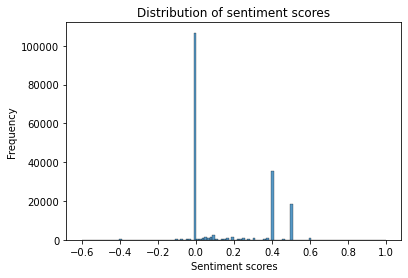

In [35]:
# Calculate sentiment scores
df['Sentiment_Scores'] = df['Processed_QuestionText'].apply(lambda x: TextBlob(x).sentiment.polarity)

print(df['Sentiment_Scores'].describe())

sns.histplot(df['Sentiment_Scores'])
plt.title('Distribution of sentiment scores')
plt.ylabel('Frequency')
plt.xlabel('Sentiment scores')
plt.show()

In [12]:
def sentiment_analyzer(score):
    """
    Classify sentiment based on a score.

    Parameters
    ----------
    score : float
        The sentiment score to classify.

    Returns
    -------
    str
        The sentiment label.
    """

    if score > 0.049889:
        return 'positive'
    
    elif score < 0.049889:
        return 'negative'
    
    else:
        return 'neutral'



df['Sentiments'] = df['Sentiment_Scores'].apply(sentiment_analyzer)

In [17]:
df['Sentiments'].value_counts()


negative    110964
positive     70005
Name: Sentiments, dtype: int64

# Aspect-Based sentiment Analysis Metrics
<h5>Summary statistics and metrics</h5>


In [20]:
# Sentiment Analysis Metrics
sentiment_counts = df['Sentiments'].value_counts()

# Descriptive Statistics
course_name = df['CourseName'].describe()
participant_response = df['ParticipantResponse'].describe()

# Categorical Metrics
course_code_counts = df['CourseCode'].value_counts()
department_counts = df['StudentProgram'].value_counts()
sentiment_distribution = df.groupby('CourseCode')['Sentiments'].value_counts(normalize=True)

# Print the calculated metrics
print("Sentiment Analysis Metrics:")
print(sentiment_counts)
print("\nDescriptive Statistics - Course Name:")
print(course_name)
print("\nDescriptive Statistics - Participant Response:")
print(participant_response)
print("\nCategorical Metrics - Course Code Counts:")
print(course_code_counts)
print("\nCategorical Metrics - Student Program Counts:")
print(department_counts)
print("\nSentiment Distribution by Course Code:")
print(sentiment_distribution)

Sentiment Analysis Metrics:
negative    110964
positive     70005
Name: Sentiments, dtype: int64

Descriptive Statistics - Course Name:
count                              180969
unique                                533
top       Innovation and Entrepreneurship
freq                                 4282
Name: CourseName, dtype: object

Descriptive Statistics - Participant Response:
count             168848
unique              1890
top       Strongly Agree
freq               88689
Name: ParticipantResponse, dtype: object

Categorical Metrics - Course Code Counts:
INV 200       4232
ASC 207       4176
ASC 208       3631
ARLAA 100     3320
INTERN 101    3067
              ... 
MAD 500         10
FSD 301         10
MSS 630          6
KMI 700          6
FAD 215          5
Name: CourseCode, Length: 634, dtype: int64

Categorical Metrics - Student Program Counts:
Bachelor of Business Administration                         55104
Bachelor of Arts in Media and Mass Communication            21140


# Topic Modeling
Implementing the topic modeling technique, Latent Dirichlet Allocation (LDA) to identify underlying topics or themes in the feedback data. This can provide deeper insights into the content and help analyze sentiment within specific topics.

In [25]:
# Create a CountVectorizer
vectorizer = CountVectorizer(max_features=1000, lowercase=True, stop_words=nltk.corpus.stopwords.words(['english','arabic']), ngram_range=(1, 2))

# Apply CountVectorizer to the processed feedback text
dtm = vectorizer.fit_transform(df['Processed_QuestionText'])

# Perform LDA topic modeling
num_topics = 10  # Specify the desired number of topics
lda = LatentDirichletAllocation(n_components=num_topics, random_state=42)
lda.fit(dtm)

# Get the top words for each topic
feature_names = vectorizer.get_feature_names()
top_words = 10  # Specify the number of top words to retrieve for each topic
for topic_idx, topic in enumerate(lda.components_):
    print(f"Topic {topic_idx}:")
    print(" ".join([feature_names[i] for i in topic.argsort()[:-top_words - 1:-1]]))
    print()

Topic 0:
experience recommendation improve suggestion learning learning experience course could aue experience aue

Topic 1:
material learning available course course learning portal material available learning material available portal المهنة

Topic 2:
faculty resource discussed discussed course textbook us enhance course additional semester

Topic 3:
study relevant course program course relevant program study relevant program conducting research conducting research

Topic 4:
business problem system concept apply identify information various medium discus

Topic 5:
skill writing identify islamic demonstrate fundamental academic explain innovation develop

Topic 6:
القانونية يحلل يقيم القواعد القضايا العامة القضائية يحدد يكون والأحكام القضائية

Topic 7:
international analyze issue evaluate define theory law development concept security

Topic 8:
apply design analyze different management technique organizational project demonstrate model

Topic 9:
assignment challenging assignment cours

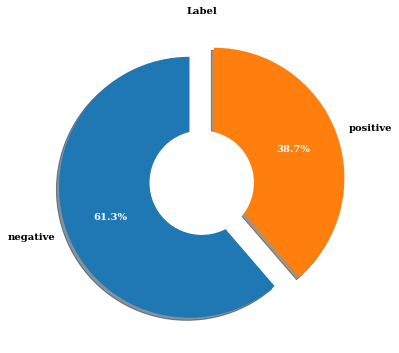

In [28]:
label_data = df['Sentiments'].value_counts()
# explode = (0.1, 0.1, 0.1)
explode = (0.1, 0.1)
plt.figure(figsize=(8, 6))
patches, texts, pcts = plt.pie(label_data,labels = label_data.index,pctdistance = 0.65,shadow = True,startangle = 90,explode = explode,
                               autopct = '%1.1f%%',textprops={ 'fontsize': 10,'color': 'black','weight': 'bold','family': 'serif' })
plt.setp(pcts, color='white')
hfont = {'fontname':'serif', 'weight': 'bold'}
plt.title('Label', size=10, **hfont)
centre_circle = plt.Circle((0,0),0.40,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.show()

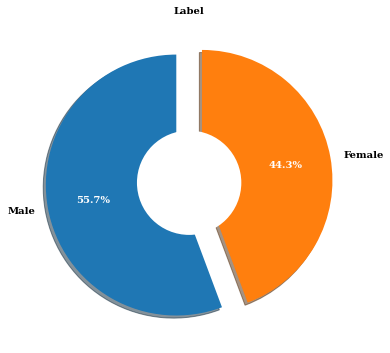

In [29]:
label_data = df['Gender'].value_counts()
explode = (0.1, 0.1)
plt.figure(figsize=(8, 6))
patches, texts, pcts = plt.pie(label_data,labels = label_data.index,pctdistance = 0.65,shadow = True,startangle = 90,explode = explode,
                               autopct = '%1.1f%%',textprops={ 'fontsize': 10,'color': 'black','weight': 'bold','family': 'serif' })
plt.setp(pcts, color='white')
hfont = {'fontname':'serif', 'weight': 'bold'}
plt.title('Label', size=10, **hfont)
centre_circle = plt.Circle((0,0),0.40,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.show()

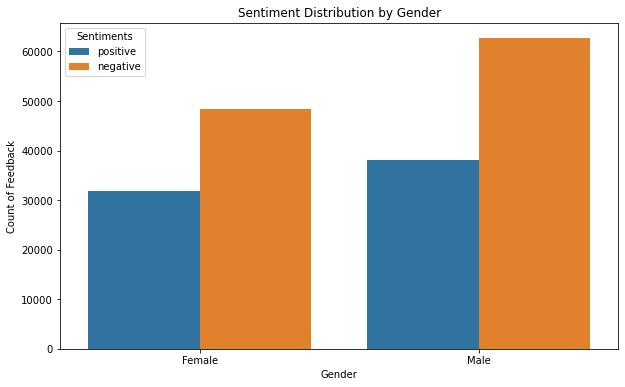

In [34]:
# Sentiment Distribution by Gender
plt.figure(figsize=(10, 6))
# hue_order = ['positive', 'neutral', 'negative']
hue_order = ['positive', 'negative']
sns.countplot(data=df, x='Gender', hue='Sentiments', hue_order=hue_order)
plt.xlabel('Gender')
plt.ylabel('Count of Feedback')
plt.title('Sentiment Distribution by Gender')
plt.show()